# Daniel Vallejo Aldana 
## Método de gradiente descendente 
### Optimización 1

In [1]:
#Inicio: Necesitamos numpy y la librería de algebra lineal para los productos punto y las normas 
import numpy as np 
from numpy import linalg as la

#Instucciones: Dar click en run all y proporcionar los valores solicitados por el algoritmo (Tamaños de paso)

# Funciones principales para la tarea

In [21]:
#Gradiente descendente con tamaño de paso fijo
def gradientdescent_fixedstep(x0,mxitr,tolgrad,tolf,tolx,tf,gf,stepsize): #Función de descenso de gradiente para punto fijo en el caso de un vector de R^2
    iterations=0
    g=gf(x0)
    difrelx=1e10
    difrelf=1e10
    #lista=list()
    puntoiter=x0
    while la.norm(g)>=tolgrad and iterations<mxitr and abs(difrelx)>tolx and abs(difrelf)>tolf: #el while acaba cuando alguna de las condiciones se cumple 
        #lista.append(puntoiter)
        new=puntoiter-stepsize*g
        g=gf(new)
        dif=new-puntoiter
        dif2=tf(new)-tf(puntoiter)
        difrelx=la.norm(dif)*(1/max(np.array([1,la.norm(puntoiter)])))
        difrelf=la.norm(dif2)*(1/max(np.array([1,la.norm(tf(puntoiter))])))
        puntoiter=new
        iterations=iterations+1
        print(iterations,'&', la.norm(dif),'&', la.norm(g),'&', tf(puntoiter))
    return np.array([puntoiter,tf(puntoiter)]) #,lista 

#Gradiente descendente con backtracking
def backtracking_direction(x,a,p,c,g,tf): #Veremos si el alpha satisface la condción de Armijo para el suficiente descenso
    alpha=a
    while tf(x-alpha*g)> tf(x)-c*alpha*np.dot(g.T,g):
        alpha=p*alpha
    return alpha #Este es el alpha óptimo 

def gradientdescent_backtracking(x0,mxitr,tolgrad,tolf,tolx,tf,gf): #Descenso de gradiente con backtracking
    #lista=list()
    iterations=0
    g=gf(x0)
    difrelx=1e10
    difrelf=1e10
    puntoiter=x0
    while la.norm(g)>=tolgrad and iterations<mxitr and abs(difrelx)>=tolx and abs(difrelf)>=tolf:
        stepsize=backtracking_direction(puntoiter,1,0.5,0.5,g,tf)
        #lista.append(puntoiter)
        new=puntoiter-stepsize*g
        g=gf(new)
        dif=new-puntoiter
        dif2=tf(new)-tf(puntoiter)
        difrelx=la.norm(dif)*(1/max(np.array([1,la.norm(puntoiter)])))
        difrelf=la.norm(dif2)*(1/max(np.array([1,la.norm(tf(puntoiter))])))
        puntoiter=new
        iterations=iterations+1
        print(iterations,'&', la.norm(dif),'&', la.norm(g),'&', tf(puntoiter))
    return np.array([puntoiter,tf(puntoiter)]) #,lista   

#Gradiente descendente con aprximación de alpha
def hessian_not_available_aprox(aprox,x,tf,g):
    c1=np.dot(g.T,g)*aprox**2
    c2=2*(tf(x-aprox*g)-tf(x)+aprox*np.dot(g.T,g))
    alpha=c1*(1/(c2+1e-100)) #Este pequeño epsilon es para evitar divisiones por cero cuando c2 sea cercano a 0 o 0
    return alpha

def gradientdescent_hessian(x0,mxitr,tolgrad,tolf,tolx,tf,gf): #Descenso de gradiente con aproximación del hessiano cuya condición inicial es dada con backtracking
    iterations=0
    #lista=list() esto es para la lista de puntos
    #Procedemos por aproximación del hessiano
    g=gf(x0)
    difrelx=1e10
    difrelf=1e10
    puntoiter=x0
    stepsize=backtracking_direction(puntoiter,1,0.5,0.5,g,tf) #esto nos va a dar el primer aproximado del ak
    while la.norm(g)>tolgrad and iterations<mxitr and abs(difrelx)>tolx and abs(difrelf)>tolf:
        stepsize=hessian_not_available_aprox(stepsize,puntoiter,tf,g)
        #lista.append(puntoiter)
        new=puntoiter-stepsize*g
        g=gf(new)
        dif=new-puntoiter
        dif2=tf(new)-tf(puntoiter)
        difrelx=la.norm(dif)*(1/max(np.array([1,la.norm(puntoiter)])))
        difrelf=la.norm(dif2)*(1/max(np.array([1,la.norm(tf(puntoiter))])))
        puntoiter=new
        iterations=iterations+1
        print(iterations,'&', la.norm(dif),'&', la.norm(g),'&', tf(puntoiter))
    return np.array([puntoiter,tf(puntoiter)]) #, lista 

def gradientdescent(x0,mxitr,tolgrad,tolf,tolx,tf,grad,args): #Función de descenso de gradiente que junta las otras 3 funciones 
    #Paso fijo
    if (args=='StepFijo' or args=='stepfijo' or args=='Stepfijo'):
        print('Tamano de paso')
        paso=float(input())
        resultado=gradientdescent_fixedstep(x0,mxitr,tolgrad,tolf,tolx,tf,grad,paso)
    #Backtracking
    elif args=='backtracking' or args=='Backtracking':
        resultado=gradientdescent_backtracking(x0,mxitr,tolgrad,tolf,tolx,tf,grad)
    #Aproximación por hessiano
    elif args=='StepHess' or args=='hessiano':
        resultado=gradientdescent_hessian(x0,mxitr,tolgrad,tolf,tolx,tf,grad)
    return resultado        

# Caso 1 Rosembrock n=2

In [27]:
 #Definimos las funciones que vamos a utilizar en este caso
def f(datos): #Función objetivo o target function
    x,y=datos
    return 100*(y-x**2)**2+(1-x)**2

def gradiente_f(datos): #gradiente de la función f
    g=np.zeros(len(datos))
    g[0]=2*(200*datos[0]**3-200*datos[0]*datos[1]+datos[0]-1)
    g[1]=200*(datos[1]-datos[0]**2)
    return g

#NOTA: El Hessiano lo evitamos utilizando la aproximación de las diapositivas, de esta forma
#NO va a pasar como parámetro a ninguna de nuestras funciones aquí mostradas 

prueba2=np.array([5,4]) #este es el nuevo conjunto de puntos de prueba

In [33]:
res=gradientdescent(np.array([-1.2,1]),18000,1e-14,1e-14,1e-14,f,gradiente_f,'StepFijo')
print(res)
#resproof=gradientdescent(prueba2,18000,1e-14,1e-14,1e-14,f,gradiente_f,'StepFijo')
#print(resproof)

Tamano de paso
1e-3
1 & 0.2328676877542266 & 49.03058747211632 & 5.352911580008958
2 & 0.049030587472116305 & 1.826163174050757 & 4.117789857067972
3 & 0.0018261631740506975 & 1.7747378177931528 & 4.114552150338376
4 & 0.001774737817793182 & 1.7750471647235997 & 4.111402274582486
5 & 0.001775047164723674 & 1.7754530868995324 & 4.108251122273362
6 & 0.0017754530868996042 & 1.7758599889840305 & 4.105098527498395
7 & 0.0017758599889840742 & 1.7762675703612079 & 4.101944487005585
8 & 0.0017762675703612188 & 1.7766758376858645 & 4.098788998039624
9 & 0.0017766758376858425 & 1.7770847925981 & 4.095632057829184
10 & 0.0017770847925981386 & 1.7774944369579317 & 4.092473663595008
11 & 0.0017774944369578737 & 1.777904772623621 & 4.089313812549566
12 & 0.0017779047726235926 & 1.7783158014598266 & 4.086152501897004
13 & 0.0017783158014598416 & 1.778727525337992 & 4.0829897288331285
14 & 0.0017787275253379597 & 1.7791399461359116 & 4.0798254905453755
15 & 0.0017791399461358352 & 1.779553065737747 &

300 & 0.0019346085866613384 & 1.9353293060393792 & 3.100601296485968
301 & 0.0019353293060393466 & 1.9360516045016902 & 3.0968550983612224
302 & 0.0019360516045016996 & 1.9367754861418334 & 3.0931061021520962
303 & 0.001936775486141843 & 1.9375009550499602 & 3.0893543006769697
304 & 0.0019375009550499345 & 1.938228015312387 & 3.0855996867314945
305 & 0.0019382280153123856 & 1.9389566710113892 & 3.0818422530885634
306 & 0.001938956671011412 & 1.9396869262247804 & 3.078081992498294
307 & 0.0019396869262247867 & 1.9404187850255525 & 3.074318897688003
308 & 0.0019404187850255768 & 1.9411522514813802 & 3.0705529613621887
309 & 0.0019411522514813993 & 1.941887329654495 & 3.0667841762025105
310 & 0.0019418873296544949 & 1.9426240236010892 & 3.0630125348677715
311 & 0.0019426240236010773 & 1.943362337370933 & 3.059238029993905
312 & 0.0019433623373709113 & 1.9441022750071013 & 3.055460654193957
313 & 0.001944102275007095 & 1.9448438405453723 & 3.051680400058076
314 & 0.0019448438405453288 & 1.

667 & 0.0022333164145950605 & 2.2329155262449554 & 1.4826122280688097
668 & 0.002232915526244964 & 2.232486645247245 & 1.4776267944709671
669 & 0.002232486645247253 & 2.232029445973404 & 1.4726433074940437
670 & 0.0022320294459734053 & 2.231543603986776 & 1.4676618935285786
671 & 0.0022315436039867667 & 2.231028796213231 & 1.4626826803323927
672 & 0.002231028796213223 & 2.230484701115365 & 1.4577057970181226
673 & 0.002230484701115374 & 2.2299109988701704 & 1.4527313740397958
674 & 0.00222991099887017 & 2.2293073715501195 & 1.447759543178429
675 & 0.0022293073715501112 & 2.2286735033075518 & 1.4427904375266396
676 & 0.0022286735033075463 & 2.2280090805622814 & 1.4378241914722478
677 & 0.002228009080562285 & 2.227313792192326 & 1.4328609406808697
678 & 0.002227313792192335 & 2.2265873297276384 & 1.4279008220774752
679 & 0.002226587329727632 & 2.2258293875467317 & 1.422943973826909
680 & 0.0022258293875467325 & 2.2250396630760543 & 1.417990535313358
681 & 0.00222503966307606 & 2.22421785

1032 & 0.0010515022768466113 & 1.0492573630214763 & 0.4156832178309447
1033 & 0.0010492573630214808 & 1.0470213514229196 & 0.41458345037248645
1034 & 0.0010470213514229 & 1.044794195784562 & 0.4134883630774657
1035 & 0.0010447941957845513 & 1.0425758500453626 & 0.4123979274948773
1036 & 0.001042575850045384 & 1.040366268350804 & 0.411312115387672
1037 & 0.0010403662683507828 & 1.0381654050538751 & 0.4102308987310451
1038 & 0.0010381654050538901 & 1.0359732147160459 & 0.4091542497107346
1039 & 0.0010359732147160643 & 1.0337896521081602 & 0.40808214072133137
1040 & 0.001033789652108145 & 1.0316146722112516 & 0.40701454436459844
1041 & 0.0010316146722112608 & 1.0294482302173247 & 0.40595143344780177
1042 & 0.0010294482302173513 & 1.0272902815300253 & 0.40489278098205245
1043 & 0.0010272902815300334 & 1.0251407817653193 & 0.4038385601806584
1044 & 0.0010251407817653377 & 1.0229996867520696 & 0.40278874445748764
1045 & 0.0010229996867520594 & 1.0208669525325436 & 0.4017433074253431
1046 & 0

1362 & 0.0006084475558506612 & 0.6076494456106737 & 0.20404289777657633
1363 & 0.0006076494456106489 & 0.6068532713408414 & 0.2036739018743825
1364 & 0.0006068532713408332 & 0.6060590257696534 & 0.20330587202556621
1365 & 0.0006060590257696391 & 0.6052667016620438 & 0.2029388046290277
1366 & 0.000605266701662079 & 0.6044762918191435 & 0.20257269610158865
1367 & 0.0006044762918191413 & 0.6036877890780527 & 0.20220754287788065
1368 & 0.0006036877890780477 & 0.6029011863115625 & 0.2018433414102342
1369 & 0.0006029011863115722 & 0.6021164764280847 & 0.20148008816856905
1370 & 0.0006021164764281185 & 0.6013336523713 & 0.20111777964028477
1371 & 0.000601333652371297 & 0.6005527071199601 & 0.2007564123301526
1372 & 0.000600552707119972 & 0.5997736336877536 & 0.2003959827602078
1373 & 0.0005997736336877668 & 0.5989964251230332 & 0.20003648746964306
1374 & 0.0005989964251230221 & 0.5982210745085844 & 0.19967792301470222
1375 & 0.0005982210745086171 & 0.5974475749615015 & 0.19932028596857548
137

1689 & 0.00042083980365631077 & 0.4204265114105849 & 0.12005235387435298
1690 & 0.000420426511410621 & 0.42001391448546604 & 0.11987568216684194
1691 & 0.0004200139144854633 & 0.4196020110636841 & 0.1196993569916653
1692 & 0.0004196020110636471 & 0.4191907993345343 & 0.11952337742716913
1693 & 0.00041919079933454495 & 0.41878027749365576 & 0.11934774255492793
1694 & 0.00041878027749370634 & 0.41837044374328175 & 0.11917245145973052
1695 & 0.0004183704437432794 & 0.41796129629190854 & 0.11899750322956576
1696 & 0.000417961296291888 & 0.4175528333544933 & 0.11882289695560852
1697 & 0.00041755283335453877 & 0.4171450531523536 & 0.1186486317322057
1698 & 0.00041714505315236977 & 0.41673795391301416 & 0.11847470665686226
1699 & 0.0004167379539129996 & 0.4163315338704396 & 0.11830112083022744
1700 & 0.0004163315338704592 & 0.41592579126478413 & 0.11812787335608085
1701 & 0.0004159257912647537 & 0.4155207243424558 & 0.11795496334131896
1702 & 0.0004155207243424671 & 0.4151163313560467 & 0.117

2072 & 0.00030080390315917043 & 0.30056606613552567 & 0.07131088979654857
2073 & 0.00030056606613554593 & 0.3003285257145062 & 0.07122058553753341
2074 & 0.0003003285257145187 & 0.30009128133241664 & 0.07113042394259683
2075 & 0.00030009128133235915 & 0.2998543324266817 & 0.07104040472140043
2076 & 0.0002998543324266588 & 0.29961767843645404 & 0.07095052758436395
2077 & 0.0002996176784365101 & 0.29938131880221164 & 0.07086079224266267
2078 & 0.00029938131880220093 & 0.299145252965868 & 0.07077119840822511
2079 & 0.00029914525296588973 & 0.29890948037090387 & 0.07068174579373043
2080 & 0.00029890948037096185 & 0.29867400046218506 & 0.07059243411260603
2081 & 0.00029867400046217665 & 0.2984388126860286 & 0.07050326307902519
2082 & 0.00029843881268604107 & 0.29820391649022077 & 0.07041423240790458
2083 & 0.00029820391649019496 & 0.29796931132394 & 0.0703253418149018
2084 & 0.0002979693113239562 & 0.2977349966378065 & 0.0702365910164131
2085 & 0.0002977349966378366 & 0.29750097188391655 & 

2419 & 0.00023290032909123129 & 0.23273946771294393 & 0.0469031146619587
2420 & 0.00023273946771295553 & 0.23257877079140252 & 0.04684896570344271
2421 & 0.00023257877079138807 & 0.23241823807631898 & 0.046794891488125274
2422 & 0.00023241823807637846 & 0.23225786931795028 & 0.04674089188809881
2423 & 0.00023225786931799846 & 0.23209766426693318 & 0.04668696677572976
2424 & 0.00023209766426687426 & 0.23193762267461915 & 0.04663311602365798
2425 & 0.00023193762267462897 & 0.2317777442927156 & 0.04657933950479572
2426 & 0.00023177774429275865 & 0.23161802887352984 & 0.046525637092327196
2427 & 0.00023161802887355196 & 0.23145847616993065 & 0.046472008659707714
2428 & 0.000231458476169919 & 0.2312990859351467 & 0.046418454080662995
2429 & 0.00023129908593515428 & 0.23113985792307987 & 0.04636497322918845
2430 & 0.000231139857923071 & 0.23098079188808918 & 0.04631156597954855
2431 & 0.00023098079188809567 & 0.23082188758502323 & 0.046258232206275965
2432 & 0.00023082188758499612 & 0.230663

2787 & 0.0001830766078260517 & 0.18296283124602752 & 0.03114255333698629
2788 & 0.00018296283124605623 & 0.18284915353605308 & 0.03110908833920286
2789 & 0.00018284915353600583 & 0.18273557457172188 & 0.031075664910598096
2790 & 0.00018273557457172953 & 0.18262209422887762 & 0.031042282989266222
2791 & 0.00018262209422881666 & 0.18250871238359523 & 0.03100894251341409
2792 & 0.00018250871238362882 & 0.18239542891206711 & 0.030975643421360832
2793 & 0.00018239542891211315 & 0.18228224369078772 & 0.03094238565153773
2794 & 0.00018228224369074155 & 0.18216915659642122 & 0.030909169142487897
2795 & 0.0001821691565964111 & 0.18205616750594375 & 0.03087599383286602
2796 & 0.00018205616750597124 & 0.18194327629636597 & 0.03084285966143808
2797 & 0.0001819432762963917 & 0.18183048284499997 & 0.03080976656708123
2798 & 0.00018183048284499433 & 0.18171778702946517 & 0.030776714488783496
2799 & 0.00018171778702945105 & 0.18160518872738754 & 0.030743703365643422
2800 & 0.000181605188727364 & 0.181

3116 & 0.00015033716070643008 & 0.15025026974932615 & 0.02205856740490134
3117 & 0.00015025026974927673 & 0.15016344603672352 & 0.022035998784200577
3118 & 0.00015016344603674525 & 0.15007668949517244 & 0.02201345623772101
3119 & 0.00015007668949520067 & 0.14999000005134194 & 0.021990939730238527
3120 & 0.00014999000005138714 & 0.14990337763212175 & 0.021968449226586004
3121 & 0.00014990337763213127 & 0.14981682216432515 & 0.02194598469165308
3122 & 0.00014981682216433503 & 0.1497303335750386 & 0.021923546090386145
3123 & 0.00014973033357498287 & 0.14964391179135336 & 0.021901133387788152
3124 & 0.00014964391179138228 & 0.14955755674054258 & 0.021878746548918533
3125 & 0.00014955755674050011 & 0.14947126834997518 & 0.021856385538893162
3126 & 0.0001494712683499372 & 0.14938504654702447 & 0.02183405032288407
3127 & 0.0001493850465470098 & 0.14929889125932214 & 0.021811740866119565
3128 & 0.0001492988912592848 & 0.14921280241448992 & 0.021789457133883944
3129 & 0.00014921280241446045 & 0

3445 & 0.00012499313174304491 & 0.12492495912471199 & 0.015857416606762112
3446 & 0.00012492495912472384 & 0.1248568344661493 & 0.015841814616698247
3447 & 0.00012485683446613797 & 0.12478875772093068 & 0.01582622963762193
3448 & 0.00012478875772091355 & 0.12472072884280783 & 0.01581066164830092
3449 & 0.00012472072884280172 & 0.12465274778547256 & 0.015795110627534057
3450 & 0.00012465274778543047 & 0.12458481450273014 & 0.015779576554151273
3451 & 0.0001245848145026778 & 0.12451692894850831 & 0.015764059407013472
3452 & 0.0001245169289485322 & 0.12444909107669101 & 0.015748559165012513
3453 & 0.00012444909107662625 & 0.12438130084125654 & 0.015733075807071166
3454 & 0.00012438130084129528 & 0.12431355819627692 & 0.015717609312143
3455 & 0.000124313558196243 & 0.12424586309582077 & 0.015702159659212445
3456 & 0.0001242458630958351 & 0.12417821549407261 & 0.015686726827294585
3457 & 0.00012417821549405277 & 0.12411061534528285 & 0.01567131079543524
3458 & 0.00012411061534530566 & 0.124

3787 & 0.00010419873998899461 & 0.10414461648142892 & 0.01138873789080449
3788 & 0.00010414461648144162 & 0.1040905280403516 & 0.01137789460623325
3789 & 0.00010409052804033013 & 0.1040364746353069 & 0.011367062581490008
3790 & 0.00010403647463534848 & 0.10398245623605792 & 0.011356241803438005
3791 & 0.00010398245623605934 & 0.10392847281215198 & 0.011345432258958154
3792 & 0.0001039284728122176 & 0.10387452433336486 & 0.011334633934949018
3793 & 0.00010387452433339607 & 0.10382061076930447 & 0.011323846818326756
3794 & 0.00010382061076933049 & 0.1037667320899202 & 0.011313070896025148
3795 & 0.0001037667320899082 & 0.10371288826486293 & 0.011302306154995521
3796 & 0.00010371288826483228 & 0.10365907926401481 & 0.011291552582206722
3797 & 0.00010365907926400246 & 0.10360530505728072 & 0.011280810164645131
3798 & 0.0001036053050573394 & 0.10355156561451652 & 0.01127007888931458
3799 & 0.00010355156561452756 & 0.10349786090569257 & 0.011259358743236376
3800 & 0.00010349786090565098 & 0.

4151 & 8.659504660378663e-05 & 0.08655192670510801 & 0.00809236580015665
4152 & 8.655192670509277e-05 & 0.08650883278018444 & 0.00808487642910409
4153 & 8.650883278023726e-05 & 0.08646576480860547 & 0.008077394513867707
4154 & 8.646576480856055e-05 & 0.0864227227700401 & 0.008069920046247755
4155 & 8.642272277008492e-05 & 0.08637970664409213 & 0.008062453018054654
4156 & 8.637970664409794e-05 & 0.08633671641053027 & 0.008054993421109087
4157 & 8.63367164105251e-05 & 0.08629375204900722 & 0.008047541247241911
4158 & 8.62937520489466e-05 & 0.08625081353926664 & 0.008040096488294145
4159 & 8.625081353925373e-05 & 0.08620790086106445 & 0.008032659136116975
4160 & 8.620790086112463e-05 & 0.08616501399414205 & 0.008025229182571744
4161 & 8.616501399418435e-05 & 0.08612215291837493 & 0.008017806619529937
4162 & 8.612215291837828e-05 & 0.08607931761345951 & 0.00801039143887314
4163 & 8.607931761347343e-05 & 0.08603650805932395 & 0.008002983632493047
4164 & 8.603650805932761e-05 & 0.08599372423

4522 & 7.2223241692596e-05 & 0.0721885188075958 & 0.005763494018569815
4523 & 7.218851880763838e-05 & 0.07215381558408424 & 0.0057582840889272855
4524 & 7.215381558409588e-05 & 0.07211913200794948 & 0.0057530791671180385
4525 & 7.211913200798646e-05 & 0.07208446806511261 & 0.005747879247901091
4526 & 7.208446806507229e-05 & 0.07204982374142793 & 0.005742684326041551
4527 & 7.204982374142432e-05 & 0.07201519902286772 & 0.005737494396310653
4528 & 7.201519902290269e-05 & 0.0719805938953346 & 0.0057323094534857365
4529 & 7.198059389538317e-05 & 0.071946008344744 & 0.005727129492350224
4530 & 7.194600834472619e-05 & 0.07191144235716233 & 0.005721954507693655
4531 & 7.191144235710861e-05 & 0.07187689591841073 & 0.005716784494311617
4532 & 7.187689591838336e-05 & 0.07184236901459465 & 0.005711619447005782
4533 & 7.184236901457715e-05 & 0.07180786163166 & 0.005706459360583898
4534 & 7.180786163165635e-05 & 0.07177337375559832 & 0.005701304229859741
4535 & 7.177337375554247e-05 & 0.07173890537

4859 & 6.155199343835596e-05 & 0.06152317319959854 & 0.004261104390063389
4860 & 6.152317319957438e-05 & 0.0614943685249845 & 0.004257320175310995
4861 & 6.14943685249935e-05 & 0.061465579404058376 & 0.004253539503145755
4862 & 6.146557940410707e-05 & 0.061436805826408515 & 0.004249762369997214
4863 & 6.143680582636989e-05 & 0.061408047781607585 & 0.004245988772298885
4864 & 6.140804778162863e-05 & 0.061379305259294734 & 0.004242218706488222
4865 & 6.137930525928592e-05 & 0.06135057824902046 & 0.004238452169006653
4866 & 6.135057824908399e-05 & 0.0613218667404698 & 0.004234689156299552
4867 & 6.13218667405302e-05 & 0.06129317072323889 & 0.004230929664816228
4868 & 6.129317072322328e-05 & 0.06126449018700817 & 0.004227173691009958
4869 & 6.12644901870102e-05 & 0.061235825121373086 & 0.004223421231337911
4870 & 6.12358251213397e-05 & 0.06120717551604025 & 0.004219672282261231
4871 & 6.120717551606543e-05 & 0.0611785413606416 & 0.004215926840244952
4872 & 6.117854136063621e-05 & 0.0611499

5109 & 5.4805906515821956e-05 & 0.054780674595954926 & 0.003416720333016978
5110 & 5.478067459591286e-05 & 0.0547554558913863 & 0.0034137201014639447
5111 & 5.4755455891411244e-05 & 0.05473025039365049 & 0.003410722631590643
5112 & 5.473025039366753e-05 & 0.05470505809427818 & 0.0034077279206802254
5113 & 5.470505809424591e-05 & 0.05467987898483122 & 0.0034047359660187458
5114 & 5.467987898480871e-05 & 0.05465471305689418 & 0.003401746764895186
5115 & 5.465471305686239e-05 & 0.054629560302078814 & 0.003398760314601426
5116 & 5.46295603021272e-05 & 0.054604420711910226 & 0.00339577661243227
5117 & 5.460442071190181e-05 & 0.054579294278003954 & 0.0033927956556854193
5118 & 5.4579294278056594e-05 & 0.05455418099198823 & 0.0033898174416614863
5119 & 5.4554180991948154e-05 & 0.05452908084546532 & 0.003386841967663982
5120 & 5.452908084548725e-05 & 0.05450399383003491 & 0.003383869230999294
5121 & 5.4503993830036384e-05 & 0.054478919937307045 & 0.003380899228976729
5122 & 5.4478919937252415e

5421 & 4.75348583751197e-05 & 0.04751337177165049 & 0.002602066036891366
5422 & 4.7513371771701786e-05 & 0.04749189604969249 & 0.002599809026590877
5423 & 4.7491896049695824e-05 & 0.0474704312027324 & 0.0025975540561082606
5424 & 4.747043120272933e-05 & 0.04744897722409332 & 0.002595301123489129
5425 & 4.74489772240632e-05 & 0.047427534107202636 & 0.0025930502267811247
5426 & 4.742753410721162e-05 & 0.04740610184546483 & 0.002590801364033915
5427 & 4.740610184544562e-05 & 0.047384680432327145 & 0.0025885545332991933
5428 & 4.738468043228445e-05 & 0.04736326986116686 & 0.002586309732630665
5429 & 4.736326986119072e-05 & 0.04734187012547821 & 0.002584066960084046
5430 & 4.734187012548217e-05 & 0.04732048121865247 & 0.0025818262137170876
5431 & 4.732048121867812e-05 & 0.047299103134117476 & 0.0025795874915895333
5432 & 4.7299103134142986e-05 & 0.04727773586529183 & 0.0025773507917631424
5433 & 4.727773586529286e-05 & 0.04725637940571633 & 0.0025751161123016967
5434 & 4.725637940575045e-05

5728 & 4.1419791797653815e-05 & 0.04140135817946089 & 0.0019963306359203725
5729 & 4.1401358179410426e-05 & 0.041382933631781305 & 0.001994616944864921
5730 & 4.1382933631780276e-05 & 0.041364518149256284 & 0.0019929047787152886
5731 & 4.1364518149277356e-05 & 0.04134611172673268 & 0.001991194136042956
5732 & 4.134611172672836e-05 & 0.04132771435888809 & 0.001989485015420838
5733 & 4.132771435889117e-05 & 0.041309326040522426 & 0.0019877774154232744
5734 & 4.130932604054114e-05 & 0.041290946766352025 & 0.0019860713346260407
5735 & 4.1290946766397864e-05 & 0.041272576531187884 & 0.0019843667716063517
5736 & 4.127257653117663e-05 & 0.04125421532980473 & 0.001982663724942843
5737 & 4.125421532974687e-05 & 0.04123586315690738 & 0.0019809621932155813
5738 & 4.123586315692666e-05 & 0.04121752000731521 & 0.0019792621750060516
5739 & 4.1217520007337255e-05 & 0.04119918587576471 & 0.0019775636688971684
5740 & 4.119918587574539e-05 & 0.04118086075709378 & 0.001975866673473281
5741 & 4.1180860757

5981 & 3.7031818812838027e-05 & 0.037015522011739785 & 0.0016077945292704823
5982 & 3.7015522011675196e-05 & 0.03699923306333025 & 0.0016064246818747502
5983 & 3.699923306334674e-05 & 0.03698295196324092 & 0.0016050560398236866
5984 & 3.698295196326912e-05 & 0.03696667870711568 & 0.0016036886020063933
5985 & 3.696667870706747e-05 & 0.03695041329052868 & 0.0016023223673130719
5986 & 3.695041329055232e-05 & 0.03693415570901026 & 0.0016009573346350025
5987 & 3.6934155708947e-05 & 0.036917905958309426 & 0.0015995935028645697
5988 & 3.6917905958270736e-05 & 0.03690166403396098 & 0.0015982308708952322
5989 & 3.690166403393616e-05 & 0.036885429931593716 & 0.0015968694376215396
5990 & 3.688542993156844e-05 & 0.036869203646832126 & 0.001595509201939128
5991 & 3.686920364678115e-05 & 0.03685298517533571 & 0.0015941501627447221
5992 & 3.685298517539651e-05 & 0.03683677451268085 & 0.001592792318936118
5993 & 3.6836774512630176e-05 & 0.03682057165456429 & 0.0015914356694122116
5994 & 3.682057165455

6274 & 3.2575395952279996e-05 & 0.032561223663533374 & 0.0012536910107906697
6275 & 3.2561223663478115e-05 & 0.03254705805814037 & 0.0012526310081303349
6276 & 3.254705805817437e-05 & 0.03253289913260839 & 0.001251571927559185
6277 & 3.253289913263841e-05 & 0.03251874688327763 & 0.001250513768241466
6278 & 3.25187468832861e-05 & 0.032504601306581296 & 0.0012494565293422234
6279 & 3.250460130663533e-05 & 0.032490462398810836 & 0.0012484002100273007
6280 & 3.249046239880275e-05 & 0.03247633015653369 & 0.0012473448094633553
6281 & 3.247633015655787e-05 & 0.032462204576031925 & 0.0012462903268178227
6282 & 3.2462204576013975e-05 & 0.032448085653712926 & 0.001245236761258952
6283 & 3.244808565374336e-05 & 0.032433973385993485 & 0.0012441841119557903
6284 & 3.243397338595795e-05 & 0.03241986776929733 & 0.001243132378078178
6285 & 3.2419867769281036e-05 & 0.032405768800031404 & 0.0012420815587967447
6286 & 3.240576880007418e-05 & 0.0323916764745845 & 0.0012410316532829287
6287 & 3.23916764746

6590 & 2.8411688264656154e-05 & 0.028399459750343588 & 0.0009605758816595393
6591 & 2.839945975032964e-05 & 0.028387236886480403 & 0.0009597695259077117
6592 & 2.838723688647611e-05 & 0.028375019670138314 & 0.0009589638640970857
6593 & 2.8375019670108612e-05 & 0.02836280809837959 & 0.0009581588956085159
6594 & 2.836280809834478e-05 & 0.028350602168248876 & 0.000957354619823433
6595 & 2.8350602168296385e-05 & 0.028338401876771804 & 0.0009565510361238485
6596 & 2.8338401876832832e-05 & 0.028326207221034558 & 0.0009557481438923559
6597 & 2.8326207221068836e-05 & 0.028314018198086176 & 0.0009549459425121337
6598 & 2.831401819806829e-05 & 0.028301834804995138 & 0.0009541444313669278
6599 & 2.8301834805050478e-05 & 0.02828965703880767 & 0.0009533436098410688
6600 & 2.8289657038777335e-05 & 0.028277484896614958 & 0.000952543477319469
6601 & 2.8277484896614754e-05 & 0.028265318375464445 & 0.0009517440331876067
6602 & 2.8265318375480047e-05 & 0.02825315747241849 & 0.0009509452768315431
6603 & 2

6933 & 2.4530044186481795e-05 & 0.024519592235901975 & 0.0007208779935977515
6934 & 2.4519592235875626e-05 & 0.024509145022979364 & 0.0007202769112756183
6935 & 2.4509145022974497e-05 & 0.0244987025453716 & 0.0007196763410545417
6936 & 2.449870254539591e-05 & 0.02448826480060759 & 0.0007190762824843173
6937 & 2.448826480065105e-05 & 0.024477831786326343 & 0.0007184767351151592
6938 & 2.4477831786354918e-05 & 0.02446740350012342 & 0.0007178776984976957
6939 & 2.446740350012251e-05 & 0.024456979939615167 & 0.000717279172182964
6940 & 2.4456979939614467e-05 & 0.024446561102431593 & 0.0007166811557224201
6941 & 2.4446561102397648e-05 & 0.024436146986185094 & 0.0007160836486679275
6942 & 2.4436146986180847e-05 & 0.024425737588461085 & 0.0007154866505717589
6943 & 2.442573758843463e-05 & 0.024415332906927198 & 0.0007148901609866035
6944 & 2.4415332906915958e-05 & 0.024404932939158745 & 0.0007142941794655607
6945 & 2.4404932939143533e-05 & 0.024394537682824447 & 0.0007136987055621365
6946 & 2

7234 & 2.1587598098938494e-05 & 0.021578470184361733 & 0.0005611787650409011
7235 & 2.157847018436709e-05 & 0.021569346346821845 & 0.0005607132331050237
7236 & 2.1569346346879477e-05 & 0.021560226584354757 & 0.0005602480947572394
7237 & 2.15602265843394e-05 & 0.02155111089501668 & 0.0005597833496554255
7238 & 2.1551110895008224e-05 & 0.021541999276715428 & 0.0005593189974577543
7239 & 2.1541999276694817e-05 & 0.02153289172746072 & 0.000558855037822716
7240 & 2.153289172751552e-05 & 0.021523788245299103 & 0.000558391470409106
7241 & 2.152378824528138e-05 & 0.021514688828153623 & 0.0005579282948760316
7242 & 2.151468882815056e-05 & 0.021505593474068684 & 0.0005574655108829043
7243 & 2.1505593474092195e-05 & 0.021496502181069105 & 0.0005570031180894442
7244 & 2.1496502181112892e-05 & 0.02148741494708685 & 0.0005565411161556835
7245 & 2.1487414947025883e-05 & 0.02147833177015687 & 0.0005560795047419579
7246 & 2.1478331770193587e-05 & 0.02146925264830542 & 0.0005556182835089095
7247 & 2.146

7515 & 1.9175982503362537e-05 & 0.01916792527757509 & 0.0004446710203450358
7516 & 1.916792527763966e-05 & 0.019159871607082206 & 0.0004443036881719359
7517 & 1.915987160714184e-05 & 0.01915182149027679 & 0.0004439366646118078
7518 & 1.915182149028004e-05 & 0.01914377492550325 & 0.00044356994939886936
7519 & 1.9143774925515652e-05 & 0.019135731910915443 & 0.0004432035422675741
7520 & 1.9135731910904834e-05 & 0.019127692444860733 & 0.00044283744295261026
7521 & 1.9127692444912805e-05 & 0.019119656525663234 & 0.00044247165118891117
7522 & 1.9119656525698465e-05 & 0.01911162415157166 & 0.00044210616671163744
7523 & 1.9111624151573873e-05 & 0.01910359532089638 & 0.00044174098925619094
7524 & 1.910359532089769e-05 & 0.01909557003198655 & 0.0004413761185582119
7525 & 1.909557003193156e-05 & 0.019087548282997593 & 0.0004410115543535691
7526 & 1.9087548283034136e-05 & 0.01907953007234395 & 0.0004406472963783732
7527 & 1.9079530072319654e-05 & 0.01907151539831934 & 0.0004402833443689676
7528 & 

7816 & 1.6903878545199085e-05 & 0.01689681819449081 & 0.0003469171942977188
7817 & 1.6896818194503793e-05 & 0.016889760923593337 & 0.00034663175145551676
7818 & 1.6889760923533927e-05 & 0.01688270673105205 & 0.0003463465470034586
7819 & 1.688270673099918e-05 & 0.016875655615406025 & 0.000346061580738036
7820 & 1.6875655615407968e-05 & 0.016868607575193265 & 0.000345776852455919
7821 & 1.686860757516975e-05 & 0.01686156260895855 & 0.00034549236195396174
7822 & 1.6861562608994213e-05 & 0.016854520715268738 & 0.00034520810902919524
7823 & 1.6854520715290817e-05 & 0.01684748189270154 & 0.0003449240934788255
7824 & 1.6847481892670275e-05 & 0.01684044613974367 & 0.0003446403151002454
7825 & 1.6840446139786977e-05 & 0.01683341345498439 & 0.0003443567736910165
7826 & 1.683341345500506e-05 & 0.016826383836941662 & 0.00034407346904888456
7827 & 1.682638383688326e-05 & 0.016819357284231232 & 0.000343790400971777
7828 & 1.6819357284178262e-05 & 0.016812333795356744 & 0.0003435075692577901
7829 & 1

8173 & 1.4568605481920808e-05 & 0.014562557775726178 & 0.00025874453449682304
8174 & 1.4562557775750482e-05 & 0.01455651267632871 & 0.0002585325104240227
8175 & 1.455651267637071e-05 & 0.014550470182516295 & 0.0002583206623416612
8176 & 1.4550470182489762e-05 & 0.014544430293074893 & 0.00025810899010086144
8177 & 1.4544430293114379e-05 & 0.014538393006842284 & 0.00025789749355287136
8178 & 1.45383930068036e-05 & 0.014532358322560026 & 0.0002576861725490727
8179 & 1.4532358322564163e-05 & 0.01452632623911842 & 0.0002574750269409733
8180 & 1.4526326239105747e-05 & 0.014520296755184795 & 0.0002572640565802096
8181 & 1.4520296755232837e-05 & 0.014514269869672384 & 0.0002570532613185481
8182 & 1.4514269869657923e-05 & 0.014508245581348542 & 0.0002568426410078883
8183 & 1.4508245581384935e-05 & 0.014502223889000855 & 0.0002566321955002507
8184 & 1.4502223888974323e-05 & 0.01449620479141951 & 0.00025642192464778933
8185 & 1.4496204791382614e-05 & 0.014490188287440704 & 0.000256211828302787
81

8495 & 1.2749590954388593e-05 & 0.012744323675970724 & 0.0001988012247257873
8496 & 1.2744323675986223e-05 & 0.012739058646873753 & 0.00019863884048952483
8497 & 1.2739058646840506e-05 & 0.012733795866015186 & 0.00019847659039583089
8498 & 1.2733795866056113e-05 & 0.012728535332399838 & 0.00019831447433203236
8499 & 1.2728535332391615e-05 & 0.012723277044953778 & 0.0001981524921855497
8500 & 1.2723277045003028e-05 & 0.012718021002767735 & 0.00019799064384390456
8501 & 1.2718021002747983e-05 & 0.012712767204699675 & 0.00019782892919471205
8502 & 1.271276720468223e-05 & 0.01270751564983908 & 0.00019766734812568567
8503 & 1.2707515649813795e-05 & 0.01270226633709235 & 0.0001975059005246342
8504 & 1.2702266337096962e-05 & 0.01269701926548253 & 0.00019734458627946328
8505 & 1.2697019265441903e-05 & 0.01269177443398807 & 0.00019718340527817625
8506 & 1.2691774434052359e-05 & 0.012686531841520484 & 0.00019702235740887012
8507 & 1.268653184148758e-05 & 0.012681291487163562 & 0.0001968614425597

8856 & 1.09866622861157e-05 & 0.010982144423231826 & 0.0001480843654968043
8857 & 1.0982144423243736e-05 & 0.010977628472139013 & 0.0001479637827981339
8858 & 1.097762847219447e-05 & 0.010973114431984798 & 0.00014784329924803907
8859 & 1.0973114431974787e-05 & 0.010968602301826308 & 0.00014772291476381085
8860 & 1.0968602301789771e-05 & 0.010964092080934308 & 0.0001476026292628149
8861 & 1.0964092080945618e-05 & 0.010959583768376926 & 0.0001474824426624817
8862 & 1.095958376839815e-05 & 0.010955077363271858 & 0.0001473623548803166
8863 & 1.0955077363252336e-05 & 0.010950572864849129 & 0.000147242365833895
8864 & 1.0950572864865445e-05 & 0.010946070272257153 & 0.0001471224754408596
8865 & 1.0946070272242339e-05 & 0.010941569584569278 & 0.0001470026836189253
8866 & 1.0941569584538046e-05 & 0.010937070800979286 & 0.00014688299028587723
8867 & 1.0937070800959666e-05 & 0.010932573920679948 & 0.0001467633953595705
8868 & 1.093257392066223e-05 & 0.010928078942719983 & 0.00014664389875792717
8

9219 & 9.465823343572055e-06 & 0.009461946508890179 & 0.00011022043934740076
9220 & 9.46194650888498e-06 & 0.009458071301860086 & 0.00011013092924919626
9221 & 9.458071301803935e-06 & 0.009454197721694795 & 0.0001100414924547751
9222 & 9.454197721733219e-06 & 0.009450325767734523 & 0.00010995212890335509
9223 & 9.450325767728893e-06 & 0.009446455439186957 & 0.00010986283853420235
9224 & 9.446455439195255e-06 & 0.009442586735449962 & 0.00010977362128663834
9225 & 9.442586735437466e-06 & 0.009438719655657377 & 0.00010968447710003052
9226 & 9.438719655610725e-06 & 0.009434854199239123 & 0.0001095954059138039
9227 & 9.434854199268447e-06 & 0.009430990365432011 & 0.00010950640766742798
9228 & 9.430990365367565e-06 & 0.009427128153467587 & 0.00010941748230042882
9229 & 9.42712815351064e-06 & 0.009423267562717098 & 0.0001093286297523792
9230 & 9.42326756265545e-06 & 0.009419408592369689 & 0.00010923984996290746
9231 & 9.41940859240371e-06 & 0.009415551241834434 & 0.0001091511428716886
9232 & 

9579 & 8.170043189183564e-06 & 0.008166708532779789 & 8.229823034525968e-05
9580 & 8.166708532760797e-06 & 0.008163375266988284 & 8.22315488279253e-05
9581 & 8.163375267020301e-06 & 0.008160043391099174 & 8.21649217318723e-05
9582 & 8.160043391117408e-06 & 0.008156712904570994 & 8.20983490122045e-05
9583 & 8.156712904606206e-06 & 0.008153383806804856 & 8.203183062406427e-05
9584 & 8.153383806790416e-06 & 0.008150056097183101 & 8.196536652263035e-05
9585 & 8.150056097124264e-06 & 0.008146729775090806 & 8.189895666311923e-05
9586 & 8.146729775111197e-06 & 0.00814340483993308 & 8.18326010007845e-05
9587 & 8.143404839907255e-06 & 0.008140081291103865 & 8.17662994909198e-05
9588 & 8.140081291114351e-06 & 0.0081367591280178 & 8.17000520888527e-05
9589 & 8.136759127988382e-06 & 0.008133438350075059 & 8.163385874995063e-05
9590 & 8.133438350032797e-06 & 0.008130118956624887 & 8.15677194296174e-05
9591 & 8.130118956601261e-06 & 0.008126800947102554 & 8.15016340832942e-05
9592 & 8.12680094709876

9912 & 7.132922864959527e-06 & 0.0071300195221346025 & 6.284567819091721e-05
9913 & 7.130019522193132e-06 & 0.007127117383459115 & 6.279485135869706e-05
9914 & 7.127117383447958e-06 & 0.007124216448429417 & 6.274406589416502e-05
9915 & 7.124216448426423e-06 & 0.007121316716479916 & 6.26933217633333e-05
9916 & 7.121316716482927e-06 & 0.007118418187158891 & 6.264261893224244e-05
9917 & 7.1184181872201145e-06 & 0.007115520859881412 & 6.259195736696168e-05
9918 & 7.1155208598433164e-06 & 0.007112624734187927 & 6.254133703358887e-05
9919 & 7.112624734154721e-06 & 0.007109729809536104 & 6.249075789824984e-05
9920 & 7.109729809557437e-06 & 0.007106836085407282 & 6.244021992709613e-05
9921 & 7.106836085456334e-06 & 0.00710394356131651 & 6.23897230863121e-05
9922 & 7.103943561354289e-06 & 0.007101052236637661 & 6.233926734210581e-05
9923 & 7.101052236655585e-06 & 0.007098162110985823 & 6.2288852660718e-05
9924 & 7.098162111013342e-06 & 0.007095273183836874 & 6.223847900841337e-05
9925 & 7.09527

10302 & 6.087097421418294e-06 & 0.006084626644313423 & 4.585292783678805e-05
10303 & 6.084626644337352e-06 & 0.006082156886368921 & 4.581591266917259e-05
10304 & 6.0821568863620435e-06 & 0.006079688147107456 & 4.57789275444202e-05
10305 & 6.079688147143944e-06 & 0.006077220426123413 & 4.5741972437949495e-05
10306 & 6.077220426087324e-06 & 0.006074753722934822 & 4.5705047325199705e-05
10307 & 6.074753722894546e-06 & 0.006072288037184434 & 4.566815218163069e-05
10308 & 6.0722880372181305e-06 & 0.006069823368361998 & 4.563128698272141e-05
10309 & 6.069823368362198e-06 & 0.006067359716119506 & 4.559445170397377e-05
10310 & 6.067359716178626e-06 & 0.0060648970799470035 & 4.555764632090635e-05
10311 & 6.064897079971536e-06 & 0.006062435459414553 & 4.55208708090613e-05
10312 & 6.06243545939392e-06 & 0.006059974854160128 & 4.5484125144000353e-05
10313 & 6.059974854147668e-06 & 0.006057515263711344 & 4.5447409301304005e-05
10314 & 6.0575152636864186e-06 & 0.00605505668763866 & 4.541072325657290

10691 & 5.19883046065322e-06 & 0.005196725217678393 & 3.3499888316931704e-05
10692 & 5.196725217640819e-06 & 0.0051946208390260705 & 3.34728878318877e-05
10693 & 5.194620839061255e-06 & 0.005192517324315323 & 3.3445909209711706e-05
10694 & 5.192517324318784e-06 & 0.005190414673216237 & 3.3418952432579714e-05
10695 & 5.190414673214569e-06 & 0.005188312885325374 & 3.3392017482680466e-05
10696 & 5.188312885302267e-06 & 0.005186211960250621 & 3.33651043422177e-05
10697 & 5.186211960283439e-06 & 0.005184111897673868 & 3.333821299341096e-05
10698 & 5.184111897711367e-06 & 0.005182012697206267 & 3.3311343418493255e-05
10699 & 5.182012697238563e-06 & 0.005179914358544101 & 3.328449559971312e-05
10700 & 5.17991435856696e-06 & 0.005177816881202481 & 3.325766951933225e-05
10701 & 5.177816881249841e-06 & 0.0051757202649686754 & 3.3230865159629395e-05
10702 & 5.175720264989143e-06 & 0.005173624509358094 & 3.3204082502895414e-05
10703 & 5.173624509338149e-06 & 0.0051715296140874625 & 3.3177321531437

11058 & 4.4813921170498895e-06 & 0.004479580862691597 & 2.4923675529073708e-05
11059 & 4.479580862730498e-06 & 0.004477770349152349 & 2.4903612939542575e-05
11060 & 4.477770349158122e-06 & 0.004475960576154616 & 2.48835665641198e-05
11061 & 4.475960576134569e-06 & 0.004474151543309114 & 2.48635363896238e-05
11062 & 4.474151543311742e-06 & 0.0044723432503145045 & 2.4843522402883016e-05
11063 & 4.472343250292964e-06 & 0.004470535696914843 & 2.48235245907375e-05
11064 & 4.470535696928919e-06 & 0.0044687288827410295 & 2.48035429400369e-05
11065 & 4.468728882772863e-06 & 0.004466922807458123 & 2.478357743764264e-05
11066 & 4.466922807427525e-06 & 0.0044651174708842745 & 2.4763628070427724e-05
11067 & 4.465117470843424e-06 & 0.004463312872602566 & 2.474369482527385e-05
11068 & 4.46331287257352e-06 & 0.004461509012354903 & 2.47237776890749e-05
11069 & 4.461509012319785e-06 & 0.004459705889803994 & 2.470387664873456e-05
11070 & 4.459705889784485e-06 & 0.0044579035046551935 & 2.4683991691168465

11386 & 3.925283566946587e-06 & 0.003923699426679256 & 1.9140712963332906e-05
11387 & 3.923699426704632e-06 & 0.003922115932456758 & 1.9125320652721888e-05
11388 & 3.922115932423476e-06 & 0.003920533084031717 & 1.910994076339422e-05
11389 & 3.920533084053605e-06 & 0.003918950881039726 & 1.9094573285272573e-05
11390 & 3.918950880998783e-06 & 0.003917369323246939 & 1.9079218208290634e-05
11391 & 3.917369323259475e-06 & 0.003915788410385408 & 1.9063875522387723e-05
11392 & 3.915788410388446e-06 & 0.003914208142221387 & 1.9048545217512788e-05
11393 & 3.914208142237159e-06 & 0.003912628518393863 & 1.9033227283622535e-05
11394 & 3.912628518407891e-06 & 0.003911049538737182 & 1.9017921710681938e-05
11395 & 3.911049538752105e-06 & 0.003909471202972655 & 1.9002628488664478e-05
11396 & 3.90947120302131e-06 & 0.003907893510733872 & 1.8987347607550945e-05
11397 & 3.9078935107189945e-06 & 0.003906316461832905 & 1.8972079057331164e-05
11398 & 3.906316461795644e-06 & 0.0039047400559970823 & 1.8956822

11780 & 3.3485379885863378e-06 & 0.0033471886853370532 & 1.3943524778955329e-05
11781 & 3.3471886852801437e-06 & 0.0033458399307048567 & 1.3932323364130055e-05
11782 & 3.3458399307163917e-06 & 0.00334449172434981 & 1.3921130974730567e-05
11783 & 3.344491724348682e-06 & 0.0033431440661628037 & 1.3909947603453621e-05
11784 & 3.343144066227072e-06 & 0.0033417969558422783 & 1.3898773242999334e-05
11785 & 3.3417969559042593e-06 & 0.003340450393183101 & 1.3887607886076133e-05
11786 & 3.340450393132158e-06 & 0.00333910437792913 & 1.3876451525396788e-05
11787 & 3.339104377960484e-06 & 0.0033377589099177866 & 1.3865304153680395e-05
11788 & 3.337758909942447e-06 & 0.003336413988808401 & 1.3854165763652036e-05
11789 & 3.3364139887797314e-06 & 0.003335069614520571 & 1.3843036348043595e-05
11790 & 3.335069614572111e-06 & 0.0033337257867390845 & 1.3831915899590459e-05
11791 & 3.3337257867236403e-06 & 0.0033323825052453456 & 1.3820804411036803e-05
11792 & 3.3323825052836942e-06 & 0.003331039769831772

12145 & 2.89072751964251e-06 & 0.0028895641151968823 & 1.0399937175603946e-05
12146 & 2.889564115194075e-06 & 0.0028884011826107356 & 1.0391589275013152e-05
12147 & 2.888401182627486e-06 & 0.0028872387216938664 & 1.0383248092449315e-05
12148 & 2.8872387216944872e-06 & 0.0028860767321986676 & 1.0374913622484625e-05
12149 & 2.886076732196282e-06 & 0.002884915213976627 & 1.0366585859696817e-05
12150 & 2.884915214033832e-06 & 0.002883754166783222 & 1.03582647986669e-05
12151 & 2.883754166760086e-06 & 0.002882593590478715 & 1.0349950433981854e-05
12152 & 2.882593590474441e-06 & 0.0028814334848666886 & 1.0341642760231346e-05
12153 & 2.881433484829363e-06 & 0.002880273849714198 & 1.0333341772010155e-05
12154 & 2.8802738496757553e-06 & 0.002879114684861849 & 1.0325047463917882e-05
12155 & 2.8791146848151803e-06 & 0.0028779559901220978 & 1.0316759830557954e-05
12156 & 2.877955990098541e-06 & 0.002876797765214012 & 1.0308478866538025e-05
12157 & 2.876797765228003e-06 & 0.0028756400100633074 & 1.

12527 & 2.4789219163022205e-06 & 0.0024779253442072553 & 7.65351500835764e-06
12528 & 2.4779253441456813e-06 & 0.002476929175447621 & 7.647376128562688e-06
12529 & 2.4769291755011466e-06 & 0.0024759334098045436 & 7.641242183643377e-06
12530 & 2.4759334098224286e-06 & 0.002474938047109426 & 7.635113169620172e-06
12531 & 2.4749380471095255e-06 & 0.002473943087210409 & 7.6289890825156086e-06
12532 & 2.4739430871639384e-06 & 0.0024729485299449373 & 7.6228699183565075e-06
12533 & 2.4729485299359107e-06 & 0.002471954375200965 & 7.616755673172124e-06
12534 & 2.4719543752268684e-06 & 0.0024709606227026693 & 7.610646342995006e-06
12535 & 2.4709606226892703e-06 & 0.0024699672723468035 & 7.6045419238613625e-06
12536 & 2.469967272372722e-06 & 0.0024689743239594895 & 7.598442411810569e-06
12537 & 2.4689743239793616e-06 & 0.0024679817773724287 & 7.59234780288455e-06
12538 & 2.4679817773602226e-06 & 0.0024669896324714144 & 7.586258093129619e-06
12539 & 2.4669896325153026e-06 & 0.002465997888992081 & 

12853 & 2.1744891055856393e-06 & 0.002173615631881419 & 5.8923090662734205e-06
12854 & 2.173615631847463e-06 & 0.002172742511181834 & 5.887585410273245e-06
12855 & 2.1727425112254257e-06 & 0.002171869743130671 & 5.882865548403772e-06
12856 & 2.171869743123726e-06 & 0.002170997327777654 & 5.878149477609264e-06
12857 & 2.1709973277906584e-06 & 0.0021701252648447696 & 5.873437194835389e-06
12858 & 2.1701252648786344e-06 & 0.002169253554319741 & 5.868728697031148e-06
12859 & 2.1692535542883597e-06 & 0.0021683821959217076 & 5.864023981147266e-06
12860 & 2.1683821959701663e-06 & 0.0021675111895423445 & 5.859323044137368e-06
12861 & 2.1675111895765074e-06 & 0.002166640535109997 & 5.854625882957337e-06
12862 & 2.1666405351074227e-06 & 0.002165770232426386 & 5.849932494566065e-06
12863 & 2.1657702324138697e-06 & 0.0021649002813065726 & 5.845242875923829e-06
12864 & 2.1649002812973427e-06 & 0.002164030681679525 & 5.8405570239943465e-06
12865 & 2.1640306816584662e-06 & 0.002163161433377739 & 5.83

13252 & 1.8525393278030928e-06 & 0.0018517958187593876 & 4.279128976378489e-06
13253 & 1.8517958187391314e-06 & 0.001851052609574542 & 4.275700516760272e-06
13254 & 1.8510526096151571e-06 & 0.001850309700159596 & 4.272274808579272e-06
13255 & 1.850309700133281e-06 & 0.0018495670903684689 & 4.268851849622121e-06
13256 & 1.8495670903927966e-06 & 0.0018488247801140764 & 4.265431637676825e-06
13257 & 1.848824780145456e-06 & 0.0018480827692560003 & 4.262014170533408e-06
13258 & 1.8480827692919468e-06 & 0.001847341057678858 & 4.258599445983632e-06
13259 & 1.8473410576833267e-06 & 0.0018465996452367687 & 4.2551874618212735e-06
13260 & 1.8465996452202842e-06 & 0.0018458585318144492 & 4.251778215841661e-06
13261 & 1.8458585318531763e-06 & 0.0018451177173026648 & 4.248371705841767e-06
13262 & 1.8451177172840967e-06 & 0.0018443772016035038 & 4.244967929620668e-06
13263 & 1.8443772016619927e-06 & 0.001843636984539714 & 4.241566884978713e-06
13264 & 1.8436369845896623e-06 & 0.00184289706600792 & 4.

13628 & 1.5930883615335705e-06 & 0.001592449425458831 & 3.165930158726771e-06
13629 & 1.5924494255010308e-06 & 0.0015918107467638918 & 3.1633947720859893e-06
13630 & 1.5918107468080819e-06 & 0.0015911723253087134 & 3.160861418755625e-06
13631 & 1.5911723253057302e-06 & 0.001590534161015259 & 3.158330097101587e-06
13632 & 1.590534161043663e-06 & 0.0015898962537430107 & 3.15580080549101e-06
13633 & 1.589896253723939e-06 & 0.0015892586033886143 & 3.1532735422924948e-06
13634 & 1.5892586034459097e-06 & 0.0015886212098593885 & 3.150748305875631e-06
13635 & 1.5886212098619698e-06 & 0.0015879840730719393 & 3.148225094611864e-06
13636 & 1.5879840730714477e-06 & 0.0015873471929311262 & 3.145703906873471e-06
13637 & 1.5873471929750138e-06 & 0.001586710569257445 & 3.1431847410340336e-06
13638 & 1.5867105692748195e-06 & 0.0015860742020093446 & 3.1406675954689015e-06
13639 & 1.5860742019708184e-06 & 0.001585438091069463 & 3.138152468554414e-06
13640 & 1.5854380910630096e-06 & 0.0015848022362894667 

14000 & 1.3723059315387051e-06 & 0.0013717558690832232 & 2.3501449669828653e-06
14001 & 1.371755869102003e-06 & 0.0013712060279471906 & 2.3482636299425847e-06
14002 & 1.371206027908757e-06 & 0.0013706564079613865 & 2.3463838007927163e-06
14003 & 1.3706564079590135e-06 & 0.0013701070091269355 & 2.34450547832267e-06
14004 & 1.370107009103689e-06 & 0.0013695578313580128 & 2.342628661322504e-06
14005 & 1.3695578313429247e-06 & 0.0013690088744437866 & 2.3407533485832604e-06
14006 & 1.3690088744780514e-06 & 0.001368460138408359 & 2.3388795388972407e-06
14007 & 1.368460138409758e-06 & 0.0013679116231487746 & 2.337007231057595e-06
14008 & 1.3679116231380445e-06 & 0.0013673633285112552 & 2.335136423858321e-06
14009 & 1.3673633284643839e-06 & 0.0013668152544685974 & 2.3332671160943983e-06
14010 & 1.3668152544383127e-06 & 0.0013662674009098624 & 2.3313993065619954e-06
14011 & 1.3662674008613036e-06 & 0.0013657197677601391 & 2.329532994057989e-06
14012 & 1.3657197677829887e-06 & 0.0013651723548968

14357 & 1.1893452989564368e-06 & 0.001188868806067081 & 1.7658368348718568e-06
14358 & 1.1888688060689532e-06 & 0.0011883925047046374 & 1.7644237089637857e-06
14359 & 1.1883925046840797e-06 & 0.0011879163947514386 & 1.7630117151213393e-06
14360 & 1.1879163948018834e-06 & 0.0011874404761728068 & 1.761600852436221e-06
14361 & 1.1874404761741105e-06 & 0.0011869647488436225 & 1.7601911200008314e-06
14362 & 1.1869647488503847e-06 & 0.0011864892126783933 & 1.7587825169081484e-06
14363 & 1.1864892126817677e-06 & 0.0011860138677076736 & 1.7573750422523182e-06
14364 & 1.186013867668259e-06 & 0.0011855387137301222 & 1.755968695127651e-06
14365 & 1.1855387137105436e-06 & 0.0011850637507056162 & 1.754563474629447e-06
14366 & 1.185063750709374e-06 & 0.0011845889786108639 & 1.7531593798538767e-06
14367 & 1.1845889786646827e-06 & 0.0011841143972787056 & 1.7517564098975098e-06
14368 & 1.1841143972785928e-06 & 0.0011836400067509827 & 1.7503545638580213e-06
14369 & 1.1836400067000419e-06 & 0.00118316580

14730 & 1.0242596786738119e-06 & 0.001023849506064812 & 1.310034845455833e-06
14731 & 1.0238495061293477e-06 & 0.0010234394981023607 & 1.3089867875378917e-06
14732 & 1.0234394980775185e-06 & 0.0010230296548071668 & 1.3079395688565915e-06
14733 & 1.0230296547666626e-06 & 0.0010226199761211754 & 1.3068931887387908e-06
14734 & 1.022619976146993e-06 & 0.0010222104619163107 & 1.3058476465118731e-06
14735 & 1.0222104619704269e-06 & 0.0010218011121545807 & 1.3048029415042501e-06
14736 & 1.0218011121872624e-06 & 0.001021391926778029 & 1.3037590730444504e-06
14737 & 1.0213919267974138e-06 & 0.001020982905684183 & 1.3027160404617782e-06
14738 & 1.020982905701648e-06 & 0.0010205740488437344 & 1.3016738430861096e-06
14739 & 1.0205740488007323e-06 & 0.0010201653561956819 & 1.3006324802474867e-06
14740 & 1.0201653561938135e-06 & 0.0010197568276463361 & 1.299591951276929e-06
14741 & 1.0197568276327242e-06 & 0.0010193484631068974 & 1.2985522555056715e-06
14742 & 1.019348463167166e-06 & 0.0010189402625

15121 & 8.758080181479005e-07 & 0.0008754574334346869 & 9.580665783559163e-07
15122 & 8.75457433410378e-07 & 0.0008751069894013531 & 9.57300306037588e-07
15123 & 8.751069894324496e-07 & 0.0008747566859973173 & 9.565346470711638e-07
15124 & 8.747566860155737e-07 & 0.0008744065231011928 & 9.557696009652e-07
15125 & 8.744065231102422e-07 & 0.0008740565007433152 & 9.55005167228467e-07
15126 & 8.740565007657593e-07 & 0.0008737066188172064 & 9.542413453702977e-07
15127 & 8.737066188334989e-07 & 0.000873356877246065 & 9.534781349002376e-07
15128 & 8.733568772636473e-07 & 0.0008730072760387621 & 9.527155353285673e-07
15129 & 8.730072760065945e-07 & 0.0008726578151104825 & 9.519535461656072e-07
15130 & 8.726578151119504e-07 & 0.000872308494359704 & 9.511921669220647e-07
15131 & 8.723084943812755e-07 & 0.0008719593137947172 & 9.50431397109336e-07
15132 & 8.719593138142633e-07 & 0.0008716102733004505 & 9.496712362389882e-07
15133 & 8.716102733616107e-07 & 0.0008712613728765013 & 9.489116838230592

15516 & 7.477173847645398e-07 & 0.0007474181772119647 & 6.984771372943507e-07
15517 & 7.474181772502064e-07 & 0.0007471190895658358 & 6.979186151344394e-07
15518 & 7.471190895926685e-07 & 0.0007468201218951327 & 6.97360539882705e-07
15519 & 7.468201218414144e-07 & 0.0007465212740501495 & 6.968029111810713e-07
15520 & 7.465212740462804e-07 & 0.0007462225461123197 & 6.962457286718985e-07
15521 & 7.462225460581054e-07 & 0.000745923937850213 & 6.956889919976862e-07
15522 & 7.459239378771216e-07 & 0.0007456254493453618 & 6.951327008014811e-07
15523 & 7.456254493045638e-07 & 0.0007453270805553808 & 6.945768547265054e-07
15524 & 7.453270805389649e-07 & 0.0007450288313901592 & 6.940214534161588e-07
15525 & 7.450288313820242e-07 & 0.0007447307017868411 & 6.93466496514163e-07
15526 & 7.447307017837889e-07 & 0.0007444326917316068 & 6.929119836646019e-07
15527 & 7.444326916946548e-07 & 0.0007441348011456089 & 6.923579145118453e-07
15528 & 7.441348011644584e-07 & 0.0007438370300199542 & 6.918042887

15884 & 6.453268060655674e-07 & 0.0006450686420161688 & 5.203746143526975e-07
15885 & 6.450686419807038e-07 & 0.0006448105814238604 & 5.199585840332336e-07
15886 & 6.448105814672362e-07 & 0.0006445526242467012 & 5.195428865140317e-07
15887 & 6.445526242767841e-07 & 0.0006442947704377951 & 5.191275215287904e-07
15888 & 6.442947704590746e-07 & 0.0006440370199525986 & 5.187124888112344e-07
15889 & 6.440370199146534e-07 & 0.0006437793727385872 & 5.182977880953392e-07
15890 & 6.437793727927018e-07 & 0.0006435218288076365 & 5.178834191152983e-07
15891 & 6.43521828795112e-07 & 0.0006432643880675905 & 5.17469381605492e-07
15892 & 6.432643880709378e-07 & 0.0006430070505081065 & 5.170556753005822e-07
15893 & 6.430070504712526e-07 & 0.0006427498160847408 & 5.166422999353846e-07
15894 & 6.427498160952559e-07 & 0.0006424926847252023 & 5.16229255244901e-07
15895 & 6.424926846948217e-07 & 0.0006422356563906757 & 5.158165409644143e-07
15896 & 6.422356563691495e-07 & 0.0006419787310906843 & 5.154041568

16287 & 5.492342536229874e-07 & 0.000549014588093715 & 3.770044651111832e-07
16288 & 5.490145881236266e-07 & 0.0005487950105333047 & 3.7670310836886377e-07
16289 & 5.487950105554244e-07 & 0.0005485755209097125 & 3.764019926326472e-07
16290 & 5.485755209683895e-07 & 0.000548356119226713 & 3.761011177096725e-07
16291 & 5.483561192133221e-07 & 0.0005481368053927802 & 3.7580048340724134e-07
16292 & 5.481368053399555e-07 & 0.0005479175794092479 & 3.755000895327631e-07
16293 & 5.479175793482894e-07 & 0.0005476984412465293 & 3.7519993589383634e-07
16294 & 5.476984412879195e-07 & 0.0005474793908495459 & 3.749000222980586e-07
16295 & 5.474793908114014e-07 & 0.000547260428174571 & 3.746003485534609e-07
16296 & 5.47260428216584e-07 & 0.0005470415531975451 & 3.7430091446799157e-07
16297 & 5.470415532054804e-07 & 0.0005468227659286133 & 3.740017198498964e-07
16298 & 5.468227659271529e-07 & 0.0005466040662621094 & 3.737027645075827e-07
16299 & 5.466040662822727e-07 & 0.0005463854541851276 & 3.734040

16680 & 4.6934164796275923e-07 & 0.00046915397550373355 & 2.7534136415133456e-07
16681 & 4.6915397547114255e-07 & 0.0004689663782252141 & 2.7512130270460134e-07
16682 & 4.689663782500394e-07 & 0.00046877885600617826 & 2.749014172115046e-07
16683 & 4.687788559518659e-07 & 0.00046859140888965377 & 2.746817075313218e-07
16684 & 4.6859140887432076e-07 & 0.0004684040368232896 & 2.7446217352333595e-07
16685 & 4.6840403686877455e-07 & 0.00046821673977074805 & 2.7424281504695156e-07
16686 & 4.6821673973627256e-07 & 0.0004680295176742524 & 2.7402363196181174e-07
16687 & 4.680295176757695e-07 & 0.0004678423705625883 & 2.738046241276105e-07
16688 & 4.678423705876414e-07 & 0.0004676552983691628 & 2.735857914040479e-07
16689 & 4.6765529837270406e-07 & 0.0004674683010838885 & 2.7336713365110766e-07
16690 & 4.674683010808431e-07 & 0.00046728137865066063 & 2.731486507287553e-07
16691 & 4.672813787116183e-07 & 0.0004670945310314695 & 2.729303424970549e-07
16692 & 4.6709453106680835e-07 & 0.000466907758

17024 & 4.090191013322226e-07 & 0.00040885557602823993 & 2.0913526659757154e-07
17025 & 4.088555760499601e-07 & 0.00040869211619131254 & 2.0896813713124017e-07
17026 & 4.0869211620741014e-07 & 0.00040852872180925583 & 2.0880114127440418e-07
17027 & 4.0852872180426624e-07 & 0.00040836539283359486 & 2.0863427892014382e-07
17028 & 4.083653928408349e-07 & 0.00040820212920965874 & 2.0846754996169505e-07
17029 & 4.082021291680416e-07 & 0.00040803893094227655 & 2.0830095429238892e-07
17030 & 4.080389309348075e-07 & 0.0004078757979600089 & 2.081344918055298e-07
17031 & 4.07875797942622e-07 & 0.0004077127302986972 & 2.0796816239465878e-07
17032 & 4.0771273029066374e-07 & 0.0004075497278559891 & 2.0780196595327015e-07
17033 & 4.0754972787975413e-07 & 0.0004073867907129819 & 2.0763590237509436e-07
17034 & 4.0738679070973965e-07 & 0.0004072239187673233 & 2.0746997155377467e-07
17035 & 4.072239188303631e-07 & 0.0004070611119874061 & 2.0730417338317024e-07
17036 & 4.070611119439352e-07 & 0.000406898

17350 & 3.590315783628371e-07 & 0.00035888805729895234 & 1.611551516997419e-07
17351 & 3.588880572892332e-07 & 0.00035874459363785587 & 1.6102637680579302e-07
17352 & 3.587445936614911e-07 & 0.00035860118733892194 & 1.6089770484543386e-07
17353 & 3.5860118733069046e-07 & 0.0003584578384665504 & 1.6076913573641165e-07
17354 & 3.5845783844559284e-07 & 0.0003583145469247683 & 1.6064066939647808e-07
17355 & 3.5831454690718267e-07 & 0.00035817131273504073 & 1.6051230574337083e-07
17356 & 3.581713127151424e-07 & 0.0003580281358609948 & 1.6038404469506342e-07
17357 & 3.580281358202024e-07 & 0.00035788501623368416 & 1.6025588616942632e-07
17358 & 3.5788501627163225e-07 & 0.00035774195389842365 & 1.6012783008451232e-07
17359 & 3.5774195392067046e-07 & 0.00035759894882358067 & 1.5999987635837798e-07
17360 & 3.575989488169042e-07 & 0.00035745600098072394 & 1.5987202490919063e-07
17361 & 3.574560009604924e-07 & 0.0003573131102985866 & 1.5974427565513916e-07
17362 & 3.5731311030153004e-07 & 0.00035

17756 & 3.0523848381169447e-07 & 0.00030511648387357887 & 1.1649283943107225e-07
17757 & 3.051164839248162e-07 & 0.0003049945326535826 & 1.1639976196699494e-07
17758 & 3.0499453264601277e-07 & 0.00030487263024836313 & 1.1630675889183744e-07
17759 & 3.0487263027312224e-07 & 0.00030475077659312976 & 1.1621383014607094e-07
17760 & 3.0475077665706086e-07 & 0.0003046289716969396 & 1.1612097567028405e-07
17761 & 3.046289716988238e-07 & 0.0003045072154721273 & 1.1602819540510676e-07
17762 & 3.0450721549758064e-07 & 0.0003043855080261928 & 1.1593548929124087e-07
17763 & 3.043855080034171e-07 & 0.00030426384921576947 & 1.1584285726932408e-07
17764 & 3.0426384921682734e-07 & 0.00030414223908022825 & 1.1575029928018639e-07
17765 & 3.0414223908789724e-07 & 0.0003040206775857856 & 1.1565781526459364e-07
17766 & 3.040206776164619e-07 & 0.0003038991647414986 & 1.1556540516338341e-07
17767 & 3.038991647531014e-07 & 0.00030377770048829544 & 1.1547306891747982e-07
17768 & 3.037777004978157e-07 & 0.00030

In [16]:
res=gradientdescent(np.array([-1.2,1]),18000,1e-14,1e-14,1e-14,f,gradiente_f,'Backtracking')
print(res)

1 0.11370492566124345 78.66764541184953 6.804582697895967
2 0.038411936236254655 33.88616565458079 4.654327960200474
3 0.016545979323525865 15.7276567344156 4.24497169610671
4 0.007679519889851349 7.639385942845418 4.155546350806485
5 0.007460337834810064 1.7884968202538605 4.126434567147309
6 0.055890525632933216 7.660677173123297 4.055145129128064
7 0.007481130051878325 1.78741414139332 4.024781161110821
8 0.44685353534833 4.592019760834751 3.212108215066362
9 0.004484394297690134 2.324271590071412 3.197348833658917
10 1.162135795035706 21.24206934658617 1.3146758746440383
11 0.04148841669255111 10.45844393780452 0.6555045057397255
12 0.020426648316024455 4.9872705087764295 0.49786125769476625
13 0.009740762712453966 2.4762516816944515 0.46184016882180823
14 0.009672858131618977 1.143397177530042 0.4484863418068402
15 0.571698588765021 1.1184162092442285 0.07765803025913326
16 0.0010922033293400302 0.525849893236649 0.0767782051738077
17 0.0010270505727277856 0.32649293180528416 0.07

293 0.00125954284005898 0.3214638866842553 0.02220548265321345
294 0.0003139295768400488 0.16492789061837446 0.022134605682582534
295 0.0006442495727280796 0.20427178200342455 0.02205554656559772
296 0.00039896832422543337 0.1668587557746942 0.022002671397909616
297 0.0006517920147448991 0.21207808942859552 0.021925868604237696
298 0.00041421501841521966 0.16930844861436126 0.02187174788428343
299 0.0006613611273998332 0.2213917717922032 0.02179757965818507
300 0.0004324058042816347 0.17239295713307476 0.021741858434006552
301 0.000673409988801052 0.2324785249473327 0.021670804220708155
302 0.00045405961903779806 0.17625366736728865 0.02161303527759851
303 0.0006884908881534333 0.2456461422469073 0.021545705586119054
304 0.00047977762157598206 0.18106196717595371 0.021485322422871572
305 0.000353636654640521 0.1579231758734931 0.021437592996289417
306 0.0012337748115116337 0.3207290000479158 0.02131696302789746
307 0.0003132119141092539 0.16141951416340006 0.021246911323741176
308 0.00

703 7.913757138498583e-05 0.05329036843490173 0.0031938248629964612
704 0.003330648027181412 0.3765913890776451 0.0030974709518663416
705 0.000367765028396101 0.06455029961072181 0.0030198161366369065
706 0.0001260748039271956 0.05988031884792045 0.0030143549675424384
707 0.00023390749549972466 0.09472234667698033 0.0030070284791856427
708 9.250229167670989e-05 0.05186353876462474 0.0030010422733724547
709 0.0016207355863944813 0.23662672848962574 0.002948847940085619
710 0.0002310807895406463 0.05589090310014588 0.0029175443133559287
711 0.00021832384023493995 0.08007715251632418 0.00290941416099525
712 7.82003442542458e-05 0.05073348860027291 0.002904849870089893
713 0.0031708430375170893 0.3669967219696212 0.002820744454235057
714 0.0003583952362984505 0.061353276593786234 0.002747217525847627
715 0.00011983061834717122 0.05707959574378534 0.0027422821725820476
716 0.00022296717087412086 0.09087482862962597 0.0027356993793261064
717 8.874494983360583e-05 0.049335811706502156 0.00273

1066 1.0136348805990446e-05 0.0033538767779845748 1.8327032487364877e-06
1067 3.275270290962775e-06 0.001211423926290089 1.8263821441877216e-06
1068 0.00015142799078626113 0.009365834240779556 1.6914345343261186e-06
1069 9.146322500751714e-06 0.001169372706303183 1.6469513433510467e-06
1070 1.8271448535995677e-05 0.0034403939935705023 1.6316648798454725e-06
1071 3.359759759382922e-06 0.001143094521313141 1.6251273646431886e-06
1072 0.0001428868151641533 0.009658666618838508 1.5126850394386068e-06
1073 9.432291619993609e-06 0.0011067187289424988 1.4654910500262738e-06
1074 1.729248013971783e-05 0.003505187884316431 1.452763788551517e-06
1075 3.423035043313225e-06 0.001078657130189819 1.4460702969607254e-06
1076 0.0001348321412737168 0.009872127418378106 1.353253323901382e-06
1077 9.6407494319708e-06 0.001047592307161097 1.3040419486390233e-06
1078 1.6368629799337678e-05 0.0035462924978863193 1.2935361880406766e-06
1079 3.4631762675099453e-06 0.001017878390430466 1.2867592574692705e-06
1

1493 3.86660756597451e-09 2.5162332672249866e-06 7.921321352218798e-12
1494 1.2581166336124933e-06 3.3488467546277e-05 5.631506705901567e-12
1495 3.2703581592926665e-08 2.141065315403894e-06 5.0699953766694926e-12
1496 1.672707276161896e-08 5.379342874819307e-06 5.050579211564613e-12
1497 5.2532644697287695e-09 2.008201589375973e-06 5.0342193988153566e-12
1498 5.020503973439933e-07 2.729405397731514e-05 4.449420132944714e-12
1499 2.665434958603526e-08 1.9001527658189118e-06 4.076154055892626e-12
1500 1.4844943461861187e-08 4.446493309431099e-06 4.058837106823354e-12
1501 4.342278669501225e-09 1.8001914257874423e-06 4.047427387345063e-12
1502 4.500478564196505e-07 2.2246479040126194e-05 3.5253255975998504e-12
1503 2.1725077169450297e-08 1.6890961103413409e-06 3.2771351108299057e-12
1504 1.3196063322759712e-08 3.6845756889746018e-06 3.2620794374555926e-12
1505 3.5982184651624443e-09 1.6137995053012448e-06 3.254063661225616e-12
[array([0.9999982 , 0.99999639]) 3.254063661225616e-12]


In [17]:
res=gradientdescent(np.array([-1.2,1]),18000,1e-14,1e-14,1e-14,f,gradiente_f,'hessiano')
print(res)

1 0.16573671209894808 18.919710809780096 4.294928723331757
2 0.017695347486938958 1.7730718368647735 4.126997544944013
3 9.14312943724134 33582.01416023042 27143.830343361868
4 5.707763804173837e-09 33582.01400434421 27143.830151683665
5 0.03811245877509899 32549.901620179186 25883.661054480788
6 1.218984410423604 8047.139593793354 2740.974060486552
7 0.6170384164754726 1087.9918463083263 86.7531962787358
8 0.12710773163255817 34.00121073052828 16.725546719162868
9 0.0043592478056505846 1.3077517641464822 16.651427825983035
10 0.5425151637314031 80.03302208005698 16.371942331807265
11 0.0005746337379072174 75.76139341703286 16.327180089854306
12 0.010196494379279919 1.3577768325442021 15.93973574297583
13 0.0030431710658179825 5.341650203749502 15.93766848685283
14 0.0007707101821548546 1.3538244916240247 15.93560349654387
15 0.0033422546793531135 5.605117648828947 15.933339548540546
16 0.0008038333643800143 1.3492058151063953 15.931078346960154
17 0.0037829917268017484 5.9721006029735

461 0.0008369925002545173 2.6045894106852674 15.533381105942553
462 0.0004927830591180372 1.5333080438639648 15.532739559872057
463 0.0008362570614308877 2.6030480816118757 15.53209846933894
464 0.000492750566989172 1.5336473049332757 15.531457344677333
465 0.000835527202682613 2.601516513378789 15.530816671929543
466 0.0004927188952264788 1.5339853471892155 15.530175965160636
467 0.0008348028626665649 2.599994606675354 15.529535706721873
468 0.0004926880341692948 1.5343221791394228 15.528895414368778
469 0.0008340839810267298 2.5984822638567135 15.528255566801421
470 0.0004926579743193435 1.534657809149511 15.527615685425875
471 0.0008333704983254592 2.5969793885319556 15.52697624533033
472 0.0004926287063182818 1.5349922455175709 15.526336771532133
473 0.0008326623559947456 2.5954858856601164 15.525697735546286
474 0.0004926002209481211 1.5353254964565994 15.525058665962746
475 0.0008319594963332521 2.5940016615362893 15.524420030761405
476 0.0004925725091334802 1.535657570103076 15.

925 0.0007484565270436955 2.396180364487614 15.249372502822947
926 0.0004967375556317994 1.5901574317191982 15.248777494517423
927 0.0007482729621706989 2.3956570889631 15.248182583514998
928 0.0004967803888238118 1.5903373439014823 15.247587653713529
929 0.0007480903553290448 2.395135706121501 15.246992820592077
930 0.0004968233344259503 1.590516864141242 15.246397968713023
931 0.0007479087013512084 2.394616206338297 15.245803212894234
932 0.0004968663917230133 1.590695993854035 15.24520843835916
933 0.0007477279950809457 2.394098579966133 15.244613759267924
934 0.0004969095600030684 1.5908747344662593 15.244019061501607
935 0.000747548231462169 2.3935828176368052 15.243424458565979
936 0.0004969528385680908 1.5910530873424649 15.242829836996318
937 0.0007473694054499313 2.393068909868686 15.242235309647466
938 0.0004969962267199901 1.5912310538864776 15.241640763705504
939 0.0007471915120037584 2.392556847236959 15.241046311377719
940 0.0004970397237649953 1.5914086355074655 15.24045

1378 0.0005083629120876726 1.6229302588807595 14.982142246442093
1379 0.0007243826499457763 2.312675200362715 14.981554458558405
1380 0.0005084203100928326 1.6230473349926717 14.98096665882003
1381 0.0007243328495765082 2.312421492512372 14.98037886894276
1382 0.0005084777448893223 1.623164215503123 14.979791067233442
1383 0.0007242834065376611 2.3121685153676075 14.979203275149267
1384 0.000508535216347284 1.6232809009461668 14.978615471255633
1385 0.0007242343195749113 2.311916266377867 14.978027676751983
1386 0.000508592724336793 1.6233973918453284 14.977439870461415
1387 0.0007241855874489245 2.3116647430206148 14.976852073326466
1388 0.0005086502687284207 1.6235136887094042 14.976264264427078
1389 0.0007241372089047183 2.3114139426976785 14.975676464449739
1390 0.0005087078493989772 1.62362979208727 14.975088652730406
1391 0.0007240891827295219 2.311163862992306 14.97450084970034
1392 0.0005087654662178289 1.6237457024537376 14.973913034950648
1393 0.0007240415076996393 2.31091450

1846 0.000522606499297366 1.6459106937777401 14.70619317524225
1847 0.0007204421352887913 2.269014795728174 14.70560030647571
1848 0.0005226703161519822 1.6459931879856924 14.705007429975014
1849 0.0007204517605220569 2.2688815612687456 14.70441452357058
1850 0.0005227341550858817 1.646075572243441 14.703821609445487
1851 0.0007204615663407076 2.2687486842138482 14.703228665293343
1852 0.0005227980160774549 1.646157846823521 14.702635713434017
1853 0.0007204715523274443 2.268616163675042 14.7020427314246
1854 0.0005228618991030517 1.6462400119505511 14.70144974172144
1855 0.0007204817180551945 2.2684839986855496 14.700856721745419
1856 0.0005229258041428394 1.6463220678811044 14.700263694089067
1857 0.0007204920630818581 2.2683521882547324 14.699670636037354
1858 0.0005229897311762024 1.6464040148810646 14.699077570318707
1859 0.0007205025869899585 2.2682207314892406 14.698484474082468
1860 0.0005230536801823097 1.646485853170791 14.697891370192647
1861 0.0007205132893502553 2.26808962

2343 0.0007274848441952067 2.2449388885411246 14.408728868812952
2344 0.0005391497511120167 1.6636096782511633 14.408123783892497
2345 0.0007275292942868229 2.2448715994308106 14.407518644718701
2346 0.0005392187976377738 1.6636711934447341 14.406913500436092
2347 0.0007275738547816075 2.2448045054794616 14.406308301820506
2348 0.0005392878652658999 1.6637326455987755 14.40570309810414
2349 0.0007276185254950608 2.244737606232486 14.405097839975278
2350 0.0005393569540004743 1.663794034849799 14.404492576753658
2351 0.0007276633062514442 2.244670901261031 14.403887259040124
2352 0.0005394260638527417 1.6638553613454499 14.403281936241832
2353 0.0007277081968783976 2.2446043901446093 14.402676558872319
2354 0.0005394951948272159 1.6639166252068114 14.402071176426032
2355 0.0007277531972002417 2.244538072433934 14.401465739329312
2356 0.0005395643469339644 1.6639778265896303 14.400860297163797
2357 0.0007277983070464204 2.2444719477295307 14.400254800268748
2358 0.0005396335201799146 1.6

2756 0.0005538338280151958 1.6751305732433994 14.156101235065117
2757 0.00073882146945836 2.234619749052957 14.155482447696631
2758 0.0005539074575345572 1.675181659589214 14.15486365655722
2759 0.0007388857428032338 2.234585141332008 14.154244796485973
2760 0.0005539811107598993 1.6752327062318066 14.153625932648904
2761 0.0007389501001406434 2.234550660197599 14.153006999815931
2762 0.0005540547877031796 1.675283713259229 14.152388063222231
2763 0.0007390145413897388 2.2345163054131296 14.151769057568606
2764 0.0005541284883819163 1.6753346807600398 14.151150048159337
2765 0.0007390790664603417 2.234482076723816 14.150530969626164
2766 0.0005542022128124438 1.675385608829441 14.14991188734243
2767 0.0007391436752749932 2.2344479739137477 14.14929273587086
2768 0.0005542759610134791 1.675436497552949 14.148673580653782
2769 0.000739208367727639 2.234413996680197 14.148054356185
2770 0.0005543497330013693 1.675487347036929 14.14743512797576
2771 0.0007392731437362675 2.234380144805251 

3229 0.000756160351031348 2.229492950257996 13.859115778379005
3230 0.0005719864677780379 1.6863088620563509 13.858478257118671
3231 0.00075624253591455 2.229482456486164 13.857840652820727
3232 0.0005720662336226034 1.6863527753652208 13.857203045662878
3233 0.0007563247905219276 2.229472044419736 13.856565355410645
3234 0.0005721460277886792 1.6863966667077912 13.855927662301216
3235 0.000756407114829505 2.229461713964737 13.855289886040639
3236 0.0005722258502983665 1.6864405361243242 13.854652106925549
3237 0.0007564895087904282 2.2294514649253987 13.854014244602569
3238 0.0005723057011750029 1.6864843836993055 13.853376379427763
3239 0.0007565719723632689 2.229441297176232 13.852738430988337
3240 0.0005723855804407084 1.6865282094836334 13.85210047969976
3241 0.0007566545055200583 2.229431210589628 13.851462445089847
3242 0.0005724654881168067 1.6865720135360223 13.850824407633452
3243 0.0007567371082300637 2.2294212050449103 13.850186286799017
3244 0.0005725454242246206 1.6866157

3738 0.0005932203892460262 1.696905395900158 13.528759877588712
3739 0.0007792983360259919 2.229123400465788 13.528098706337866
3740 0.0005933081178540068 1.6969454424165566 13.527437532657828
3741 0.0007793974748167445 2.229129885700292 13.52677626169334
3742 0.0005933958810941678 1.6969854796997206 13.526114988300423
3743 0.0007794966781789986 2.2291364248440724 13.52545361756714
3744 0.0005934836789928175 1.697025507792134 13.524792244406187
3745 0.0007795959461126879 2.2291430178300304 13.52413077384894
3746 0.0005935715115774574 1.6970655267249395 13.523469300864772
3747 0.0007796952786143542 2.2291496645698765 13.522807730428374
3748 0.0005936593788771854 1.6971055365446153 13.522146157565796
3749 0.0007797946756742068 2.2291563649772512 13.52148448719505
3750 0.0005937472809187156 1.6971455372979873 13.520822814398862
3751 0.0007798941372919916 2.229163118990639 13.520161044038556
3752 0.0005938352177303393 1.6971855290140252 13.519499271253531
3753 0.0007799936634451807 2.22916

4266 0.0006176716531232344 1.7072723116532433 13.17239608462145
4267 0.0008077154832040304 2.2324915351601526 13.171706618080675
4268 0.0006177695596078308 1.7073112046327046 13.171017149088923
4269 0.0008078317707840968 2.232509894118821 13.170327567580111
4270 0.0006178675089132235 1.7073500976377636 13.169637983619419
4271 0.0008079481247468024 2.2325282906293906 13.168948287081372
4272 0.0006179655010745397 1.7073889907062347 13.16825858809054
4273 0.0008080645451076647 2.232546724647048 13.16756877646203
4274 0.0006180635361245203 1.7074278838606227 13.166878962379823
4275 0.0008081810318869575 2.2325651961254063 13.166189035599588
4276 0.0006181616140990818 1.7074667771362537 13.165499106364745
4277 0.000808297585104965 2.2325837050302866 13.164809064371502
4278 0.0006182597350349354 1.7075056705590606 13.164119019922715
4279 0.0008084142047809683 2.2326022513118966 13.163428862655133
4280 0.0006183578989636301 1.7075445641564633 13.16273870293108
4281 0.0008085308909330615 2.232

4789 0.0008403877647601773 2.2384424525834756 12.803598732325316
4790 0.0006448971101343789 1.7175465363993283 12.802877074751386
4791 0.0008405222359281834 2.2384693466148535 12.802155287858124
4792 0.0006450075316354515 1.7175863794212443 12.801433498073276
4793 0.000840656781003328 2.238496269412225 12.800711578899818
4794 0.0006451180063397007 1.7176262294395415 12.799989656832299
4795 0.0008407914000248004 2.2385232209680037 12.799267605306849
4796 0.0006452285342894435 1.7176660864679476 12.798545550884853
4797 0.0008409260930316032 2.2385502012469 12.797823366935564
4798 0.0006453391155297713 1.7177059505322394 12.79710118008724
4799 0.0008410608600752459 2.2385772102605874 12.796378863642214
4800 0.0006454497501045939 1.7177458216444896 12.795656544295651
4801 0.0008411957011812279 2.238604247936065 12.794934095282937
4802 0.0006455604380629684 1.7177856998507754 12.794211643366188
4803 0.0008413306163907214 2.238631314272121 12.793489061713789
4804 0.0006456711794484045 1.7178

5259 0.0008741157215399617 2.245511929002601 12.45679727949547
5260 0.0006724115698427735 1.7271513745520315 12.456042463030254
5261 0.0008742688342396948 2.2455450799097405 12.45528749959842
5262 0.0006725358448909552 1.7271934928250723 12.454532532514753
5263 0.000874422032570138 2.2455782558194928 12.453777418382739
5264 0.0006726601852151832 1.7272356234121116 12.453022300594855
5265 0.0008745753165955862 2.2456114567262033 12.452267035676828
5266 0.0006727845908761026 1.7272777663372316 12.451511767098882
5267 0.0008747286863705951 2.245644682611541 12.45075635130894
5268 0.0006729090619327571 1.727319921624444 12.450000931855023
5269 0.0008748821419622353 2.2456779334819137 12.44924536510719
5270 0.0006730335984430271 1.7273620892941002 12.448489794691321
5271 0.0008750356834254705 2.2457112093086016 12.447734076899552
5272 0.0006731582004647599 1.7274042693662501 12.446978355435679
5273 0.000875189310828569 2.245744510103368 12.44622248651386
5274 0.0006732828680582171 1.7274464

5707 0.0009106750662600698 2.2535497491350616 12.110748343375038
5708 0.0007019953215626617 1.7369338748877146 12.109957505096078
5709 0.0009108490798464881 2.253588354694919 12.109166499779175
5710 0.000702135820427408 1.7369792984319394 12.108375489709257
5711 0.0009110231954497165 2.2536269843389003 12.107584312502933
5712 0.0007022763996273996 1.7370247392152993 12.106793130537719
5713 0.0009111974131512132 2.2536656380611237 12.106001781337548
5714 0.0007024170592408414 1.7370701972594131 12.105210427372603
5715 0.0009113717330326809 2.253704315853383 12.104418906074065
5716 0.000702557799344755 1.7371156725928325 12.103627380004863
5717 0.0009115461551867216 2.2537430177335644 12.102835686503338
5718 0.0007026986200165919 1.7371611652320407 12.102043988225251
5719 0.000911720679703203 2.253781743704801 12.101252122416026
5720 0.0007028395213341836 1.7372066751994089 12.100460251824323
5721 0.0009118953066679977 2.2538204937657227 12.09966821360258
5722 0.0007029805033721757 1.737

6212 0.0007401628646818858 1.7489866595227919 11.699832362198354
6213 0.0009582072980356417 2.264094421401247 11.698994457545078
6214 0.0007403263411613162 1.7490371666005406 11.698156546326988
6215 0.0009584102699677723 2.2641392643644416 11.697318439991541
6216 0.0007404899210799736 1.7490876969677533 11.696480327082593
6217 0.0009586133706207837 2.2641841330095946 11.695642018931007
6218 0.0007406536045468995 1.7491382506470676 11.694803704197215
6219 0.0009588166001092253 2.2642290273199346 11.693965194095385
6220 0.0007408173916714489 1.7491888276745855 11.69312667740264
6221 0.0009590199585787607 2.264273947355596 11.69228796521632
6222 0.0007409812825591797 1.7492394280530248 11.691449246430349
6223 0.0009592234461458676 2.264318893084942 11.690610332025146
6224 0.0007411452773233815 1.7492900518318488 11.689771411011552
6225 0.0009594270629320896 2.2643638645229918 11.68893229425294
6226 0.0007413093760722919 1.7493406990355143 11.688093170877183
6227 0.0009596308090758114 2.26

6735 0.0010159637855663712 2.276711413658636 11.247019851375068
6736 0.0007868858692709979 1.7630982235606796 11.246124295994486
6737 0.0010162053170579873 2.2767634752270616 11.245228507842429
6738 0.000787080692531216 1.7631558057409964 11.244332710315572
6739 0.0010164470182924094 2.2768155669634305 11.243436679851028
6740 0.0007872756540940454 1.7632134190329645 11.242540639998564
6741 0.0010166888894611562 2.2768676888913486 11.241644367042001
6742 0.000787470754120162 1.763271063467612 11.240748084684386
6743 0.0010169309307700909 2.2769198410576665 11.239851569056064
6744 0.0007876659927731278 1.7633287390743893 11.238955044013526
6745 0.0010171731424004776 2.2769720234566235 11.238058285533489
6746 0.0007878613702166951 1.763386445899575 11.23716151762605
6747 0.0010174155245365848 2.2770242361036614 11.236264516114133
6748 0.0007880568866143018 1.7634441839808086 11.235367505161612
6749 0.001017658077384833 2.2770764790445353 11.234470260437432
6750 0.0007882525421263437 1.763

7254 0.0008424841184421554 1.7791590183390613 10.764798008351564
7255 0.0010851011807053732 2.291340767878046 10.763832778284335
7256 0.0008427210500006802 1.7792259534678567 10.762867534599685
7257 0.0010853943916515165 2.291401617393365 10.761902007403116
7258 0.0008429581725357836 1.7792929303966203 10.760936466568829
7259 0.0010856878353722157 2.2914625050360504 10.75997064199354
7260 0.0008431954863041898 1.7793599491853385 10.759004803760208
7261 0.0010859815121794672 2.291523430874915 10.758038681556492
7262 0.0008434329915573964 1.779427009868995 10.757072545674351
7263 0.0010862754223680113 2.291584394913757 10.756106125592146
7264 0.0008436706885497082 1.7794941125095047 10.755139691811115
7265 0.001086569566241489 2.291645397204981 10.754172973600033
7266 0.0008439085775392727 1.7795612571586912 10.753206241669686
7267 0.0010868639441104948 2.2917064377934744 10.75223922507899
7268 0.0008441466587802308 1.779628443859901 10.75127219474855
7269 0.001087158556275165 2.29176751

7743 0.00116436079247608 2.307423671465404 10.273798306328176
7744 0.0009069320847446457 1.7969407031615625 10.272752250987466
7745 0.0011647213367460122 2.307495182268083 10.271705845714699
7746 0.0009072247073544305 1.79701958330789 10.270659420554525
7747 0.0011650822080449678 2.3075667433154026 10.269612645139013
7748 0.0009075176002959781 1.797098520265821 10.26856584980405
7749 0.0011654434068559746 2.3076383546564365 10.267518703889982
7750 0.0009078107639834715 1.7971775141211557 10.266471538024355
7751 0.0011658049336593574 2.3077100163431705 10.265424021255368
7752 0.0009081041988236098 1.797256564943726 10.26437648450266
7753 0.0011661667889652006 2.3077817284694095 10.263328596521836
7754 0.0009083979052325216 1.7973356728045282 10.262280688525053
7755 0.0011665289732551859 2.3078534910709556 10.261232428974912
7756 0.0009086918836223476 1.7974148377865335 10.260184149376517
7757 0.0011668914870262097 2.3079253042264765 10.259135517899027
7758 0.0009089861344079479 1.797494

8236 0.000988219759493607 1.818266452214093 9.733677834781203
8237 0.0012647425074088251 2.326788019315685 9.732528089288985
8238 0.0009885938122989367 1.8183619936193192 9.731378313648008
8239 0.001265201724509671 2.3268741788107774 9.730228090282115
8240 0.0009889682698781142 1.818457615741088 9.729077836713607
8241 0.001265661429098627 2.3269604084555335 9.72792713493591
8242 0.0009893431329528008 1.8185533187103369 9.726776402901635
8243 0.0012661216220206557 2.327046708344752 9.725625222173043
8244 0.0009897184022466244 1.8186491026564462 9.724474011133783
8245 0.0012665823041441262 2.3271330785998705 9.723322350914215
8246 0.0009900940784828022 1.818744967698538 9.722170660329756
8247 0.001267043476320558 2.327219519310602 9.721018520078141
8248 0.0009904701623857969 1.8188409139638237 9.719866349407297
8249 0.0012675051394080584 2.327306030578389 9.718713728581582
8250 0.0009908466546834072 1.8189369415820906 9.717561077282177
8251 0.0012679672942824312 2.327392612530515 9.71640

8736 0.001096520066647232 1.8450356816557276 9.125922175491135
8737 0.001397313619504293 2.3508202472305815 9.12463321943012
8738 0.0010970234189293462 1.8451561417814881 9.123344214801412
8739 0.001397927998927515 2.350927883289743 9.122054607848073
8740 0.0010975274304620317 1.845276724978079 9.120764952227386
8741 0.0013985431668776837 2.351035624649475 9.119474693494267
8742 0.001098032102662264 1.8453974314748667 9.118184385993874
8743 0.0013991591250286683 2.351143471498293 9.116893474591553
8744 0.0010985374369542633 1.8455182615011976 9.115602514321765
8745 0.0013997758750621376 2.351251424034044 9.114310949358854
8746 0.0010990434347632996 1.8456392152827519 9.113019335428017
8747 0.00140039341866979 2.351359482458971 9.111727116011156
8748 0.0010995500975218902 1.8457602930472647 9.11043484752563
8749 0.0014010117575192934 2.3514676469261913 9.109141972759485
8750 0.0011000574266678458 1.8458814950411657 9.107849048823672
8751 0.0014016308933173958 2.351575917663315 9.1065555

9214 0.001239444935314652 1.8779369126212095 8.468166591539099
9215 0.0015711353812127155 2.38004362093128 8.46669145973179
9216 0.0012401584893654732 1.8780950248972315 8.465216245132526
9217 0.0015720001106171327 2.3801832013089306 8.463740177220757
9218 0.0012408732124965475 1.878253338822222 8.462264026314262
9219 0.001572866226997928 2.380322951435261 8.460787020700439
9220 0.0012415891078551898 1.8784118548625413 8.459309931888441
9221 0.001573733734025639 2.380462871680734 8.45783198697056
9222 0.0012423061785960682 1.8785705734856797 8.45635395865038
9223 0.0015746026353909443 2.380602962425296 8.454875072822007
9224 0.0012430244278898604 1.8787294951665918 8.45339610338654
9225 0.001575472934794513 2.3807432240500543 8.451916275036796
9226 0.0012437438589147322 1.8788886203734683 8.450436362874488
9227 0.0015763446359593235 2.380883656944985 8.448955590388037
9228 0.0012444644748634127 1.8790479495783532 8.44747473388286
9229 0.0015772177426268562 2.3810242615080472 8.44599301

9744 0.0014822276470108653 1.9287314960320763 7.608806697221078
9745 0.001863713633791747 2.4244574734282183 7.607009555709919
9746 0.001483413280806303 1.9289661117279653 7.605212240834762
9747 0.00186513471189165 2.424660618978955 7.603413510322893
9748 0.0014846016029863454 1.9292011400257234 7.601614605888067
9749 0.0018665589399675339 2.4248641032935563 7.599814282619181
9750 0.0014857926235455896 1.9294365822372934 7.5980137848658655
9751 0.0018679863295503812 2.425067927405074 7.596211865069302
9752 0.001486986352537596 1.9296724396933453 7.5944097702243205
9753 0.0018694168922297407 2.4252720923639752 7.592606250115002
9754 0.0014881828000612304 1.9299087137196356 7.590802554390739
9755 0.0018708506396526606 2.4254765992114633 7.5889974301690915
9756 0.0014893819762717706 1.9301454056552376 7.587192129763426
9757 0.0018722875835497218 2.425681449031503 7.585385397615302
9758 0.0014905838913715948 1.9303825168291204 7.583578488711499
9759 0.0018737277356690215 2.425886642846223 

10256 0.00191471178390931 2.007441995218322 6.557227069809562
10257 0.0023776062070607067 2.4915685892362225 6.554840867513438
10258 0.0019171546431706338 2.0078524307474748 6.5524541933940075
10259 0.002380484975052346 2.4919130277534522 6.550064613640111
10260 0.0019196062832494284 2.008264003906369 6.547674559765509
10261 0.0023833738365690847 2.4922583631314397 6.545281589883538
10262 0.0019220667558330325 2.008676720420004 6.54288814356745
10263 0.0023862728500134364 2.4926045996850825 6.540491770810462
10264 0.0019245361130255693 2.009090586048737 6.538094919289795
10265 0.0023891820742647624 2.4929517417576297 6.5356951308335764
10266 0.001927014407365551 2.0095056066024357 6.533294861267812
10267 0.002392101568683898 2.4932997937368846 6.530891644210232
10268 0.0019295016918171987 2.009921787924754 6.52848794368077
10269 0.0023950313930836435 2.4936487600048327 6.526081285041117
10270 0.0019319980197882868 2.010339135919955 6.523674140550655
10271 0.0023979716077841442 2.493998

10744 0.0030181819685750747 2.1663081689929022 5.093930297777103
10745 0.0036552217770706406 2.620505439866292 5.089971631255444
10746 0.0030268994360006006 2.1673972389245115 5.086010446242084
10747 0.003665152948157895 2.6213583299515455 5.082039028851315
10748 0.003035686955284805 2.1684929740839194 5.078065066900218
10749 0.003675161610997434 2.622216002809338 5.0740807915697195
10750 0.003044545445562194 2.16959544847424 5.070093945213513
10751 0.0036852487616366373 2.6230785080533843 5.066096703428451
10752 0.0030534758427143613 2.1707047373010093 5.062096863747539
10753 0.0036954154139880063 2.623945896068912 5.0580865455220385
10754 0.003062479099745904 2.171820916976955 5.054073602117532
10755 0.0037056626002048825 2.624818217991411 5.05005009596719
10756 0.003071556187195601 2.1729440651647054 5.0460239369332545
10757 0.0037159913711195176 2.6256955257430348 5.041987129847035
10758 0.003080708093549584 2.174074260797681 5.037947641742538
10759 0.003726402796682087 2.626577872

11244 0.0061380234248922605 1.181872423367951 0.1610828898844887
11245 0.002961889749518962 0.566150108963318 0.15933682035257066
11246 0.006023936300359959 1.1672605311945508 0.15765038305323753
11247 0.0028978513304176536 0.5574931871229436 0.1559631915076869
11248 0.005911419223233615 1.1527500835037736 0.15433314811622056
11249 0.0028359844737529715 0.549136836655769 0.15270250129462629
11250 0.005800652012831146 1.1383658479798933 0.1511265830780747
11251 0.0027762139710470787 0.5410656557422339 0.14955021417394238
11252 0.0056917891309812355 1.1241297621727815 0.1480262245688309
11253 0.002718466631356723 0.5332651383812962 0.14650193579625168
11254 0.005584959858374816 1.110060939690607 0.14502775190280517
11255 0.0026626709440707138 0.5257216284588786 0.14355341672468117
11256 0.005480269205979399 1.096175751000915 0.14212699044857946
11257 0.0026087568947292454 0.5184222744950797 0.1407005553329264
11258 0.005377799348198274 1.0824879586133722 0.13931991409125302
11259 0.00255

11747 0.0003521788125286847 0.11980822902842361 0.011871974823172737
11748 0.0006818632196857336 0.23224066555118883 0.011831158623218919
11749 0.0003506127413541219 0.11936160960959821 0.011790458632965961
11750 0.000678741994213059 0.23134310437044991 0.011749980569017247
11751 0.0003490571670535154 0.11891741621329018 0.011709617690154614
11752 0.0006756423692522805 0.2304506604129697 0.01166947427077359
11753 0.00034751198644329646 0.11847562897238353 0.011629445022952293
11754 0.0006725641267390527 0.22956328979602847 0.011589632801853376
11755 0.00034597709770635665 0.11803622824890166 0.01154993374973047
11756 0.0006695070515506671 0.2286809491596867 0.011510449325061707
11757 0.0003444524003689801 0.11759919463039663 0.011471077077584577
11758 0.0006664709314750172 0.2278035956648926 0.011431917091222986
11759 0.000342937795283374 0.11716450892657228 0.011392868300925677
11760 0.0006634555571402063 0.22693118697613004 0.011354029437785365
11761 0.00034143318459848985 0.11673215

12290 0.00025092455739946857 0.09576325104643019 0.002304302847287189
12291 0.0001318685315802588 0.05031884685487113 0.002297989503657592
12292 0.00025014139524267366 0.09548733497840152 0.0022916976228256553
12293 0.0001314628159054442 0.050176129118872044 0.0022854218351635275
12294 0.0002493613239639151 0.095212384792415 0.0022791673604106205
12295 0.00013105866805654997 0.05003389813942731 0.0022729288789076676
12296 0.00024858432728116635 0.09493839605206689 0.002266711561630601
12297 0.00013065607996803847 0.04989215175440888 0.002260510138382658
12298 0.0002478103890226177 0.09466536434594536 0.00225432973187115
12299 0.00013025504362822678 0.049750887814617624 0.002248165120861485
12300 0.00024703949313348674 0.09439328529288478 0.0022420213802815674
12301 0.00012985555108151311 0.049610104183327904 0.002235893337363911
12302 0.0002462716236658458 0.09412215453484007 0.0022297860197410735
12303 0.00012945759442379724 0.04946979873687102 0.002223694302623457
12304 0.00024550676

12789 6.478491534096619e-05 0.025775987536465716 0.0006239676079957503
12790 0.00012200802729722587 0.04855231053859782 0.0006223953488768235
12791 6.461131704705486e-05 0.02570983761099106 0.0006208269223810664
12792 0.00012167873477282807 0.04842674509837977 0.000619262930256372
12793 6.443824948240537e-05 0.02564387539992128 0.0006177027500835538
12794 0.00012135046114722481 0.04830154095785018 0.0006161469787289167
12795 6.42657106710442e-05 0.025578100274311757 0.0006145949987742766
12796 0.00012102320256153104 0.04817669687940187 0.0006130474022459205
12797 6.409369864366894e-05 0.025512511608317662 0.0006115035766845581
12798 0.00012069695517371491 0.048052211633159946 0.0006099641093174388
12799 6.392221144188622e-05 0.025447108778695816 0.0006084283926023196
12800 0.00012037171516036102 0.047928083993328936 0.0006068970090081659
12801 6.375124711558336e-05 0.025381891164498207 0.0006053693558682989
12802 0.00012004747872029046 0.04780431274059237 0.0006038460109337228
12803 6.

13232 6.85768377225674e-05 0.027807887364882395 0.0002087475073536506
13233 3.643870727397562e-05 0.014775308682719236 0.00020824088148671083
13234 6.840361512342659e-05 0.027739381089523802 0.00020773557100941997
13235 3.634706983314309e-05 0.01473907477711295 0.00020723146414642672
13236 6.82308683047953e-05 0.027671054623737635 0.00020672866575858174
13237 3.625568209966994e-05 0.01470293516187551 0.00020622706490833908
13238 6.805859576454945e-05 0.027602907439627015 0.00020572676565724744
13239 3.616454329530921e-05 0.014666889564386101 0.00020522765789908722
13240 6.788679601113528e-05 0.027534939012658164 0.0002047298449023311
13241 3.607365264599131e-05 0.01463093771283818 0.00020423321738564462
13242 6.771546755458414e-05 0.027467148818093663 0.00020373787783065504
13243 3.59830093792172e-05 0.014595079336502524 0.0002032437177745523
13244 6.754460891184517e-05 0.0273995363345551 0.0002027508389182451
13245 3.589261272617427e-05 0.014559314165473462 0.00020225913361110443
1324

13692 3.879830504181265e-05 0.015905360447414744 6.917615499518099e-05
13693 2.0655721019350576e-05 0.008467625654671233 6.901188955247523e-05
13694 3.8704022175440616e-05 0.015867265781493403 6.884802973976672e-05
13695 2.060565397592891e-05 0.008447397891784862 6.868455492598931e-05
13696 3.860998015062672e-05 0.0158292657976615 6.85214837244436e-05
13697 2.0555714215529724e-05 0.008427220151236512 6.835879565193947e-05
13698 3.851617829987479e-05 0.015791360245743014 6.819650918428874e-05
13699 2.0505901387089665e-05 0.00840709230103258 6.8034603985088e-05
13700 3.8422615948972144e-05 0.015753548872262695 6.787309839371256e-05
13701 2.0456215137921796e-05 0.00838701420986876 6.771197221948446e-05
13702 3.832929242777544e-05 0.01571583142697546 6.755124366633629e-05
13703 2.0406655118013444e-05 0.008366985746552298 6.739089268825672e-05
13704 3.8236207071669834e-05 0.015678207660799186 6.723093735474365e-05
13705 2.03572209787338e-05 0.0083470067802294 6.707135776337598e-05
13706 3.8

14171 1.164363869814291e-05 0.004803713156754857 2.2327240961806787e-05
14172 2.179415808881333e-05 0.008991709594042831 2.2274895552090402e-05
14173 1.1616017630206135e-05 0.004792412074044792 2.2222672140672752e-05
14174 2.1742386258878357e-05 0.00897052569094155 2.2170573928386786e-05
14175 1.1588463921728373e-05 0.0047811381105255174 2.2118597135222288e-05
14176 2.169074102553744e-05 0.008949392766352923 2.206674493858851e-05
14177 1.156097740043039e-05 0.0047698911987402795 2.2015013584687207e-05
14178 2.1639222052703154e-05 0.008928310689324384 2.196340622768733e-05
14179 1.153355789162863e-05 0.004758671271485322 2.1911919139825175e-05
14180 2.1587829020814675e-05 0.008907279336237948 2.1860555452176168e-05
14181 1.1506205225304725e-05 0.004747478261042172 2.1809311462807928e-05
14182 2.1536561607920808e-05 0.008886298578770853 2.1758190279894703e-05
14183 1.1478919229519342e-05 0.004736312100627633 2.170718822716586e-05
14184 2.1485419485065138e-05 0.008865368289430497 2.165630

14663 6.517303466930573e-06 0.00269866619177882 7.067940292407469e-06
14664 1.2191375546962259e-05 0.005048259183275485 7.051490246739235e-06
14665 6.5020341525900795e-06 0.0026923730608454147 7.035078360746465e-06
14666 1.2162790196509183e-05 0.00503647748716708 7.018705155983391e-06
14667 6.486801179303677e-06 0.0026860947706588596 7.002369932112641e-06
14668 1.2134272982560972e-05 0.005024723618807086 6.986073206821816e-06
14669 6.4716044580938715e-06 0.0026798312853143647 6.969814284484348e-06
14670 1.2105823742507565e-05 0.005012997512604942 6.953593678947952e-06
14671 6.456443901089639e-06 0.0026735825690926075 6.937410699260978e-06
14672 1.207744230617427e-05 0.005001299099738379 6.92126585546722e-06
14673 6.441319418595665e-06 0.0026673485865359456 6.905158461261171e-06
14674 1.2049128507447165e-05 0.004989628314078451 6.889089022903193e-06
14675 6.426230922536797e-06 0.0026611293020337235 6.873056858700909e-06
14676 1.2020882178578716e-05 0.004977985088040322 6.857062471163543

15209 3.4444011367717193e-06 0.0014294089307837615 1.98655597179138e-06
15210 6.440770125734873e-06 0.0026729118181265917 1.981952751302537e-06
15211 3.4363917145949704e-06 0.001426093312724147 1.9773601787071163e-06
15212 6.425786900118766e-06 0.002666709168989429 1.972778319337163e-06
15213 3.4284010736942435e-06 0.0014227854315456729 1.9682070583721317e-06
15214 6.410838838672243e-06 0.0026605210063310163 1.963646460630595e-06
15215 3.4204291699006744e-06 0.001419485268761149 1.9590964120333592e-06
15216 6.395925859342757e-06 0.0026543472953306103 1.9545569768916556e-06
15217 3.4124759586629945e-06 0.0014161928062390767 1.9500280418652987e-06
15218 6.3810478781535635e-06 0.0026481880025114955 1.9455096707610197e-06
15219 3.4045413956079847e-06 0.0014129080258113956 1.9410017509700263e-06
15220 6.3662048058296125e-06 0.002642043091030121 1.9365043458012068e-06
15221 3.3966254348732227e-06 0.0014096309095855374 1.9320173433767914e-06
15222 6.351396561922477e-06 0.00263591252955472 1.9

15724 3.5445028311369698e-06 0.001472606815363356 6.023757100750193e-07
15725 1.8914952816892323e-06 0.0007858431789535929 6.009829978919794e-07
15726 3.536290065801471e-06 0.0014691993783821965 5.995935175955548e-07
15727 1.887113655142132e-06 0.0007840252707119809 5.982072467138657e-07
15728 3.528096422393077e-06 0.0014657998534146847 5.96824192723917e-07
15729 1.882742225639304e-06 0.0007822115818359805 5.95444333292205e-07
15730 3.519921854219662e-06 0.0014624082216061214 5.940676758270886e-07
15731 1.8783809688402193e-06 0.0007804021023199467 5.926941981333054e-07
15732 3.5117663200711565e-06 0.0014590244658289802 5.913239075498932e-07
15733 1.8740298618471742e-06 0.0007785968222155914 5.899567820178116e-07
15734 3.5036297750809153e-06 0.0014556485668305553 5.885928288090125e-07
15735 1.8696888802816617e-06 0.0007767957319422745 5.872320260014361e-07
15736 3.4955121724049037e-06 0.0014522805064173623 5.858743807995237e-07
15737 1.8653580004865875e-06 0.0007749988215171471 5.845198

16274 1.8743898359790262e-06 0.000779240552247854 1.6879760141268058e-07
16275 1.0003661839794539e-06 0.0004158820504285542 1.684078387950408e-07
16276 1.8700568093278348e-06 0.0007774404839080445 1.680189779185448e-07
16277 9.980539298709812e-07 0.0004149214732208993 1.6763101448235636e-07
16278 1.8657338212209017e-06 0.0007756445799103429 1.6724394861798982e-07
16279 9.957470325014035e-07 0.00041396311862143824 1.668577760502698e-07
16280 1.8614208530770184e-06 0.0007738528332543411 1.6647249690389078e-07
16281 9.934454808689797e-07 0.0004130069813461474 1.6608810692825235e-07
16282 1.8571178840198598e-06 0.0007720652339174094 1.6570460624279213e-07
16283 9.91149262610642e-07 0.00041205305622203295 1.653219906212922e-07
16284 1.852824884548062e-06 0.000770281770210563 1.6494026017835204e-07
16285 9.888583637918776e-07 0.0004111013383263363 1.6455941071273578e-07
16286 1.848541834932571e-06 0.0007685024347160569 1.6417944233263002e-07
16287 9.865727735540064e-07 0.000410151822381742 1

16737 5.863191901735785e-07 0.00024382362634476617 5.790035517429072e-08
16738 1.0959938679321192e-06 0.00045577499195222575 5.776674070630447e-08
16739 5.84965350932016e-07 0.00024326086484847576 5.763343448348213e-08
16740 1.0934629851003576e-06 0.00045472295557525197 5.7500436238239913e-08
16741 5.836146418183276e-07 0.00024269940366584633 5.7367744816622134e-08
16742 1.0909379535165816e-06 0.00045367335006146146 5.723535995076872e-08
16743 5.822670559136206e-07 0.00024213923969075102 5.710328049315584e-08
16744 1.0884187625294935e-06 0.000452626170282401 5.6971506176015336e-08
16745 5.809225864157874e-07 0.0002415803699139314 5.6840035858118504e-08
16746 1.0859053987159338e-06 0.00045158141060581486 5.6708869272038637e-08
16747 5.795812259415413e-07 0.00024102279131979674 5.657800528270021e-08
16748 1.083397848150336e-06 0.00045053906527083444 5.64474436230476e-08
16749 5.782429671483546e-07 0.00024046650084966228 5.631718316409784e-08
16750 1.080896095654247e-06 0.0004494991277421

17248 6.079575128124644e-07 0.00025287018519437533 1.778560177511916e-08
17249 3.244962163113133e-07 0.0001349689554586779 1.774457407727305e-08
17250 6.065545599983036e-07 0.000252286785891446 1.7703641081874197e-08
17251 3.2374742283882455e-07 0.0001346575802021335 1.7662802494720575e-08
17252 6.051548457110664e-07 0.00025170473320114704 1.7622058173221923e-08
17253 3.2300035855650647e-07 0.00013434692370006588 1.758140782483922e-08
17254 6.037583663731731e-07 0.0002511240250706904 1.754085130727716e-08
17255 3.2225502018461085e-07 0.00013403698422868385 1.7500388329465716e-08
17256 6.023651129863653e-07 0.00025054465743510105 1.746001874977258e-08
17257 3.215114030266665e-07 0.00013372776024217183 1.741974227861238e-08
17258 6.009750766746037e-07 0.00024996662710113243 1.737955877486997e-08
17259 3.2076950304341724e-07 0.00013341925003900834 1.7339467950435302e-08
17260 5.995882491258178e-07 0.0002493899306311625 1.729946966472808e-08
17261 3.2002931606706113e-07 0.00013311145196583

17727 1.868362895264033e-07 7.771930570164113e-05 5.884254873586863e-09
17728 3.4923215411009866e-07 0.0001452720687015692 5.870683837545776e-09
17729 1.8640530066207998e-07 7.754004927385836e-05 5.857144097869716e-09
17730 3.484265358631337e-07 0.00014493699657074866 5.843635596694073e-09
17731 1.859753064090137e-07 7.736120646739726e-05 5.830158247642752e-09
17732 3.476227767568816e-07 0.0001446026973906088 5.8167119930977155e-09
17733 1.855463044569887e-07 7.71827763219595e-05 5.803296747152719e-09
17734 3.4682087272853904e-07 0.00014426916985490982 5.789912452403086e-09
17735 1.8511829280538784e-07 7.700475778183749e-05 5.7765590232921225e-09
17736 3.46020819940738e-07 0.00014393641155885123 5.76323640267217e-09
17737 1.8469126870584835e-07 7.682715000640635e-05 5.749944505523848e-09
17738 3.4522261308050865e-07 0.0001436044212418076 5.73668327487832e-09
17739 1.8426523026005082e-07 7.664995200205778e-05 5.723452626080609e-09
17740 3.444262491514588e-07 0.0001432731971934779 5.7102

## Representación de las curvas de nivel
### Para sacar los puntos a graficar solo descomentar los comandos que crean una lista de puntos de las funciones anteriores, esto nos generará una lista de puntos para graficar, por cuestiones del graficador, es necesario considerar una cantidad de puntos razonable (500 son los que se usaron para generar las gráficas)

In [52]:
import matplotlib.pyplot as plt #Importamos las librerías necesarias para la graficaión 
plt.style.use('seaborn-white')

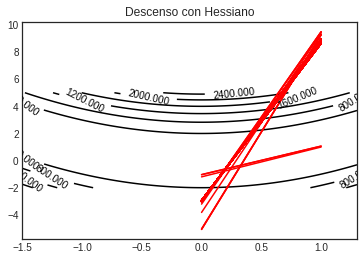

In [67]:
def funcion(x,y):
    return 100*(y-x**2)**2+(1-x)**2

#Gradiente descendente con Hessiano
x = np.linspace(-1.5,1.3,5000) #generamos el conjunto de puntos 
y = np.linspace(-2,5,5000)
X,Y= np.meshgrid(x, y) #Una malla con los puntos generados por x y y nos da una matriz de 5000x5000
Z = funcion(X,Y)
curva1=plt.contour(X, Y, Z,colors='black')
plt.clabel(curva1,inline=1,fontsize=10)
plt.title("Descenso con Hessiano")
for l in puntos:
    plt.plot(l,'r')
plt.show()

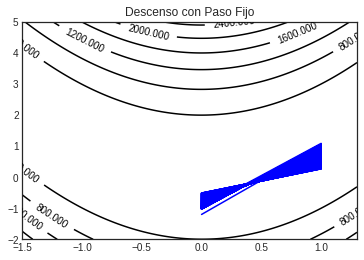

In [68]:
#Gradiente descendente con tamaño de paso fijo
x = np.linspace(-1.5,1.3,5000) #generamos el conjunto de puntos 
y = np.linspace(-2,5,5000)
X,Y= np.meshgrid(x, y) #Una malla con los puntos generados por x y y nos da una matriz de 5000x5000
Z = funcion(X,Y)
curva1=plt.contour(X, Y, Z,colors='black')
plt.clabel(curva1,inline=1,fontsize=10)
plt.title("Descenso con Paso Fijo")
for l in puntos3:
    plt.plot(l,'b')
plt.show()

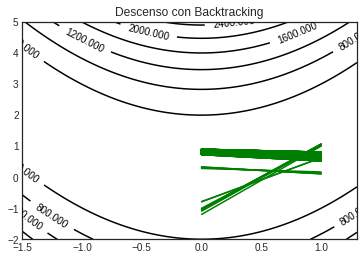

In [69]:
#Gradiente descendente con backtracking
x = np.linspace(-1.5,1.3,5000) #generamos el conjunto de puntos 
y = np.linspace(-2,5,5000)
X,Y= np.meshgrid(x, y) #Una malla con los puntos generados por x y y nos da una matriz de 5000x5000
Z = funcion(X,Y)
curva1=plt.contour(X, Y, Z,colors='black')
plt.clabel(curva1,inline=1,fontsize=10)
plt.title("Descenso con Backtracking")
for l in puntos2:
    plt.plot(l,'g')
plt.show()

# Caso 2 Rosembrock n=100

In [16]:
#Definamos la función que vamos a usar 
def rosen(x): #La función de rosembruck en general
    return sum(100.0*(x[1:]-x[:-1]**2.0)**2.0 + (1-x[:-1])**2.0)

def r_der(x):
        xm = x[1:-1]
        xm_m1 = x[:-2]
        xm_p1 = x[2:]
        der =np.zeros(x.shape)
        der[1:-1] = 200*(xm-xm_m1**2) - 400*(xm_p1 - xm**2)*xm - 2*(1-xm)
        der[0] = -400*x[0]*(x[1]-x[0]**2) - 2*(1-x[0])
        der[-1] = 200*(x[-1]-x[-2]**2)
        return der

In [22]:
#Vector de prueba del algoritmo
test=np.ones(100)
test[0]=-1.2
test[98]=-1.2

#Punto nuevo inicial
prueba2=np.ones(100)
test[1]=-1.2
test[98]=-1.2

In [29]:
#res=gradientdescent(test,30000,1e-14,1e-14,1e-14,rosen,r_der,'StepFijo')
#print(res)

res2=gradientdescent(prueba2,30000,1e-14,1e-14,1e-14,rosen,r_der,'StepFijo')
print(res2)

Tamano de paso
1e-4
1 & 4.221743791373418 & 1426.2152600522054 & 1429.847680476201
2 & 0.1426215260052207 & 1465.2747542868697 & 1223.4342774039471
3 & 0.1465274754286872 & 1475.2590685991509 & 1007.6144956880747
4 & 0.14752590685991526 & 1444.1590759197334 & 791.7360770168027
5 & 0.1444159075919734 & 1364.2775764438131 & 588.324183358015
6 & 0.1364277576443813 & 1235.949562686051 & 410.33897056019845
7 & 0.12359495626860502 & 1069.3295469043562 & 267.36324968484223
8 & 0.10693295469043552 & 882.4811319997806 & 162.6405004561563
9 & 0.08824811319997801 & 696.0424667852815 & 92.76865921651324
10 & 0.0696042466785282 & 527.169813252105 & 50.08397001794937
11 & 0.052716981325210514 & 385.88064811310176 & 25.965723996827343
12 & 0.03858806481131007 & 274.9035074773378 & 13.19572326490236
13 & 0.027490350747733736 & 191.85643926042545 & 6.772354841140691
14 & 0.01918564392604251 & 131.90049348762884 & 3.6639698685862188
15 & 0.013190049348762964 & 89.71838205372887 & 2.2015219710043192
16 &

301 & 4.8029653364183764e-05 & 0.4802934624690121 & 0.9640041159486608
302 & 4.802934624672668e-05 & 0.4802903912632125 & 0.9639810478414055
303 & 4.8029039126132907e-05 & 0.48028732002476643 & 0.9639579800291657
304 & 4.8028732002348135e-05 & 0.48028424875367387 & 0.9639349125119427
305 & 4.8028424875426665e-05 & 0.4802811774499343 & 0.9639118452897372
306 & 4.80281177449379e-05 & 0.4802781061135476 & 0.9638887783625509
307 & 4.802781061125813e-05 & 0.4802750347445136 & 0.9638657117303853
308 & 4.8027503474441675e-05 & 0.48027196334283206 & 0.9638426453932409
309 & 4.802719633443423e-05 & 0.4802688919085027 & 0.9638195793511196
310 & 4.802688919085949e-05 & 0.4802658204415251 & 0.9637965136040223
311 & 4.8026582044148065e-05 & 0.48026274894189935 & 0.9637734481519505
312 & 4.802627489424564e-05 & 0.48025967740962494 & 0.9637503829949052
313 & 4.802596774115222e-05 & 0.48025660584470165 & 0.9637273181328879
314 & 4.802566058454584e-05 & 0.4802535342471295 & 0.9637042535658996
315 & 4.8

655 & 4.792072968207023e-05 & 0.4792042140736724 & 0.955856447972455
656 & 4.792042140717034e-05 & 0.4792011312960408 & 0.9558334843784402
657 & 4.792011312961914e-05 & 0.4791980484856778 & 0.9558105210798807
658 & 4.79198048484467e-05 & 0.4791949656425835 & 0.955787558076778
659 & 4.791949656413801e-05 & 0.4791918827667574 & 0.955764595369133
660 & 4.7919188276638624e-05 & 0.47918879985819945 & 0.9557416329569473
661 & 4.791887998600298e-05 & 0.47918571691690925 & 0.9557186708402213
662 & 4.791857169174611e-05 & 0.47918263394288657 & 0.9556957090189572
663 & 4.7918263394352984e-05 & 0.4791795509361313 & 0.955672747493156
664 & 4.791795509376918e-05 & 0.4791764678966431 & 0.9556497862628186
665 & 4.791764678956414e-05 & 0.4791733848244217 & 0.9556268253279467
666 & 4.791733848227727e-05 & 0.479170301719467 & 0.9556038646885412
667 & 4.791703017179972e-05 & 0.4791672185817787 & 0.9555809043446034
668 & 4.7916721858131504e-05 & 0.4791641354113565 & 0.9555579442961347
669 & 4.791641354127

989 & 4.7817583835693156e-05 & 0.4781727446682241 & 0.948203045728682
990 & 4.781727446684972e-05 & 0.47816965094518454 & 0.9481801808852739
991 & 4.781696509443991e-05 & 0.4781665571893349 & 0.9481573163377324
992 & 4.7816655718894246e-05 & 0.47816346340067467 & 0.948134452086058
993 & 4.7816346340103675e-05 & 0.4781603695792038 & 0.9481115881302522
994 & 4.781603695780127e-05 & 0.47815727572492217 & 0.9480887244703164
995 & 4.781572757268446e-05 & 0.4781541818378293 & 0.9480658611062516
996 & 4.78154181835708e-05 & 0.47815108791792515 & 0.9480429980380591
997 & 4.781510879175178e-05 & 0.4781479939652094 & 0.94802013526574
998 & 4.7814799396311895e-05 & 0.4781448999796818 & 0.9479972727892958
999 & 4.781448999816664e-05 & 0.47814180596134204 & 0.9479744106087272
1000 & 4.781418059597002e-05 & 0.47813871191019014 & 0.947951548724036
1001 & 4.781387119106805e-05 & 0.47813561782622555 & 0.9479286871352232
1002 & 4.781356178254521e-05 & 0.4781325237094484 & 0.9479058258422899
1003 & 4.781

1304 & 4.7719970211228965e-05 & 0.47719659807598097 & 0.9410152584135146
1305 & 4.77196598074901e-05 & 0.47719349400617644 & 0.9409924868282555
1306 & 4.771934940061574e-05 & 0.4771903899034884 & 0.940969715539246
1307 & 4.771903899049668e-05 & 0.4771872857679163 & 0.9409469445464872
1308 & 4.77187285768663e-05 & 0.4771841815994603 & 0.9409241738499806
1309 & 4.771841816004583e-05 & 0.4771810773981199 & 0.9409014034497274
1310 & 4.7718107740035256e-05 & 0.477177973163895 & 0.9408786333457284
1311 & 4.7717797316404154e-05 & 0.4771748688967852 & 0.9408558635379854
1312 & 4.771748688969218e-05 & 0.4771717645967905 & 0.9408330940264992
1313 & 4.7717176459735506e-05 & 0.4771686602639104 & 0.940810324811271
1314 & 4.7716866026212916e-05 & 0.477165555898145 & 0.9407875558923026
1315 & 4.771655558993067e-05 & 0.4771624514994938 & 0.9407647872695943
1316 & 4.7716245150082514e-05 & 0.47715934706795665 & 0.9407420189431478
1317 & 4.771593470666844e-05 & 0.47715624260353334 & 0.9407192509129644
13

1616 & 4.7622964606526496e-05 & 0.47622653175786894 & 0.9339249027180276
1617 & 4.762265317594356e-05 & 0.4762234174171887 & 0.9339022236212289
1618 & 4.7622341741740415e-05 & 0.4762203030435531 & 0.9338795448210561
1619 & 4.7622030304402155e-05 & 0.47621718863696194 & 0.93385686631751
1620 & 4.762171886387409e-05 & 0.4762140741974149 & 0.9338341881105917
1621 & 4.762140741978053e-05 & 0.47621095972491173 & 0.933811510200303
1622 & 4.762109597244244e-05 & 0.47620784521945236 & 0.9337888325866447
1623 & 4.7620784521969254e-05 & 0.47620473068103636 & 0.9337661552696178
1624 & 4.762047306793057e-05 & 0.4762016161096637 & 0.9337434782492241
1625 & 4.762016161113247e-05 & 0.47619850150533405 & 0.9337208015254643
1626 & 4.761985015071417e-05 & 0.47619538686804713 & 0.9336981250983397
1627 & 4.7619538686785085e-05 & 0.47619227219780286 & 0.9336754489678516
1628 & 4.7619227219556775e-05 & 0.47618915749460095 & 0.9336527731340014
1629 & 4.761891574924808e-05 & 0.47618604275844106 & 0.9336300975

1960 & 4.7515637845510616e-05 & 0.4751532527983899 & 0.926140801187659
1961 & 4.751532527999021e-05 & 0.47515012710765697 & 0.9261182242005532
1962 & 4.7515012710904766e-05 & 0.4751470013838907 & 0.9260956475104833
1963 & 4.751470013819948e-05 & 0.47514387562709093 & 0.9260730711174505
1964 & 4.751438756273503e-05 & 0.47514074983725735 & 0.9260504950214558
1965 & 4.7514074983760364e-05 & 0.47513762401438986 & 0.9260279192225004
1966 & 4.75137624015414e-05 & 0.475134498158488 & 0.9260053437205852
1967 & 4.751344981570257e-05 & 0.4751313722695518 & 0.9259827685157119
1968 & 4.7513137227159415e-05 & 0.475128246347581 & 0.9259601936078813
1969 & 4.75128246346209e-05 & 0.47512512039257526 & 0.9259376189970948
1970 & 4.751251203926841e-05 & 0.4751219944045344 & 0.9259150446833536
1971 & 4.7512199440350894e-05 & 0.4751188683834582 & 0.9258924706666588
1972 & 4.75118868382987e-05 & 0.47511574232934645 & 0.9258698969470116
1973 & 4.75115742330022e-05 & 0.4751126162421989 & 0.9258473235244132
19

2320 & 4.740290053602142e-05 & 0.4740258677961658 & 0.9180322893902899
2321 & 4.740258677981167e-05 & 0.47402273019900065 & 0.9180098194123205
2322 & 4.740227302009229e-05 & 0.474019592568722 & 0.9179873497318112
2323 & 4.740195925669853e-05 & 0.47401645490532973 & 0.917964880348763
2324 & 4.740164549054589e-05 & 0.47401331720882334 & 0.9179424112631764
2325 & 4.740133172088363e-05 & 0.47401017947920293 & 0.9179199424750535
2326 & 4.7401017947977274e-05 & 0.47400704171646796 & 0.9178974739843949
2327 & 4.7400704171451455e-05 & 0.47400390392061853 & 0.9178750057912021
2328 & 4.740039039222168e-05 & 0.47400076609165415 & 0.9178525378954757
2329 & 4.7400076608997094e-05 & 0.4739976282295748 & 0.9178300702972174
2330 & 4.7399762822958695e-05 & 0.47399449033438007 & 0.917807602996428
2331 & 4.7399449033355764e-05 & 0.4739913524060699 & 0.9177851359931093
2332 & 4.739913524056367e-05 & 0.47398821444464395 & 0.9177626692872619
2333 & 4.7398821444582415e-05 & 0.47398507645010207 & 0.9177402028

2659 & 4.729634726352635e-05 & 0.4729603238355525 & 0.9104320161351386
2660 & 4.72960323834361e-05 & 0.4729571750003256 & 0.91040964706281
2661 & 4.729571750015697e-05 & 0.47295402613191095 & 0.9103872782883352
2662 & 4.729540261325875e-05 & 0.47295087723030843 & 0.9103649098117159
2663 & 4.7295087723171656e-05 & 0.47294772829551757 & 0.9103425416329527
2664 & 4.72947728295205e-05 & 0.4729445793275385 & 0.9103201737520474
2665 & 4.729445793268047e-05 & 0.47294143032637076 & 0.9102978061690008
2666 & 4.729414303270661e-05 & 0.47293828129201415 & 0.9102754388838141
2667 & 4.7293828129058616e-05 & 0.47293513222446865 & 0.9102530718964886
2668 & 4.729351322222177e-05 & 0.4729319831237337 & 0.9102307052070253
2669 & 4.729319831230612e-05 & 0.4729288339898094 & 0.9102083388154254
2670 & 4.7292883399146586e-05 & 0.47292568482269537 & 0.9101859727216898
2671 & 4.729256848236795e-05 & 0.4729225356223914 & 0.9101636069258199
2672 & 4.729225356202526e-05 & 0.47291938638889736 & 0.910141241427817


3025 & 4.718087925789861e-05 & 0.4718056316170762 & 0.9022648401683055
3026 & 4.718056316181484e-05 & 0.4718024706207334 & 0.9022425801874715
3027 & 4.718024706205721e-05 & 0.47179930959112415 & 0.9022203205049121
3028 & 4.717993095916619e-05 & 0.4717961485282483 & 0.9021980611206281
3029 & 4.7179614852656456e-05 & 0.4717929874321056 & 0.9021758020346211
3030 & 4.717929874338837e-05 & 0.4717898263026959 & 0.9021535432468917
3031 & 4.7178982630071395e-05 & 0.4717866651400189 & 0.9021312847574414
3032 & 4.7178666514051214e-05 & 0.4717835039440744 & 0.9021090265662712
3033 & 4.717835039441232e-05 & 0.47178034271486236 & 0.9020867686733826
3034 & 4.717803427152976e-05 & 0.4717771814523823 & 0.9020645110787763
3035 & 4.717771814513878e-05 & 0.47177402015663417 & 0.9020422537824534
3036 & 4.7177402015504124e-05 & 0.47177085882761766 & 0.9020199967844156
3037 & 4.717708588273609e-05 & 0.47176769746533265 & 0.9019977400846633
3038 & 4.717676974634935e-05 & 0.4717645360697789 & 0.90197548368319

3370 & 4.70716284865926e-05 & 0.47071311241300784 & 0.8946028541006753
3371 & 4.7071311241197004e-05 & 0.47070993992720456 & 0.894580697091922
3372 & 4.7070993992668436e-05 & 0.47070676740806205 & 0.8945585403818339
3373 & 4.7070676741006897e-05 & 0.4707035948555802 & 0.8945363839704125
3374 & 4.707035948567176e-05 & 0.4707004222697588 & 0.8945142278576587
3375 & 4.707004222714841e-05 & 0.4706972496505975 & 0.8944920720435733
3376 & 4.7069724965061974e-05 & 0.47069407699809646 & 0.8944699165281582
3377 & 4.7069407699787314e-05 & 0.47069090431225513 & 0.8944477613114141
3378 & 4.7069090431324436e-05 & 0.47068773159307337 & 0.8944256063933421
3379 & 4.7068773159243216e-05 & 0.47068455884055105 & 0.8944034517739435
3380 & 4.7068455884029044e-05 & 0.47068138605468796 & 0.8943812974532195
3381 & 4.7068138605571394e-05 & 0.4706782132354838 & 0.8943591434311706
3382 & 4.706782132355067e-05 & 0.47067504038293845 & 0.8943369897077986
3383 & 4.706750403828648e-05 & 0.47067186749705164 & 0.894314

3721 & 4.696007047222127e-05 & 0.46959752055513815 & 0.8868440975672108
3722 & 4.695975205563895e-05 & 0.46959433635455977 & 0.8868220454588439
3723 & 4.695943363543865e-05 & 0.4695911521205696 & 0.886799993649535
3724 & 4.6959115212105815e-05 & 0.46958796785316775 & 0.886777942139285
3725 & 4.6958796785155006e-05 & 0.4695847835523536 & 0.8867558909280951
3726 & 4.695847835539101e-05 & 0.46958159921812737 & 0.8867338400159661
3727 & 4.6958159921689694e-05 & 0.4695784148504885 & 0.8867117894028996
3728 & 4.695784148511983e-05 & 0.469575230449437 & 0.8866897390888963
3729 & 4.695752304504273e-05 & 0.4695720460149726 & 0.8866676890739574
3730 & 4.6957204601722356e-05 & 0.46956886154709504 & 0.8866456393580842
3731 & 4.695688615478403e-05 & 0.4695656770458042 & 0.8866235899412775
3732 & 4.6956567704713164e-05 & 0.4695624925110998 & 0.8866015408235386
3733 & 4.695624925096899e-05 & 0.46955930794298184 & 0.8865794920048691
3734 & 4.6955930794522337e-05 & 0.46955612334144975 & 0.8865574434852

4084 & 4.6844265519947636e-05 & 0.46843945888967925 & 0.8788588399699988
4085 & 4.684394588892116e-05 & 0.4684362625473229 & 0.8788368964921988
4086 & 4.6843626254651644e-05 & 0.4684330661714813 & 0.8788149533138565
4087 & 4.6843306617194544e-05 & 0.4684298697621545 & 0.8787930104349732
4088 & 4.6842986976175345e-05 & 0.4684266733193421 & 0.8787710678555499
4089 & 4.68426673319131e-05 & 0.46842347684304414 & 0.8787491255755878
4090 & 4.684234768451876e-05 & 0.4684202803332602 & 0.8787271835950877
4091 & 4.684202803350684e-05 & 0.4684170837899902 & 0.878705241914051
4092 & 4.684170837882187e-05 & 0.46841388721323385 & 0.8786833005324789
4093 & 4.6841388721434816e-05 & 0.468410690602991 & 0.878661359450372
4094 & 4.6841069060430186e-05 & 0.46840749395926146 & 0.8786394186677318
4095 & 4.684074939580799e-05 & 0.46840429728204497 & 0.878617478184559
4096 & 4.684042972799823e-05 & 0.4684011005713415 & 0.8785955380008553
4097 & 4.68401100570009e-05 & 0.4683979038271506 & 0.8785735981166215
4

4441 & 4.672994436021249e-05 & 0.4672962353285174 & 0.8710440559369271
4442 & 4.672962353294224e-05 & 0.46729302701936465 & 0.8710222194347331
4443 & 4.67293027019992e-05 & 0.46728981867665637 & 0.8710003832323848
4444 & 4.672898186749455e-05 & 0.4672866103003921 & 0.8709785473298828
4445 & 4.672866103017701e-05 & 0.4672834018905717 & 0.8709567117272283
4446 & 4.672834018924227e-05 & 0.46728019344719507 & 0.8709348764244224
4447 & 4.672801934474593e-05 & 0.46727698497026204 & 0.8709130414214663
4448 & 4.672769849706234e-05 & 0.46727377645977214 & 0.8708912067183606
4449 & 4.672737764613593e-05 & 0.4672705679157255 & 0.8708693723151073
4450 & 4.6727056791647904e-05 & 0.46726735933812175 & 0.8708475382117067
4451 & 4.6726735933917044e-05 & 0.4672641507269608 & 0.8708257044081601
4452 & 4.672641507262459e-05 & 0.46726094208224234 & 0.8708038709044686
4453 & 4.67260942081449e-05 & 0.4672577334039662 & 0.8707820377006333
4454 & 4.672577334042237e-05 & 0.46725452469213224 & 0.870760204796655

4782 & 4.6620347514126095e-05 & 0.4662002554104268 & 0.8636151977583227
4783 & 4.6620025541156854e-05 & 0.4661970356475354 & 0.8635934635655609
4784 & 4.661970356462646e-05 & 0.4661938158510225 & 0.8635717296730089
4785 & 4.661938158528334e-05 & 0.46619059602088775 & 0.8635499960806681
4786 & 4.6619059601949185e-05 & 0.46618737615713096 & 0.8635282627885396
4787 & 4.661873761585798e-05 & 0.4661841562597521 & 0.8635065297966245
4788 & 4.661841562609426e-05 & 0.46618093632875085 & 0.8634847971049233
4789 & 4.66180936327694e-05 & 0.46617771636412714 & 0.8634630647134378
4790 & 4.66177716362576e-05 & 0.4661744963658806 & 0.8634413326221689
4791 & 4.661744963650318e-05 & 0.4661712763340112 & 0.8634196008311174
4792 & 4.661712763361751e-05 & 0.46616805626851854 & 0.8633978693402842
4793 & 4.6616805627059335e-05 & 0.4661648361694026 & 0.8633761381496706
4794 & 4.661648361694002e-05 & 0.4661616160366633 & 0.8633544072592781
4795 & 4.661616160357809e-05 & 0.4661583958703002 & 0.8633326766691073

5109 & 4.651488305177774e-05 & 0.46514559978377695 & 0.856524124329883
5110 & 4.651455997840033e-05 & 0.46514236901652134 & 0.8565024883621217
5111 & 4.651423690183628e-05 & 0.4651391382155824 & 0.8564808526949151
5112 & 4.6513913821655736e-05 & 0.46513590738096 & 0.8564592173282641
5113 & 4.651359073828857e-05 & 0.46513267651265383 & 0.85643758226217
5114 & 4.65132676513049e-05 & 0.46512944561066377 & 0.8564159474966337
5115 & 4.651294456113461e-05 & 0.46512621467498966 & 0.8563943130316563
5116 & 4.651262146734782e-05 & 0.4651229837056312 & 0.8563726788672388
5117 & 4.651229837080425e-05 & 0.46511975270258843 & 0.8563510450033821
5118 & 4.651197527015856e-05 & 0.4651165216658609 & 0.8563294114400873
5119 & 4.651165216638203e-05 & 0.46511329059544865 & 0.8563077781773559
5120 & 4.6511329059363066e-05 & 0.46511005949135126 & 0.8562861452151883
5121 & 4.651100594921328e-05 & 0.4651068283535687 & 0.8562645125535857
5122 & 4.65106828353912e-05 & 0.4651035971821007 & 0.8562428801925495
512

5469 & 4.639835883954298e-05 & 0.4639803455249653 & 0.8487546058096803
5470 & 4.6398034552399406e-05 & 0.46397710261975533 & 0.848733078108809
5471 & 4.6397710262013595e-05 & 0.4639738596807958 & 0.8487115507088657
5472 & 4.639738596801169e-05 & 0.46397061670808626 & 0.8486900236098516
5473 & 4.6397061670879385e-05 & 0.4639673737016269 & 0.8486684968117675
5474 & 4.639673737007507e-05 & 0.4639641306614172 & 0.8486469703146146
5475 & 4.6396413066028526e-05 & 0.46396088758745724 & 0.8486254441183939
5476 & 4.639608875885159e-05 & 0.46395764447974674 & 0.8486039182231062
5477 & 4.639576444805856e-05 & 0.46395440133828547 & 0.8485823926287528
5478 & 4.6395440133649435e-05 & 0.46395115816307336 & 0.8485608673353349
5479 & 4.639511581642786e-05 & 0.4639479149541101 & 0.8485393423428531
5480 & 4.6394791495216336e-05 & 0.4639446717113957 & 0.8485178176513088
5481 & 4.639446717119237e-05 & 0.4639414284349297 & 0.8484962932607026
5482 & 4.639414284355232e-05 & 0.46393818512471213 & 0.84847476917

5806 & 4.628888288145833e-05 & 0.46288557455895607 & 0.8415168144355498
5807 & 4.62885574556884e-05 & 0.46288232026992376 & 0.8414953882053545
5808 & 4.628823202716218e-05 & 0.4628790659470814 & 0.8414739622764308
5809 & 4.628790659453448e-05 & 0.46287581159042884 & 0.8414525366487801
5810 & 4.62875811591505e-05 & 0.4628725571999659 & 0.8414311113224034
5811 & 4.6287255720206796e-05 & 0.46286930277569227 & 0.8414096862973012
5812 & 4.628693027759134e-05 & 0.4628660483176079 & 0.8413882615734753
5813 & 4.628660483173386e-05 & 0.4628627938257127 & 0.8413668371509262
5814 & 4.6286279382746386e-05 & 0.4628595393000063 & 0.841345413029655
5815 & 4.628595393014319e-05 & 0.46285628474048857 & 0.8413239892096629
5816 & 4.6285628473868245e-05 & 0.4628530301471595 & 0.841302565690951
5817 & 4.628530301489304e-05 & 0.46284977552001866 & 0.8412811424735196
5818 & 4.6284977551816356e-05 & 0.462846520859066 & 0.8412597195573707
5819 & 4.628465208592738e-05 & 0.4628432661643013 & 0.8412382969425044
5

6162 & 4.617281761994065e-05 & 0.46172490989617104 & 0.8339081213686574
6163 & 4.617249098970353e-05 & 0.46172164355968565 & 0.8338868024548228
6164 & 4.61721643559072e-05 & 0.4617183771893282 & 0.8338654838426172
6165 & 4.6171837718869034e-05 & 0.4617151107850984 & 0.8338441655320415
6166 & 4.617151107864518e-05 & 0.4617118443469962 & 0.8338228475230965
6167 & 4.617118443480598e-05 & 0.46170857787502123 & 0.8338015298157838
6168 & 4.617085778729529e-05 & 0.4617053113691735 & 0.8337802124101039
6169 & 4.617053113708471e-05 & 0.4617020448294528 & 0.8337588953060581
6170 & 4.6170204482772986e-05 & 0.4616987782558589 & 0.8337375785036472
6171 & 4.6169877825705244e-05 & 0.46169551164839173 & 0.833716262002872
6172 & 4.616955116496602e-05 & 0.4616922450070509 & 0.8336949458037337
6173 & 4.616922450066758e-05 & 0.4616889783318366 & 0.8336736299062335
6174 & 4.616889783318347e-05 & 0.4616857116227483 & 0.8336523143103722
6175 & 4.616857116245752e-05 & 0.46168244487978605 & 0.8336309990161507


6509 & 4.605927346485071e-05 & 0.4605894565805586 & 0.8265285721890245
6510 & 4.60589456581443e-05 & 0.46058617848023237 & 0.8265073579997659
6511 & 4.6058617847822897e-05 & 0.4605829003459753 & 0.8264861441124783
6512 & 4.605829003474572e-05 & 0.46057962217778714 & 0.8264649305271624
6513 & 4.605796221756771e-05 & 0.4605763439756679 & 0.8264437172438194
6514 & 4.6057634397633936e-05 & 0.4605730657396172 & 0.8264225042624501
6515 & 4.6057306574085186e-05 & 0.460569787469635 & 0.8264012915830554
6516 & 4.605697874692145e-05 & 0.460566509165721 & 0.8263800792056366
6517 & 4.6056650916572345e-05 & 0.46056323082787526 & 0.8263588671301946
6518 & 4.605632308298162e-05 & 0.4605599524560975 & 0.8263376553567301
6519 & 4.605599524577592e-05 & 0.4605566740503875 & 0.8263164438852443
6520 & 4.6055667404899e-05 & 0.4605533956107452 & 0.8262952327157381
6521 & 4.605533956089295e-05 & 0.46055011713717037 & 0.8262740218482129
6522 & 4.60550117136453e-05 & 0.46054683862966284 & 0.826252811282669
6523

6860 & 4.5944004796888444e-05 & 0.45943675798158073 & 0.8191009472643047
6861 & 4.5943675797976326e-05 & 0.4594334679613942 & 0.8190798391264239
6862 & 4.594334679619597e-05 & 0.4594301779072193 & 0.8190587312908533
6863 & 4.594301779085737e-05 & 0.4594268878190558 & 0.8190376237575943
6864 & 4.59426887818478e-05 & 0.4594235976969034 & 0.8190165165266473
6865 & 4.594235976959682e-05 & 0.45942030754076224 & 0.8189954095980139
6866 & 4.5942030754217134e-05 & 0.45941701735063195 & 0.8189743029716945
6867 & 4.594170173516649e-05 & 0.4594137271265124 & 0.8189531966476904
6868 & 4.594137271250124e-05 & 0.45941043686840355 & 0.8189320906260026
6869 & 4.594104368665094e-05 & 0.45940714657630505 & 0.8189109849066317
6870 & 4.594071465755922e-05 & 0.4594038562502169 & 0.818889879489579
6871 & 4.594038562485291e-05 & 0.45940056589013883 & 0.8188687743748453
6872 & 4.594005658896155e-05 & 0.45939727549607073 & 0.8188476695624315
6873 & 4.593972754982877e-05 & 0.45939398506801243 & 0.81882656505233

7193 & 4.5834260278542875e-05 & 0.458339301470894 & 0.8120886542818948
7194 & 4.583393014713342e-05 & 0.4583360001237365 & 0.8120676468660242
7195 & 4.583360001253921e-05 & 0.4583326987425376 & 0.8120466397527801
7196 & 4.5833269874274295e-05 & 0.45832939732729727 & 0.8120256329421635
7197 & 4.583293973282461e-05 & 0.4583260958780153 & 0.8120046264341753
7198 & 4.583260958776067e-05 & 0.4583227943946916 & 0.8119836202288168
7199 & 4.583227943945551e-05 & 0.458319492877326 & 0.8119626143260883
7200 & 4.5831949287536106e-05 & 0.4583161913259183 & 0.8119416087259914
7201 & 4.5831619132375477e-05 & 0.4583128897404683 & 0.8119206034285265
7202 & 4.583128897408656e-05 & 0.458309588120976 & 0.8118995984336949
7203 & 4.583095881207046e-05 & 0.4583062864674411 & 0.8118785937414971
7204 & 4.583062864692608e-05 & 0.4583029847798634 & 0.8118575893519345
7205 & 4.583029847816745e-05 & 0.4582996830582429 & 0.811836585265008
7206 & 4.5829968305681654e-05 & 0.45829638130257944 & 0.8118155814807183
720

7524 & 4.5724800805846844e-05 & 0.45724469546834207 & 0.8051517331869654
7525 & 4.5724469546755215e-05 & 0.4572413828450781 & 0.8051308259915458
7526 & 4.572413828442254e-05 & 0.457238070187722 & 0.8051099190990613
7527 & 4.5723807018961974e-05 & 0.4572347574962737 & 0.8050890125095124
7528 & 4.572347574945808e-05 & 0.4572314447707329 & 0.8050681062229007
7529 & 4.572314447708601e-05 & 0.45722813201109946 & 0.8050472002392266
7530 & 4.5722813201100046e-05 & 0.4572248192173734 & 0.8050262945584914
7531 & 4.572248192192962e-05 & 0.4572215063895543 & 0.8050053891806954
7532 & 4.57221506391453e-05 & 0.45721819352764226 & 0.8049844841058403
7533 & 4.5721819352690525e-05 & 0.457214880631637 & 0.8049635793339267
7534 & 4.572148806305129e-05 & 0.45721156770153837 & 0.8049426748649554
7535 & 4.5721156770171014e-05 & 0.4572082547373463 & 0.8049217706989275
7536 & 4.572082547373343e-05 & 0.45720494173906057 & 0.8049008668358438
7537 & 4.572049417399825e-05 & 0.457201628706681 & 0.8048799632757051

7881 & 4.5606324618846496e-05 & 0.45605992141989915 & 0.7977071216348046
7882 & 4.560599214189405e-05 & 0.45605659661627185 & 0.7976863226454273
7883 & 4.5605659661700774e-05 & 0.4560532717784996 & 0.797665523959311
7884 & 4.560532717789398e-05 & 0.45604994690658224 & 0.7976447255764567
7885 & 4.560499469041698e-05 & 0.45604662200051954 & 0.7976239274968654
7886 & 4.560466220018521e-05 & 0.45604329706031144 & 0.7976031297205377
7887 & 4.5604329705910556e-05 & 0.45603997208595776 & 0.7975823322474747
7888 & 4.560399720839507e-05 & 0.4560366470774584 & 0.7975615350776776
7889 & 4.560366470763876e-05 & 0.45603332203481306 & 0.7975407382111466
7890 & 4.560333220326893e-05 & 0.45602999695802177 & 0.7975199416478832
7891 & 4.560299969571497e-05 & 0.45602667184708434 & 0.797499145387888
7892 & 4.560266718449081e-05 & 0.45602334670200056 & 0.7974783494311619
7893 & 4.560233467008251e-05 & 0.4560200215227704 & 0.797457553777706
7894 & 4.5602002152490075e-05 & 0.4560166963093935 & 0.797436758427

8196 & 4.55014254426025e-05 & 0.45501091889412626 & 0.7911704423963005
8197 & 4.5501091889459844e-05 & 0.4550075833277313 & 0.791149738978555
8198 & 4.5500758332704006e-05 & 0.45500424772714626 & 0.7911290358643525
8199 & 4.5500424772707515e-05 & 0.45500091209237126 & 0.7911083330536937
8200 & 4.5500091209041054e-05 & 0.4549975764234061 & 0.7910876305465796
8201 & 4.549975764219073e-05 & 0.4549942407202506 & 0.7910669283430111
8202 & 4.549942407209976e-05 & 0.4549909049829046 & 0.7910462264429892
8203 & 4.549909049839561e-05 & 0.454987569211368 & 0.7910255248465143
8204 & 4.5498756921078276e-05 & 0.45498423340564065 & 0.791004823553588
8205 & 4.54984233405203e-05 & 0.45498089756572246 & 0.7909841225642109
8206 & 4.549808975672167e-05 & 0.45497756169161324 & 0.7909634218783836
8207 & 4.549775616936667e-05 & 0.45497422578331276 & 0.790942721496107
8208 & 4.54974225782849e-05 & 0.4549708898408212 & 0.7909220214173827
8209 & 4.549708898401928e-05 & 0.454967553864138 & 0.7909013216422108
82

8551 & 4.538279911551415e-05 & 0.45382464347747015 & 0.7838398087320239
8552 & 4.538246434785802e-05 & 0.4538212957649901 & 0.7838192131272848
8553 & 4.538212957658909e-05 & 0.4538179480182714 & 0.7837986178263993
8554 & 4.538179480170735e-05 & 0.4538146002373142 & 0.783778022829369
8555 & 4.538146002358516e-05 & 0.4538112524221181 & 0.7837574281361944
8556 & 4.538112524222252e-05 & 0.4538079045726832 & 0.7837368337468762
8557 & 4.538079045724707e-05 & 0.4538045566890091 & 0.7837162396614156
8558 & 4.5380455669031176e-05 & 0.4538012087710959 & 0.7836956458798132
8559 & 4.538012087720248e-05 & 0.4537978608189434 & 0.7836750524020699
8560 & 4.5379786081761e-05 & 0.45379451283255134 & 0.7836544592281868
8561 & 4.53794512834514e-05 & 0.4537911648119197 & 0.7836338663581646
8562 & 4.537911648109975e-05 & 0.4537878167570484 & 0.7836132737920041
8563 & 4.537878167556457e-05 & 0.45378446866793715 & 0.7835926815297063
8564 & 4.537844686678894e-05 & 0.4537811205445859 & 0.7835720895712721
8565 &

8882 & 4.5271803893232534e-05 & 0.45271467991584813 & 0.7770392637084087
8883 & 4.527146799174083e-05 & 0.45271132086320504 & 0.777018768726302
8884 & 4.527113208615045e-05 & 0.45270796177628003 & 0.7769982740483328
8885 & 4.5270796177749006e-05 & 0.45270460265507306 & 0.7769777796745021
8886 & 4.527046026530591e-05 & 0.4527012434995839 & 0.7769572856048107
8887 & 4.5270124350051745e-05 & 0.4526978843098124 & 0.7769367918392593
8888 & 4.5269788431185136e-05 & 0.45269452508575847 & 0.7769162983778487
8889 & 4.5269452508649065e-05 & 0.452691165827422 & 0.7768958052205802
8890 & 4.526911658287272e-05 & 0.45268780653480295 & 0.7768753123674543
8891 & 4.5268780653483935e-05 & 0.45268444720790096 & 0.7768548198184717
8892 & 4.526844472085488e-05 & 0.4526810878467161 & 0.7768343275736337
8893 & 4.5268108784613385e-05 & 0.45267772845124815 & 0.7768138356329407
8894 & 4.526777284513163e-05 & 0.45267436902149705 & 0.7767933439963939
8895 & 4.526743690198041e-05 & 0.45267100955746253 & 0.77677285

9221 & 4.515773668563857e-05 & 0.4515739962092017 & 0.7701088945415059
9222 & 4.515739962116035e-05 & 0.45157062552775845 & 0.7700885027102058
9223 & 4.5157062552955784e-05 & 0.4515672548119909 & 0.7700681111833275
9224 & 4.5156725481081994e-05 & 0.45156388406189885 & 0.7700477199608714
9225 & 4.515638840602526e-05 & 0.45156051327748215 & 0.7700273290428385
9226 & 4.515605132772844e-05 & 0.4515571424587408 & 0.7700069384292296
9227 & 4.515571424581952e-05 & 0.4515537716056745 & 0.7699865481200456
9228 & 4.5155377160670544e-05 & 0.45155040071828334 & 0.7699661581152871
9229 & 4.515504007185234e-05 & 0.45154702979656697 & 0.769945768414955
9230 & 4.515470297985119e-05 & 0.4515436588405254 & 0.76992537901905
9231 & 4.5154365884180824e-05 & 0.45154028785015854 & 0.7699049899275734
9232 & 4.515402878489838e-05 & 0.4515369168254662 & 0.7698846011405258
9233 & 4.515369168237586e-05 & 0.4515335457664483 & 0.7698642126579078
9234 & 4.515335457661326e-05 & 0.45153017467310463 & 0.769843824479720

9570 & 4.50398925790492e-05 & 0.45039554315670577 & 0.7630106374949038
9571 & 4.5039554315841905e-05 & 0.45039216048876446 & 0.762990351956551
9572 & 4.503921604896564e-05 & 0.45038877778645725 & 0.7629700667229048
9573 & 4.503887777847764e-05 & 0.45038539504978403 & 0.7629497817939664
9574 & 4.5038539505178845e-05 & 0.45038201227874464 & 0.7629294971697361
9575 & 4.5038201227782e-05 & 0.450378629473339 & 0.7629092128502153
9576 & 4.503786294714527e-05 & 0.450375246633567 & 0.7628889288354044
9577 & 4.50375246633259e-05 & 0.4503718637594284 & 0.7628686451253045
9578 & 4.503718637583757e-05 & 0.4503684808509233 & 0.762848361719916
9579 & 4.503684808510936e-05 & 0.4503650979080514 & 0.7628280786192397
9580 & 4.503650979076943e-05 & 0.4503617149308127 & 0.762807795823277
9581 & 4.503617149318962e-05 & 0.45035833191920693 & 0.7627875133320282
9582 & 4.5035833191998093e-05 & 0.4503549488732342 & 0.762767231145494
9583 & 4.5035494887509436e-05 & 0.4503515657928942 & 0.7627469492636758
9584 &

9892 & 4.493079410891951e-05 & 0.4493045473835678 & 0.7564944461190097
9893 & 4.4930454738376205e-05 & 0.44930115364391104 & 0.7564742587376205
9894 & 4.493011536453584e-05 & 0.44929775986985204 & 0.7564540716611949
9895 & 4.4929775987084095e-05 & 0.4492943660613906 & 0.7564338848897338
9896 & 4.492943660596361e-05 & 0.4492909722185267 & 0.756413698423238
9897 & 4.492909722166077e-05 & 0.44928757834126015 & 0.7563935122617081
9898 & 4.4928757834060866e-05 & 0.44928418442959095 & 0.7563733264051448
9899 & 4.492841844284959e-05 & 0.4492807904835188 & 0.7563531408535492
9900 & 4.4928079048398606e-05 & 0.4492773965030438 & 0.7563329556069216
9901 & 4.492773965033624e-05 & 0.4492740024881657 & 0.7563127706652633
9902 & 4.4927400248976817e-05 & 0.4492706084388844 & 0.7562925860285746
9903 & 4.4927060844063375e-05 & 0.4492672143551998 & 0.7562724016968568
9904 & 4.492672143542385e-05 & 0.4492638202371119 & 0.7562522176701104
9905 & 4.4926382023544624e-05 & 0.44926042608462047 & 0.756232033948

10229 & 4.481623140186549e-05 & 0.4481589087138173 & 0.7497085693579176
10230 & 4.48158908712338e-05 & 0.44815550337448123 & 0.749688484793478
10231 & 4.481555033747751e-05 & 0.4481520980007069 & 0.7496684005342641
10232 & 4.4815209800052735e-05 & 0.4481486925924942 & 0.7496483165802766
10233 & 4.481486925938842e-05 & 0.448145287149843 & 0.7496282329315165
10234 & 4.481452871505563e-05 & 0.4481418816727532 & 0.7496081495879843
10235 & 4.4814188167483305e-05 & 0.44813847616122465 & 0.7495880665496806
10236 & 4.48138476162425e-05 & 0.4481350706152573 & 0.7495679838166065
10237 & 4.4813507061390664e-05 & 0.44813166503485113 & 0.7495479013887627
10238 & 4.481316650329931e-05 & 0.4481282594200059 & 0.7495278192661501
10239 & 4.481282594202589e-05 & 0.4481248537707216 & 0.7495077374487693
10240 & 4.4812485377026525e-05 & 0.448121448086998 & 0.7494876559366208
10241 & 4.481214480878764e-05 & 0.44811804236883507 & 0.7494675747297057
10242 & 4.4811804236937736e-05 & 0.4481146366162328 & 0.74944

10572 & 4.469922738556021e-05 & 0.4469888567328209 & 0.7428374712377455
10573 & 4.469888567307888e-05 & 0.4469854395752031 & 0.7428174914103125
10574 & 4.4698543957358206e-05 & 0.4469820223831125 & 0.7427975118883648
10575 & 4.469820223839819e-05 & 0.4469786051565492 & 0.742777532671903
10576 & 4.469786051582751e-05 & 0.4469751878955129 & 0.7427575537609282
10577 & 4.4697518789531004e-05 & 0.44697177060000376 & 0.7427375751554408
10578 & 4.469717705999516e-05 & 0.44696835327002143 & 0.742717596855442
10579 & 4.4696835326848647e-05 & 0.4469649359055659 & 0.7426976188609318
10580 & 4.46964935904628e-05 & 0.4469615185066371 & 0.7426776411719117
10581 & 4.4696151850837616e-05 & 0.44695810107323486 & 0.7426576637883818
10582 & 4.469581010711529e-05 & 0.44695468360535934 & 0.7426376867103436
10583 & 4.4695468360640105e-05 & 0.44695126610301006 & 0.742617709937797
10584 & 4.46951266104391e-05 & 0.44694784856618713 & 0.7425977334707432
10585 & 4.469478485662743e-05 & 0.44694443099489045 & 0.74

10931 & 4.4576331067533165e-05 & 0.44575988116910464 & 0.735684349644672
10932 & 4.457598811704692e-05 & 0.4457564516297018 & 0.7356644795339432
10933 & 4.457564516289267e-05 & 0.4457530220557926 & 0.7356446097289638
10934 & 4.457530220555698e-05 & 0.4457495924473771 & 0.7356247402297345
10935 & 4.4574959244924436e-05 & 0.44574616280445506 & 0.7356048710362554
10936 & 4.457461628025277e-05 & 0.4457427331270266 & 0.7355850021485282
10937 & 4.457427331277079e-05 & 0.44573930341509144 & 0.7355651335665528
10938 & 4.457393034162082e-05 & 0.44573587366864953 & 0.7355452652903303
10939 & 4.457358736680287e-05 & 0.4457324438877009 & 0.7355253973198613
10940 & 4.457324438874577e-05 & 0.44572901407224524 & 0.7355055296551468
10941 & 4.457290140702069e-05 & 0.44572558422228264 & 0.7354856622961872
10942 & 4.457255842205646e-05 & 0.445722154337813 & 0.7354657952429834
10943 & 4.457221543391078e-05 & 0.4457187244188362 & 0.7354459284955359
10944 & 4.457187244203942e-05 & 0.445715294465352 & 0.7354

11296 & 4.44509248432832e-05 & 0.4445058063266274 & 0.728452075922105
11297 & 4.4450580632689786e-05 & 0.4445023641866185 & 0.7284323174574214
11298 & 4.4450236418486455e-05 & 0.4444989220120719 & 0.7284125592987474
11299 & 4.4449892200986344e-05 & 0.44449547980298737 & 0.7283928014460831
11300 & 4.4449547980305095e-05 & 0.44449203755936484 & 0.7283730438994295
11301 & 4.444920375595612e-05 & 0.4444885952812044 & 0.7283532866587871
11302 & 4.444885952831037e-05 & 0.4444851529685057 & 0.7283335297241567
11303 & 4.444851529662594e-05 & 0.44448171062126896 & 0.7283137730955392
11304 & 4.444817106213132e-05 & 0.4444782682394939 & 0.7282940167729353
11305 & 4.444782682396899e-05 & 0.4444748258231804 & 0.7282742607563453
11306 & 4.444748258213892e-05 & 0.4444713833723285 & 0.7282545050457702
11307 & 4.444713833701208e-05 & 0.4444679408869381 & 0.7282347496412105
11308 & 4.4446794088761924e-05 & 0.4444644983670091 & 0.7282149945426672
11309 & 4.444644983678623e-05 & 0.44446105581254125 & 0.72

11622 & 4.433852919485227e-05 & 0.4433818385812753 & 0.7220270312538711
11623 & 4.433818385802478e-05 & 0.44337838517768796 & 0.7220073725849514
11624 & 4.433783851790057e-05 & 0.4433749317395369 & 0.7219877142222658
11625 & 4.433749317416679e-05 & 0.4433714782668222 & 0.7219680561658153
11626 & 4.43371478267655e-05 & 0.4433680247595438 & 0.7219483984156002
11627 & 4.4336802476067507e-05 & 0.44336457121770134 & 0.7219287409716216
11628 & 4.433645712175994e-05 & 0.443361117641295 & 0.7219090838338799
11629 & 4.433611176421359e-05 & 0.4433576640303246 & 0.7218894270023758
11630 & 4.433576640299974e-05 & 0.4433542103847902 & 0.7218697704771103
11631 & 4.433542103848917e-05 & 0.44335075670469165 & 0.7218501142580837
11632 & 4.433507567036904e-05 & 0.44334730299002867 & 0.7218304583452967
11633 & 4.433473029901013e-05 & 0.44334384924080156 & 0.7218108027387501
11634 & 4.433438492398371e-05 & 0.44334039545701 & 0.7217911474384446
11635 & 4.433403954571852e-05 & 0.4433369416386539 & 0.7217714

11960 & 4.422160842479419e-05 & 0.4422126191922396 & 0.7153998464199731
11961 & 4.422126191937815e-05 & 0.4422091541019479 & 0.7153802912965309
11962 & 4.422091541029485e-05 & 0.442205688977068 & 0.7153607364795489
11963 & 4.422056889760232e-05 & 0.4422022238176 & 0.715341181969028
11964 & 4.422022238161314e-05 & 0.4421987586235437 & 0.7153216277649689
11965 & 4.42198758623273e-05 & 0.4421952933948991 & 0.7153020738673718
11966 & 4.4219529339432236e-05 & 0.442191828131666 & 0.7152825202762375
11967 & 4.421918281335661e-05 & 0.44218836283384444 & 0.7152629669915669
11968 & 4.4218836283497634e-05 & 0.4421848975014344 & 0.7152434140133606
11969 & 4.421848975002945e-05 & 0.4421814321344358 & 0.7152238613416192
11970 & 4.421814321332264e-05 & 0.4421779667328484 & 0.7152043089763434
11971 & 4.4217796673377225e-05 & 0.4421745012966723 & 0.7151847569175338
11972 & 4.421745012970651e-05 & 0.4421710358259074 & 0.7151652051651908
11973 & 4.421710358242659e-05 & 0.4421675703205536 & 0.715145653719

12330 & 4.4093165192456305e-05 & 0.4409281740649989 & 0.7081853767145057
12331 & 4.4092817406500726e-05 & 0.44092469617257374 & 0.7081659350257119
12332 & 4.4092469617364883e-05 & 0.44092121824553643 & 0.7081464936436175
12333 & 4.409212182450387e-05 & 0.4409177402838868 & 0.7081270525682225
12334 & 4.4091774028404436e-05 & 0.440914262287625 & 0.7081076117995281
12335 & 4.4091426228579824e-05 & 0.44091078425675073 & 0.7080881713375348
12336 & 4.4091078425574955e-05 & 0.4409073061912641 & 0.708068731182243
12337 & 4.409073061933166e-05 & 0.440903828091165 & 0.7080492913336535
12338 & 4.409038280899279e-05 & 0.4409003499564533 & 0.7080298517917668
12339 & 4.40900349957859e-05 & 0.4408968717871291 & 0.7080104125565838
12340 & 4.40896871785416e-05 & 0.44089339358319224 & 0.7079909736281049
12341 & 4.408933935842928e-05 & 0.4408899153446426 & 0.7079715350063307
12342 & 4.408899153464997e-05 & 0.4408864370714802 & 0.7079520966912618
12343 & 4.408864370720366e-05 & 0.4408829587637049 & 0.7079

12660 & 4.3978207957531354e-05 & 0.43977859029148764 & 0.7017862722981902
12661 & 4.397785902925827e-05 & 0.43977510097386346 & 0.7017669318540685
12662 & 4.3977510097318405e-05 & 0.4397716116216081 & 0.701747591716851
12663 & 4.3977161162082e-05 & 0.43976812223472167 & 0.7017282518865386
12664 & 4.397681222366562e-05 & 0.43976463281320394 & 0.7017089123631318
12665 & 4.397646328152418e-05 & 0.43976114335705485 & 0.701689573146631
12666 & 4.397611433571596e-05 & 0.4397576538662746 & 0.7016702342370374
12667 & 4.397576538666948e-05 & 0.4397541643408628 & 0.7016508956343509
12668 & 4.397541643395623e-05 & 0.4397506747808197 & 0.7016315573385727
12669 & 4.3975067478004716e-05 & 0.439747185186145 & 0.7016122193497031
12670 & 4.3974718518756675e-05 & 0.43974369555683873 & 0.7015928816677425
12671 & 4.3974369555900126e-05 & 0.4397402058929009 & 0.701573544292692
12672 & 4.3974020589318536e-05 & 0.4397367161943314 & 0.701554207224552
12673 & 4.397367161949868e-05 & 0.43973322646113017 & 0.701

12994 & 4.38614732868179e-05 & 0.4386112320136685 & 0.6953436349454563
12995 & 4.386112320148695e-05 & 0.4386077311263923 & 0.6953243970409475
12996 & 4.386077311243105e-05 & 0.43860423020446837 & 0.6953051594435435
12997 & 4.386042302062391e-05 & 0.43860072924789645 & 0.6952859221532448
12998 & 4.3860072924663375e-05 & 0.43859722825667646 & 0.6952666851700517
12999 & 4.385972282546474e-05 & 0.4385937272308086 & 0.6952474484939651
13000 & 4.3859372723028014e-05 & 0.43859022617029264 & 0.6952282121249854
13001 & 4.385902261686635e-05 & 0.4385867250751287 & 0.6952089760631133
13002 & 4.385867250752498e-05 & 0.43858322394531646 & 0.6951897403083495
13003 & 4.385832239445867e-05 & 0.4385797227808561 & 0.6951705048606942
13004 & 4.385797227815427e-05 & 0.43857622158174747 & 0.6951512697201483
13005 & 4.385762215818333e-05 & 0.43857272034799055 & 0.6951320348867123
13006 & 4.385727203497429e-05 & 0.4385692190795853 & 0.6951128003603866
13007 & 4.385692190804031e-05 & 0.43856571777653164 & 0.

13324 & 4.374575703755678e-05 & 0.4374540580885047 & 0.6890118010886973
13325 & 4.3745405808957715e-05 & 0.43745054576504655 & 0.6889926645602272
13326 & 4.3745054576692316e-05 & 0.4374470334069263 & 0.6889735283390521
13327 & 4.374470334076058e-05 & 0.4374435210141441 & 0.6889543924251723
13328 & 4.374435210153241e-05 & 0.43744000858669996 & 0.6889352568185889
13329 & 4.374400085869642e-05 & 0.4374364961245937 & 0.688916121519302
13330 & 4.3743649612563995e-05 & 0.4374329836278252 & 0.6888969865273121
13331 & 4.374329836270674e-05 & 0.43742947109639463 & 0.6888778518426204
13332 & 4.374294710967006e-05 & 0.437425958530302 & 0.6888587174652266
13333 & 4.374259585296705e-05 & 0.437422445929547 & 0.6888395833951322
13334 & 4.37422445929091e-05 & 0.43741893329412973 & 0.6888204496323368
13335 & 4.374189332930184e-05 & 0.4374154206240502 & 0.6888013161768416
13336 & 4.374154206233964e-05 & 0.43741190791930834 & 0.6887821830286471
13337 & 4.374119079176963e-05 & 0.4374083951799041 & 0.68876

13678 & 4.3621205416116376e-05 & 0.43620852959967743 & 0.682256674204313
13679 & 4.36208529597997e-05 & 0.4362050050036206 & 0.6822376464930565
13680 & 4.362050050055635e-05 & 0.4362014803728894 & 0.68221861908929
13681 & 4.362014803721857e-05 & 0.436197955707484 & 0.6821995919930154
13682 & 4.361979557070166e-05 & 0.4361944310074041 & 0.6821805652042321
13683 & 4.3619443100829734e-05 & 0.4361909062726498 & 0.682161538722941
13684 & 4.361909062735035e-05 & 0.4361873815032211 & 0.6821425125491428
13685 & 4.361873815020488e-05 & 0.43618385669911797 & 0.6821234866828382
13686 & 4.3618385669704385e-05 & 0.43618033186034033 & 0.6821044611240276
13687 & 4.361803318602477e-05 & 0.43617680698688815 & 0.6820854358727111
13688 & 4.3617680698620435e-05 & 0.4361732820787614 & 0.6820664109288899
13689 & 4.361732820797834e-05 & 0.43616975713596007 & 0.6820473862925639
13690 & 4.361697571367017e-05 & 0.4361662321584841 & 0.6820283619637338
13691 & 4.3616623215695905e-05 & 0.43616270714633354 & 0.6820

14021 & 4.350010956657513e-05 & 0.43499755920785754 & 0.6757482080560292
14022 & 4.3499755920644234e-05 & 0.43499402271686255 & 0.6757292858452957
14023 & 4.349940227184526e-05 & 0.434990486191184 & 0.6757103639422338
14024 & 4.34990486190109e-05 & 0.434986949630822 & 0.6756914423468444
14025 & 4.349869496330847e-05 & 0.4349834130357764 & 0.6756725210591278
14026 & 4.349834130345316e-05 & 0.43497987640604724 & 0.6756536000790848
14027 & 4.349798764078852e-05 & 0.4349763397416346 & 0.6756346794067156
14028 & 4.3497633974088505e-05 & 0.4349728030425382 & 0.675615759042021
14029 & 4.349728030446166e-05 & 0.4349692663087582 & 0.675596838985001
14030 & 4.3496926630740704e-05 & 0.43496572954029455 & 0.6755779192356568
14031 & 4.34965729542104e-05 & 0.43496219273714726 & 0.6755589997939884
14032 & 4.349621927358599e-05 & 0.4349586558993163 & 0.6755400806599967
14033 & 4.3495865590093494e-05 & 0.4349551190268016 & 0.6755211618336819
14034 & 4.3495511902506884e-05 & 0.43495158211960305 & 0.6755

14344 & 4.338570165148007e-05 & 0.43385346885477144 & 0.669652336688613
14345 & 4.338534688540621e-05 & 0.433849921159958 & 0.6696335138823282
14346 & 4.338499211597717e-05 & 0.433846373430455 & 0.669614691383878
14347 & 4.3384637342941346e-05 & 0.43384282566626237 & 0.6695958691932632
14348 & 4.3384282566609214e-05 & 0.43383927786738014 & 0.669577047310484
14349 & 4.3383927786611435e-05 & 0.4338357300338082 & 0.6695582257355414
14350 & 4.3383573003317356e-05 & 0.43383218216554664 & 0.6695394044684353
14351 & 4.338321821635763e-05 & 0.43382863426259544 & 0.6695205835091665
14352 & 4.3382863426160456e-05 & 0.43382508632495465 & 0.6695017628577358
14353 & 4.338250863266698e-05 & 0.433821538352624 & 0.6694829425141428
14354 & 4.3382153835079656e-05 & 0.4338179903456037 & 0.6694641224783889
14355 & 4.3381799034624236e-05 & 0.4338144423038936 & 0.6694453027504742
14356 & 4.3381444230562034e-05 & 0.43381089422749386 & 0.669426483330399
14357 & 4.338108942271646e-05 & 0.4338073461164043 & 0.6

14710 & 4.32556255716968e-05 & 0.4325526953578483 & 0.6627837553540284
14711 & 4.325526953569612e-05 & 0.43254913496583813 & 0.6627650452476049
14712 & 4.325491349639919e-05 & 0.4325455745391345 & 0.6627463354491919
14713 & 4.3254557453805985e-05 & 0.43254201407773746 & 0.6627276259587894
14714 & 4.325420140760636e-05 & 0.43253845358164683 & 0.6627089167763981
14715 & 4.3253845358051485e-05 & 0.43253489305086285 & 0.6626902079020186
14716 & 4.325348930489019e-05 & 0.4325313324853853 & 0.6626714993356513
14717 & 4.3253133248432634e-05 & 0.43252777188521424 & 0.6626527910772965
14718 & 4.32527771887378e-05 & 0.43252421125034973 & 0.6626340831269546
14719 & 4.3252421124890444e-05 & 0.4325206505807917 & 0.6626153754846265
14720 & 4.325206505817496e-05 & 0.43251708987654014 & 0.6625966681503122
14721 & 4.325170898785305e-05 & 0.4325135291375951 & 0.6625779611240125
14722 & 4.325135291374776e-05 & 0.4325099683639565 & 0.6625592544057276
14723 & 4.325099683646419e-05 & 0.4325064075556244 & 0.

15074 & 4.312579935641642e-05 & 0.43125442057746144 & 0.6559936292849676
15075 & 4.312544205760823e-05 & 0.43125084755682846 & 0.6559750313244848
15076 & 4.3125084755562924e-05 & 0.4312472745015014 & 0.6559564336721769
15077 & 4.31247274502214e-05 & 0.43124370141148033 & 0.6559378363280445
15078 & 4.31243701412147e-05 & 0.4312401282867652 & 0.6559192392920878
15079 & 4.312401282848371e-05 & 0.4312365551273562 & 0.6559006425643078
15080 & 4.312365551294367e-05 & 0.431232981933253 & 0.6558820461447041
15081 & 4.312329819325128e-05 & 0.43122940870445586 & 0.6558634500332778
15082 & 4.312294087032179e-05 & 0.4312258354409647 & 0.6558448542300294
15083 & 4.3122583544096065e-05 & 0.4312222621427796 & 0.655826258734959
15084 & 4.312222621414606e-05 & 0.43121868880990044 & 0.6558076635480671
15085 & 4.312186888101806e-05 & 0.43121511544232727 & 0.6557890686693542
15086 & 4.312151154410666e-05 & 0.4312115420400601 & 0.6557704740988206
15087 & 4.312115420401726e-05 & 0.43120796860309896 & 0.6557

15387 & 4.301379549470884e-05 & 0.43013437110423397 & 0.6501875174167006
15388 & 4.3013437110259246e-05 & 0.4301307872246431 & 0.6501690159360574
15389 & 4.30130787226319e-05 & 0.43012720331036036 & 0.6501505147637228
15390 & 4.301272033122114e-05 & 0.4301236193613857 & 0.6501320138996975
15391 & 4.30123619361454e-05 & 0.43012003537771926 & 0.6501135133439817
15392 & 4.3012003537832686e-05 & 0.4301164513593609 & 0.650095013096576
15393 & 4.301164513579578e-05 & 0.4301128673063109 & 0.6500765131574808
15394 & 4.301128673046268e-05 & 0.430109283218569 & 0.6500580135266967
15395 & 4.3010928321892607e-05 & 0.4301056990961353 & 0.6500395142042233
15396 & 4.301056990965756e-05 & 0.43010211493900974 & 0.650021015190062
15397 & 4.30102114940671e-05 & 0.43009853074719245 & 0.6500025164842127
15398 & 4.300985307487089e-05 & 0.4300949465206834 & 0.6499840180866758
15399 & 4.300949465189126e-05 & 0.43009136225948275 & 0.649965519997452
15400 & 4.3009136226102665e-05 & 0.43008777796359016 & 0.64994

15744 & 4.2885631789067325e-05 & 0.42885272166037336 & 0.6436020836908625
15745 & 4.288527216614622e-05 & 0.42884912539667436 & 0.643583692302288
15746 & 4.288491253950101e-05 & 0.4288455290982891 & 0.6435653012221659
15747 & 4.2884552909618993e-05 & 0.42884193276521754 & 0.6435469104504967
15748 & 4.288419327644081e-05 & 0.42883833639745955 & 0.6435285199872802
15749 & 4.288383363959787e-05 & 0.4288347399950155 & 0.6435101298325175
15750 & 4.2883473999458765e-05 & 0.428831143557885 & 0.6434917399862085
15751 & 4.288311435559557e-05 & 0.42882754708606846 & 0.6434733504483539
15752 & 4.288275470849556e-05 & 0.4288239505795656 & 0.6434549612189537
15753 & 4.288239505809939e-05 & 0.4288203540383766 & 0.6434365722980085
15754 & 4.288203540403846e-05 & 0.4288167574625013 & 0.6434181836855186
15755 & 4.2881675746253446e-05 & 0.4288131608519399 & 0.6433997953814846
15756 & 4.288131608523161e-05 & 0.4288095642066924 & 0.643381407385907
15757 & 4.288095642085427e-05 & 0.42880596752675887 & 0.64

16080 & 4.27646032931908e-05 & 0.42764242505047406 & 0.6374399392186866
16081 & 4.2764242505016515e-05 & 0.42763881713346386 & 0.6374216514914611
16082 & 4.2763881713486616e-05 & 0.4276352091817755 & 0.6374033640728137
16083 & 4.2763520918351644e-05 & 0.4276316011954091 & 0.6373850769627455
16084 & 4.276316011949266e-05 & 0.4276279931743647 & 0.6373667901612563
16085 & 4.276279931733754e-05 & 0.4276243851186423 & 0.6373485036683468
16086 & 4.2762438511945744e-05 & 0.42762077702824186 & 0.6373302174840171
16087 & 4.276207770282995e-05 & 0.4276171689031635 & 0.6373119316082677
16088 & 4.2761716890418013e-05 & 0.4276135607434072 & 0.6372936460410991
16089 & 4.276135607434154e-05 & 0.42760995254897305 & 0.6372753607825112
16090 & 4.2760995254968924e-05 & 0.427606344319861 & 0.6372570758325048
16091 & 4.276063443187231e-05 & 0.4276027360560711 & 0.6372387911910801
16092 & 4.2760273605539027e-05 & 0.4275991277576034 & 0.6372205068582376
16093 & 4.27599127759096e-05 & 0.42759551942445784 & 0.

16397 & 4.2650059750947245e-05 & 0.4264969786342114 & 0.6316581870233746
16398 & 4.26496978634564e-05 & 0.42649335972583363 & 0.6316399971332686
16399 & 4.264933597278858e-05 & 0.42648974078278823 & 0.6316218075518518
16400 & 4.264897407839684e-05 & 0.42648612180507545 & 0.631603618279125
16401 & 4.264861218070899e-05 & 0.426482502792695 & 0.6315854293150885
16402 & 4.26482502792972e-05 & 0.42647888374564724 & 0.6315672406597425
16403 & 4.264788837458931e-05 & 0.4264752646639319 & 0.6315490523130872
16404 & 4.2647526466217064e-05 & 0.42647164554754924 & 0.6315308642751233
16405 & 4.264716455460828e-05 & 0.42646802639649917 & 0.6315126765458507
16406 & 4.264680263964381e-05 & 0.42646440721078177 & 0.6314944891252701
16407 & 4.2646440721014985e-05 & 0.4264607879903972 & 0.6314763020133816
16408 & 4.2646078799090054e-05 & 0.42645716873534517 & 0.6314581152101854
16409 & 4.264571687344119e-05 & 0.42645354944562613 & 0.6314399287156823
16410 & 4.26453549445558e-05 & 0.4264499301212398 & 0.6

16759 & 4.2518830031828495e-05 & 0.4251846688988773 & 0.6250936194767888
16760 & 4.2518466889820894e-05 & 0.42518103744348873 & 0.6250755413537238
16761 & 4.251810374414917e-05 & 0.4251774059534479 & 0.6250574635394656
16762 & 4.2517740595181345e-05 & 0.42517377442875487 & 0.6250393860340141
16763 & 4.251737744291743e-05 & 0.42517014286940963 & 0.6250213088373701
16764 & 4.251701428692967e-05 & 0.4251665112754124 & 0.6250032319495332
16765 & 4.2516651127645824e-05 & 0.4251628796467628 & 0.6249851553705044
16766 & 4.251628796469785e-05 & 0.42515924798346133 & 0.6249670791002835
16767 & 4.251592479851348e-05 & 0.42515561628550774 & 0.6249490031388711
16768 & 4.251556162854557e-05 & 0.42515198455290243 & 0.6249309274862676
16769 & 4.251519845534128e-05 & 0.42514835278564506 & 0.624912852142473
16770 & 4.2514835278413154e-05 & 0.4251447209837359 & 0.624894777107488
16771 & 4.251447209818894e-05 & 0.42514108914717497 & 0.6248767023813127
16772 & 4.251410891466862e-05 & 0.4251374572759622 & 

17084 & 4.2400626441510116e-05 & 0.4240026217355983 & 0.6192344898637898
17085 & 4.240026217342401e-05 & 0.42399897902086336 & 0.6192165121186917
17086 & 4.2399897902041814e-05 & 0.423995336271493 & 0.6191985346824965
17087 & 4.2399533626995685e-05 & 0.4239916934874871 & 0.6191805575552045
17088 & 4.239916934865347e-05 & 0.423988050668846 & 0.6191625807368158
17089 & 4.2398805067075e-05 & 0.42398440781556956 & 0.619144604227331
17090 & 4.239844078171295e-05 & 0.4239807649276578 & 0.6191266280267501
17091 & 4.239807649268697e-05 & 0.42397712200511095 & 0.6191086521350734
17092 & 4.239771220036491e-05 & 0.42397347904792887 & 0.6190906765523013
17093 & 4.239734790474677e-05 & 0.4239698360561118 & 0.6190727012784342
17094 & 4.2396983605404874e-05 & 0.4239661930296597 & 0.6190547263134721
17095 & 4.239661930282671e-05 & 0.42396254996857263 & 0.6190367516574153
17096 & 4.239625499695247e-05 & 0.42395890687285065 & 0.6190187773102644
17097 & 4.239589068735448e-05 & 0.42395526374249376 & 0.619

17437 & 4.227182469320452e-05 & 0.4227145920282609 & 0.6129075393682512
17438 & 4.227145920275284e-05 & 0.42271093709090246 & 0.6128896706828691
17439 & 4.227109370900508e-05 & 0.4227072821189301 & 0.6128718023064852
17440 & 4.227072821190132e-05 & 0.4227036271123438 & 0.6128539342390993
17441 & 4.2270362711133826e-05 & 0.42269997207114396 & 0.6128360664807118
17442 & 4.226999720713021e-05 & 0.42269631699533033 & 0.6128181990313226
17443 & 4.226963169934298e-05 & 0.4226926618849032 & 0.6128003318909324
17444 & 4.2269266188687274e-05 & 0.4226890067398624 & 0.6127824650595411
17445 & 4.2268900673940244e-05 & 0.42268535156020814 & 0.6127645985371492
17446 & 4.2268535155897145e-05 & 0.42268169634594055 & 0.612746732323757
17447 & 4.2268169634557976e-05 & 0.42267804109705953 & 0.6127288664193646
17448 & 4.2267804109495136e-05 & 0.4226743858135653 & 0.6127110008239722
17449 & 4.226743858113623e-05 & 0.4226707304954578 & 0.6126931355375802
17450 & 4.22670730495412e-05 & 0.4226670751427372 & 0

17765 & 4.215175829543469e-05 & 0.42151391670076677 & 0.6070631829418281
17766 & 4.2151391670134195e-05 & 0.42151025041377116 & 0.6070454156209002
17767 & 4.215102504147759e-05 & 0.4215065840921849 & 0.6070276486090492
17768 & 4.215065840915744e-05 & 0.421502917736008 & 0.6070098819062753
17769 & 4.215029177354122e-05 & 0.42149925134524063 & 0.6069921155125788
17770 & 4.2149925134628944e-05 & 0.42149558491988287 & 0.6069743494279599
17771 & 4.214955849193301e-05 & 0.4214919184599348 & 0.6069565836524189
17772 & 4.214919184606114e-05 & 0.42148825196539647 & 0.6069388181859559
17773 & 4.21488251964056e-05 & 0.42148458543626777 & 0.606921053028571
17774 & 4.2148458543454004e-05 & 0.4214809188725491 & 0.6069032881802648
17775 & 4.214809188726641e-05 & 0.4214772522742405 & 0.6068855236410373
17776 & 4.2147725227355215e-05 & 0.42147358564134174 & 0.6068677594108887
17777 & 4.21473585640879e-05 & 0.42146991897385316 & 0.6068499954898193
17778 & 4.214699189758458e-05 & 0.42146625227177476 & 0.

18131 & 4.201734247208878e-05 & 0.4201697458118671 & 0.6005809900589334
18132 & 4.20169745811615e-05 & 0.420166066869977 & 0.6005633358746927
18133 & 4.201660668693817e-05 & 0.42016238789352567 & 0.6005456819996067
18134 & 4.201623878941878e-05 & 0.4201587088825135 & 0.6005280284336754
18135 & 4.201587088817587e-05 & 0.42015502983694036 & 0.6005103751768994
18136 & 4.201550298369709e-05 & 0.42015135075680643 & 0.6004927222292786
18137 & 4.201513507586206e-05 & 0.4201476716421118 & 0.6004750695908133
18138 & 4.201476716430351e-05 & 0.4201439924928566 & 0.6004574172615037
18139 & 4.20143992494489e-05 & 0.4201403133090407 & 0.6004397652413499
18140 & 4.201403133093096e-05 & 0.4201366340906646 & 0.6004221135303525
18141 & 4.2013663409056774e-05 & 0.42013295483772795 & 0.6004044621285112
18142 & 4.201329548388653e-05 & 0.4201292755502311 & 0.6003868110358264
18143 & 4.201292755505296e-05 & 0.420125596228174 & 0.6003691602522981
18144 & 4.201255962292333e-05 & 0.42012191687155687 & 0.6003515

18471 & 4.1892060504398954e-05 & 0.4189169143914721 & 0.5945963852384071
18472 & 4.189169143925122e-05 & 0.4189132237039828 & 0.594578836177595
18473 & 4.1891322370380034e-05 & 0.4189095329819635 & 0.594561287426
18474 & 4.189095329815248e-05 & 0.4189058422254142 & 0.5945437389836221
18475 & 4.1890584222628866e-05 & 0.4189021514343351 & 0.5945261908504615
18476 & 4.189021514344211e-05 & 0.4188984606087262 & 0.5945086430265185
18477 & 4.188984606089898e-05 & 0.41889476974858764 & 0.5944910955117929
18478 & 4.188947697469272e-05 & 0.41889107885391963 & 0.5944735483062853
18479 & 4.1889107885557474e-05 & 0.4188873879247221 & 0.5944560014099955
18480 & 4.188873879233169e-05 & 0.4188836969609951 & 0.5944384548229239
18481 & 4.1888369696176934e-05 & 0.4188800059627389 & 0.5944209085450707
18482 & 4.188800059635904e-05 & 0.4188763149299535 & 0.5944033625764359
18483 & 4.1887631492817694e-05 & 0.41887262386263907 & 0.59438581691702
18484 & 4.188726238634737e-05 & 0.4188689327607956 & 0.5943682

18840 & 4.1755641046526906e-05 & 0.4175527070785249 & 0.5881417777308228
18841 & 4.175527070787122e-05 & 0.4175490036562353 & 0.5881243427818224
18842 & 4.175490036549216e-05 & 0.41754530019945335 & 0.5881069081420954
18843 & 4.175453001975658e-05 & 0.41754159670817886 & 0.5880894738116421
18844 & 4.175415967078538e-05 & 0.41753789318241225 & 0.5880720397904626
18845 & 4.175378931803036e-05 & 0.41753418962215333 & 0.588054606078557
18846 & 4.1753418962039715e-05 & 0.41753048602740256 & 0.5880371726759255
18847 & 4.175304860269256e-05 & 0.41752678239815966 & 0.5880197395825678
18848 & 4.175267823968248e-05 & 0.41752307873442496 & 0.5880023067984846
18849 & 4.1752307873315874e-05 & 0.41751937503619857 & 0.5879848743236759
18850 & 4.1751937503653214e-05 & 0.4175156713034806 & 0.5879674421581416
18851 & 4.175156713026717e-05 & 0.41751196753627107 & 0.5879500103018821
18852 & 4.17511967536455e-05 & 0.4175082637345701 & 0.5879325787548971
18853 & 4.1750826373240004e-05 & 0.41750455989837804 

19207 & 4.1619495148874995e-05 & 0.4161912354490377 & 0.5817639236212183
19208 & 4.161912354472371e-05 & 0.41618751937547005 & 0.5817466021841017
19209 & 4.161875193758245e-05 & 0.4161838032674514 & 0.5817292810563027
19210 & 4.1618380326839026e-05 & 0.4161800871249818 & 0.5817119602378221
19211 & 4.16180087123117e-05 & 0.4161763709480615 & 0.5816946397286601
19212 & 4.161763709485497e-05 & 0.41617265473669046 & 0.5816773195288162
19213 & 4.16172654737355e-05 & 0.41616893849086894 & 0.581659999638291
19214 & 4.1616893849319955e-05 & 0.41616522221059693 & 0.5816426800570841
19215 & 4.161652222112051e-05 & 0.41616150589587464 & 0.5816253607851962
19216 & 4.1616150589685574e-05 & 0.4161577895467023 & 0.5816080418226272
19217 & 4.161577895446674e-05 & 0.4161540731630797 & 0.5815907231693769
19218 & 4.161540731637907e-05 & 0.4161503567450073 & 0.581573404825446
19219 & 4.1615035674568084e-05 & 0.416146640292485 & 0.5815560867908338
19220 & 4.161466402903378e-05 & 0.416142923805513 & 0.58153

19559 & 4.148847783408064e-05 & 0.4148810501819446 & 0.57568588689812
19560 & 4.1488105018277935e-05 & 0.4148773219891729 & 0.5756686743468776
19561 & 4.1487732198751965e-05 & 0.41487359376199384 & 0.5756514621049852
19562 & 4.1487359376357074e-05 & 0.4148698655004076 & 0.5756342501724426
19563 & 4.148698655023893e-05 & 0.41486613720441423 & 0.5756170385492501
19564 & 4.1486613720397516e-05 & 0.41486240887401404 & 0.5755998272354078
19565 & 4.1486240887199316e-05 & 0.414858680509207 & 0.5755826162309161
19566 & 4.148586805076573e-05 & 0.41485495210999324 & 0.5755654055357744
19567 & 4.148549521097534e-05 & 0.41485122367637284 & 0.5755481951499831
19568 & 4.1485122367461704e-05 & 0.4148474952083463 & 0.5755309850735425
19569 & 4.1484749521018436e-05 & 0.4148437667059132 & 0.575513775306452
19570 & 4.1484376670485436e-05 & 0.41484003816907405 & 0.5754965658487123
19571 & 4.148400381708353e-05 & 0.41483630959782875 & 0.5754793567003232
19572 & 4.1483630959958356e-05 & 0.4148325809921776 &

19903 & 4.1360026285183425e-05 & 0.41359652286338483 & 0.5697830201337368
19904 & 4.135965228617311e-05 & 0.41359278284235046 & 0.5697659140027072
19905 & 4.135927828423295e-05 & 0.413589042786955 & 0.5697488081810479
19906 & 4.1358904278630416e-05 & 0.41358530269719884 & 0.5697317026687594
19907 & 4.1358530269670946e-05 & 0.4135815625730822 & 0.5697145974658414
19908 & 4.1358156257415365e-05 & 0.41357782241460506 & 0.5696974925722943
19909 & 4.135778224143658e-05 & 0.41357408222176756 & 0.5696803879881176
19910 & 4.135740822216168e-05 & 0.4135703419945699 & 0.569663283713312
19911 & 4.135703419952984e-05 & 0.41356660173301224 & 0.569646179747877
19912 & 4.13566601731748e-05 & 0.4135628614370947 & 0.5696290760918131
19913 & 4.1356286143523645e-05 & 0.4135591211068174 & 0.5696119727451201
19914 & 4.1355912110576385e-05 & 0.41355538074218046 & 0.5695948697077977
19915 & 4.135553807433301e-05 & 0.413551640343184 & 0.5695777669798466
19916 & 4.13551640343056e-05 & 0.4135478999098283 & 0.56

20252 & 4.122929219019834e-05 & 0.4122891699301592 & 0.5638317675002921
20253 & 4.122891699289805e-05 & 0.41228541792593687 & 0.5638147693416733
20254 & 4.1228541792667695e-05 & 0.4122816658874046 & 0.563797771492435
20255 & 4.1228166588775136e-05 & 0.4122779138145628 & 0.5637807739525778
20256 & 4.1227791381525494e-05 & 0.4122741617074112 & 0.5637637767221011
20257 & 4.122741617055269e-05 & 0.41227040956595024 & 0.5637467798010053
20258 & 4.122704095664982e-05 & 0.41226665739018 & 0.5637297831892902
20259 & 4.1226665739084745e-05 & 0.41226290518010067 & 0.5637127868869559
20260 & 4.122629051816258e-05 & 0.41225915293571225 & 0.5636957908940025
20261 & 4.122591529351726e-05 & 0.4122554006570151 & 0.5636787952104299
20262 & 4.122554006551485e-05 & 0.41225164834400935 & 0.5636617998362382
20263 & 4.122516483427726e-05 & 0.412247895996695 & 0.5636448047714274
20264 & 4.122478959968258e-05 & 0.4122441436150723 & 0.5636278100159974
20265 & 4.1224414361303784e-05 & 0.4122403911991414 & 0.563

20610 & 4.1094752532856955e-05 & 0.4109437610866918 & 0.5577661971140832
20611 & 4.1094376108503774e-05 & 0.4109399968094756 & 0.5577493097139508
20612 & 4.109399968079334e-05 & 0.4109362324980059 & 0.557732422623198
20613 & 4.109362324978675e-05 & 0.4109324681522829 & 0.5577155358418252
20614 & 4.109324681542291e-05 & 0.41092870377230684 & 0.5576986493698319
20615 & 4.109287037739704e-05 & 0.41092493935807767 & 0.5576817632072186
20616 & 4.109249393601392e-05 & 0.4109211749095957 & 0.5576648773539848
20617 & 4.10921174908466e-05 & 0.4109174104268612 & 0.5576479918101311
20618 & 4.109174104287116e-05 & 0.4109136459098741 & 0.5576311065756567
20619 & 4.109136459111151e-05 & 0.4109098813586347 & 0.5576142216505623
20620 & 4.10909881360557e-05 & 0.41090611677314315 & 0.5575973370348475
20621 & 4.109061167721569e-05 & 0.41090235215339954 & 0.5575804527285124
20622 & 4.109023521550646e-05 & 0.4108985874994041 & 0.5575635687315568
20623 & 4.108985875007412e-05 & 0.41089482281115713 & 0.55754

20969 & 4.09593962206376e-05 & 0.40959018567653693 & 0.5517235013179282
20970 & 4.095901856768329e-05 & 0.40958640911308386 & 0.5517067249832498
20971 & 4.095864091143279e-05 & 0.40958263251543814 & 0.5516899489579388
20972 & 4.09582632514592e-05 & 0.40957885588359993 & 0.5516731732419948
20973 & 4.0957885588555086e-05 & 0.4095750792175694 & 0.5516563978354179
20974 & 4.095750792192789e-05 & 0.4095713025173468 & 0.5516396227382081
20975 & 4.095713025151641e-05 & 0.40956752578293226 & 0.5516228479503656
20976 & 4.09567525782356e-05 & 0.40956374901432596 & 0.5516060734718897
20977 & 4.095637490165859e-05 & 0.40955997221152796 & 0.5515892993027808
20978 & 4.0955997221297296e-05 & 0.4095561953745386 & 0.5515725254430389
20979 & 4.0955619537639794e-05 & 0.409552418503358 & 0.5515557518926637
20980 & 4.0955241850259224e-05 & 0.4095486415979864 & 0.5515389786516554
20981 & 4.09548641599481e-05 & 0.40954486465842377 & 0.5515222057200135
20982 & 4.095448646591391e-05 & 0.4095410876846704 & 0.55

21319 & 4.082700899024688e-05 & 0.4082663014154009 & 0.5458706783619435
21320 & 4.082663014174559e-05 & 0.40826251289547294 & 0.5458540103019922
21321 & 4.082625128952127e-05 & 0.40825872434141575 & 0.5458373425513846
21322 & 4.082587243436616e-05 & 0.4082549357532297 & 0.5458206751101204
21323 & 4.082549357542667e-05 & 0.40825114713091476 & 0.5458040079781998
21324 & 4.082511471325228e-05 & 0.4082473584744711 & 0.5457873411556221
21325 & 4.0824735847293506e-05 & 0.40824356978389914 & 0.5457706746423882
21326 & 4.082435697840396e-05 & 0.4082397810591988 & 0.545754008438497
21327 & 4.082397810579136e-05 & 0.40823599230037055 & 0.5457373425439489
21328 & 4.082359922988252e-05 & 0.4082322035074143 & 0.5457206769587438
21329 & 4.082322035061611e-05 & 0.4082284146803304 & 0.5457040116828817
21330 & 4.082284146805345e-05 & 0.40822462581911895 & 0.5456873467163623
21331 & 4.082246258176775e-05 & 0.40822083692378025 & 0.5456706820591858
21332 & 4.0822083692551265e-05 & 0.4082170479943143 & 0.5

21664 & 4.06961038355001e-05 & 0.4069572381041306 & 0.5401385535017627
21665 & 4.069572381033889e-05 & 0.40695343782097415 & 0.5401219921597255
21666 & 4.06953437818814e-05 & 0.40694963750375507 & 0.5401054311269974
21667 & 4.0694963750554364e-05 & 0.40694583715247373 & 0.5400888704035783
21668 & 4.069458371544284e-05 & 0.4069420367671301 & 0.5400723099894679
21669 & 4.069420367654683e-05 & 0.4069382363477245 & 0.5400557498846665
21670 & 4.0693823634781266e-05 & 0.4069344358942573 & 0.5400391900891737
21671 & 4.069344358929269e-05 & 0.4069306354067284 & 0.5400226306029893
21672 & 4.069306354087309e-05 & 0.4069268348851382 & 0.5400060714261131
21673 & 4.0692683488303745e-05 & 0.4069230343294868 & 0.5399895125585453
21674 & 4.069230343280337e-05 & 0.40691923373977446 & 0.5399729540002858
21675 & 4.069192337400672e-05 & 0.4069154331160013 & 0.539956395751334
21676 & 4.0691543311425574e-05 & 0.40691163245816764 & 0.5399398378116905
21677 & 4.069116324597488e-05 & 0.40690783176627354 & 0.53

21991 & 4.057165424865231e-05 & 0.4057127311091293 & 0.5347394804241768
21992 & 4.057127311082525e-05 & 0.4057089196983268 & 0.5347230202194752
21993 & 4.057089196970186e-05 & 0.4057051082535286 & 0.5347065603240394
21994 & 4.057051082515895e-05 & 0.4057012967747352 & 0.5346901007378699
21995 & 4.0570129677381314e-05 & 0.4056974852619465 & 0.5346736414609661
21996 & 4.0569748526184155e-05 & 0.4056936737151628 & 0.5346571824933277
21997 & 4.05693673713256e-05 & 0.40568986213438435 & 0.534640723834955
21998 & 4.0568986213535785e-05 & 0.4056860505196114 & 0.5346242654858475
21999 & 4.056860505196138e-05 & 0.40568223887084404 & 0.5346078074460053
22000 & 4.056822388702906e-05 & 0.4056784271880825 & 0.5345913497154281
22001 & 4.0567842718862e-05 & 0.40567461547132716 & 0.5345748922941159
22002 & 4.056746154733702e-05 & 0.405670803720578 & 0.5345584351820684
22003 & 4.056708037202745e-05 & 0.40566699193583544 & 0.5345419783792855
22004 & 4.056669919342154e-05 & 0.40566318011709945 & 0.534525

22313 & 4.044875233902603e-05 & 0.40448370107932613 & 0.5294552768390202
22314 & 4.0448370107960755e-05 & 0.4044798787330086 & 0.5294389162098797
22315 & 4.044798787323421e-05 & 0.40447605635276507 & 0.5294225558899534
22316 & 4.044760563508787e-05 & 0.4044722339385958 & 0.5294061958792408
22317 & 4.044722339370687e-05 & 0.4044684114905009 & 0.5293898361777415
22318 & 4.0446841148906054e-05 & 0.40446458900848065 & 0.5293734767854557
22319 & 4.044645890080886e-05 & 0.4044607664925353 & 0.5293571177023829
22320 & 4.044607664935358e-05 & 0.40445694394266496 & 0.5293407589285231
22321 & 4.0445694394237026e-05 & 0.4044531213588699 & 0.5293244004638759
22322 & 4.044531213570068e-05 & 0.4044492987411506 & 0.5293080423084416
22323 & 4.044492987423282e-05 & 0.4044454760895068 & 0.5292916844622195
22324 & 4.044454760910371e-05 & 0.40444165340393917 & 0.5292753269252098
22325 & 4.044416534061649e-05 & 0.4044378306844476 & 0.529258969697412
22326 & 4.0443783068344596e-05 & 0.4044340079310325 & 0.5

22642 & 4.032281534115694e-05 & 0.40322431995043245 & 0.5240893127037358
22643 & 4.0322431995191576e-05 & 0.40322048645463454 & 0.5240730537958035
22644 & 4.032204864550325e-05 & 0.4032166529249855 & 0.5240567951970214
22645 & 4.032166529251849e-05 & 0.4032128193614857 & 0.5240405369073895
22646 & 4.0321281936175465e-05 & 0.4032089857641351 & 0.5240242789269072
22647 & 4.0320898576535994e-05 & 0.40320515213293423 & 0.5240080212555746
22648 & 4.03205152130499e-05 & 0.4032013184678832 & 0.5239917638933913
22649 & 4.032013184675572e-05 & 0.4031974847689822 & 0.5239755068403574
22650 & 4.031974847704144e-05 & 0.40319365103623145 & 0.5239592500964724
22651 & 4.0319365103604194e-05 & 0.40318981726963127 & 0.523942993661736
22652 & 4.031898172687051e-05 & 0.4031859834691819 & 0.5239267375361483
22653 & 4.031859834677855e-05 & 0.40318214963488347 & 0.523910481719709
22654 & 4.031821496332832e-05 & 0.40317831576673635 & 0.5238942262124177
22655 & 4.0317831576519816e-05 & 0.40317448186474064 & 0

23021 & 4.017728486622491e-05 & 0.4017690023880692 & 0.5179493293711915
23022 & 4.017690023892522e-05 & 0.4017651560797625 & 0.5179331876153297
23023 & 4.017651560777862e-05 & 0.4017613097376959 & 0.5179170461685318
23024 & 4.017613097376196e-05 & 0.4017574633618696 & 0.5179009050307978
23025 & 4.017574633602235e-05 & 0.40175361695228384 & 0.517884764202127
23026 & 4.017536169528871e-05 & 0.40174977050893884 & 0.5178686236825195
23027 & 4.017497705089411e-05 & 0.4017459240318348 & 0.5178524834719749
23028 & 4.0174592403079044e-05 & 0.4017420775209721 & 0.5178363435704931
23029 & 4.017420775196746e-05 & 0.401738230976351 & 0.5178202039780738
23030 & 4.01738230974974e-05 & 0.4017343843979715 & 0.5178040646947165
23031 & 4.017343843966885e-05 & 0.4017305377858341 & 0.5177879257204215
23032 & 4.0173053778543796e-05 & 0.40172669113993886 & 0.517771787055188
23033 & 4.017266911406025e-05 & 0.4017228444602862 & 0.5177556486990161
23034 & 4.017228444585375e-05 & 0.4017189977468763 & 0.51773951

23375 & 4.004091599379508e-05 & 0.40040530172823063 & 0.512254456553109
23376 & 4.004053017275155e-05 & 0.40040144348462187 & 0.5122384241897866
23377 & 4.004014434841144e-05 & 0.40039758520734314 & 0.5122223921354349
23378 & 4.0039758520712645e-05 & 0.4003937268963946 & 0.5122063603900536
23379 & 4.003937268965516e-05 & 0.40038986855177633 & 0.5121903289536424
23380 & 4.0038986855238985e-05 & 0.40038601017348885 & 0.512174297826201
23381 & 4.0038601017526226e-05 & 0.4003821517615323 & 0.5121582670077293
23382 & 4.0038215176028415e-05 & 0.40037829331590696 & 0.5121422364982268
23383 & 4.003782933159827e-05 & 0.4003744348366131 & 0.5121262062976932
23384 & 4.003744348380944e-05 & 0.400370576323651 & 0.5121101764061284
23385 & 4.003705763229766e-05 & 0.40036671777702076 & 0.512094146823532
23386 & 4.003667177791566e-05 & 0.40036285919672293 & 0.5120781175499036
23387 & 4.0036285919686494e-05 & 0.40035900058275753 & 0.5120620885852434
23388 & 4.003590005816074e-05 & 0.40035514193512495 & 

23691 & 3.9918829119407035e-05 & 0.39918442235930063 & 0.5072036057101201
23692 & 3.991844223569968e-05 & 0.3991805534890994 & 0.5071876709670342
23693 & 3.991805534905975e-05 & 0.3991766845853122 & 0.507171736532825
23694 & 3.991766845869686e-05 & 0.39917281564793927 & 0.5071558024074926
23695 & 3.9917281564912876e-05 & 0.3991689466769811 & 0.5071398685910365
23696 & 3.991689466783224e-05 & 0.39916507767243775 & 0.5071239350834565
23697 & 3.9916507767392716e-05 & 0.39916120863430943 & 0.5071080018847521
23698 & 3.991612086365654e-05 & 0.3991573395625967 & 0.5070920689949231
23699 & 3.9915733956072974e-05 & 0.3991534704572996 & 0.5070761364139692
23700 & 3.9915347045619035e-05 & 0.39914960131841853 & 0.5070602041418905
23701 & 3.991496013180622e-05 & 0.39914573214595367 & 0.5070442721786858
23702 & 3.991457321463452e-05 & 0.39914186293990533 & 0.5070283405243554
23703 & 3.991418629416617e-05 & 0.3991379937002738 & 0.5070124091788989
23704 & 3.991379936991263e-05 & 0.39913412442705926 &

24023 & 3.979019936753422e-05 & 0.39789811370413675 & 0.501930240622175
24024 & 3.9789811370520346e-05 & 0.3978942336985938 & 0.5019144084084781
24025 & 3.9789423369721166e-05 & 0.3978903536595574 & 0.5018985765035492
24026 & 3.978903536605148e-05 & 0.3978864735870278 & 0.5018827449073875
24027 & 3.9788647358534134e-05 & 0.39788259348100524 & 0.5018669136199929
24028 & 3.9788259348146284e-05 & 0.39787871334149016 & 0.5018510826413654
24029 & 3.9787871333973124e-05 & 0.39787483316848277 & 0.501835251971504
24030 & 3.97874833168671e-05 & 0.3978709529619833 & 0.5018194216104087
24031 & 3.978709529597577e-05 & 0.3978670727219922 & 0.5018035915580793
24032 & 3.9786707272213935e-05 & 0.3978631924485095 & 0.501787761814515
24033 & 3.978631924466678e-05 & 0.39785931214153564 & 0.5017719323797158
24034 & 3.978593121418677e-05 & 0.39785543180107086 & 0.5017561032536814
24035 & 3.9785543179921444e-05 & 0.3978515514271154 & 0.5017402744364111
24036 & 3.978515514272325e-05 & 0.39784767101966984 & 0

24381 & 3.9651082551740024e-05 & 0.39650693357275246 & 0.4962820366181445
24382 & 3.965069335723115e-05 & 0.39650304159504257 & 0.496266314920467
24383 & 3.965030415972663e-05 & 0.3964991495839435 & 0.4962505935314269
24384 & 3.964991495843666e-05 & 0.39649525753945564 & 0.49623487245102416
24385 & 3.964952575384986e-05 & 0.3964913654615795 & 0.4962191516792585
24386 & 3.964913654632989e-05 & 0.39648747335031514 & 0.496203431216129
24387 & 3.9648747335024476e-05 & 0.3964835812056629 & 0.49618771106163573
24388 & 3.9648358120785885e-05 & 0.39647968902762326 & 0.49617199121577815
24389 & 3.964796890276184e-05 & 0.39647579681619627 & 0.4961562716785558
24390 & 3.964757968144097e-05 & 0.39647190457138226 & 0.4961405524499685
24391 & 3.964719045712445e-05 & 0.39646801229318174 & 0.49612483353001585
24392 & 3.9646801229511096e-05 & 0.39646411998159486 & 0.49610911491869736
24393 & 3.964641199811228e-05 & 0.39646022763662186 & 0.4960933966160124
24394 & 3.96460227637803e-05 & 0.39645633525826

24715 & 3.9520906115867635e-05 & 0.39520515807720524 & 0.49104815083905434
24716 & 3.952051580779262e-05 & 0.3952012549644006 & 0.4910325322044835
24717 & 3.9520125496295465e-05 & 0.39519735181830884 & 0.49101691387841717
24718 & 3.951973518186486e-05 & 0.39519344863893024 & 0.4910012958608549
24719 & 3.951934486407473e-05 & 0.3951895454262651 & 0.49098567815179606
24720 & 3.951895454256161e-05 & 0.39518564218031377 & 0.49097006075124056
24721 & 3.9518564218052416e-05 & 0.39518173890107655 & 0.4909544436591878
24722 & 3.95181738902463e-05 & 0.3951778355885538 & 0.4909388268756373
24723 & 3.951778355865459e-05 & 0.3951739322427457 & 0.4909232104005889
24724 & 3.951739322412942e-05 & 0.3951700288636526 & 0.49090759423404196
24725 & 3.951700288624471e-05 & 0.395166125451275 & 0.49089197837599613
24726 & 3.951661254506309e-05 & 0.395162222005613 & 0.4908763628264509
24727 & 3.951622220045932e-05 & 0.39515831852666683 & 0.49086074758540604
24728 & 3.9515831852496015e-05 & 0.3951544150144371

25047 & 3.939114116449748e-05 & 0.3939074975334952 & 0.4858797126815221
25048 & 3.939074975319046e-05 & 0.3939035833867176 & 0.48586419644695117
25049 & 3.939035833846096e-05 & 0.3938996692067585 & 0.4858486805207411
25050 & 3.938996692086045e-05 & 0.3938957549936181 & 0.4858331649028911
25051 & 3.938957549947418e-05 & 0.3938918407472969 & 0.4858176495934007
25052 & 3.938918407472816e-05 & 0.3938879264677951 & 0.4858021345922699
25053 & 3.938879264662239e-05 & 0.39388401215511315 & 0.4857866198994982
25054 & 3.938840121558287e-05 & 0.39388009780925115 & 0.4857711055150847
25055 & 3.9388009780757594e-05 & 0.39387618343020975 & 0.4857555914390293
25056 & 3.9387618342998556e-05 & 0.39387226901798894 & 0.4857400776713313
25057 & 3.9387226901879766e-05 & 0.39386835457258923 & 0.48572456421199045
25058 & 3.938683545746396e-05 & 0.39386444009401095 & 0.4857090510610063
25059 & 3.9386444009199665e-05 & 0.3938605255822544 & 0.48569353821837846
25060 & 3.9386052558064345e-05 & 0.3938566110373198

25390 & 3.925669266548492e-05 & 0.39256300117989607 & 0.4805757274447784
25391 & 3.92563001181454e-05 & 0.3925590756711645 & 0.4805603169508391
25392 & 3.9255907567019966e-05 & 0.39255515012936515 & 0.48054490676510003
25393 & 3.9255515012897606e-05 & 0.3925512245544983 & 0.4805294968875608
25394 & 3.925512245547813e-05 & 0.39254729894656437 & 0.48051408731822065
25395 & 3.925472989469865e-05 & 0.39254337330556366 & 0.48049867805707935
25396 & 3.925433733055919e-05 & 0.3925394476314964 & 0.48048326910413647
25397 & 3.925394476299687e-05 & 0.3925355219243631 & 0.48046786045939127
25398 & 3.925355219256335e-05 & 0.39253159618416394 & 0.48045245212284343
25399 & 3.925315961834392e-05 & 0.3925276704108994 & 0.48043704409449234
25400 & 3.925276704119041e-05 & 0.39252374460456974 & 0.4804216363743377
25401 & 3.925237446061404e-05 & 0.3925198187651752 & 0.4804062289623787
25402 & 3.92519818763775e-05 & 0.3925158928927163 & 0.4803908218586154
25403 & 3.925158928908114e-05 & 0.3925119669871933 

25755 & 3.911319340680723e-05 & 0.3911279965473546 & 0.4749713669178755
25756 & 3.9112799654808144e-05 & 0.39112405899167524 & 0.47495606888391134
25757 & 3.911240589895997e-05 & 0.3911201214030542 & 0.4749407711579633
25758 & 3.9112012140177394e-05 & 0.391116183781492 & 0.47492547374003063
25759 & 3.911161837803456e-05 & 0.39111224612698886 & 0.47491017663011303
25760 & 3.911122461259449e-05 & 0.3911083084395451 & 0.47489487982820955
25761 & 3.911083084415699e-05 & 0.39110437071916127 & 0.47487958333432
25762 & 3.911043707193342e-05 & 0.3911004329658374 & 0.4748642871484438
25763 & 3.9110043296412594e-05 & 0.3910964951795742 & 0.4748489912705805
25764 & 3.910964951789435e-05 & 0.3910925573603718 & 0.47483369570072953
25765 & 3.910925573601586e-05 & 0.39108861950823065 & 0.47481840043889023
25766 & 3.910886195077711e-05 & 0.3910846816231511 & 0.47480310548506227
25767 & 3.910846816217811e-05 & 0.39108074370513335 & 0.47478781083924504
25768 & 3.91080743706447e-05 & 0.3910768057541779 &

26062 & 3.899215689756742e-05 & 0.38991762135478897 & 0.47028933576811044
26063 & 3.899176213568625e-05 & 0.38991367370281976 & 0.47027413226992865
26064 & 3.899136737038149e-05 & 0.3899097260180194 & 0.4702589290795972
26065 & 3.899097260171626e-05 & 0.38990577830038803 & 0.4702437261971154
26066 & 3.8990577830116327e-05 & 0.38990183054992616 & 0.4702285236224824
26067 & 3.899018305515592e-05 & 0.38989788276663406 & 0.470213321355698
26068 & 3.898978827683504e-05 & 0.3898939349505123 & 0.47019811939676126
26069 & 3.898939349515368e-05 & 0.389889987101561 & 0.47018291774567195
26070 & 3.898899871011185e-05 & 0.3898860392197807 & 0.4701677164024296
26071 & 3.898860392213531e-05 & 0.3898820913051717 & 0.47015251536703323
26072 & 3.8988209130309404e-05 & 0.3898781433577344 & 0.4701373146394827
26073 & 3.8987814335611914e-05 & 0.38987419537746903 & 0.4701221142197773
26074 & 3.8987419537979706e-05 & 0.3898702473643762 & 0.47010691410791633
26075 & 3.898702473649814e-05 & 0.3898662993184560

26377 & 3.88676447160584e-05 & 0.3886724892185699 & 0.46551545565373115
26378 & 3.886724892198444e-05 & 0.38866853124305717 & 0.4655003491002611
26379 & 3.886685312412406e-05 & 0.38866457323483056 & 0.46548524285446086
26380 & 3.886645732326545e-05 & 0.3886606151938903 & 0.46547013691632944
26381 & 3.886606151953506e-05 & 0.3886566571202367 & 0.46545503128586624
26382 & 3.886566571201826e-05 & 0.3886526990138704 & 0.4654399259630709
26383 & 3.886526990150321e-05 & 0.3886487408747914 & 0.4654248209479425
26384 & 3.886487408769069e-05 & 0.3886447827030004 & 0.4654097162404808
26385 & 3.886447827045421e-05 & 0.38864082449849774 & 0.4653946118406851
26386 & 3.8864082449857034e-05 & 0.3886368662612837 & 0.46537950774855474
26387 & 3.8863686626324825e-05 & 0.38863290799135874 & 0.46536440396408923
26388 & 3.886329079900622e-05 & 0.3886289496887232 & 0.465349300487288
26389 & 3.8862894968752585e-05 & 0.3886249913533774 & 0.4653341973181503
26390 & 3.886249913513824e-05 & 0.38862103298532186 &

26696 & 3.874122061491604e-05 & 0.38740823779183703 & 0.46071206719423213
26697 & 3.874082377904476e-05 & 0.38740426940000094 & 0.4606970587568304
26698 & 3.87404269401748e-05 & 0.387400300975574 & 0.4606820506269045
26699 & 3.87400300974549e-05 & 0.3873963325185563 & 0.46066704280445375
26700 & 3.873963325186303e-05 & 0.38739236402894844 & 0.46065203528947757
26701 & 3.873923640291021e-05 & 0.3873883955067507 & 0.4606370280819754
26702 & 3.8738839550533065e-05 & 0.38738442695196357 & 0.46062202118194645
26703 & 3.873844269522059e-05 & 0.3873804583645873 & 0.46060701458939013
26704 & 3.873804583661053e-05 & 0.38737648974462235 & 0.46059200830430574
26705 & 3.873764897457614e-05 & 0.3873725210920692 & 0.46057700232669296
26706 & 3.8737252109180786e-05 & 0.3873685524069282 & 0.46056199665655106
26707 & 3.873685524078674e-05 & 0.3873645836891996 & 0.4605469912938791
26708 & 3.87364583690951e-05 & 0.38736061493888413 & 0.46053198623867686
26709 & 3.873606149397912e-05 & 0.3873566461559817 

27040 & 3.8604517046914566e-05 & 0.3860411909229567 & 0.4555673003086005
27041 & 3.8604119092432176e-05 & 0.3860372113432362 & 0.4555523976053053
27042 & 3.8603721134525077e-05 & 0.38603323173106213 & 0.45553749520926484
27043 & 3.860332317325675e-05 & 0.38602925208643496 & 0.4555225931204781
27044 & 3.8602925208627194e-05 & 0.386025272409355 & 0.4555076913389448
27045 & 3.8602527241061954e-05 & 0.3860212926998227 & 0.45549278986466424
27046 & 3.8602129270072e-05 & 0.3860173129578384 & 0.4554778886976354
27047 & 3.86017312957843e-05 & 0.38601333318340253 & 0.4554629878378579
27048 & 3.8601333318497435e-05 & 0.3860093533765155 & 0.4554480872853309
27049 & 3.860093533784934e-05 & 0.38600537353717784 & 0.4554331870400541
27050 & 3.860053735384e-05 & 0.3860013936653897 & 0.4554182871020264
27051 & 3.8600139366405945e-05 & 0.38599741376115165 & 0.45540338747124737
27052 & 3.859974137609969e-05 & 0.38599343382446427 & 0.4553884881477165
27053 & 3.8599343382368724e-05 & 0.3859894538553277 & 0

27344 & 3.848338952996831e-05 & 0.384829905906626 & 0.45105102631790583
27345 & 3.848299059084382e-05 & 0.3848259164799504 & 0.4510362169890201
27346 & 3.8482591647932376e-05 & 0.3848219270209469 & 0.4510214079671828
27347 & 3.8482192702021334e-05 & 0.3848179375296159 & 0.4510065992523932
27348 & 3.848179375317429e-05 & 0.38481394800595775 & 0.45099179084465035
27349 & 3.84813948005403e-05 & 0.384809958449973 & 0.45097698274395415
27350 & 3.848099584497031e-05 & 0.3848059688616619 & 0.4509621749503033
27351 & 3.848059688597524e-05 & 0.38480197924102505 & 0.45094736746369735
27352 & 3.848019792410778e-05 & 0.3847979895880627 & 0.4509325602841358
27353 & 3.847979895881523e-05 & 0.38479399990277546 & 0.4509177534116176
27354 & 3.847939999016121e-05 & 0.38479001018516346 & 0.4509029468461422
27355 & 3.8479001018507566e-05 & 0.38478602043522747 & 0.4508881405877089
27356 & 3.8478602043556054e-05 & 0.3847820306529676 & 0.45087333463631707
27357 & 3.847820306517945e-05 & 0.3847780408383845 & 

27663 & 3.8355964104592026e-05 & 0.3835556413605226 & 0.44634242043234307
27664 & 3.835556413609735e-05 & 0.3835516416427641 & 0.44632770901604657
27665 & 3.835516416430466e-05 & 0.3835476418928137 & 0.4463129979065712
27666 & 3.8354764189086515e-05 & 0.38354364211067216 & 0.44629828710391634
27667 & 3.835436421093203e-05 & 0.38353964229633947 & 0.4462835766080809
27668 & 3.8353964229777474e-05 & 0.3835356424498164 & 0.4462688664190643
27669 & 3.835356424483578e-05 & 0.3835316425711033 & 0.4462541565368659
27670 & 3.835316425695775e-05 & 0.38352764266020056 & 0.44623944696148515
27671 & 3.835276426614338e-05 & 0.38352364271710854 & 0.44622473769292076
27672 & 3.835236427154186e-05 & 0.38351964274182787 & 0.4462100287311726
27673 & 3.835196427436568e-05 & 0.38351564273435873 & 0.44619532007623947
27674 & 3.835156427333861e-05 & 0.38351164269470184 & 0.44618061172812107
27675 & 3.835116426943893e-05 & 0.38350764262285736 & 0.4461659036868162
27676 & 3.8350764262177514e-05 & 0.38350364251

28001 & 3.8220591667161096e-05 & 0.3822019061287838 & 0.4413874313884656
28002 & 3.822019061267265e-05 & 0.38219789555517947 & 0.44137282363540303
28003 & 3.821978955573669e-05 & 0.3821938849495325 & 0.44135821618890825
28004 & 3.8219388494949516e-05 & 0.38218987431184315 & 0.44134360904898084
28005 & 3.821898743116178e-05 & 0.38218586364211216 & 0.44132900221561977
28006 & 3.8218586364075884e-05 & 0.38218185294033974 & 0.4413143956888246
28007 & 3.8218185293989413e-05 & 0.3821778422065264 & 0.44129978946859416
28008 & 3.821778422047706e-05 & 0.3821738314406727 & 0.44128518355492796
28009 & 3.821738314409187e-05 & 0.3821698206427789 & 0.4412705779478249
28010 & 3.8216982064280776e-05 & 0.38216580981284554 & 0.4412559726472846
28011 & 3.821658098110765e-05 & 0.38216179895087304 & 0.4412413676533062
28012 & 3.8216179894933966e-05 & 0.3821577880568619 & 0.44122676296588886
28013 & 3.821577880588743e-05 & 0.3821537771308126 & 0.4412121585850316
28014 & 3.821537771298967e-05 & 0.38214976617

28336 & 3.808605953998205e-05 & 0.380856574150764 & 0.4365109802332294
28337 & 3.808565741501339e-05 & 0.3808525528682246 & 0.4364964751367983
28338 & 3.8085255286746405e-05 & 0.38084853155379517 & 0.43648197034667185
28339 & 3.808485315541437e-05 & 0.38084451020747634 & 0.43646746586284907
28340 & 3.8084451020784003e-05 & 0.38084048882926846 & 0.43645296168532927
28341 & 3.808404888272733e-05 & 0.38083646741917204 & 0.43643845781411184
28342 & 3.808364674173358e-05 & 0.3808324459771875 & 0.4364239542491957
28343 & 3.8083244597738766e-05 & 0.3808284245033153 & 0.4364094509905799
28344 & 3.8082842450445625e-05 & 0.3808244029975559 & 0.43639494803826384
28345 & 3.808244029972617e-05 & 0.3808203814599098 & 0.4363804453922467
28346 & 3.8082038146005633e-05 & 0.3808163598903775 & 0.4363659430525277
28347 & 3.808163598892278e-05 & 0.38081233828895944 & 0.43635144101910606
28348 & 3.8081233828902845e-05 & 0.3808083166556559 & 0.4363369392919809
28349 & 3.808083166545659e-05 & 0.38080429499046

28665 & 3.795358860074164e-05 & 0.37953185428790914 & 0.4317553256872963
28666 & 3.795318542889097e-05 & 0.3795278225388429 & 0.43174092132096303
28667 & 3.79527822536777e-05 & 0.37952379075804166 & 0.43172651726066347
28668 & 3.7952379075888035e-05 & 0.37951975894550577 & 0.4317121135063964
28669 & 3.795197589473576e-05 & 0.37951572710123577 & 0.4316977100581613
28670 & 3.7951572710220864e-05 & 0.37951169522523215 & 0.4316833069159574
28671 & 3.795116952270441e-05 & 0.37950766331749536 & 0.4316689040797836
28672 & 3.795076633182534e-05 & 0.37950363137802584 & 0.43165450154963925
28673 & 3.79503631379447e-05 & 0.37949959940682426 & 0.43164009932552344
28674 & 3.7949959940701444e-05 & 0.3794955674038909 & 0.4316256974074354
28675 & 3.7949556740520736e-05 & 0.3794915353692263 & 0.4316112957953742
28676 & 3.794915353691329e-05 & 0.37948750330283093 & 0.43159689448933897
28677 & 3.79487503303684e-05 & 0.37948347120470516 & 0.43158249348932887
28678 & 3.794834712046088e-05 & 0.3794794390748

28972 & 3.7829666043440784e-05 & 0.37829261899663985 & 0.42734755586452705
28973 & 3.782926189965004e-05 & 0.3782885775275847 & 0.42733324541041107
28974 & 3.782885775279302e-05 & 0.37828453602694356 & 0.42731893526206477
28975 & 3.782845360263735e-05 & 0.3782804944947166 & 0.42730462541948727
28976 & 3.7828049449415406e-05 & 0.3782764529309046 & 0.42729031588267774
28977 & 3.78276452928948e-05 & 0.378272411335508 & 0.4272760066516355
28978 & 3.782724113337216e-05 & 0.3782683697085271 & 0.4272616977263594
28979 & 3.782683697084748e-05 & 0.3782643280499625 & 0.4272473891068484
28980 & 3.782643280502415e-05 & 0.37826028635981485 & 0.42723308079310207
28981 & 3.782602863613453e-05 & 0.3782562446380845 & 0.4272187727851192
28982 & 3.782562446394625e-05 & 0.37825220288477185 & 0.4272044650828991
28983 & 3.782522028826659e-05 & 0.3782481610998775 & 0.42719015768644103
28984 & 3.782481611013846e-05 & 0.37824411928340196 & 0.42717585059574364
28985 & 3.782441192815809e-05 & 0.37824007743534577

29321 & 3.768842841098747e-05 & 0.3768802316809296 & 0.42237176932126996
29322 & 3.768802316791649e-05 & 0.3768761792185172 & 0.4223575655267312
29323 & 3.768761792190731e-05 & 0.3768721267246932 & 0.4223433620376491
29324 & 3.7687212672534904e-05 & 0.37686807419945806 & 0.4223291588540229
29325 & 3.768680742015991e-05 & 0.37686402164281246 & 0.4223149559758515
29326 & 3.7686402164357336e-05 & 0.3768599690547566 & 0.4223007534031341
29327 & 3.7685996905616545e-05 & 0.37685591643529126 & 0.42228655113586977
29328 & 3.768559164344815e-05 & 0.3768518637844167 & 0.42227234917405754
29329 & 3.768518637834155e-05 & 0.3768478111021337 & 0.4222581475176966
29330 & 3.768478111029674e-05 & 0.37684375838844264 & 0.42224394616678584
29331 & 3.7684375838824317e-05 & 0.3768397056433441 & 0.42222974512132466
29332 & 3.7683970564349306e-05 & 0.3768356528668384 & 0.42221554438131187
29333 & 3.768356528651107e-05 & 0.3768316000589263 & 0.4222013439467467
29334 & 3.768316000573461e-05 & 0.376827547219608

29627 & 3.756427768000718e-05 & 0.37563871477890853 & 0.4180396579535632
29628 & 3.756387147804168e-05 & 0.3756346527284705 & 0.4180255475854519
29629 & 3.756346527264818e-05 & 0.3756305906467787 & 0.4180114375225117
29630 & 3.7563059064741046e-05 & 0.3756265285338333 & 0.4179973277647412
29631 & 3.756265285340591e-05 & 0.375622466389635 & 0.4179832183121395
29632 & 3.756224663913219e-05 & 0.37561840421418435 & 0.4179691091647059
29633 & 3.756184042143046e-05 & 0.37561434200748167 & 0.4179550003224391
29634 & 3.7561434200854655e-05 & 0.3756102797695277 & 0.41794089178533844
29635 & 3.756102797678633e-05 & 0.37560621750032297 & 0.4179267835534029
29636 & 3.756062175013988e-05 & 0.3756021551998677 & 0.41791267562663137
29637 & 3.7560215520194396e-05 & 0.3755980928681628 & 0.417898568005023
29638 & 3.75598092868209e-05 & 0.3755940305052086 & 0.41788446068857704
29639 & 3.755940305044432e-05 & 0.37558996811100565 & 0.4178703536772922
29640 & 3.755899681112916e-05 & 0.3755859056855544 & 0.4

29959 & 3.7429247229863985e-05 & 0.3742883999319603 & 0.4133717778431308
29960 & 3.742883999333894e-05 & 0.3742843275341781 & 0.4133577687387108
29961 & 3.742843275345005e-05 & 0.3742802551053179 & 0.4133437599391391
29962 & 3.742802551062218e-05 & 0.37427618264538015 & 0.41332975144441464
29963 & 3.7427618264365844e-05 & 0.3742721101543657 & 0.41331574325453685
29964 & 3.742721101553077e-05 & 0.37426803763227456 & 0.4133017353695042
29965 & 3.7426803763331856e-05 & 0.3742639650791076 & 0.41328772778931583
29966 & 3.7426396507769086e-05 & 0.37425989249486524 & 0.4132737205139711
29967 & 3.742598924956295e-05 & 0.37425581987954815 & 0.41325971354346863
29968 & 3.7425581988057595e-05 & 0.3742517472331568 & 0.41324570687780754
29969 & 3.7425174723483994e-05 & 0.3742476745556917 & 0.41323170051698693
29970 & 3.742476745554655e-05 & 0.37424360184715344 & 0.41321769446100576
29971 & 3.742436018467011e-05 & 0.3742395291075426 & 0.41320368870986307
29972 & 3.7423952910790054e-05 & 0.3742354563

In [31]:
res=gradientdescent(test,30000,1e-14,1e-14,1e-14,rosen,r_der,'Backtracking')
print(res)

#res2=gradientdescent(prueba2,30000,1e-14,1e-14,1e-14,rosen,r_der,'Backtracking')
#print(res2)

1 & 1.2883739597697197 & 14554.375751584546 & 9407.622575052425
2 & 0.888328598119174 & 4389.563193992553 & 1451.5558513620097
3 & 0.535835350829169 & 944.2779462008732 & 100.94792478269845
4 & 0.11526830397959864 & 420.56553820106814 & 22.963099035430997
5 & 0.10267713334987034 & 11.879951197223305 & 1.2163046071301709
6 & 0.0029003787102593955 & 1.209454012071954 & 1.1974646601661578
7 & 0.00029527685841619096 & 0.5185883792000769 & 1.1972407084139773
8 & 0.0020257358562506605 & 1.4855049354070127 & 1.196493664871714
9 & 0.00036267210337095966 & 0.5251246570150393 & 1.1961701172871388
10 & 0.0020512681914647466 & 1.8624111788812503 & 1.1955927466839267
11 & 0.00045469022921916025 & 0.5357075569120573 & 1.195100623435857
12 & 0.0010463038220936856 & 1.1770665244016028 & 1.1947451092260408
13 & 0.00028736975693427274 & 0.5179297840615508 & 1.194531309187584
14 & 0.0020231632189901504 & 1.460946259383214 & 1.1937758848698696
15 & 0.0003566763328574075 & 0.5243988735897116 & 1.1934619553

160 & 0.003953721038301971 & 2.2839990721030388 & 1.1162991216695701
161 & 0.0005576169609624971 & 0.5723948103476963 & 1.1155555879636885
162 & 0.0005589793069801759 & 0.8599803039866323 & 1.1153698694565524
163 & 0.00020995612890320145 & 0.5066808735256961 & 1.1152416882306129
164 & 0.003958444324419534 & 2.417292525792673 & 1.1140775964659326
165 & 0.0005901593080551075 & 0.5818623311003628 & 1.1132473446768216
166 & 0.0005682249327149167 & 0.8986706545107735 & 1.1130699211317576
167 & 0.0002194020152615006 & 0.507597407024352 & 1.1129323622522096
168 & 0.0039656047423779865 & 2.5878882610480916 & 1.111890518957672
169 & 0.000631808657482509 & 0.5945560894667588 & 1.110942125631699
170 & 0.00029031059056030596 & 0.5539597884760654 & 1.1108142588804568
171 & 0.0005409763559334677 & 0.7813779039897588 & 1.11061406973945
172 & 0.00019076608984147644 & 0.5043293700447202 & 1.1105035762586415
173 & 0.003940073203474053 & 2.123056703761224 & 1.1091579694266847
174 & 0.0005183243905666498 

398 & 0.00019757957310226286 & 0.4989353456393858 & 1.0238737736017813
399 & 0.0019489661939037935 & 1.3787082673938642 & 1.0231837864017883
400 & 0.0003365986980943105 & 0.5300914858287541 & 1.0228900835153587
401 & 0.000517667466629595 & 0.6901563710538638 & 1.022686044584527
402 & 0.00033699041555343965 & 0.589467528385374 & 1.022551071835572
403 & 0.0002878259415940941 & 0.5369156488784463 & 1.0224262476364543
404 & 0.000524331688357937 & 0.7189642671876053 & 1.0222271095824929
405 & 0.00035105677108771357 & 0.6049742845196575 & 1.0220889608856205
406 & 0.0002953975998635355 & 0.544683271376266 & 1.021962685929303
407 & 0.0005319172572035653 & 0.7506324964686818 & 1.0217691740206187
408 & 0.0003665197736663861 & 0.6221846027124264 & 1.0216273318789284
409 & 0.0003038010755435328 & 0.5534273937801287 & 1.021499410551025
410 & 0.0005404564392384923 & 0.7853959700960782 & 1.0213123240624928
411 & 0.00019174706301190486 & 0.497724875131525 & 1.0212005210758037
412 & 0.00194423779348283

627 & 0.0005223746356953763 & 0.7162211106346666 & 0.9771563340505306
628 & 0.00034971733917723956 & 0.5900101303726807 & 0.9770183843092294
629 & 0.00028809088397087357 & 0.5292050187577325 & 0.9768948234446159
630 & 0.0005168017761304341 & 0.6937318341278434 & 0.9766978791757237
631 & 0.00033873624713270527 & 0.5786552389648201 & 0.9765626805749289
632 & 0.0002825465034007907 & 0.5239434068486353 & 0.9764402981687048
633 & 0.0005116634832505251 & 0.6727155342702011 & 0.9762399616527322
634 & 0.0003284743819679253 & 0.5682523457199271 & 0.976107294070381
635 & 0.0005549339313670031 & 0.839566266842127 & 0.9759373279964784
636 & 0.0002049722331156933 & 0.4973580015797797 & 0.9758126023738415
637 & 0.0019428046936711733 & 1.5690388439220375 & 0.9752354283941045
638 & 0.00038306612400452095 & 0.5516551517323847 & 0.9748575587596525
639 & 0.0005387257341134797 & 0.7797463792159153 & 0.9746761345337158
640 & 0.0001903677683633538 & 0.49413474542802416 & 0.9745653447071653
641 & 0.001930213

845 & 0.00020127591522071426 & 0.49347625470021844 & 0.9224760995613573
846 & 0.0019276416199228747 & 1.6601396107355182 & 0.9219801299471323
847 & 0.00040530752215213006 & 0.5723305649730867 & 0.9215540448751707
848 & 0.0005589165673563922 & 0.8480750821822457 & 0.9213939864163316
849 & 0.00020704958061079485 & 0.4950221455312995 & 0.9212665994197256
850 & 0.0009668401279907798 & 0.8965423515685241 & 0.9209123251585702
851 & 0.00021888241005088162 & 0.49850689834749395 & 0.9207725107180434
852 & 0.0009736462858348475 & 0.9520268457323958 & 0.9204334946426114
853 & 0.00023242842913383623 & 0.5025599396217901 & 0.9202786622147019
854 & 0.0009815623820735816 & 1.0123982599739323 & 0.9199573572838857
855 & 0.00024716754393891064 & 0.5074248690410466 & 0.9197850814855041
856 & 0.00099106419734571 & 1.0815043178341 & 0.9194852447742151
857 & 0.0002640391400960836 & 0.5130628241378898 & 0.9192917791106322
858 & 0.0010020758283942723 & 1.1561926085530911 & 0.9190168701426833
859 & 0.000282273

1062 & 0.00035678821570695325 & 0.5655590199576678 & 0.8798572460011469
1063 & 0.0005523037304272313 & 0.8211023347724822 & 0.8796981362708441
1064 & 0.00020046443720026264 & 0.49101844120301985 & 0.8795769471449941
1065 & 0.0009590203929747133 & 0.9032235132283523 & 0.8792378837369667
1066 & 0.00022051355303426767 & 0.49771918358154643 & 0.8790956627649019
1067 & 0.000972107780432818 & 0.9998247565257316 & 0.8787844594283253
1068 & 0.00024409784094877367 & 0.506514926568321 & 0.8786148609094582
1069 & 0.0009892869659539516 & 1.1160812836984235 & 0.8783407735520744
1070 & 0.00027248078215286837 & 0.5178007391795989 & 0.8781346355817932
1071 & 0.0005056647843549783 & 0.6632549012773812 & 0.8779472838519378
1072 & 0.0003238549322643652 & 0.5378350100967023 & 0.877816673544975
1073 & 0.0005252295020477289 & 0.7318039948004355 & 0.8776410058432828
1074 & 0.0003573261693363529 & 0.5652196293789871 & 0.8775001901108522
1075 & 0.0005519722943153264 & 0.8197463041086953 & 0.8773411741763234
10

1279 & 0.0005492056157940262 & 0.8062551445409409 & 0.8401552951481642
1280 & 0.0001968396348976851 & 0.48768403952556555 & 0.8400373852261314
1281 & 0.0009525078896983479 & 0.9161683939616317 & 0.8397152120243466
1282 & 0.00022367392430681527 & 0.4982441707212736 & 0.8395687582794755
1283 & 0.0009731331459399477 & 1.0559761036043347 & 0.8392889636233002
1284 & 0.00025780666591906963 & 0.5130423785272437 & 0.8391010081938913
1285 & 0.0005010179477805947 & 0.650926841978755 & 0.8389176978646479
1286 & 0.0003178353720598093 & 0.5226386899077483 & 0.8387892583317563
1287 & 0.0005103893456130064 & 0.6826614396147214 & 0.8386111593450614
1288 & 0.0003333307810618472 & 0.5338585289035609 & 0.8384778783126182
1289 & 0.0005213462196324244 & 0.7186425056465362 & 0.8383059789976874
1290 & 0.0003508996609600813 & 0.5469172252400236 & 0.8381669231435733
1291 & 0.0005340988527734468 & 0.759223044217585 & 0.8380023891471932
1292 & 0.0003707143770592604 & 0.5620445072867839 & 0.8378564570115191
1293 

1527 & 0.0003479114993442206 & 0.5319780557929296 & 0.7998799476121632
1528 & 0.0005195098201104059 & 0.7118008897601505 & 0.7997129611102569
1529 & 0.0003475590282030591 & 0.5316348399651938 & 0.7995747810939192
1530 & 0.0005191746484034872 & 0.7107639250271144 & 0.7994076632562216
1531 & 0.00034705269776695347 & 0.5311871740483752 & 0.7992696616036822
1532 & 0.0005187374746567091 & 0.7094150208187175 & 0.7991023586373046
1533 & 0.000346394053134279 & 0.5306366225739022 & 0.7989645894580183
1534 & 0.0005181998267323142 & 0.7077583339874226 & 0.7987970485970939
1535 & 0.0003455851240173773 & 0.529985148479227 & 0.7986595650516994
1536 & 0.0005175636215618177 & 0.7057989967995103 & 0.7984917347888785
1537 & 0.0003446284164060032 & 0.5292351018245385 & 0.798354588854785
1538 & 0.0005168311541254598 & 0.7035430959098926 & 0.7981864191633212
1539 & 0.000343526902299925 & 0.5283892063054796 & 0.7980496614091664
1540 & 0.0005160050842825743 & 0.7009976474557618 & 0.7978811039540024
1541 & 0.

1776 & 0.0005080340847188223 & 0.6761119723740732 & 0.7594077707997937
1777 & 0.00033013279901083765 & 0.5075004747629622 & 0.7592757445278997
1778 & 0.0004956059323857143 & 0.6390213043884303 & 0.7591033282787809
1779 & 0.00031202212128336574 & 0.4968872152358167 & 0.7589776703919922
1780 & 0.0004852414211287992 & 0.6071533550371956 & 0.7588004601319719
1781 & 0.00029646159913911574 & 0.48807872284807263 & 0.7586799922022365
1782 & 0.000953278755562841 & 1.025866344593719 & 0.7584208260831663
1783 & 0.0002504556505356498 & 0.5129222264884166 & 0.7582398901273909
1784 & 0.0005009006118050135 & 0.655040036729616 & 0.7580701641945736
1785 & 0.00031984376793429807 & 0.5011185374966359 & 0.7579418266919175
1786 & 0.000489373571774122 & 0.6201060065075131 & 0.7577667201371635
1787 & 0.00030278613598992926 & 0.49134381708184693 & 0.7576442068006113
1788 & 0.0009596558927380378 & 1.063489855038753 & 0.7573979192703919
1789 & 0.0002596410778904064 & 0.5182513965847384 & 0.7572048397544685
1790

2027 & 0.0002561581714511987 & 0.518892154402789 & 0.7161378583893901
2028 & 0.0005067306195339611 & 0.670599001703521 & 0.7159776246687382
2029 & 0.0003274409188005488 & 0.49231732023382346 & 0.7158466772392682
2030 & 0.00048077863304092687 & 0.5974513366350108 & 0.7156752323470825
2031 & 0.00029172428546628753 & 0.47459372342714307 & 0.7155572250937995
2032 & 0.0009269408660685646 & 0.9243456305700305 & 0.7152828363798652
2033 & 0.00022567031996340524 & 0.499383757474973 & 0.7151316693886719
2034 & 0.00048767945065897447 & 0.6174330007145007 & 0.7149632864131652
2035 & 0.00030148095738003557 & 0.4791042907061238 & 0.714841918550663
2036 & 0.0009357505677854112 & 0.9758394608391224 & 0.7145837285364334
2037 & 0.00023824205586893115 & 0.5071938952561894 & 0.7144172253252998
2038 & 0.0004953065383362964 & 0.6389436045508131 & 0.714252248323001
2039 & 0.00031198418190964106 & 0.48400650614671176 & 0.7141270994319314
2040 & 0.0009453252073178229 & 1.0284806747786464 & 0.7138864969964545
2

2256 & 0.0004884325566072604 & 0.6198298998353068 & 0.6762131196166409
2257 & 0.0003026513182788814 & 0.46868453960530176 & 0.67609189624752
2258 & 0.0009153994914165949 & 0.9088146597127714 & 0.6758284128903035
2259 & 0.0002218785790315062 & 0.4976189115948388 & 0.6756809475358332
2260 & 0.0004859559683542081 & 0.6133045109070786 & 0.6755186808724944
2261 & 0.0002994650932162484 & 0.46717855986054485 & 0.6753986725428317
2262 & 0.0009124581247276145 & 0.893628039715903 & 0.6751308554370279
2263 & 0.00021817090813383046 & 0.49495837917665864 & 0.6749877635815835
2264 & 0.00048335779216475926 & 0.6063330093996055 & 0.6748245989255215
2265 & 0.00029606103974573575 & 0.46553874268265755 & 0.6747058455930908
2266 & 0.0009092553568020873 & 0.8761592427964033 & 0.6744331921024218
2267 & 0.000213906065135921 & 0.4922191892565223 & 0.674294975052126
2268 & 0.0004806828020082984 & 0.5992273374394519 & 0.6741308940963477
2269 & 0.00029259147335911875 & 0.4639487203297538 & 0.6740134355505708
227

2507 & 0.0004762376287809461 & 0.5880441338212153 & 0.631886218910756
2508 & 0.00028713092471724394 & 0.4502515184497998 & 0.6317716390003836
2509 & 0.0008793974969722707 & 0.7676118877587063 & 0.6314859470066998
2510 & 0.0003748104920696012 & 0.4831924447134903 & 0.6313331129380694
2511 & 0.0004718676217903538 & 0.5771147772185256 & 0.6311734750948902
2512 & 0.0002817943248138127 & 0.4482590937805858 & 0.6310609126632877
2513 & 0.0008755060425401389 & 0.7456489370760833 & 0.6307698257886499
2514 & 0.000364086395056618 & 0.4785277736714357 & 0.6306221980609822
2515 & 0.0004673122789761856 & 0.5656406499333603 & 0.630461132678775
2516 & 0.0002761917236003201 & 0.4462172080141763 & 0.6303506510767406
2517 & 0.0017430359688052814 & 1.3672056981166973 & 0.6299420465283039
2518 & 0.00033379045364180336 & 0.5975784250944514 & 0.6296252707083282
2519 & 0.0002917863403782452 & 0.45119582724191265 & 0.6295089566360239
2520 & 0.0008812418500818523 & 0.7819728272251322 & 0.629227975857653
2521 & 

2762 & 0.000281040134897776 & 0.4319294992137353 & 0.5737353313386738
2763 & 0.0016872246063035288 & 1.2197927372795363 & 0.573308061525457
2764 & 0.000297800961250006 & 0.5752386116903471 & 0.5730495993786376
2765 & 0.0002808782283644545 & 0.4316567845881619 & 0.572938722638524
2766 & 0.0016861593147976463 & 1.2157140268610556 & 0.5725103323766575
2767 & 0.00029680518233922963 & 0.5743694829182322 & 0.5722534582956232
2768 & 0.00028045384908118314 & 0.4313185973369936 & 0.5721427691459396
2769 & 0.0016848382708476869 & 1.2095642980313763 & 0.5717123338955364
2770 & 0.00029530378369917843 & 0.5729674796410466 & 0.5714578686230127
2771 & 0.00027976927716853896 & 0.43091658628140306 & 0.5713474711566389
2772 & 0.0016832679151615915 & 1.2013767647788505 & 0.5709140938253083
2773 & 0.0002933048742136047 & 0.5710420043434873 & 0.5706628330458315
2774 & 0.00027882910368335186 & 0.4304531030633298 & 0.5705528290829265
2775 & 0.0016814574338413538 & 1.191197917356017 & 0.5701156502160276
2776 

2991 & 0.0002636512661251114 & 0.41283134888336254 & 0.5207269731007063
2992 & 0.001612622456575423 & 0.9249668354599004 & 0.5202277340463003
2993 & 0.00022582198131346413 & 0.5078842822616783 & 0.5200720209359889
2994 & 0.0004959807443963622 & 0.617167333222893 & 0.5199379341882981
2995 & 0.0003013512369251253 & 0.41951491255445045 & 0.5198190668474478
2996 & 0.001638730127165881 & 1.1493710978781642 & 0.519410241268131
2997 & 0.0002806081781928188 & 0.5684111769210557 & 0.5191764284766675
2998 & 0.0002775445199810248 & 0.4147913734801252 & 0.5190680971237936
2999 & 0.0016202788026567216 & 1.005102092249718 & 0.5186001543127908
3000 & 0.0002453862529906651 & 0.529039127615376 & 0.5184184235524059
3001 & 0.0002583198865308498 & 0.41120301528558806 & 0.51831798630021
3002 & 0.0032125235569185687 & 1.7061087712812033 & 0.5175917097054095
3003 & 0.0004165304617384657 & 0.7392302861332167 & 0.5170910506693623
3004 & 0.00036095228815116026 & 0.4309155427159435 & 0.5169419655878672
3005 & 0.

3241 & 0.0015689868151700555 & 1.0542643964088227 & 0.45025705751043416
3242 & 0.0002573887686545134 & 0.5538447902769154 & 0.4500555626677876
3243 & 0.00027043202650245065 & 0.39178586925514014 & 0.4499518716052098
3244 & 0.003060827103555715 & 1.4029511684835905 & 0.4491705545879944
3245 & 0.000342517375117958 & 0.6699546432601244 & 0.4488218560255677
3246 & 0.0003271262906545309 & 0.39766197016934596 & 0.4486899833529967
3247 & 0.0015533670709738294 & 0.9521053821914347 & 0.4482675746622341
3248 & 0.0004648952061481575 & 0.4168921294379895 & 0.448044745150035
3249 & 0.0008142424403085813 & 0.7187041430306899 & 0.4478273177616248
3250 & 0.00035092975733944185 & 0.4002020864750361 & 0.4476819765208837
3251 & 0.001563289400293222 & 1.0323505181141452 & 0.44729290748265826
3252 & 0.00025203870071153854 & 0.5475056702782698 & 0.4470991450741193
3253 & 0.0002673367530656093 & 0.3905023678451061 & 0.4469969090374224
3254 & 0.00305079974879005 & 1.3539150129988196 & 0.4461936183658608
3255 

3481 & 0.0005427816221996532 & 0.3765033526321054 & 0.3668108397152122
3482 & 0.0014707162212191517 & 0.9345061407596309 & 0.36646635746827505
3483 & 0.00045630182654297186 & 0.37090572768063373 & 0.3662404239076577
3484 & 0.0014488504987522628 & 0.789944778286336 & 0.36584230956322367
3485 & 0.0003857152237727988 & 0.3669885239506665 & 0.36567087944846116
3486 & 0.0028670978433647455 & 1.2644032327671844 & 0.36498496185893
3487 & 0.00030869219549980103 & 0.6521696034334984 & 0.36469349774316895
3488 & 0.00031844218917642577 & 0.36362892487677306 & 0.36456554534123714
3489 & 0.005681701951199549 & 1.940176950162012 & 0.3633564178778981
3490 & 0.00047367601322325194 & 0.9304009502952441 & 0.362681357085077
3491 & 0.00045429733901130757 & 0.3688162548378757 & 0.36245662950425184
3492 & 0.002881376990920768 & 1.4710243419782576 & 0.36190286031532787
3493 & 0.0003591368022408418 & 0.7360776290206138 & 0.3615110437471779
3494 & 0.0003594129047951798 & 0.3639086398587234 & 0.3613574266882997

3716 & 0.00415922495796897 & 1.3199562059246266 & 0.14786805493134925
3717 & 0.0006445098661741601 & 0.32853377432464154 & 0.14736289882645837
3718 & 0.00032083376398900105 & 0.29515222622288767 & 0.14729049034825334
3719 & 0.0005764691918414602 & 0.4202609754510943 & 0.14718358440173734
3720 & 0.00020520555441952732 & 0.2655397610973881 & 0.1471197854644946
3721 & 0.00414905876714659 & 1.3505850388611378 & 0.1465666129501273
3722 & 0.0006594653510064547 & 0.33124615637833965 & 0.14603840511051133
3723 & 0.00032348257458816106 & 0.29583928166059514 & 0.1459660384664879
3724 & 0.0005778110969932952 & 0.42479859225900307 & 0.1458610723965199
3725 & 0.00020742118762652278 & 0.2649616019118468 & 0.14579624845412217
3726 & 0.0020700125149361566 & 0.7032902796704383 & 0.1453925225780824
3727 & 0.00034340345687039047 & 0.278948842860803 & 0.14523894475483923
3728 & 0.0010896439174250016 & 0.6444049214913005 & 0.14507400802098722
3729 & 0.00031465084057188584 & 0.27518892697715525 & 0.14494290

3978 & 0.0003716794434564826 & 0.29451259684998976 & 0.11309312927158861
3979 & 0.0002876099578612458 & 0.2576913126354052 & 0.11303269839719308
3980 & 0.0005033033449910024 & 0.32778053148297615 & 0.1129369561696759
3981 & 0.0003200981752762891 & 0.2712434504613897 & 0.11287243137728546
3982 & 0.0005297723641824689 & 0.3764698842273072 & 0.11278513826500478
3983 & 0.0003676463713157403 & 0.29232355124794984 & 0.11271379371986949
3984 & 0.0002854722180156062 & 0.2565434426107708 & 0.11265371071400704
3985 & 0.0005010614113490822 & 0.32410309868125203 & 0.112557709325921
3986 & 0.00031650693230599394 & 0.2693743786149469 & 0.11249373877526692
3987 & 0.0005261218332323801 & 0.3704610193410172 & 0.11240568482608426
3988 & 0.0003617783392002042 & 0.28923959280506994 & 0.11233528433686628
3989 & 0.00028246053984880634 & 0.2550706517707136 & 0.11227566017082273
3990 & 0.0009963697334792502 & 0.5814002439588897 & 0.1121440538334706
3991 & 0.00028388683787059426 & 0.2589701373378741 & 0.112033

4218 & 0.00030019676775516144 & 0.2459047936738413 & 0.09271955698723867
4219 & 0.00048028280014429566 & 0.3196228356886586 & 0.0926402279336476
4220 & 0.0003121316754772595 & 0.25004359714580326 & 0.09258124090776788
4221 & 0.0004883664006754139 & 0.3330493059586478 & 0.09250417426409302
4222 & 0.00032524346285013497 & 0.2546966159738548 & 0.09244318573100598
4223 & 0.0004974543280739467 & 0.34772436025790787 & 0.09236868080387484
4224 & 0.00033957457056427566 & 0.259900652612817 & 0.09230540209668854
4225 & 0.0005076184621344581 & 0.36368558092275116 & 0.09223379167304978
4226 & 0.00035516170011997046 & 0.26569105725459435 & 0.09216790145406517
4227 & 0.00025946392310015223 & 0.2315708921720401 & 0.09211634569382189
4228 & 0.000904573797547059 & 0.46178273163309813 & 0.09198318008198032
4229 & 0.0002254798494302373 & 0.23789201750278988 & 0.09190993103490079
4230 & 0.0004646328466851542 & 0.29443842451873886 & 0.09182755613366796
4231 & 0.0002875375239440525 & 0.24062244486667173 & 0

4438 & 0.0002732206610191014 & 0.22260718664606868 & 0.0778120620938295
4439 & 0.0008695593228361322 & 0.49052253380095534 & 0.07771444007348152
4440 & 0.0002395129559575269 & 0.2344913153034006 & 0.07763282079442693
4441 & 0.000457990850202001 & 0.30590642324749234 & 0.07756527134494308
4442 & 0.0002987367414526062 & 0.22989635149823517 & 0.07751163836074004
4443 & 0.0004490163115200575 & 0.29256403939523495 & 0.07744225497008712
4444 & 0.0002857070697219989 & 0.2258411367020567 & 0.07739070235668939
4445 & 0.000441095970121223 & 0.2805426102903905 & 0.07731975213973187
4446 & 0.000273967392861589 & 0.22227767201891002 & 0.07727000125605925
4447 & 0.0004341360781620254 & 0.26977166636891364 & 0.07719771881487161
4448 & 0.0002634488929383063 & 0.2191590053580578 & 0.07714952464656197
4449 & 0.0008560898646800258 & 0.45851671152972495 & 0.07704350708868335
4450 & 0.00022388511305160703 & 0.22950910868801663 & 0.07697128428502453
4451 & 0.0004482599779063261 & 0.2921816044995855 & 0.0769

4682 & 0.00021055348629009493 & 0.21708561195356768 & 0.061832513553963846
4683 & 0.0004239953358469249 & 0.27842517507715375 & 0.06177635137253613
4684 & 0.0002718995850362722 & 0.20381075066547993 & 0.06173062227593386
4685 & 0.0003980678723935349 & 0.24275060869915951 & 0.06167005954155369
4686 & 0.00023706114130787935 & 0.19571816324710514 & 0.06162967795793441
4687 & 0.0007645240751839118 & 0.355065222185403 & 0.06152707779386712
4688 & 0.0001733716905202793 & 0.20473981050473913 & 0.061481400693412784
4689 & 0.00039988244239199695 & 0.24579705348261255 & 0.06142144689693441
4690 & 0.00024003618504166692 & 0.19608283882545083 & 0.06138070922310721
4691 & 0.0007659485891619456 & 0.36257714256750573 & 0.061280377777380206
4692 & 0.00017703962039432666 & 0.2056333488996469 & 0.06123301672644733
4693 & 0.00040162763456956264 & 0.24866541278036122 & 0.06117365519096906
4694 & 0.000242837317168352 & 0.19638950189983911 & 0.061132571950006126
4695 & 0.0007671464917962468 & 0.368954191412

4927 & 0.0006822214229767598 & 0.29245058670716967 & 0.04775444832865068
4928 & 0.0002855962760811184 & 0.1866866014026288 & 0.047709374064689766
4929 & 0.0003646222683645977 & 0.22153899175252592 & 0.04766085586412089
4930 & 0.00021634667163328438 & 0.17372079073263574 & 0.04762725321083889
4931 & 0.0013571936775986606 & 0.5415246932966938 & 0.047507907730312826
4932 & 0.0002644163541487886 & 0.23436036941429225 & 0.04740872991244335
4933 & 0.0002288675482561577 & 0.17547156860120106 & 0.04737335715616876
4934 & 0.0006854358148483348 & 0.30851143772140627 & 0.04728994860590808
4935 & 0.0003012807008996963 & 0.1891593606225248 & 0.047241926454269736
4936 & 0.00036945187621580767 & 0.22831405050998438 & 0.04719462563520794
4937 & 0.0002229629399512423 & 0.17415563907029383 & 0.047160191303634136
4938 & 0.0006802954651184202 & 0.296684016626888 & 0.047074789765954854
4939 & 0.00028973048498729477 & 0.18641493332895973 & 0.047029064075214885
4940 & 0.0003640916666581545 & 0.22196907929409

5175 & 0.0003067345698104065 & 0.17822222306510682 & 0.032559688069378236
5176 & 0.00034809027942412914 & 0.22202067552122767 & 0.03252771810717935
5177 & 0.0002168170659388257 & 0.14884783834036874 & 0.0324981104574699
5178 & 0.0005814368685169971 & 0.24660968133521777 & 0.032435685876863414
5179 & 0.00024082976692881954 & 0.15176968558377826 & 0.032402078727354545
5180 & 0.0005928503343115437 & 0.2768296819598996 & 0.03234553845440917
5181 & 0.00027034148628900717 & 0.15573412604604875 & 0.03230642551250548
5182 & 0.0006083364298672769 & 0.3134475414577714 & 0.032257847701163266
5183 & 0.00015305055735242922 & 0.1723096807407839 & 0.03222219950388884
5184 & 0.0003365423451968128 & 0.21054195106689794 & 0.032189489305752945
5185 & 0.00020560737408876258 & 0.14683661301974404 & 0.032161701576725994
5186 & 0.001147161039216708 & 0.43509974809809554 & 0.03207282724003223
5187 & 0.00021245104887601346 & 0.2034424594668873 & 0.03200696005133073
5188 & 0.00019867427682310497 & 0.14568959791

5401 & 0.0001556962613664968 & 0.11969913302003443 & 0.021533633253182475
5402 & 0.0018702989534380232 & 0.46357917710766067 & 0.0213995579728998
5403 & 0.00022635702007216304 & 0.20993027099598327 & 0.021324649014552104
5404 & 0.00020501003026947325 & 0.12294820550181638 & 0.02129979015292365
5405 & 0.0009605328554830141 & 0.35987529934100276 & 0.02123933565899811
5406 & 0.00017572036100635258 & 0.1764023422122981 & 0.021193387729652288
5407 & 0.0001722679123167292 & 0.12000438327895778 & 0.02117348373436167
5408 & 0.0009375342443668449 & 0.2825836966149621 & 0.0210940420011928
5409 & 0.00013798032061289954 & 0.15345670413374798 & 0.02106494253979054
5410 & 0.00014986006263066837 & 0.1181419373936324 & 0.021047954184959066
5411 & 0.00184596777177558 & 0.42627229800194943 & 0.0209052466858873
5412 & 0.00020814077050875445 & 0.1974983640852377 & 0.020841576869621948
5413 & 0.00019286949617694418 & 0.120709442988419 & 0.020818768430945534
5414 & 0.0009430425233470155 & 0.3284976908221840

5630 & 0.00017742066525229137 & 0.17322432127127238 & 0.01145346382701383
5631 & 0.00016916437624137486 & 0.09093368510117439 & 0.011436702752206778
5632 & 0.0007104194148528535 & 0.20824700252438055 & 0.01139116790594589
5633 & 0.00020336621340279507 & 0.09239906786838918 & 0.011368900227503066
5634 & 0.0007218677177217447 & 0.25358101953831186 & 0.011332458425406821
5635 & 0.00012381885719650224 & 0.13352190812534565 & 0.01130902960866118
5636 & 0.00013039248840358074 & 0.0888394792487826 & 0.0112973439597262
5637 & 0.0013881168632622406 & 0.28212665262199826 & 0.011208456349032442
5638 & 0.00013775715460061634 & 0.14331896722139348 & 0.011179713851564646
5639 & 0.00013995992892712632 & 0.08872452436292301 & 0.011166945175183785
5640 & 0.001386320693170664 & 0.3128022048599499 & 0.011087109411273596
5641 & 0.00015273545159165904 & 0.15427659031286323 & 0.011052020132898783
5642 & 0.00015066073272749112 & 0.08867385665491861 & 0.011037937523590693
5643 & 0.0013855290102330901 & 0.3453

5898 & 0.00013877545403908763 & 0.050891248460495316 & 0.0034284694009367317
5899 & 0.0007951757571952647 & 0.1625496601418163 & 0.0034004171524480813
5900 & 0.00015873990248224372 & 0.05090756700123098 & 0.0033871448585950474
5901 & 0.00079543073439428 & 0.18516374327705565 & 0.0033631317332040466
5902 & 0.0001808239680439349 & 0.05099707821026181 & 0.0033462995820304586
5903 & 0.0003984146735176315 & 0.10761854748778428 & 0.0033313590335738905
5904 & 0.00010509623778108781 & 0.04971418884808121 & 0.0033248346469665303
5905 & 0.001553568401502488 & 0.2296040061437471 & 0.003272406154410998
5906 & 0.00011211133112498782 & 0.11521519008838456 & 0.003253236302717254
5907 & 0.00011251483407071676 & 0.0492285193092406 & 0.0032459663971998154
5908 & 0.0015383912284138378 & 0.2454219074250466 & 0.0031987294604291085
5909 & 0.0001198349157348762 & 0.12202620451722519 & 0.0031768703624120973
5910 & 0.00011916621534891264 & 0.04874103524390319 & 0.003168887459985433
5911 & 0.0015231573513719678

6144 & 6.751357792263401e-05 & 0.004616713837324349 & 3.3898460999775724e-07
6145 & 4.508509606657198e-06 & 0.0005207630990046175 & 3.2823369639096625e-07
6146 & 8.136923422022329e-06 & 0.0015007214674818909 & 3.2514351249465956e-07
6147 & 1.4655483080674957e-06 & 0.0005092603614765689 & 3.2389714304018244e-07
6148 & 0.00012731509036918392 & 0.007407879088266492 & 2.8976888364020895e-07
6149 & 7.2342569220605685e-06 & 0.0004833513994742849 & 2.623085599547971e-07
6150 & 3.776182808381675e-06 & 0.0011584326661607737 & 2.612291946562411e-07
6151 & 1.1312819006237282e-06 & 0.0004564752551523056 & 2.6046073179141687e-07
6152 & 0.00011411881378809615 & 0.005615338807385598 & 2.2673042013841808e-07
6153 & 5.483729304004581e-06 & 0.00042707192254860154 & 2.109275629889194e-07
6154 & 3.336499394978336e-06 & 0.0009070388996244851 & 2.0993437220819906e-07
6155 & 8.857801754451607e-07 & 0.000409217227565404 & 2.0944422677247568e-07
6156 & 0.00010230430689132614 & 0.00428987902703621 & 1.788499967

6399 & 2.3266466351601538e-08 & 3.1301375984347305e-06 & 1.1932837166810902e-11
6400 & 9.781679982037336e-08 & 1.5948091553482562e-05 & 1.1759050329380757e-11
6401 & 1.5574308193940055e-08 & 3.0666590144194198e-06 & 1.1627706875150049e-11
6402 & 1.916661883971856e-07 & 2.129642615149807e-05 & 1.1276439866011852e-11
6403 & 2.07972910790956e-08 & 3.00585694579922e-06 & 1.1045927599551962e-11
6404 & 9.393302966736603e-08 & 1.4278381793511986e-05 & 1.0869316757972083e-11
6405 & 1.3943732327667664e-08 & 2.94793741119998e-06 & 1.0763485283805001e-11
6406 & 1.8424608814601185e-07 & 1.9040751763969154e-05 & 1.0409739645964722e-11
6407 & 1.8594484149306656e-08 & 2.8872579592212183e-06 & 1.0224939743184773e-11
6408 & 9.022681119974028e-08 & 1.2789507374867347e-05 & 1.0048914994387522e-11
6409 & 1.2489753262377214e-08 & 2.834151138851421e-06 & 9.963497202694744e-12
6410 & 1.771344461262945e-07 & 1.7028508696727123e-05 & 9.613268741883765e-12
6411 & 1.6629403045370138e-08 & 2.773960184389789e-06 &

In [25]:
res=gradientdescent(test,30000,1e-14,1e-14,1e-14,rosen,r_der,'hessiano')
#print(res)

1 & 0.63358239039187 & 269.28228011943963 & 165.50945061917548
2 & 0.41343697279214375 & 174.75889703636784 & 103.72373523602288
3 & 0.24866680665237462 & 153.95990175466116 & 82.1670748854852
4 & 0.19771724786356284 & 131.91668069349925 & 67.00988886319088
5 & 0.1749498087417609 & 125.08614719433922 & 55.46054473586129
6 & 0.15153863293998576 & 113.11803800241864 & 45.99987572638712
7 & 0.13973493549303423 & 107.78535909872738 & 38.09524423193891
8 & 0.12357601815774788 & 97.43742048437075 & 31.437635526000207
9 & 0.11429798651523701 & 91.47433234244089 & 25.86893069236855
10 & 0.10095736276558918 & 81.40744318767094 & 21.251547063459746
11 & 0.09225685196195964 & 74.69054576702193 & 17.49643815710793
12 & 0.08016388768888838 & 64.92705830120428 & 14.502506609068938
13 & 0.07174486283609219 & 58.04920177729661 & 12.173535380709108
14 & 0.06097821830215315 & 49.21762651869112 & 10.403521336311996
15 & 0.05334930298438709 & 42.95070851664222 & 9.09073388338609
16 & 0.044390928242996196 

263 & 0.00261631476588268 & 2.3506499797034213 & 4.797542547449292
264 & 0.0025547812778916974 & 2.2953741647214723 & 4.794539848944709
265 & 0.002604229147360597 & 2.3398110723292898 & 4.791551009035349
266 & 0.002542970470889674 & 2.2847815962791436 & 4.788575973584925
267 & 0.0025921803110246825 & 2.329004893300073 & 4.785614690885666
268 & 0.002531196254158401 & 2.274221594032218 & 4.782667106443215
269 & 0.0025801694593340723 & 2.318232530303215 & 4.779733168120808
270 & 0.002519459784876245 & 2.2636952046658974 & 4.776812821099774
271 & 0.002568197754125492 & 2.3074950341907194 & 4.773906012850315
272 & 0.00250776218058587 & 2.2532034389322035 & 4.771012688262409
273 & 0.0025562663169186816 & 2.2967934192723316 & 4.768132794448309
274 & 0.002496104519551239 & 2.2427472719903117 & 4.765266276038802
275 & 0.002544376229297082 & 2.2861286636761995 & 4.762413079822425
276 & 0.0024844878411327035 & 2.232327643760423 & 4.7595731502020975
277 & 0.002532528533291123 & 2.2755017097108405 

537 & 0.0014404392633840604 & 1.2952388616834043 & 4.326235818268987
538 & 0.0014071709742447143 & 1.2653267800880978 & 4.325324507010286
539 & 0.001435030658456231 & 1.2903809075849308 & 4.324416615641822
540 & 0.001401893712449451 & 1.2605867815169707 & 4.323512127208052
541 & 0.0014296554159727165 & 1.2855528876234257 & 4.3226110248410246
542 & 0.001396648973956304 & 1.2558759643235184 & 4.321713291787028
543 & 0.0014243132707797393 & 1.2807545642048412 & 4.320818911378531
544 & 0.0013914365001833154 & 1.2511940967988806 & 4.319927867061057
545 & 0.0014190039596730828 & 1.2759857014752687 & 4.3190401423649485
546 & 0.001386256034479859 & 1.2465409489599166 & 4.31815572093239
547 & 0.0014137272213780576 & 1.2712460653061788 & 4.3172745864890665
548 & 0.0013811073220819994 & 1.241916292510112 & 4.3163967228713105
549 & 0.0014084827966084437 & 1.2665354233450785 & 4.315522113997636
550 & 0.0013759901101622384 & 1.2373199008822777 & 4.314650743896006
551 & 0.0014032704279904832 & 1.2618

808 & 0.0009083938159745024 & 0.8171870238232978 & 4.165058238567605
809 & 0.0009268144792569495 & 0.833759240622276 & 4.164679548181794
810 & 0.0009058429857008194 & 0.8148943869308541 & 4.164301920704481
811 & 0.0009242142591496401 & 0.8314222087078245 & 4.163925352195616
812 & 0.0009033039214403282 & 0.8126123165710257 & 4.163549838727471
813 & 0.0009216260201002346 & 0.8290959364698905 & 4.163175376397076
814 & 0.0009007765440248718 & 0.8103407416888543 & 4.1628019613134954
815 & 0.0009190496816088692 & 0.8267803516569215 & 4.162429589610407
816 & 0.0008982607749957599 & 0.8080795918646172 & 4.1620582574332525
817 & 0.0009164851638339399 & 0.8244753826091474 & 4.161687960951938
818 & 0.0008957565365306435 & 0.8058287972500241 & 4.161318696347887
819 & 0.0009139323876446704 & 0.8221809583026258 & 4.1609504598268146
820 & 0.0008932637514993032 & 0.8035882886173921 & 4.160583247605715
821 & 0.0009113912745549664 & 0.8198970082929495 & 4.160217055925727
822 & 0.0008907823434497152 & 0.

1088 & 0.0006384911138197451 & 0.5745510310689677 & 4.089804649540656
1089 & 0.0006516126522003232 & 0.5863590382660834 & 4.08961745717918
1090 & 0.0006370419536597207 & 0.5732479470182233 & 4.089430689526361
1091 & 0.0006501346338212816 & 0.5850300028713368 & 4.0892443453534195
1092 & 0.0006355979107864675 & 0.5719494604776509 & 4.089058423430446
1093 & 0.0006486618303000794 & 0.5837056526528441 & 4.0888729225376395
1094 & 0.0006341589585338813 & 0.570655547499733 & 4.088687841454058
1095 & 0.0006471942144707499 & 0.5823859632151481 & 4.088503178968793
1096 & 0.0006327250704569957 & 0.5693661843386723 & 4.088318933869788
1097 & 0.0006457317593784055 & 0.5810709103540189 & 4.088135104954957
1098 & 0.0006312962202586992 & 0.5680813473795021 & 4.087951691021047
1099 & 0.0006442744382856729 & 0.5797604700588482 & 4.087768690874702
1100 & 0.0006298723818373419 & 0.5668010131824638 & 4.087586103321407
1101 & 0.0006428222246078176 & 0.5784546184567674 & 4.087403927176462
1102 & 0.00062845352

1384 & 0.0004684104007896965 & 0.42158482921699925 & 4.0487877976557884
1385 & 0.00047811527807882064 & 0.43031975803678724 & 4.048687014581553
1386 & 0.00046750297466116315 & 0.42076853954113835 & 4.0485864266983596
1387 & 0.0004771894637516467 & 0.4294869259466669 & 4.04848603354118
1388 & 0.00046659812175767743 & 0.419954562692895 & 4.048385834644969
1389 & 0.0004762662731233823 & 0.4286564520544646 & 4.048285829547436
1390 & 0.0004656958314483974 & 0.419142889124529 & 4.048186017786284
1391 & 0.000475345695380046 & 0.4278283266477307 & 4.048086398901938
1392 & 0.00046479609316622323 & 0.41833350934532076 & 4.0479869724348205
1393 & 0.0004744277197391783 & 0.42700254004223887 & 4.047887737928057
1394 & 0.00046389889640539747 & 0.41752641392025064 & 4.047788694924778
1395 & 0.00047351233549286384 & 0.4261790826211499 & 4.047689842970787
1396 & 0.0004630042307525262 & 0.4167215934973704 & 4.047591181611894
1397 & 0.00047259953200222583 & 0.425357944831124 & 4.047492710396571
1398 & 0.

1645 & 0.00037646688251317386 & 0.33886811185325666 & 4.0279612611616376
1646 & 0.00036814587528373124 & 0.33137824891323514 & 4.027898884712927
1647 & 0.00037580895542475227 & 0.33827610470459746 & 4.027836617256006
1648 & 0.00036750271265017956 & 0.3307995264354514 & 4.0277744585630675
1649 & 0.0003751526307103398 & 0.33768553838541343 & 4.02771240840664
1650 & 0.00036686111557850766 & 0.3302222116877697 & 4.027650466560089
1651 & 0.00037449790282893477 & 0.3370964079163268 & 4.027588632797081
1652 & 0.0003662210786498244 & 0.3296462998013299 & 4.027526906892134
1653 & 0.00037384476619940266 & 0.33650870828389023 & 4.027465288620061
1654 & 0.00036558259646061537 & 0.3290717859225287 & 4.027403777756521
1655 & 0.0003731932153277149 & 0.3359224345531277 & 4.027342374077453
1656 & 0.00036494566358207735 & 0.3284986651735453 & 4.0272810773596674
1657 & 0.0003725432446929872 & 0.3353375817621638 & 4.027219887380231
1658 & 0.0003643102747130534 & 0.3279269327927382 & 4.027158803917072
1659

1895 & 0.00030509533805481414 & 0.27464187048912997 & 4.015252935230943
1896 & 0.00029837109114323003 & 0.26858886574774415 & 4.0152119626337095
1897 & 0.00030460154810236226 & 0.27419747781381515 & 4.015171056341489
1898 & 0.0002978883144464863 & 0.26815438435217726 & 4.0151302162292914
1899 & 0.0003041088261763174 & 0.27375404582649954 & 4.015089442171692
1900 & 0.00029740658154102107 & 0.26772084184985295 & 4.015048734044265
1901 & 0.0003036171691540923 & 0.2733115717228697 & 4.0150080917221365
1902 & 0.0002969258892706658 & 0.2672882353999517 & 4.014967515081443
1903 & 0.0003031265736744492 & 0.27287005248140483 & 4.014927003997881
1904 & 0.00029644623454330835 & 0.26685656222905885 & 4.014886558348144
1905 & 0.0003026370366456088 & 0.2724294853252821 & 4.0148461780084705
1906 & 0.0002959676141595132 & 0.26642581945728533 & 4.01480586285612
1907 & 0.0003021485549233374 & 0.27198986742578984 & 4.014765612767886
1908 & 0.0002954900250170126 & 0.2659960042948478 & 4.014725427621568
19

2170 & 0.00024079160305200638 & 0.21676620271692662 & 4.006111195997907
2171 & 0.00024583277801259405 & 0.22130441382507887 & 4.006084551878972
2172 & 0.0002404270398783516 & 0.21643806931204765 & 4.006057948096427
2173 & 0.0002454606649836508 & 0.22096948488250598 & 4.006031384580182
2174 & 0.00024006318522056376 & 0.21611057339413514 & 4.006004861261011
2175 & 0.0002450892748297425 & 0.22063520634999928 & 4.00597837806912
2176 & 0.00023970003722313508 & 0.21578371329895274 & 4.00595193493555
2177 & 0.0002447186056695962 & 0.22030157653676316 & 4.0059255317907905
2178 & 0.00023933759395405968 & 0.2154574872880889 & 4.005899168566177
2179 & 0.000244348655711485 & 0.21996859382916598 & 4.00587284519245
2180 & 0.00023897585355633712 & 0.21513189368785102 & 4.0058465616012375
2181 & 0.00024397942293081886 & 0.21963625640644138 & 4.005820317723564
2182 & 0.00023861481422888001 & 0.2148069308832057 & 4.005794113491323
2183 & 0.0002436109054578032 & 0.21930456258978348 & 4.005767948835821
21

2417 & 0.00020496414988558368 & 0.18451834950012488 & 4.000601654591342
2418 & 0.0002004639226667251 & 0.1804670497816669 & 4.000583159955281
2419 & 0.0002046684208764519 & 0.18425215319736868 & 4.0005646920022135
2420 & 0.0002001747350673478 & 0.1802067415756103 & 4.000546250689243
2421 & 0.000204373222538579 & 0.18398643444642918 & 4.000527835972973
2422 & 0.00019988606634406032 & 0.17994690031091018 & 4.0005094478106615
2423 & 0.0002040785536762379 & 0.18372119217635718 & 4.000491086159063
2424 & 0.0001995979151702221 & 0.17968752479153366 & 4.000472750975606
2425 & 0.0002037844130429191 & 0.18345642526215858 & 4.000454442217204
2426 & 0.00019931028035728414 & 0.179428613947968 & 4.000436159841437
2427 & 0.00020349079928795862 & 0.18319213249040364 & 4.00041790380538
2428 & 0.00019902316064941157 & 0.17917016665384344 & 4.000399674066785
2429 & 0.00020319771126071738 & 0.1829283128254096 & 4.0003814705828695
2430 & 0.00019873655481821866 & 0.17891218180045454 & 4.000363293311541
243

2661 & 0.0001724609627824979 & 0.15526036403295634 & 3.9967872086727225
2662 & 0.0001686787789807846 & 0.15185541086510984 & 3.9967741141084123
2663 & 0.00017222169719594173 & 0.15504498236229494 & 3.99676103771011
2664 & 0.0001684447923310213 & 0.15164478114350105 & 3.996747979450187
2665 & 0.00017198283335614952 & 0.15482996226502516 & 3.996734939300613
2666 & 0.0001682111984996842 & 0.15143450496190647 & 3.996721917233855
2667 & 0.0001717443704019842 & 0.15461530296875556 & 3.996708913221989
2668 & 0.00016797799659790076 & 0.1512245815201413 & 3.996695927237575
2669 & 0.00017150630753249752 & 0.15440100375132865 & 3.996682959252772
2670 & 0.00016774518574185537 & 0.15101501002022524 & 3.9966700092402485
2671 & 0.00017126864376521852 & 0.15418706372749424 & 3.9966570771722596
2672 & 0.0001675127652033964 & 0.15080578981144502 & 3.9966441630215614
2673 & 0.00017103137823361173 & 0.15397348212264753 & 3.996631266760513
2674 & 0.0001672807340729336 & 0.15059692007500344 & 3.996618388361

2906 & 0.00014279884993386057 & 0.1285584655348107 & 3.994061051396646
2907 & 0.00014580171912589353 & 0.1312618851275263 & 3.9940516793739986
2908 & 0.00014260712179314339 & 0.1283858702560581 & 3.99404231993418
2909 & 0.00014560598527977683 & 0.13108568386136749 & 3.9940329730586037
2910 & 0.0001424156977513839 & 0.12821354869134235 & 3.994023638729039
2911 & 0.00014541056194452163 & 0.13090976207603233 & 3.994014316926947
2912 & 0.00014222457730758174 & 0.12804150038647505 & 3.9940050076341596
2913 & 0.00014521544845139182 & 0.13073411917373287 & 3.993995710832203
2914 & 0.00014203375972446632 & 0.12786972467927943 & 3.9939864265029663
2915 & 0.00014502064424186492 & 0.13055875464718097 & 3.9939771546280323
2916 & 0.00014184324458207996 & 0.1276982211902102 & 3.9939678951893525
2917 & 0.00014482614852300978 & 0.13038366778997212 & 3.9939586481685705
2918 & 0.00014165303112963695 & 0.12752698924916028 & 3.9939494135476967
2919 & 0.00014463196085801971 & 0.13020885820396064 & 3.993940

3167 & 0.00012275319943049463 & 0.11051313891855004 & 3.991993102606632
3168 & 0.00012006565786391774 & 0.1080935838864116 & 3.9919864681902704
3169 & 0.0001225931166726689 & 0.11036902729624133 & 3.9919798424255917
3170 & 0.00011990909386142064 & 0.10795263994935608 & 3.991973225300564
3171 & 0.0001224332752749168 & 0.11022513292668319 & 3.9919666168029173
3172 & 0.00011975276582793071 & 0.10781190841068862 & 3.991960016920651
3173 & 0.00012227367460287494 & 0.11008145524355015 & 3.9919534256415448
3174 & 0.00011959667324261245 & 0.10767138880819896 & 3.991946842953628
3175 & 0.00012211431431685864 & 0.10993799393860862 & 3.991940268844717
3176 & 0.00011944081563615642 & 0.1075310807157797 & 3.991933703302886
3177 & 0.00012195519393234203 & 0.1097947485742052 & 3.99192714631598
3178 & 0.00011928519263443158 & 0.10739098379780739 & 3.991920597872114
3179 & 0.0001217963129773944 & 0.10965171872839176 & 3.991914057959172
3180 & 0.0001191298037460075 & 0.10725109761313047 & 3.991907526565

3430 & 0.00010141466763129284 & 0.09130319552391243 & 3.9905132460371036
3431 & 0.00010355136821798509 & 0.0932268610119006 & 3.9905085187516898
3432 & 0.0001012856079152231 & 0.09118700950089477 & 3.990503797482041
3433 & 0.00010341960239764477 & 0.09310823880799372 & 3.990499082219905
3434 & 0.00010115673434835726 & 0.09107099104127818 & 3.990494372957217
3435 & 0.00010328802664249353 & 0.09298978769465299 & 3.9904896696857413
3436 & 0.00010102804657819346 & 0.09095513982745962 & 3.990484972397437
3437 & 0.00010315664047084009 & 0.0928715072374513 & 3.990480281084103
3438 & 0.00010089954428878408 & 0.09083945558089855 & 3.990475595737724
3439 & 0.00010302544374112605 & 0.09275339730958344 & 3.99047091635011
3440 & 0.00010077122716883778 & 0.09072393801428727 & 3.9904662429132753
3441 & 0.00010289443597426321 & 0.09263545747978144 & 3.990461575419056
3442 & 0.00010064309492224538 & 0.09060858686632424 & 3.990456913859486
3443 & 0.00010276361692899455 & 0.09251768753251773 & 3.99045225

3672 & 8.7061803882585e-05 & 0.07838193376661261 & 3.9895271781827133
3673 & 8.889735143668413e-05 & 0.08003448342631612 & 3.9895236942095553
3674 & 8.695309519901744e-05 & 0.07828406732727451 & 3.9895202145865256
3675 & 8.878636027548772e-05 & 0.07993456215020346 & 3.9895167393078212
3676 & 8.684453794384951e-05 & 0.07818633720158456 & 3.9895132683677605
3677 & 8.86755236790675e-05 & 0.07983478001104054 & 3.989509801760561
3678 & 8.67361320304353e-05 & 0.07808874331449694 & 3.9895063394805494
3679 & 8.856484140235042e-05 & 0.07973513679519983 & 3.989502881521965
3680 & 8.662787691046371e-05 & 0.07799128517185083 & 3.9894994278791582
3681 & 8.845431344544463e-05 & 0.07963563249043121 & 3.989495978546366
3682 & 8.651977243993781e-05 & 0.07789396263494178 & 3.9894925335179634
3683 & 8.834393927541908e-05 & 0.0795362666212554 & 3.989489092788211
3684 & 8.641181842489651e-05 & 0.07779677553936404 & 3.9894856563514938
3685 & 8.823371860890283e-05 & 0.07943703893507717 & 3.9894822242020895
3

3909 & 7.68031258595723e-05 & 0.06914643125457254 & 3.9888115212254527
3910 & 7.51239732425862e-05 & 0.06763467909308928 & 3.988808923948125
3911 & 7.670874174451883e-05 & 0.06906145969007832 & 3.9888063298625602
3912 & 7.50316571617904e-05 & 0.06755156932058422 & 3.988803738964678
3913 & 7.66144852142464e-05 & 0.06897660298163823 & 3.9888011512503234
3914 & 7.493946590892033e-05 & 0.06746857192413727 & 3.9887985667154293
3915 & 7.652035623810456e-05 & 0.06889186109707172 & 3.9887959853558503
3916 & 7.484739931716276e-05 & 0.0673856867471362 & 3.9887934071675306
3917 & 7.642635465418206e-05 & 0.06880723389131005 & 3.9887908321463352
3918 & 7.475545722564807e-05 & 0.06730291364342775 & 3.9887882602882208
3919 & 7.633248008464088e-05 & 0.06872272102596079 & 3.988785691589063
3920 & 7.466363935439775e-05 & 0.0672202523674776 & 3.988783126044832
3921 & 7.623873238727932e-05 & 0.06863832236969303 & 3.9887805636514146
3922 & 7.457194568810817e-05 & 0.06713770290343545 & 3.9887780044047894
39

4178 & 6.379365936734512e-05 & 0.057434235348705794 & 3.988215809570918
4179 & 6.514015954014191e-05 & 0.058646507549080795 & 3.9882139389332925
4180 & 6.371645714127955e-05 & 0.05736473141892416 & 3.988212070559451
4181 & 6.506133306382961e-05 & 0.05857554132526424 & 3.9882102044465024
4182 & 6.363935647013553e-05 & 0.05729531890810529 & 3.9882083405916253
4183 & 6.498261018186078e-05 & 0.0585046683623067 & 3.988206478991939
4184 & 6.356235710481799e-05 & 0.05722599759747142 & 3.988204619644624
4185 & 6.490399081842459e-05 & 0.05843388858814591 & 3.988202762546814
4186 & 6.348545897678726e-05 & 0.05715676742236511 & 3.9882009076956937
4187 & 6.482547469238893e-05 & 0.058363201752938396 & 3.9881990550883977
4188 & 6.340866188032567e-05 & 0.057087628202191903 & 3.9881972047221352
4189 & 6.47470617883668e-05 & 0.058292607841214775 & 3.9881953565940385
4190 & 6.333196569312953e-05 & 0.05701857982166933 & 3.9881935107013167
4191 & 6.466875201667305e-05 & 0.058222106772938806 & 3.9881916670

4431 & 5.597588895139721e-05 & 0.05039602486170197 & 3.987807674715894
4432 & 5.475277861425954e-05 & 0.04929483907549276 & 3.987806295054696
4433 & 5.590897459673329e-05 & 0.05033578241005426 & 3.987804917042744
4434 & 5.468732879527278e-05 & 0.04923591513108284 & 3.987803540678003
4435 & 5.5842146156083884e-05 & 0.05027561730761164 & 3.9878021659584197
4436 & 5.4621962900882744e-05 & 0.049177066741536594 & 3.9878007928819676
4437 & 5.577540365517297e-05 & 0.0502155295659509 & 3.9877994214465953
4438 & 5.455668094293164e-05 & 0.04911829391251314 & 3.9877980516502824
4439 & 5.570874681140422e-05 & 0.05015551893543485 & 3.9877966834909793
4440 & 5.4491482798679335e-05 & 0.04905959653879332 & 3.987795316966678
4441 & 5.564217569208567e-05 & 0.050095585477110766 & 3.987793952075332
4442 & 5.442636831283189e-05 & 0.049000974474038374 & 3.9877925888149384
4443 & 5.557569017419773e-05 & 0.0500357290787392 & 3.987791227183447
4444 & 5.436133735987934e-05 & 0.048942427605031875 & 3.98778986717

4702 & 4.663124474512758e-05 & 0.041983058581814864 & 3.987487960783009
4703 & 4.761634385317362e-05 & 0.04286996394979413 & 3.9874869612431363
4704 & 4.657612059733581e-05 & 0.041933430355355676 & 3.9874859628848283
4705 & 4.756005759234926e-05 & 0.04281928947974554 & 3.9874849657066447
4706 & 4.6521065832727945e-05 & 0.041883864607951314 & 3.98748396970715
4707 & 4.7503842510221306e-05 & 0.042768679091406116 & 3.9874829748849
4708 & 4.6466080369519476e-05 & 0.041834361235575296 & 3.9874819812384614
4709 & 4.7447697884675744e-05 & 0.04271813213406078 & 3.9874809887663933
4710 & 4.64111638239354e-05 & 0.04178491991581775 & 3.9874799974672803
4711 & 4.7391624106241216e-05 & 0.04266764894865308 & 3.9874790073396706
4712 & 4.635631634168222e-05 & 0.04173554076212353 & 3.9874780183821557
4713 & 4.733562077830659e-05 & 0.042617229187231986 & 3.9874770305932894
4714 & 4.630153787911373e-05 & 0.04168622374604428 & 3.987476043971665
4715 & 4.727968787315121e-05 & 0.042566872827467836 & 3.98747

4979 & 4.04778334545283e-05 & 0.036443147362155814 & 3.987251614374765
4980 & 3.959371726812907e-05 & 0.03564715715249572 & 3.987250892914928
4981 & 4.043044501947247e-05 & 0.036400483303291105 & 3.987250172299716
4982 & 3.954736477461681e-05 & 0.03560542575063523 & 3.987249452528119
4983 & 4.038311492024449e-05 & 0.036357871759954946 & 3.987248733599117
4984 & 3.950106949040713e-05 & 0.035563745859405825 & 3.987248015511705
4985 & 4.033584325393673e-05 & 0.03631531282121096 & 3.9872472982648643
4986 & 3.945483173664843e-05 & 0.03552211776167539 & 3.98724658185759
4987 & 4.028862982593793e-05 & 0.03627280632806036 & 3.987245866288863
4988 & 3.940865068135605e-05 & 0.03548054071168876 & 3.9872451515576843
4989 & 4.0241474964443646e-05 & 0.03623035254534124 & 3.9872444376630414
4990 & 3.936252670583037e-05 & 0.03543901503919056 & 3.987243724603931
4991 & 4.0194378203120346e-05 & 0.03618795107120242 & 3.9872430123793454
4992 & 3.931645959387652e-05 & 0.0353975405628819 & 3.987242300988284

5262 & 3.3589235196310886e-05 & 0.03024127390904839 & 3.98707765673662
5263 & 3.429929120835561e-05 & 0.03088055636723079 & 3.9870771381094916
5264 & 3.3550238645197024e-05 & 0.030206164898089017 & 3.9870766200844723
5265 & 3.42594713052382e-05 & 0.03084470608730016 & 3.9870761026608514
5266 & 3.351128923242535e-05 & 0.030171098333451895 & 3.987075585837912
5267 & 3.421969991670948e-05 & 0.03080889947458933 & 3.9870750696149435
5268 & 3.347238757803309e-05 & 0.030136074760377614 & 3.987074553991234
5269 & 3.4179976972799683e-05 & 0.030773136493032042 & 3.987074038966062
5270 & 3.343353292963337e-05 & 0.030101093500709743 & 3.987073524538725
5271 & 3.414030220338692e-05 & 0.03073741687139467 & 3.9870730107085106
5272 & 3.339472550404217e-05 & 0.030066154758257663 & 3.9870724974747116
5273 & 3.410067575256637e-05 & 0.030701740751389286 & 3.9870719848366156
5274 & 3.335596514877608e-05 & 0.030031258387847752 & 3.9870714727935215
5275 & 3.406109730529369e-05 & 0.030666107845018574 & 3.9870

5531 & 2.9370762588338842e-05 & 0.026443338631517734 & 3.9869577302221844
5532 & 2.8729420339465036e-05 & 0.02586592006246201 & 3.9869573503712914
5533 & 2.9336893389827494e-05 & 0.02641284567692779 & 3.9869569709584214
5534 & 2.8696290838319087e-05 & 0.025836093065435866 & 3.986956591983071
5535 & 2.9303064838898296e-05 & 0.026382389313141998 & 3.9869562134447136
5536 & 2.8663201021473945e-05 & 0.025806301795048364 & 3.9869558353428487
5537 & 2.926927671848173e-05 & 0.026351969346613942 & 3.9869554576769564
5538 & 2.863015136095605e-05 & 0.025776546682450486 & 3.986955080446519
5539 & 2.9235528660178433e-05 & 0.026321585466916438 & 3.9869547036510333
5540 & 2.8597141359944184e-05 & 0.02574682729080646 & 3.986954327289983
5541 & 2.9201821416649374e-05 & 0.026291238334103694 & 3.986953951362858
5542 & 2.8564170713809638e-05 & 0.0257171433170495 & 3.9869535758691494
5543 & 2.9168154548741622e-05 & 0.026260927541357778 & 3.986953200808343
5544 & 2.853123963023034e-05 & 0.02568749496293455

5805 & 2.508816975090391e-05 & 0.022587647620619815 & 3.9868684206996434
5806 & 2.4540399303484567e-05 & 0.022094473278735878 & 3.986868143544695
5807 & 2.5059408298329888e-05 & 0.022561753134146517 & 3.986867866707481
5808 & 2.4512265973047574e-05 & 0.022069144299925465 & 3.986867590187635
5809 & 2.5030680745194707e-05 & 0.022535889174419472 & 3.986867313984782
5810 & 2.4484166099245043e-05 & 0.022043845449569874 & 3.98686703809856
5811 & 2.5001987521755077e-05 & 0.02251005612591195 & 3.9868667625285874
5812 & 2.4456099156208605e-05 & 0.022018576236497344 & 3.986866487274508
5813 & 2.4973328041581993e-05 & 0.0224842534401637 & 3.9868662123359435
5814 & 2.442806577436383e-05 & 0.02199333724955475 & 3.9868659377125346
5815 & 2.494470236619847e-05 & 0.0224584812009329 & 3.9868656634039095
5816 & 2.4400065493695797e-05 & 0.02196812806928066 & 3.9868653894097026
5817 & 2.4916110787095128e-05 & 0.022432739653247925 & 3.9868651157295445
5818 & 2.4372098474214632e-05 & 0.02194294882816391 & 3

6097 & 2.1229149846273383e-05 & 0.019113292315100578 & 3.9867995916743353
6098 & 2.0765678071360744e-05 & 0.01869601375946517 & 3.986799393224095
6099 & 2.1204941221400392e-05 & 0.019091496743660223 & 3.986799195000159
6100 & 2.074199743159365e-05 & 0.018674693536703268 & 3.9867989970022712
6101 & 2.1180761228833285e-05 & 0.01906972693361827 & 3.9867987992301606
6102 & 2.0718344895103942e-05 & 0.018653398608161485 & 3.98679860168357
6103 & 2.1156608892380874e-05 & 0.01904798203497278 & 3.9867984043622395
6104 & 2.0694720627288614e-05 & 0.01863212915624621 & 3.9867982072659083
6105 & 2.11324848608736e-05 & 0.01902626264107482 & 3.9867980103943124
6106 & 2.0671123959713485e-05 & 0.01861088455329431 & 3.986797813747199
6107 & 2.1108389210979965e-05 & 0.019004568794332082 & 3.986797617324301
6108 & 2.0647554621594653e-05 & 0.018589664552648034 & 3.9867974211253636
6109 & 2.108432204226464e-05 & 0.01898290057477423 & 3.9867972251501254
6110 & 2.0624012830195966e-05 & 0.018568469345171326 & 

6358 & 1.7908481261244725e-05 & 0.01612361148656463 & 3.9867547626812088
6359 & 1.8287367021061657e-05 & 0.016464735240459733 & 3.9867546152520075
6360 & 1.7888141324992703e-05 & 0.01610529893545334 & 3.986754467990254
6361 & 1.8266597591281694e-05 & 0.016446036002962773 & 3.9867543208957477
6362 & 1.7867824480514114e-05 & 0.01608700715229336 & 3.9867541739683023
6363 & 1.8245851598195413e-05 & 0.01642735784064267 & 3.986754027207727
6364 & 1.784753239935873e-05 & 0.01606873769274182 & 3.9867538806138274
6365 & 1.8225130484232274e-05 & 0.016408702123478617 & 3.9867537341864083
6366 & 1.782726247653893e-05 & 0.016050488153622044 & 3.986753587925285
6367 & 1.8204433907913557e-05 & 0.01639006843700441 & 3.986753441830263
6368 & 1.780701711880672e-05 & 0.016032260717820098 & 3.9867532959011482
6369 & 1.8183760022615787e-05 & 0.01637145521811434 & 3.9867531501377567
6370 & 1.7786795492669036e-05 & 0.01601405469848285 & 3.986753004539894
6371 & 1.8163110570438895e-05 & 0.01635286400538001 & 

6646 & 1.5209926280322866e-05 & 0.01369403151760003 & 3.9867185237395417
6647 & 1.553175144031031e-05 & 0.013983782093381058 & 3.9867184173933947
6648 & 1.5192716624707947e-05 & 0.013678537179189367 & 3.986718311167577
6649 & 1.5514178662754883e-05 & 0.013967960823345192 & 3.9867182050619427
6650 & 1.5175526635599173e-05 & 0.013663060540028494 & 3.9867180990763615
6651 & 1.5496625814041294e-05 & 0.013952157485950328 & 3.986717993210692
6652 & 1.5158356925727807e-05 & 0.013647602173083872 & 3.986717887464799
6653 & 1.547909358953726e-05 & 0.01393637273442415 & 3.986717781838547
6654 & 1.5141207325234135e-05 & 0.013632161897565071 & 3.9867176763317946
6655 & 1.5461581255130385e-05 & 0.013920605900362476 & 3.986717570944407
6656 & 1.5124076997679047e-05 & 0.013616738987038938 & 3.986717465676246
6657 & 1.544408887317169e-05 & 0.013904857008278069 & 3.9867173605271806
6658 & 1.510696716998405e-05 & 0.013601334544218786 & 3.986717255497073
6659 & 1.5426616862010996e-05 & 0.01388912648534036

6907 & 1.3409127434810086e-05 & 0.012072722916775408 & 3.9866944754033318
6908 & 1.3116446377844272e-05 & 0.01180921161535651 & 3.9866943962277217
6909 & 1.3393999650090048e-05 & 0.012059102938611087 & 3.9866943171414295
6910 & 1.310164930310856e-05 & 0.011795889393781237 & 3.9866942381443597
6911 & 1.3378890132641359e-05 & 0.012045499382356075 & 3.9866941592364054
6912 & 1.3086870062942743e-05 & 0.011782583197292614 & 3.98669408041746
6913 & 1.3363796914327824e-05 & 0.012031910532582938 & 3.986694001687434
6914 & 1.3072107464872248e-05 & 0.011769292021842827 & 3.9866939230462206
6915 & 1.3348722224237641e-05 & 0.012018338352107225 & 3.9866938444937157
6916 & 1.305736167453294e-05 & 0.011756015935185958 & 3.986693766029824
6917 & 1.3333665126690994e-05 & 0.01200478200238465 & 3.9866936876544368
6918 & 1.304263225209653e-05 & 0.011742754575030516 & 3.986693609367458
6919 & 1.3318624129373482e-05 & 0.011991240124236826 & 3.9866935311687888
6920 & 1.3027920168373324e-05 & 0.01172950887072

7193 & 1.1412984768757743e-05 & 0.010275534219599715 & 3.9866751090572947
7194 & 1.1163869402958335e-05 & 0.010051246432591188 & 3.986675051699932
7195 & 1.1400145535287688e-05 & 0.010263974648156388 & 3.9866749944070983
7196 & 1.1151309925098923e-05 & 0.01003993872260993 & 3.98667493717872
7197 & 1.1387320257943792e-05 & 0.010252427639068175 & 3.986674880014718
7198 & 1.1138764616285115e-05 & 0.010028643796124675 & 3.9866748229150266
7199 & 1.1374510124528956e-05 & 0.010240894258111661 & 3.9866747658795707
7200 & 1.1126234218797382e-05 & 0.010017362276672092 & 3.986674708908275
7201 & 1.1361714063676193e-05 & 0.010229373569491338 & 3.9866746520010707
7202 & 1.1113718408148158e-05 & 0.01000609391022518 & 3.9866745951578872
7203 & 1.134893333041406e-05 & 0.010217866692316776 & 3.9866745383786393
7204 & 1.110121535205758e-05 & 0.009994837000184786 & 3.9866744816632695
7205 & 1.1336167570349847e-05 & 0.01020637323211165 & 3.986674425011696
7206 & 1.1088727697325747e-05 & 0.009983593945189

7483 & 9.696187375482534e-06 & 0.008729845915492416 & 3.9866609077879724
7484 & 9.48455197161123e-06 & 0.008539302526361028 & 3.9866608663886316
7485 & 9.685305200773416e-06 & 0.008720048298913308 & 3.9866608250357545
7486 & 9.473906891478334e-06 & 0.008529718404071974 & 3.98666078372929
7487 & 9.67443592522136e-06 & 0.008710262314024494 & 3.986660742469183
7488 & 9.46327409960866e-06 & 0.008520145325300274 & 3.9866607012553845
7489 & 9.663579201124812e-06 & 0.008700487635981066 & 3.9866606600878347
7490 & 9.452653307165853e-06 & 0.008510583042506561 & 3.98666061896649
7491 & 9.652734307416662e-06 & 0.008690723604928787 & 3.9866605778912914
7492 & 9.44204393034486e-06 & 0.008501031056924286 & 3.9866605368621943
7493 & 9.641902099692412e-06 & 0.00868097096932821 & 3.9866604958791383
7494 & 9.431447921667254e-06 & 0.008491491095024777 & 3.986660454942078
7495 & 9.631080946134066e-06 & 0.008671228338241977 & 3.986660414050959
7496 & 9.420864065905872e-06 & 0.008481962119498683 & 3.9866603

7778 & 8.042687286924382e-06 & 0.007241142944969238 & 3.9866505048693592
7779 & 8.212930632056178e-06 & 0.00739441959370904 & 3.9866504751338585
7780 & 8.033678844230378e-06 & 0.007233032267958144 & 3.986650445431663
7781 & 8.203732347481889e-06 & 0.007386138038867894 & 3.9866504157627345
7782 & 8.024681202631605e-06 & 0.007224931368095713 & 3.986650386127032
7783 & 8.194543260195044e-06 & 0.0073778647911976174 & 3.986650356524526
7784 & 8.015694294909681e-06 & 0.007216840176495128 & 3.9866503269551696
7785 & 8.185365439924751e-06 & 0.0073696017114141575 & 3.986650297418934
7786 & 8.006716678802185e-06 & 0.007208757317536501 & 3.9866502679157763
7787 & 8.176197757208371e-06 & 0.007361347721301371 & 3.9866502384456632
7788 & 7.997749315478757e-06 & 0.007200683700572906 & 3.9866502090085563
7789 & 8.167040761121075e-06 & 0.0073531033565314595 & 3.9866501796044167
7790 & 7.988791854000025e-06 & 0.007192618987064344 & 3.986650150233208
7791 & 8.157894795094648e-06 & 0.007344868911424918 & 

8045 & 7.076543194780895e-06 & 0.006371289576427737 & 3.98664363880198
8046 & 6.92207967122407e-06 & 0.006232220033869588 & 3.9866436167506927
8047 & 7.0686297700785045e-06 & 0.006364164853649386 & 3.986643594724068
8048 & 6.914339813086919e-06 & 0.006225251566374294 & 3.9866435727220697
8049 & 7.060724846913342e-06 & 0.006357047797584282 & 3.9866435507446756
8050 & 6.906607846079392e-06 & 0.006218290219083418 & 3.986643528791858
8051 & 7.052829953667833e-06 & 0.006349939737924297 & 3.986643506863587
8052 & 6.8988848952496054e-06 & 0.006211336949729134 & 3.9866434849598353
8053 & 7.0449415701143e-06 & 0.006342837548946749 & 3.9866434630805814
8054 & 6.891172048888788e-06 & 0.006204392866647436 & 3.9866434412257887
8055 & 7.037062553721074e-06 & 0.006335743853501348 & 3.986643419395436
8056 & 6.883467636046241e-06 & 0.006197456356938835 & 3.986643397589496
8057 & 7.0291935046385e-06 & 0.006328659119727872 & 3.986643375807938
8058 & 6.875771231188701e-06 & 0.006190527017721844 & 3.986643

8334 & 5.892744122572837e-06 & 0.005305472454234756 & 3.9866381902346277
8335 & 6.0174811709702395e-06 & 0.005417778201651216 & 3.986638174271835
8336 & 5.88616375546548e-06 & 0.005299547905216455 & 3.9866381583268713
8337 & 6.0107618698200945e-06 & 0.005411728546887462 & 3.986638142399708
8338 & 5.879591620628478e-06 & 0.005293630777842668 & 3.9866381264903303
8339 & 6.004050587624683e-06 & 0.005405686145710408 & 3.9866381105987188
8340 & 5.873027620293608e-06 & 0.00528772095612151 & 3.9866380947248476
8341 & 5.997344319414709e-06 & 0.005399648287535536 & 3.9866380788687024
8342 & 5.866470393863498e-06 & 0.005281817326293362 & 3.986638063030263
8343 & 5.990648489689352e-06 & 0.0053936198066654294 & 3.986638047209509
8344 & 5.859919636967079e-06 & 0.005275919414891909 & 3.9866380314064176
8345 & 5.983959705421176e-06 & 0.005387597627486864 & 3.986638015620972
8346 & 5.853377639999194e-06 & 0.005270029410219205 & 3.986637999853152
8347 & 5.977278631496788e-06 & 0.005381582446955884 & 3.

8626 & 5.006365294292414e-06 & 0.004507432262163037 & 3.9866342105684187
8627 & 5.112357837760418e-06 & 0.004602861639649084 & 3.9866341990466134
8628 & 5.000782329748208e-06 & 0.004502405729427713 & 3.986634187537657
8629 & 5.10665572573746e-06 & 0.00459772781909488 & 3.9866341760415396
8630 & 4.995206528909524e-06 & 0.004497385657330232 & 3.9866341645582386
8631 & 5.100960081604155e-06 & 0.004592599858062646 & 3.986634153087748
8632 & 4.989636838999724e-06 & 0.004492371083181273 & 3.9866341416300437
8633 & 5.095269998948048e-06 & 0.004587476898031047 & 3.9866341301851222
8634 & 4.984074267081988e-06 & 0.004487362948762511 & 3.986634118752959
8635 & 5.089587542102808e-06 & 0.004582360840059928 & 3.9866341073335483
8636 & 4.978516327543018e-06 & 0.004482358937822166 & 3.98663409592687
8637 & 5.083910648643346e-06 & 0.004577249723386016 & 3.98663408453291
8638 & 4.972963450288864e-06 & 0.0044773595175548195 & 3.986634073151658
8639 & 5.078242177402401e-06 & 0.004572146143315321 & 3.9866

8899 & 4.392887461307921e-06 & 0.003955095286761655 & 3.986631497396228
8900 & 4.2970246325560594e-06 & 0.003868786030545513 & 3.9866314888986576
8901 & 4.387990487553477e-06 & 0.00395068635898081 & 3.9866314804105576
8902 & 4.292238989916526e-06 & 0.0038644774428151546 & 3.986631471931914
8903 & 4.383102646748715e-06 & 0.003946285715245834 & 3.9866314634627145
8904 & 4.2874564824289455e-06 & 0.0038601715398241697 & 3.986631455002952
8905 & 4.378220194019825e-06 & 0.003941889826059127 & 3.986631446552612
8906 & 4.282678493402652e-06 & 0.003855869712382096 & 3.9866314381116887
8907 & 4.37334409821799e-06 & 0.0039374996267048466 & 3.986631429680168
8908 & 4.2779082960137556e-06 & 0.0038515748684040734 & 3.9866314212580387
8909 & 4.3684695637658436e-06 & 0.003933110930113628 & 3.9866314128452958
8910 & 4.273144283887412e-06 & 0.0038472857344483712 & 3.9866314044419218
8911 & 4.363600829523365e-06 & 0.003928727495946401 & 3.9866313960479096
8912 & 4.26838459237611e-06 & 0.00384300047611879

9172 & 3.6928038271514872e-06 & 0.0033247818160790314 & 3.986629496098983
9173 & 3.7710254317073153e-06 & 0.0033952079619309133 & 3.9866294898300656
9174 & 3.6886922583790646e-06 & 0.0033210800429248717 & 3.986629483568126
9175 & 3.766829376246369e-06 & 0.003391430048220441 & 3.9866294773131545
9176 & 3.6845860639934055e-06 & 0.0033173830225380375 & 3.986629471065151
9177 & 3.7626388117839337e-06 & 0.0033876571058142433 & 3.9866294648240936
9178 & 3.6804828762425605e-06 & 0.003313688678698764 & 3.986629458589991
9179 & 3.7584516620058503e-06 & 0.0033838871723053505 & 3.986629452362822
9180 & 3.676384997270419e-06 & 0.0033099991644194833 & 3.9866294461425893
9181 & 3.7542696513088434e-06 & 0.003380121896928198 & 3.986629439929274
9182 & 3.6722921104026345e-06 & 0.003306314126755545 & 3.986629433722877
9183 & 3.7500902586051092e-06 & 0.003376358994291417 & 3.9866294275233884
9184 & 3.668203240072383e-06 & 0.003302632781230709 & 3.9866294213308016
9185 & 3.7459185271862756e-06 & 0.0033726

9451 & 3.2303879462786994e-06 & 0.0029084503898928454 & 3.986627991826714
9452 & 3.1598378022427426e-06 & 0.0028449312432496294 & 3.986627987231599
9453 & 3.2267949604245707e-06 & 0.0029052155226104727 & 3.9866279826415942
9454 & 3.1563215215352107e-06 & 0.0028417653935461718 & 3.9866279780566947
9455 & 3.2232079962022106e-06 & 0.002901985968811694 & 3.986627973476896
9456 & 3.1528107821210195e-06 & 0.002838604462601855 & 3.9866279689021917
9457 & 3.2196248835953064e-06 & 0.002898759944867632 & 3.986627964332574
9458 & 3.1493027600233988e-06 & 0.0028354459815383448 & 3.98662795976804
9459 & 3.2160456158796206e-06 & 0.002895537333939266 & 3.98662795520858
9460 & 3.145798373993558e-06 & 0.0028322907821325466 & 3.986627950654193
9461 & 3.212471747586727e-06 & 0.0028923195733953394 & 3.9866279461048695
9462 & 3.142297243661886e-06 & 0.002829138462426108 & 3.986627941560607
9463 & 3.2088954675498663e-06 & 0.0028890996123639083 & 3.986627937021401
9464 & 3.138803746146551e-06 & 0.00282599325

9719 & 2.7829841430551525e-06 & 0.0025056349933154217 & 3.9866269263859593
9720 & 2.7221998306733547e-06 & 0.0024509084042400415 & 3.9866269229755336
9721 & 2.7798870702951996e-06 & 0.0025028465523586774 & 3.98662691956891
9722 & 2.7191809272124453e-06 & 0.002448190499745822 & 3.9866269161660672
9723 & 2.776793426151433e-06 & 0.0025000615118165913 & 3.986626912767002
9724 & 2.716155067896101e-06 & 0.002445466320555523 & 3.9866269093717226
9725 & 2.7737115268929145e-06 & 0.0024972866268522134 & 3.9866269059802164
9726 & 2.7131376007006398e-06 & 0.002442749406183146 & 3.9866269025924765
9727 & 2.770625376231454e-06 & 0.002494508104263076 & 3.9866268992085043
9728 & 2.710121467323537e-06 & 0.0024400339707286514 & 3.986626895828293
9729 & 2.7675451702766917e-06 & 0.002491734863932071 & 3.9866268924518367
9730 & 2.7071081645839753e-06 & 0.0024373209936596725 & 3.986626889079135
9731 & 2.764470366885471e-06 & 0.002488966462115167 & 3.9866268857101868
9732 & 2.704099290860754e-06 & 0.00243461

9991 & 2.3924088088301197e-06 & 0.0021539850753301303 & 3.986626125457241
9992 & 2.3401881072868255e-06 & 0.0021069686265327145 & 3.9866261229368765
9993 & 2.3897487441228998e-06 & 0.002151590119915714 & 3.9866261204193116
9994 & 2.337590142077114e-06 & 0.00210462965427502 & 3.986626117904542
9995 & 2.3870937745844943e-06 & 0.0021491998242026966 & 3.9866261153925673
9996 & 2.33499444578415e-06 & 0.00210229264271465 & 3.986626112883384
9997 & 2.384440605128261e-06 & 0.002146811120052322 & 3.9866261103769878
9998 & 2.332400715102976e-06 & 0.0020999574450075473 & 3.9866261078733776
9999 & 2.381792861252773e-06 & 0.0021444272650931627 & 3.9866261053725482
10000 & 2.329809370825382e-06 & 0.002097624305726541 & 3.9866261028744963
10001 & 2.3791454468580928e-06 & 0.002142043682475701 & 3.986626100379216
10002 & 2.3272184202406106e-06 & 0.0020952916192364867 & 3.986626097886713
10003 & 2.3765048648774443e-06 & 0.002139666154523906 & 3.986626095396979
10004 & 2.3246355157490303e-06 & 0.00209296

10253 & 2.0682990710997744e-06 & 0.0018621753203475226 & 3.9866255522544662
10254 & 2.0231185135252865e-06 & 0.0018214973046267698 & 3.9866255503707677
10255 & 2.0660009261667782e-06 & 0.001860106202669995 & 3.9866255484891604
10256 & 2.020872967940758e-06 & 0.0018194756007359767 & 3.9866255466096425
10257 & 2.0637046993983884e-06 & 0.0018580388618645407 & 3.9866255447322123
10258 & 2.0186316075964247e-06 & 0.0018174576866618283 & 3.986625542856865
10259 & 2.061408843611342e-06 & 0.0018559719242256635 & 3.9866255409836024
10260 & 2.016386744678963e-06 & 0.0018154366973898478 & 3.98662553911242
10261 & 2.059122024468842e-06 & 0.0018539128832084574 & 3.986625537243316
10262 & 2.014150099822486e-06 & 0.001813422876143181 & 3.9866255353762856
10263 & 2.0568308068133033e-06 & 0.001851850103274083 & 3.9866255335113308
10264 & 2.0119147645175976e-06 & 0.0018114104827723582 & 3.9866255316484485
10265 & 2.0545503652682905e-06 & 0.0018497969886245144 & 3.9866255297876316
10266 & 2.00968098741116

10514 & 1.7510435156502378e-06 & 0.001576536094930745 & 3.9866251252319866
10515 & 1.7882238075643816e-06 & 0.0016100109939426821 & 3.9866251238223915
10516 & 1.7491006834833993e-06 & 0.0015747867634913041 & 3.986625122414358
10517 & 1.786238330974215e-06 & 0.0016082234202309334 & 3.986625121007888
10518 & 1.7471580716474345e-06 & 0.0015730377697084417 & 3.9866251196029774
10519 & 1.7842548299161017e-06 & 0.0016064375528337652 & 3.986625118199628
10520 & 1.7452182075626752e-06 & 0.0015712912613156593 & 3.9866251167978355
10521 & 1.782271753518919e-06 & 0.0016046520919995152 & 3.9866251153976004
10522 & 1.7432865194132085e-06 & 0.0015695521795797843 & 3.9866251139989193
10523 & 1.7802905424835477e-06 & 0.001602868557727112 & 3.986625112601792
10524 & 1.7413531868045134e-06 & 0.0015678116195317583 & 3.9866251112062128
10525 & 1.7783111837523059e-06 & 0.001601086536979133 & 3.9866251098121843
10526 & 1.7394219622313578e-06 & 0.0015660729767657793 & 3.9866251084197026
10527 & 1.77633742216

10812 & 1.4840457232407844e-06 & 0.0013361481833050095 & 3.9866247674064046
10813 & 1.5155077333072455e-06 & 0.0013644746753054527 & 3.986624766393934
10814 & 1.4823992833502875e-06 & 0.001334665809139045 & 3.9866247653825844
10815 & 1.5138249290292361e-06 & 0.0013629595880936638 & 3.986624764372357
10816 & 1.4807548485581123e-06 & 0.0013331853010430203 & 3.9866247633632517
10817 & 1.5121455705607413e-06 & 0.001361447612866822 & 3.9866247623552677
10818 & 1.4791139382484512e-06 & 0.0013317079071950278 & 3.9866247613483976
10819 & 1.5104645253267306e-06 & 0.0013599341851521893 & 3.9866247603426483
10820 & 1.4774729656910994e-06 & 0.0013302305866973296 & 3.9866247593380133
10821 & 1.5087871899786145e-06 & 0.0013584240267152776 & 3.9866247583344925
10822 & 1.475831991283916e-06 & 0.0013287531988194889 & 3.9866247573320877
10823 & 1.507116406421998e-06 & 0.0013569196903005598 & 3.986624756330795
10824 & 1.4741949709155797e-06 & 0.0013272791999798584 & 3.9866247553306127
10825 & 1.505446749

11100 & 1.2647988961445931e-06 & 0.0011387505965309457 & 3.9866245176936856
11101 & 1.291649778701075e-06 & 0.0011629255408924998 & 3.986624516958255
11102 & 1.2633969097707442e-06 & 0.0011374882422881863 & 3.986624516223639
11103 & 1.290217225185162e-06 & 0.0011616357916466008 & 3.986624515489836
11104 & 1.2619950242349177e-06 & 0.0011362260582445133 & 3.9866245147568473
11105 & 1.2887826284643597e-06 & 0.0011603441472069211 & 3.986624514024671
11106 & 1.2605946207318109e-06 & 0.001134965345957223 & 3.986624513293311
11107 & 1.2873567796486307e-06 & 0.00115906038199094 & 3.986624512562758
11108 & 1.2591911571157675e-06 & 0.0011337016122680529 & 3.9866245118330186
11109 & 1.285931703228183e-06 & 0.0011577771130096776 & 3.986624511104086
11110 & 1.2577903703463194e-06 & 0.0011324403271305834 & 3.986624510375962
11111 & 1.2845073980769569e-06 & 0.001156494585744655 & 3.986624509648648
11112 & 1.256397876083727e-06 & 0.001131186536468225 & 3.986624508922138
11113 & 1.2830792310210712e-06 

11379 & 1.10700708744073e-06 & 0.0009966843561403718 & 3.9866243411361366
11380 & 1.0828068566497513e-06 & 0.0009748960058011627 & 3.986624340596531
11381 & 1.105785432146715e-06 & 0.0009955845708707323 & 3.9866243400575208
11382 & 1.0816031892671207e-06 & 0.0009738120669980083 & 3.9866243395191057
11383 & 1.1045524994810818e-06 & 0.0009944743846477043 & 3.986624338981291
11384 & 1.0804051263951146e-06 & 0.0009727336546873399 & 3.9866243384440727
11385 & 1.1033305737291439e-06 & 0.0009933743031419829 & 3.986624337907449
11386 & 1.0792032619328357e-06 & 0.0009716514528513209 & 3.9866243373714214
11387 & 1.1021090941115104e-06 & 0.0009922743987143985 & 3.986624336835988
11388 & 1.0780082203500085e-06 & 0.0009705754371945835 & 3.9866243363011487
11389 & 1.1008817834387571e-06 & 0.0009911694689975234 & 3.986624335766903
11390 & 1.0768208037771663e-06 & 0.0009695065448590519 & 3.9866243352332495
11391 & 1.0996627990183036e-06 & 0.0009900723025438893 & 3.986624334700187
11392 & 1.07562068140

11668 & 9.229107636206267e-07 & 0.0008309341606213909 & 3.9866242076459866
11669 & 9.425255252594281e-07 & 0.0008485942898104974 & 3.9866242072544003
11670 & 9.218905627006625e-07 & 0.000830015808121549 & 3.986624206863244
11671 & 9.414709455266253e-07 & 0.0008476449408199346 & 3.986624206472525
11672 & 9.208810552509921e-07 & 0.0008291072591559274 & 3.9866242060822357
11673 & 9.404158214623756e-07 & 0.0008466954971229373 & 3.9866242056923844
11674 & 9.198666826223078e-07 & 0.0008281943765517973 & 3.98662420530296
11675 & 9.393667384890877e-07 & 0.0008457512508005455 & 3.986624204913973
11676 & 9.188493349926377e-07 & 0.0008272786436994441 & 3.986624204525412
11677 & 9.383220612118488e-07 & 0.0008448107969613467 & 3.9866242041372844
11678 & 9.178280782088542e-07 & 0.0008263592777631537 & 3.986624203749587
11679 & 9.372839497109243e-07 & 0.0008438760450919588 & 3.9866242033623203
11680 & 9.168149537226385e-07 & 0.0008254470412213892 & 3.9866242029754813
11681 & 9.362465383525673e-07 & 0

11952 & 7.884189534301505e-07 & 0.000709846327103055 & 3.9866241121961843
11953 & 8.051626865823291e-07 & 0.0007249212149887192 & 3.986624111910412
11954 & 7.87543583650308e-07 & 0.0007090580326900812 & 3.986624111624958
11955 & 8.042743656208088e-07 & 0.000724121359143967 & 3.986624111339819
11956 & 7.866648958719993e-07 & 0.0007082667601335649 & 3.986624111054999
11957 & 8.033909636185564e-07 & 0.0007233257582262023 & 3.9866241107704963
11958 & 7.85793661262371e-07 & 0.0007074820587723895 & 3.986624110486303
11959 & 8.024909080560648e-07 & 0.000722515420544903 & 3.9866241102024267
11960 & 7.84931977605961e-07 & 0.0007067066030530593 & 3.986624109918863
11961 & 8.015959603587453e-07 & 0.0007217100589981954 & 3.9866241096356156
11962 & 7.840545605428317e-07 & 0.0007059168128158203 & 3.9866241093526877
11963 & 8.007212822692974e-07 & 0.0007209222617341409 & 3.9866241090700654
11964 & 7.831760736685417e-07 & 0.0007051253696581301 & 3.986624108787759
11965 & 7.998429984624994e-07 & 0.0007

12248 & 6.691496454679491e-07 & 0.0006024661311012446 & 3.986624040050208
12249 & 6.831946327377158e-07 & 0.0006151115598874827 & 3.986624039844407
12250 & 6.684110943809462e-07 & 0.0006018013254397052 & 3.9866240396388335
12251 & 6.824391661824241e-07 & 0.0006144315085016599 & 3.9866240394334893
12252 & 6.676733897647484e-07 & 0.0006011370676690033 & 3.9866240392283707
12253 & 6.816768328621838e-07 & 0.0006137452658665568 & 3.9866240390234813
12254 & 6.669338648840906e-07 & 0.0006004714548872328 & 3.9866240388188174
12255 & 6.809124257349594e-07 & 0.0006130570630158748 & 3.98662403861438
12256 & 6.662025398687256e-07 & 0.000599813335661375 & 3.986624038410171
12257 & 6.801594707231504e-07 & 0.0006123794712736317 & 3.986624038206188
12258 & 6.654643427318709e-07 & 0.0005991486265471218 & 3.986624038002431
12259 & 6.793989885368597e-07 & 0.0006116947765779147 & 3.9866240377989004
12260 & 6.647364095084474e-07 & 0.0005984934793175316 & 3.9866240375955906
12261 & 6.786320439594894e-07 & 0

12534 & 5.710029351927396e-07 & 0.0005140991111798276 & 3.986623989583154
12535 & 5.830514666270887e-07 & 0.0005249469131916228 & 3.9866239894332813
12536 & 5.703694832318989e-07 & 0.0005135287345917308 & 3.986623989283572
12537 & 5.82399352754928e-07 & 0.0005243597562747737 & 3.9866239891340336
12538 & 5.697454745532679e-07 & 0.0005129671355352111 & 3.9866239889846593
12539 & 5.817495101026907e-07 & 0.0005237750088805036 & 3.986623988835448
12540 & 5.691158232127493e-07 & 0.0005124003836341943 & 3.9866239886864037
12541 & 5.810962875155362e-07 & 0.0005231869593641054 & 3.986623988537527
12542 & 5.684989852327501e-07 & 0.0005118453299179562 & 3.986623988388811
12543 & 5.804452420393262e-07 & 0.0005226013639039199 & 3.986623988240262
12544 & 5.678605927006109e-07 & 0.0005112707951631439 & 3.9866239880918797
12545 & 5.798094256993e-07 & 0.0005220285824225354 & 3.986623987943658
12546 & 5.672248493670028e-07 & 0.0005106981470029604 & 3.986623987795602
12547 & 5.791686494769999e-07 & 0.000

12814 & 4.88907497091262e-07 & 0.00044018516028250596 & 3.9866239534873498
12815 & 4.992369211177976e-07 & 0.00044948499990676415 & 3.986623953377472
12816 & 4.883523979422676e-07 & 0.0004396846955327363 & 3.9866239532677192
12817 & 4.986992180122238e-07 & 0.00044900031157666824 & 3.986623953158085
12818 & 4.877950173737028e-07 & 0.0004391823112683576 & 3.9866239530485763
12819 & 4.981538628376887e-07 & 0.00044850862105864713 & 3.9866239529391847
12820 & 4.872551223017154e-07 & 0.00043869598087781486 & 3.9866239528299157
12821 & 4.975967074097389e-07 & 0.00044800700439724103 & 3.986623952720765
12822 & 4.866969806722891e-07 & 0.00043819365592031765 & 3.986623952611742
12823 & 4.97071272393675e-07 & 0.0004475332005060851 & 3.9866239525028377
12824 & 4.861513051050252e-07 & 0.00043770142546516145 & 3.9866239523940497
12825 & 4.965260125928765e-07 & 0.0004470419783022419 & 3.9866239522853855
12826 & 4.856140464910493e-07 & 0.00043721751680320407 & 3.9866239521768394
12827 & 4.959746873857

13110 & 4.1492602456230425e-07 & 0.0003735763096532349 & 3.9866239257460516
13111 & 4.2367964134340723e-07 & 0.0003814574316779441 & 3.986623925666914
13112 & 4.1447961439659694e-07 & 0.0003731743699792038 & 3.98662392558786
13113 & 4.2317749887140387e-07 & 0.0003810058655173546 & 3.9866239255089004
13114 & 4.1403739519011913e-07 & 0.00037277740552681544 & 3.9866239254300253
13115 & 4.227215003670391e-07 & 0.00038059604314888374 & 3.986623925351239
13116 & 4.135961964193637e-07 & 0.00037237967214240466 & 3.9866239252725353
13117 & 4.222174887575159e-07 & 0.00038014293490822737 & 3.986623925193922
13118 & 4.131508845293338e-07 & 0.00037198001879214807 & 3.986623925115394
13119 & 4.2172928868490927e-07 & 0.0003797039548762768 & 3.986623925036954
13120 & 4.126954484669566e-07 & 0.00037157068985903827 & 3.986623924958605
13121 & 4.2128630103496733e-07 & 0.00037930523412534257 & 3.9866239248803397
13122 & 4.1222861371521115e-07 & 0.0003711494847871857 & 3.9866239248021613
13123 & 4.20826452

13376 & 3.5824685099516533e-07 & 0.0003225534338382576 & 3.986623907505199
13377 & 3.6540063999549815e-07 & 0.0003289942780952579 & 3.9866239074462673
13378 & 3.578159082661828e-07 & 0.0003221646152220758 & 3.986623907387406
13379 & 3.650045371702838e-07 & 0.00032863630228572324 & 3.9866239073286116
13380 & 3.5743197939761545e-07 & 0.0003218186854273581 & 3.986623907269876
13381 & 3.64599321489128e-07 & 0.0003282719281235956 & 3.9866239072112095
13382 & 3.570411198680001e-07 & 0.00032146678255050743 & 3.9866239071526075
13383 & 3.64213049503914e-07 & 0.00032792433907980845 & 3.98662390709407
13384 & 3.5663365127264407e-07 & 0.00032109928168281307 & 3.986623907035596
13385 & 3.637984219654757e-07 & 0.00032755053804655557 & 3.9866239069771874
13386 & 3.562409858262305e-07 & 0.00032074615510216306 & 3.986623906918844
13387 & 3.6336608080888483e-07 & 0.00032716138509239875 & 3.986623906860566
13388 & 3.5586637610192073e-07 & 0.00032040989969475594 & 3.986623906802356
13389 & 3.629826743861

13668 & 3.049028501130849e-07 & 0.000274531294740416 & 3.986623892797206
13669 & 3.106036079965301e-07 & 0.00027966376052343853 & 3.9866238927545705
13670 & 3.045639595548674e-07 & 0.0002742252641596701 & 3.986623892711984
13671 & 3.102407806870912e-07 & 0.0002793369977952221 & 3.9866238926694457
13672 & 3.042205268963342e-07 & 0.00027391666627062897 & 3.9866238926269553
13673 & 3.09926238163425e-07 & 0.000279053595246524 & 3.9866238925845097
13674 & 3.038665109534297e-07 & 0.00027359695817269996 & 3.9866238925421134
13675 & 3.0960553841647444e-07 & 0.00027876419230523947 & 3.9866238924997597
13676 & 3.0351198068639895e-07 & 0.0002732770144698705 & 3.9866238924574544
13677 & 3.0924174977483924e-07 & 0.00027843596561211663 & 3.9866238924151984
13678 & 3.0318947390340336e-07 & 0.0002729873564065186 & 3.9866238923729895
13679 & 3.089052359005223e-07 & 0.0002781334962467425 & 3.986623892330825
13680 & 3.0285376983264737e-07 & 0.00027268487382877196 & 3.9866238922887085
13681 & 3.0858804820

13944 & 2.6153701552879083e-07 & 0.00023548011620566352 & 3.9866238826537588
13945 & 2.6668833769179406e-07 & 0.00024011818551325517 & 3.98662388262236
13946 & 2.612417830384764e-07 & 0.00023521421521991055 & 3.986623882590993
13947 & 2.663933556583334e-07 & 0.00023985238006665017 & 3.986623882559663
13948 & 2.609462866505158e-07 & 0.00023494815367446455 & 3.986623882528366
13949 & 2.660608625283662e-07 & 0.0002395527852212853 & 3.986623882497108
13950 & 2.6069885042324384e-07 & 0.00023472666979637344 & 3.9866238824658815
13951 & 2.657520307556802e-07 & 0.00023927633120570977 & 3.9866238824346896
13952 & 2.6041733839177114e-07 & 0.0002344736262095528 & 3.986623882403536
13953 & 2.6546443178291507e-07 & 0.00023901766977618897 & 3.9866238823724123
13954 & 2.601506886655427e-07 & 0.0002342333007411341 & 3.986623882341324
13955 & 2.651475223950926e-07 & 0.00023873312519495846 & 3.9866238823102704
13956 & 2.5985245637527435e-07 & 0.00023396552873731263 & 3.9866238822792526
13957 & 2.6484161

14231 & 2.2707322352323692e-07 & 0.0002044665009774612 & 3.98662387493089
14232 & 2.234177793653653e-07 & 0.0002011746580533607 & 3.9866238749080476
14233 & 2.2686050879493303e-07 & 0.00020427414190406107 & 3.9866238748852267
14234 & 2.231244888771547e-07 & 0.00020090952720192915 & 3.986623874862437
14235 & 2.2663871184824384e-07 & 0.00020407302872033485 & 3.986623874839671
14236 & 2.2287243780951707e-07 & 0.00020068178898145374 & 3.986623874816929
14237 & 2.2638416841367326e-07 & 0.00020384365358512202 & 3.98662387479421
14238 & 2.226217773419231e-07 & 0.0002004561922925699 & 3.986623874771522
14239 & 2.2616194059683797e-07 & 0.00020364343951559378 & 3.9866238747488567
14240 & 2.223896554398548e-07 & 0.00020024637899139123 & 3.986623874726213
14241 & 2.2587731131005138e-07 & 0.00020338755762417643 & 3.9866238747035982
14242 & 2.221559995249945e-07 & 0.00020003694225539763 & 3.9866238746810057
14243 & 2.2563026135745588e-07 & 0.0002031655150663627 & 3.9866238746584397
14244 & 2.2188778

14517 & 1.9349446503492006e-07 & 0.00017423793417548848 & 3.9866238693289757
14518 & 1.9099335015493905e-07 & 0.00017198577853217516 & 3.986623869312335
14519 & 1.932754067749608e-07 & 0.0001740410807304008 & 3.986623869295718
14520 & 1.9075491516209556e-07 & 0.00017177116861616636 & 3.9866238692791187
14521 & 1.931185258395922e-07 & 0.00017389919436001702 & 3.986623869262535
14522 & 1.90510789448312e-07 & 0.00017155007082127226 & 3.9866238692459675
14523 & 1.928802075886878e-07 & 0.000173683776221841 & 3.9866238692294242
14524 & 1.9033015000992834e-07 & 0.0001713879871278503 & 3.986623869212895
14525 & 1.926531426163564e-07 & 0.00017348004441158378 & 3.9866238691963853
14526 & 1.9012026156192494e-07 & 0.00017119927102695804 & 3.986623869179894
14527 & 1.924336097784349e-07 & 0.00017328238718342936 & 3.9866238691634237
14528 & 1.899301571390741e-07 & 0.00017102822416100534 & 3.986623869146966
14529 & 1.9217465105487565e-07 & 0.00017304967978965368 & 3.9866238691305305
14530 & 1.8972749

14786 & 1.6504083630216375e-07 & 0.00014862380668962522 & 3.9866238654565525
14787 & 1.6616870901841276e-07 & 0.00014963932583774345 & 3.9866238654442014
14788 & 1.6486387794743376e-07 & 0.0001484644118984776 & 3.986623865431865
14789 & 1.6596329525144914e-07 & 0.00014945442371011995 & 3.9866238654195447
14790 & 1.6469740567833738e-07 & 0.00014831477183868065 & 3.9866238654072377
14791 & 1.6577572439486108e-07 & 0.00014928572649168298 & 3.986623865394943
14792 & 1.645081326409055e-07 & 0.00014814437173239398 & 3.986623865382664
14793 & 1.656628686948092e-07 & 0.00014918401299700724 & 3.986623865370395
14794 & 1.6428650364302706e-07 & 0.00014794385656526237 & 3.9866238653581405
14795 & 1.6546509523889662e-07 & 0.0001490053503764628 & 3.9866238653459014
14796 & 1.641254638400246e-07 & 0.00014779904358694436 & 3.9866238653336747
14797 & 1.6524576172893403e-07 & 0.0001488081290441032 & 3.986623865321463
14798 & 1.6395765049223958e-07 & 0.0001476483973186569 & 3.986623865309261
14799 & 1.65

15089 & 1.4102927540535982e-07 & 0.00012699309103455606 & 3.986623862276085
15090 & 1.390583617043663e-07 & 0.0001252176302703199 & 3.9866238622672543
15091 & 1.4083938351995792e-07 & 0.00012682158080923298 & 3.986623862258438
15092 & 1.3894049307728603e-07 & 0.00012511229728457963 & 3.986623862249628
15093 & 1.4068245072988703e-07 & 0.00012668116902241037 & 3.9866238622408288
15094 & 1.388171532070431e-07 & 0.0001250012384382736 & 3.986623862232039
15095 & 1.4050466982843172e-07 & 0.00012652179885857837 & 3.9866238622232575
15096 & 1.3867825898820468e-07 & 0.00012487664944495983 & 3.9866238622144876
15097 & 1.4033565906446747e-07 & 0.00012636995865425782 & 3.9866238622057257
15098 & 1.3852617238078416e-07 & 0.00012473998833697624 & 3.9866238621969754
15099 & 1.4016740135115422e-07 & 0.00012621848406751363 & 3.986623862188233
15100 & 1.383673974712667e-07 & 0.00012459729558638447 & 3.9866238621795023
15101 & 1.400890144414319e-07 & 0.00012614780479355706 & 3.986623862170779
15102 & 1.3

15376 & 1.179544417709504e-07 & 0.00010618502150343209 & 3.986623860103597
15377 & 1.2107783626405067e-07 & 0.00010899836210401359 & 3.986623860097171
15378 & 1.1780190059327487e-07 & 0.00010604837405980928 & 3.9866238600907495
15379 & 1.2094274773891844e-07 & 0.00010887567609731052 & 3.986623860084337
15380 & 1.176672189896229e-07 & 0.000105927229504876 & 3.9866238600779305
15381 & 1.2085043587610298e-07 & 0.00010879236894850202 & 3.986623860071532
15382 & 1.1751594951053252e-07 & 0.000105789132826447 & 3.9866238600651394
15383 & 1.206947822433918e-07 & 0.00010865105109783923 & 3.986623860058755
15384 & 1.1738001245423538e-07 & 0.00010566783835861341 & 3.9866238600523785
15385 & 1.2061874647006192e-07 & 0.00010858236793724743 & 3.986623860046008
15386 & 1.172397144034128e-07 & 0.00010553884025088596 & 3.986623860039645
15387 & 1.2050665832110396e-07 & 0.00010848076984593519 & 3.9866238600332866
15388 & 1.1708045802986607e-07 & 0.00010539447963374432 & 3.9866238600269357
15389 & 1.2038

15659 & 1.0317306112345299e-07 & 9.289166277016334e-05 & 3.986623858541338
15660 & 1.010393225113182e-07 & 9.097328001478596e-05 & 3.986623858536646
15661 & 1.0307757974635555e-07 & 9.280643947290984e-05 & 3.9866238585319533
15662 & 1.0094961857172652e-07 & 9.089182305089693e-05 & 3.9866238585272713
15663 & 1.0297303177114067e-07 & 9.271313365952836e-05 & 3.986623858522589
15664 & 1.0083094476165442e-07 & 9.078460427773143e-05 & 3.986623858517917
15665 & 1.0290408225487935e-07 & 9.265077780980153e-05 & 3.9866238585132447
15666 & 1.0068903554476445e-07 & 9.065522537409312e-05 & 3.986623858508579
15667 & 1.0270964194492577e-07 & 9.247447810161259e-05 & 3.9866238585039238
15668 & 1.0072264111422805e-07 & 9.068840136760871e-05 & 3.98662385849927
15669 & 1.0253095224121704e-07 & 9.23190479014799e-05 & 3.986623858494618
15670 & 1.00556711807516e-07 & 9.054093533133626e-05 & 3.9866238584899745
15671 & 1.023848314103437e-07 & 9.218567068740791e-05 & 3.986623858485337
15672 & 1.0050360466200662

15952 & 8.677685638448765e-08 & 7.814694066163029e-05 & 3.986623857366174
15953 & 8.678722371191327e-08 & 7.815630849790566e-05 & 3.9866238573627815
15954 & 8.670840070491569e-08 & 7.8085367068584e-05 & 3.9866238573593926
15955 & 8.67075331079791e-08 & 7.808457580965742e-05 & 3.9866238573560073
15956 & 8.662878990558983e-08 & 7.801366307325658e-05 & 3.986623857352625
15957 & 8.655946069582972e-08 & 7.795124451795432e-05 & 3.986623857349249
15958 & 8.659471516389209e-08 & 7.798297642304212e-05 & 3.9866238573458728
15959 & 8.638918338439873e-08 & 7.779784254151422e-05 & 3.986623857342506
15960 & 8.653845785006303e-08 & 7.793210824273064e-05 & 3.9866238573391364
15961 & 8.625334262540886e-08 & 7.767538857983207e-05 & 3.9866238573357777
15962 & 8.652839617975409e-08 & 7.792284730060883e-05 & 3.9866238573324155
15963 & 8.608503952783848e-08 & 7.752333171410734e-05 & 3.9866238573290613
15964 & 8.647331648047142e-08 & 7.787268404744658e-05 & 3.9866238573257085
15965 & 8.597262202401091e-08 & 

16248 & 7.558593334322878e-08 & 6.798820650804675e-05 & 3.9866238565087886
16249 & 7.196291490884854e-08 & 6.473375540896607e-05 & 3.986623856506342
16250 & 7.56056793484623e-08 & 6.800241614358277e-05 & 3.9866238565038925
16251 & 7.187139132468925e-08 & 6.464347443601075e-05 & 3.9866238565014482
16252 & 7.549380567750328e-08 & 6.789976339749871e-05 & 3.986623856499006
16253 & 7.176620920228362e-08 & 6.455133650696746e-05 & 3.986623856496571
16254 & 7.556244557181868e-08 & 6.795921583368247e-05 & 3.9866238564941328
16255 & 7.162197983441887e-08 & 6.440916881483169e-05 & 3.9866238564917005
16256 & 7.547668043466533e-08 & 6.787387361563032e-05 & 3.9866238564892655
16257 & 7.151121962487203e-08 & 6.431052379221174e-05 & 3.986623856486839
16258 & 7.544439423699468e-08 & 6.784157881537546e-05 & 3.986623856484409
16259 & 7.134700332237646e-08 & 6.415878449971808e-05 & 3.986623856481988
16260 & 7.549631754965685e-08 & 6.787826815089334e-05 & 3.9866238564795657
16261 & 7.126601227792283e-08 & 

16541 & 6.209135244760935e-08 & 5.590817086303405e-05 & 3.9866238558955556
16542 & 6.312541903390295e-08 & 5.683891823839891e-05 & 3.98662385589379
16543 & 6.200295967891287e-08 & 5.582917770734584e-05 & 3.9866238558920255
16544 & 6.302274737905457e-08 & 5.674588133591081e-05 & 3.9866238558902647
16545 & 6.195855246574518e-08 & 5.579013401058772e-05 & 3.9866238558885043
16546 & 6.28818000838461e-08 & 5.6619873218914584e-05 & 3.9866238558867475
16547 & 6.198518860459204e-08 & 5.5815874826379456e-05 & 3.9866238558849925
16548 & 6.287284567331091e-08 & 5.661455352404974e-05 & 3.9866238558832383
16549 & 6.182561078284695e-08 & 5.567060127473901e-05 & 3.986623855881488
16550 & 6.282961976386047e-08 & 5.657292513223683e-05 & 3.9866238558797367
16551 & 6.172572187873555e-08 & 5.5580025334846735e-05 & 3.98662385587799
16552 & 6.279604074662053e-08 & 5.6541625583214056e-05 & 3.9866238558762435
16553 & 6.165723527938724e-08 & 5.5517325868109566e-05 & 3.986623855874499
16554 & 6.27251360791378e-0

16805 & 5.376721052871085e-08 & 4.841709716321138e-05 & 3.986623855491218
16806 & 5.4365417854810266e-08 & 4.895490038635839e-05 & 3.986623855489904
16807 & 5.373118428484777e-08 & 4.8385043718279964e-05 & 3.986623855488584
16808 & 5.422995045325983e-08 & 4.8833527867906766e-05 & 3.9866238554872724
16809 & 5.378024280435943e-08 & 4.843041387945307e-05 & 3.986623855485959
16810 & 5.420651211622291e-08 & 4.881430662916815e-05 & 3.986623855484647
16811 & 5.3691982100738055e-08 & 4.83503539578856e-05 & 3.9866238554833355
16812 & 5.4095651793095915e-08 & 4.871403080510969e-05 & 3.9866238554820295
16813 & 5.381293586611465e-08 & 4.8460192621335786e-05 & 3.9866238554807203
16814 & 5.388664777059353e-08 & 4.852759464103649e-05 & 3.9866238554794142
16815 & 5.371906064826054e-08 & 4.837670202844364e-05 & 3.9866238554781104
16816 & 5.392481467771404e-08 & 4.8561835893011e-05 & 3.986623855476808
16817 & 5.3665834263359265e-08 & 4.832815185704588e-05 & 3.9866238554755054
16818 & 5.381407521772987e-

17082 & 4.6640878528463315e-08 & 4.199691191584623e-05 & 3.986623855176745
17083 & 4.625163988018929e-08 & 4.1650136150924386e-05 & 3.9866238551757744
17084 & 4.665027108369676e-08 & 4.201046718479226e-05 & 3.9866238551748054
17085 & 4.6047760040029764e-08 & 4.146517737842349e-05 & 3.986623855173837
17086 & 4.6549929556834904e-08 & 4.191729435625289e-05 & 3.986623855172871
17087 & 4.598364897998781e-08 & 4.140852245718213e-05 & 3.9866238551719064
17088 & 4.6618105020019536e-08 & 4.1978393790027046e-05 & 3.9866238551709428
17089 & 4.58304591698861e-08 & 4.126789744021969e-05 & 3.986623855169978
17090 & 4.658114280795675e-08 & 4.1942081149781176e-05 & 3.9866238551690176
17091 & 4.581303719682612e-08 & 4.125187294950807e-05 & 3.9866238551680557
17092 & 4.643951844982395e-08 & 4.181568439212564e-05 & 3.986623855167097
17093 & 4.584815318116986e-08 & 4.128565158074627e-05 & 3.9866238551661377
17094 & 4.6319920408010683e-08 & 4.1710297660347066e-05 & 3.9866238551651825
17095 & 4.607032905591

17358 & 4.050091363217888e-08 & 3.644968410093268e-05 & 3.9866238549460533
17359 & 3.912988210632171e-08 & 3.522104049088083e-05 & 3.9866238549453357
17360 & 4.038570035544439e-08 & 3.6345972720125285e-05 & 3.986623854944621
17361 & 3.901191031941155e-08 & 3.511890592034561e-05 & 3.986623854943909
17362 & 4.071417196748327e-08 & 3.6636255540378605e-05 & 3.9866238549431974
17363 & 3.898074844395264e-08 & 3.506773202870215e-05 & 3.9866238549424833
17364 & 4.0525601076548945e-08 & 3.646536756096262e-05 & 3.9866238549417754
17365 & 3.8941398762663985e-08 & 3.5042348595782436e-05 & 3.9866238549410626
17366 & 4.042108924736946e-08 & 3.637254887934063e-05 & 3.986623854940354
17367 & 3.893785061514169e-08 & 3.504279928325245e-05 & 3.986623854939644
17368 & 4.040479415198232e-08 & 3.63610987100409e-05 & 3.986623854938936
17369 & 3.8881158579672404e-08 & 3.498979947383312e-05 & 3.986623854938228
17370 & 4.0315271149677555e-08 & 3.627941845638554e-05 & 3.9866238549375237
17371 & 3.879196239637565

17638 & 3.3191957540685165e-08 & 2.984043908576712e-05 & 3.9866238547738595
17639 & 3.5239137603458104e-08 & 3.167874248905778e-05 & 3.9866238547733364
17640 & 3.330841874908318e-08 & 2.9940288488397218e-05 & 3.9866238547728075
17641 & 3.478455437907433e-08 & 3.128660245714145e-05 & 3.986623854772284
17642 & 3.312980581367485e-08 & 2.9812788620305362e-05 & 3.9866238547717634
17643 & 3.5201492241559824e-08 & 3.165012600294018e-05 & 3.9866238547712416
17644 & 3.314681325366713e-08 & 2.979017009639069e-05 & 3.9866238547707176
17645 & 3.499698758366999e-08 & 3.1467385458592625e-05 & 3.986623854770196
17646 & 3.310689764944485e-08 & 2.9769650884148085e-05 & 3.9866238547696753
17647 & 3.4809036264229515e-08 & 3.1300196926820074e-05 & 3.9866238547691544
17648 & 3.3043440966718836e-08 & 2.9725015476361252e-05 & 3.986623854768635
17649 & 3.474788953950251e-08 & 3.1243938464229734e-05 & 3.986623854768114
17650 & 3.291608965534821e-08 & 2.9612898965909505e-05 & 3.986623854767598
17651 & 3.4843336

17905 & 2.9207132475950616e-08 & 2.6302907035426002e-05 & 3.986623854652518
17906 & 2.952317838018307e-08 & 2.658475703006346e-05 & 3.9866238546521258
17907 & 2.899072488926812e-08 & 2.610761975359585e-05 & 3.9866238546517416
17908 & 2.979201417723576e-08 & 2.6819799519118288e-05 & 3.9866238546513513
17909 & 2.899956621413275e-08 & 2.6105144523644007e-05 & 3.9866238546509627
17910 & 2.9557993560901148e-08 & 2.6610811574547794e-05 & 3.9866238546505732
17911 & 2.8768374297156913e-08 & 2.5906077812104774e-05 & 3.98662385465019
17912 & 2.991504311030008e-08 & 2.692061779719003e-05 & 3.986623854649804
17913 & 2.898745196029956e-08 & 2.608501030982151e-05 & 3.986623854649416
17914 & 2.9635723661320748e-08 & 2.668235815852007e-05 & 3.9866238546490296
17915 & 2.8956848865738588e-08 & 2.606915271610377e-05 & 3.9866238546486437
17916 & 2.9374270461927203e-08 & 2.644787891383476e-05 & 3.986623854648256
17917 & 2.8876710375159864e-08 & 2.600435715310788e-05 & 3.9866238546478745
17918 & 2.951872362

18195 & 2.411950804343487e-08 & 2.1618530674525982e-05 & 3.98662385455578
18196 & 2.6794405121622557e-08 & 2.4040445586592997e-05 & 3.9866238545554933
18197 & 2.3911110491905868e-08 & 2.137381410982256e-05 & 3.9866238545552064
18198 & 2.657959574285307e-08 & 2.3790621662343068e-05 & 3.986623854554923
18199 & 2.39742999921174e-08 & 2.1470825858621194e-05 & 3.9866238545546397
18200 & 2.6622537028195163e-08 & 2.3860885340218874e-05 & 3.986623854554354
18201 & 2.378564532314572e-08 & 2.128475089095407e-05 & 3.9866238545540686
18202 & 2.65113561767881e-08 & 2.3718191633801606e-05 & 3.9866238545537867
18203 & 2.3883798952200193e-08 & 2.139292072208791e-05 & 3.9866238545535038
18204 & 2.6254357577159766e-08 & 2.3523335027166767e-05 & 3.9866238545532235
18205 & 2.406600835296123e-08 & 2.1583730460775498e-05 & 3.986623854552942
18206 & 2.631884054148715e-08 & 2.3628861940441247e-05 & 3.98662385455266
18207 & 2.4004817145883224e-08 & 2.150819076670474e-05 & 3.9866238545523784
18208 & 2.602457261

18490 & 2.032951365646579e-08 & 1.8167769083455274e-05 & 3.986623854484543
18491 & 2.278393698607999e-08 & 2.0394936051072724e-05 & 3.986623854484338
18492 & 2.0282383320154253e-08 & 1.813209546749132e-05 & 3.9866238544841317
18493 & 2.294938523998552e-08 & 2.0539856084333523e-05 & 3.9866238544839256
18494 & 2.000169224832423e-08 & 1.784794180113606e-05 & 3.9866238544837183
18495 & 2.26911037726168e-08 & 2.0223069321519715e-05 & 3.9866238544835135
18496 & 2.0235135075174014e-08 & 1.8112896496216014e-05 & 3.9866238544833084
18497 & 2.316202164036465e-08 & 2.0740569145483107e-05 & 3.9866238544831027
18498 & 1.9918316021766733e-08 & 1.7719410584016802e-05 & 3.986623854482897
18499 & 2.283581309521493e-08 & 2.031613872129951e-05 & 3.9866238544826915
18500 & 2.0108613642781405e-08 & 1.7974084284505815e-05 & 3.986623854482487
18501 & 2.2789471440363907e-08 & 2.037268849603018e-05 & 3.986623854482282
18502 & 1.990216031720882e-08 & 1.777460107368762e-05 & 3.9866238544820796
18503 & 2.28564202

18759 & 1.7618176665813956e-08 & 1.5800090740332956e-05 & 3.986623854436923
18760 & 1.8165858348538947e-08 & 1.6319931517563522e-05 & 3.986623854436775
18761 & 1.8349852126125675e-08 & 1.652267585899361e-05 & 3.9866238544366266
18762 & 1.8281542141102782e-08 & 1.6463110348329413e-05 & 3.9866238544364756
18763 & 1.823498948517945e-08 & 1.64214933772551e-05 & 3.986623854436325
18764 & 1.828165247251144e-08 & 1.6463576743669768e-05 & 3.986623854436176
18765 & 1.8128757056870594e-08 & 1.6325761064649433e-05 & 3.9866238544360253
18766 & 1.8570562550309084e-08 & 1.6724258676880014e-05 & 3.9866238544358765
18767 & 1.781923680938937e-08 & 1.6035803494422582e-05 & 3.9866238544357238
18768 & 1.8692899999961204e-08 & 1.6816530104457573e-05 & 3.986623854435576
18769 & 1.7862817215469247e-08 & 1.6066172707741614e-05 & 3.9866238544354258
18770 & 1.8923064516835434e-08 & 1.7030991380896244e-05 & 3.986623854435278
18771 & 1.7890017944746574e-08 & 1.6067104954291762e-05 & 3.986623854435128
18772 & 1.86

19038 & 1.5475670412407937e-08 & 1.3935994329413372e-05 & 3.9866238544005554
19039 & 1.5761619990322824e-08 & 1.4190495272363558e-05 & 3.9866238544004435
19040 & 1.571703813073061e-08 & 1.4153617476218951e-05 & 3.9866238544003347
19041 & 1.5563498016516767e-08 & 1.4014989568135852e-05 & 3.986623854400225
19042 & 1.5789040856842224e-08 & 1.4218674845263974e-05 & 3.9866238544001145
19043 & 1.5685923755260204e-08 & 1.4124406989147903e-05 & 3.986623854400005
19044 & 1.5532143988982364e-08 & 1.3986859449233623e-05 & 3.9866238543998946
19045 & 1.5625041007349072e-08 & 1.4070630484527431e-05 & 3.9866238543997863
19046 & 1.5592368454819215e-08 & 1.4041657375624103e-05 & 3.986623854399677
19047 & 1.549726665203916e-08 & 1.3956213377691074e-05 & 3.9866238543995665
19048 & 1.5212432003393528e-08 & 1.3704334125992205e-05 & 3.9866238543994603
19049 & 1.6015819635938848e-08 & 1.4407688534672123e-05 & 3.986623854399346
19050 & 1.4633839465521855e-08 & 1.316866384883802e-05 & 3.9866238543992423
19051 

19314 & 1.4702271626271531e-08 & 1.3221089305406316e-05 & 3.986623854373816
19315 & 1.2161728177807569e-08 & 1.0803872529457266e-05 & 3.9866238543737356
19316 & 1.7217729568677296e-08 & 1.506460883044098e-05 & 3.986623854373653
19317 & 1.2275260451533542e-08 & 1.0308583696728946e-05 & 3.9866238543735504
19318 & 1.3211668704512793e-08 & 1.141527596202638e-05 & 3.9866238543734758
19319 & 1.4945432900788068e-08 & 1.338890575971263e-05 & 3.986623854373389
19320 & 1.2402030293804097e-08 & 1.0956748327958393e-05 & 3.986623854373309
19321 & 1.7550080022212914e-08 & 1.556547030148424e-05 & 3.986623854373226
19322 & 1.2214481619211644e-08 & 1.005732683362575e-05 & 3.9866238543731254
19323 & 1.4472350791618925e-08 & 1.2074899626618619e-05 & 3.9866238543730437
19324 & 1.3752947268487905e-08 & 1.2393618787617952e-05 & 3.9866238543729624
19325 & 1.2996055743138477e-08 & 1.1679275610187351e-05 & 3.9866238543728842
19326 & 1.407901686737929e-08 & 1.2666461812117104e-05 & 3.986623854372803
19327 & 1.3

19594 & 1.0985338535257054e-08 & 9.286408371872316e-06 & 3.9866238543538675
19595 & 1.0849001340839462e-08 & 9.671988470738535e-06 & 3.98662385435381
19596 & 1.07701229061229e-08 & 9.69496468411944e-06 & 3.9866238543537524
19597 & 1.192492134262527e-08 & 1.0663018703775148e-05 & 3.9866238543537023
19598 & 1.1414943016325156e-08 & 1.025854791678348e-05 & 3.9866238543536405
19599 & 1.144739942422744e-08 & 1.0309185167158046e-05 & 3.986623854353584
19600 & 1.1373826920059452e-08 & 1.0242168131982288e-05 & 3.986623854353526
19601 & 1.1722113044134414e-08 & 1.0561248504188782e-05 & 3.986623854353469
19602 & 1.1175338210118518e-08 & 1.0046124708523995e-05 & 3.986623854353408
19603 & 1.4127046147223474e-08 & 1.2904419418729421e-05 & 3.9866238543533474
19604 & 1.0304338745537973e-08 & 8.61377476081456e-06 & 3.9866238543532813
19605 & 1.3731783026834362e-08 & 1.13652454390621e-05 & 3.9866238543532186
19606 & 1.0724295066699802e-08 & 9.477927661979655e-06 & 3.9866238543531467
19607 & 1.096044099

# Caso 3 Wood Function

In [3]:
def wood(datos): #Función general, target function
    x1,x2,x3,x4=datos
    return 100*((x2-x1**2)**2)+(1-x1)**2+(1-x3)**2+90*((x4-x3**2)**2)+10.1*((x2-1)**2+(x4-1)**2)+19.8*(x2-1)*(x4-1)

def wood_derivate(x):
    g=np.zeros(len(x))
    g[0]=2.0*(200.0*x[0]**3-200*x[0]*x[1]+x[0]-1)
    g[1]=-200*x[0]**2+220.2*x[1]+19.8*x[3]-40
    g[2]=2*(180*x[2]**3-180*x[3]*x[2]+x[2]-1)
    g[3]=19.8*x[1]-180*x[2]**2+200.2*x[3]-40
    return g

In [4]:
res=gradientdescent(np.array([-3,-1,-3,-1]),30000,1e-14,1e-14,1e-14,wood,wood_derivate,'StepFijo')
print(res)

Tamano de paso
1e-4
1 1.6397125601763256 4435.165843654825 3588.344924791783
2 0.4435165843654824 2797.587580066072 2004.6626352085161
3 0.27975875800660727 2022.6896094224687 1334.7748274103033
4 0.2022689609422468 1570.0343302068377 972.9011715978928
5 0.15700343302068376 1274.2750499301346 750.2461817398025
6 0.12742750499301347 1066.6949652303751 601.4039585402761
7 0.1066694965230375 913.4867242447323 495.96047655669634
8 0.09134867242447321 796.0782788627542 417.9765602010688
9 0.07960782788627546 703.4309749125551 358.3520231922105
10 0.07034309749125554 628.5817268885849 311.54329502724806
11 0.06285817268885847 566.9283582319935 273.99665555561876
12 0.056692835823199374 515.3121699501513 243.33790119078267
13 0.051531216995015124 471.4965408969372 217.92565141617655
14 0.04714965408969373 433.8556618268263 196.5919559948686
15 0.043385566182682606 401.18094579251897 178.48498686512127
16 0.040118094579251855 372.55637661875016 162.97006362436832
17 0.037255637661875035 347.27

574 0.001062745687954686 10.598765601726894 9.849102124918012
575 0.0010598765601726736 10.570136043344933 9.837883912270216
576 0.0010570136043344357 10.541568194999197 9.826726231669118
577 0.0010541568194998747 10.513062046045528 9.815628789350777
578 0.001051306204604576 10.484617584611131 9.804591292631399
579 0.0010484617584610412 10.456234797607534 9.793613449907376
580 0.0010456234797607507 10.427913670743537 9.782694970655264
581 0.0010427913670743806 10.39965418853799 9.771835565431674
582 0.0010399654188538213 10.371456334332422 9.761034945873158
583 0.001037145633433247 10.343320090303937 9.750292824695983
584 0.001034332009030409 10.315245437477179 9.739608915695884
585 0.0010315245437476802 10.287232355737272 9.728982933747737
586 0.0010287232355737114 10.259280823841706 9.718414594805203
587 0.00102592808238414 10.231390819432661 9.707903615900287
588 0.0010231390819432178 10.203562319049114 9.697449715142863
589 0.0010203562319048994 10.175795298138649 9.687052611720148

1088 0.00023786947066284145 2.3715168256385444 7.9694776857805065
1089 0.00023715168256381274 2.364360113638731 7.9689161251786285
1090 0.00023643601136380025 2.357224511364134 7.968357948851096
1091 0.00023572245113642894 2.350109959695136 7.967803136631762
1092 0.00023501099596945902 2.343016399656454 7.9672516684724695
1093 0.0002343016399656455 2.335943772417338 7.966703524442402
1094 0.0002335943772417084 2.328892019291009 7.9661586847273975
1095 0.00023288920192905617 2.3218610817347316 7.965617129629294
1096 0.0002321861081734168 2.3148509013495504 7.965078839565272
1097 0.00023148509013493752 2.3078614198799046 7.964543795067197
1098 0.00023078614198798427 2.3008925792136363 7.964011976780967
1099 0.00023008925792141483 2.293944321381702 7.963483365465869
1100 0.00022939443213815166 2.287016588557934 7.962957941993923
1101 0.0002287016588557583 2.280109323058839 7.962435687349255
1102 0.00022801093230593713 2.2732224673435457 7.961916582627449
1103 0.00022732224673437408 2.2663

1630 4.540003382566948e-05 0.4526065329212181 7.880297497622415
1631 4.526065329213454e-05 0.45121699038949237 7.88027704380079
1632 4.5121699038937904e-05 0.4498316977249885 7.880256715376866
1633 4.498316977255001e-05 0.448450642029947 7.880236511583312
1634 4.484506420293128e-05 0.4470738104455373 7.880216431657469
1635 4.470738104457895e-05 0.44570119015080856 7.880196474841342
1636 4.457011901504773e-05 0.4443327683633996 7.8801766403815545
1637 4.4433276836435706e-05 0.4429685323391266 7.8801569275293275
1638 4.429685323389913e-05 0.4416084693717534 7.8801373355404625
1639 4.41608469372427e-05 0.4402525667932027 7.880117863675287
1640 4.4025256679255114e-05 0.4389008119730177 7.880098511198651
1641 4.3890081197304395e-05 0.43755319231867734 7.880079277379888
1642 4.3755319231886385e-05 0.43620969527514636 7.880060161492794
1643 4.3620969527544096e-05 0.4348703083250731 7.880041162815593
1644 4.348703083251796e-05 0.43353501898837293 7.880022280630916
1645 4.3353501898876805e-05 0

2111 1.031793291595303e-05 0.10286165052031729 7.877137167373861
2112 1.0286165052022694e-05 0.10254494923311928 7.877136110950766
2113 1.0254494923361824e-05 0.10222922229618348 7.877135061022915
2114 1.0222922229610749e-05 0.10191446671718615 7.877134017550384
2115 1.0191446671725555e-05 0.10160067951298364 7.877132980493505
2116 1.0160067951301879e-05 0.10128785770953952 7.877131949812843
2117 1.0128785770956196e-05 0.1009759983418496 7.877130925469207
2118 1.0097599834144835e-05 0.10066509845408005 7.877129907423654
2119 1.0066509845413478e-05 0.10035515509944133 7.877128895637471
2120 1.003551550994159e-05 0.1000461653400361 7.877127890072192
2121 1.0004616533997488e-05 0.09973812624719126 7.8771268906895795
2122 9.9738126247295e-06 0.0994310349009643 7.877125897451632
2123 9.94310349009042e-06 0.09912488839051253 7.877124910320582
2124 9.912488839019239e-06 0.09881968381386134 7.877123929258902
2125 9.881968381407247e-06 0.09851541827787244 7.8771229542292796
2126 9.8515418278402

2634 2.056218075296787e-06 0.0204988906639118 7.8769721961072126
2635 2.0498890663758277e-06 0.02043579574495623 7.876972154151428
2636 2.0435795744866696e-06 0.020372895396099565 7.876972112453524
2637 2.0372895396292483e-06 0.020310189018509377 7.876972071011915
2638 2.03101890184571e-06 0.02024767601570538 7.876972029825019
2639 2.02476760161714e-06 0.02018535579266303 7.876971988891273
2640 2.0185355792947503e-06 0.02012322775640054 7.876971948209118
2641 2.012322775577245e-06 0.020061291315667786 7.876971907777007
2642 2.0061291315269926e-06 0.019999545881008076 7.8769718675934
2643 1.999954588076954e-06 0.01993799086482185 7.876971827656771
2644 1.993799086463085e-06 0.019876625681492437 7.876971787965598
2645 1.9876625681573137e-06 0.019815449746896804 7.876971748518371
2646 1.9815449746344614e-06 0.019754462478862474 7.87697170931359
2647 1.9754462478592356e-06 0.019693663297103356 7.876971670349766
2648 1.9693663296923705e-06 0.01963305162288064 7.876971631625411
2649 1.963305

3122 4.605212334020593e-07 0.00459131117438337 7.8769656984904115
3123 4.591311174521221e-07 0.004577453734015575 7.876965696385579
3124 4.577453733930471e-07 0.004563639880941419 7.876965694293432
3125 4.563639880554021e-07 0.0045498694834090634 7.876965692213893
3126 4.54986948372249e-07 0.004536142410085811 7.876965690146886
3127 4.5361424101436486e-07 0.004522458530170061 7.876965688092329
3128 4.5224585296344845e-07 0.004508817713174465 7.876965686050152
3129 4.50881771332369e-07 0.004495219828971868 7.8769656840202735
3130 4.4952198288322376e-07 0.004481664747992554 7.876965682002621
3131 4.481664748261474e-07 0.004468152340829897 7.876965679997117
3132 4.4681523410804413e-07 0.004454682478852539 7.876965678003686
3133 4.454682478935841e-07 0.00444125503341365 7.876965676022258
3134 4.4412550334623365e-07 0.004427869876674059 7.876965674052757
3135 4.427869876529183e-07 0.004414526880839384 7.876965672095108
3136 4.4145268810013415e-07 0.004401225918685505 7.876965670149238
3137 

3597 1.2421595702008792e-07 0.0012394181425804047 7.876965360715908
3598 1.2394181421663847e-07 0.001236687589849306 7.876965360562461
3599 1.2366875897441332e-07 0.001233967879550739 7.876965360409689
3600 1.2339678796789526e-07 0.0012312589794232745 7.8769653602575875
3601 1.2312589793752511e-07 0.0012285608572097317 7.876965360106154
3602 1.2285608572128354e-07 0.0012258734808196748 7.876965359955383
3603 1.225873480573395e-07 0.0012231968181865968 7.87696535980527
3604 1.2231968182105797e-07 0.0012205308372416031 7.876965359655813
3605 1.2205308367747926e-07 0.0012178755061697697 7.876965359507007
3606 1.2178755061610317e-07 0.001215230793041311 7.876965359358844
3607 1.2152307925612796e-07 0.001212596666093527 7.876965359211328
3608 1.2125966659694252e-07 0.0012099730935875705 7.876965359064446
3609 1.2099730941733236e-07 0.0012073600439385863 7.8769653589182
3610 1.2073600438390402e-07 0.0012047574854637051 7.876965358772588
3611 1.2047574858869233e-07 0.001202165386723521 7.8769

4060 7.100211381633986e-08 0.0007097531667599669 7.876965323598762
4061 7.097531661487738e-08 0.0007094867902205026 7.876965323548396
4062 7.094867904011953e-08 0.0007092219996481078 7.8769653234980685
4063 7.092219997964818e-08 0.0007089587864669511 7.876965323447777
4064 7.089587858009416e-08 0.0007086971420247175 7.876965323397525
4065 7.086971419622165e-08 0.0007084370579277928 7.876965323347309
4066 7.084370578573922e-08 0.000708178525585346 7.8769653232971315
4067 7.081785253375849e-08 0.00070792153659219 7.876965323246988
4068 7.079215368700987e-08 0.0007076660826279263 7.876965323196882
4069 7.07666082634189e-08 0.0007074121552322107 7.876965323146812
4070 7.074121552344824e-08 0.0007071597461383824 7.876965323096778
4071 7.071597454615326e-08 0.0007069088470797748 7.876965323046777
4072 7.069088468856461e-08 0.0007066594497294063 7.876965322996814
4073 7.066594500014037e-08 0.0007064115459877816 7.876965322946886
4074 7.064115461878882e-08 0.0007061651276358004 7.8769653228969

4621 6.697266252011042e-08 0.0006697254492817354 7.8769652977220925
4622 6.697254488855996e-08 0.0006697243300114118 7.876965297677239
4623 6.697243300160798e-08 0.0006697232668700045 7.8769652976323865
4624 6.697232669417334e-08 0.000669722259546798 7.8769652975875335
4625 6.697222592922146e-08 0.0006697213076463783 7.876965297542681
4626 6.697213073655004e-08 0.0006697204108375343 7.876965297497828
4627 6.697204109554741e-08 0.0006697195688234882 7.876965297452976
4628 6.697195686144395e-08 0.0006697187812543897 7.876965297408125
4629 6.697187809881167e-08 0.0006697180478124322 7.87696529736327
4630 6.697180481632482e-08 0.0006697173680792162 7.876965297318419
4631 6.697173683411738e-08 0.0006697167418483769 7.876965297273568
4632 6.697167412973259e-08 0.0006697161687406424 7.876965297228716
4633 6.697161684028824e-08 0.0006697156483720821 7.8769652971838635
4634 6.697156479334389e-08 0.0006697151804903699 7.876965297139011
4635 6.697151806314348e-08 0.0006697147647219594 7.876965297

5169 6.726814997305554e-08 0.0006726892326887396 7.876965273059061
5170 6.726892325410402e-08 0.000672696967362208 7.87696527301381
5171 6.726969675487105e-08 0.0006727047039877557 7.876965272968557
5172 6.727047040577265e-08 0.0006727124426033382 7.876965272923304
5173 6.727124427628026e-08 0.0006727201832310192 7.876965272878051
5174 6.72720183624078e-08 0.00067272792580877 7.876965272832794
5175 6.727279263157393e-08 0.0006727356702781726 7.876965272787538
5176 6.727356704412522e-08 0.0006727434167164352 7.87696527274228
5177 6.727434167277052e-08 0.0006727511650981803 7.876965272697022
5178 6.72751165477251e-08 0.0006727589153706304 7.876965272651762
5179 6.7275891530109e-08 0.000672766667594609 7.876965272606502
5180 6.727666679516843e-08 0.000672774421692338 7.876965272561239
5181 6.727744216040814e-08 0.0006727821776269072 7.876965272515977
5182 6.727821784307531e-08 0.000672789935439889 7.876965272470712
5183 6.727899355536024e-08 0.0006727976951539888 7.876965272425449
5184 6.

5721 6.770870321608996e-08 0.0006770951181656492 7.876965247917705
5722 6.77095118316805e-08 0.0006771032039647011 7.87696524787186
5723 6.771032045263803e-08 0.0006771112898881602 7.876965247826013
5724 6.771112897325886e-08 0.0006771193759933179 7.876965247780164
5725 6.771193753266551e-08 0.000677127462228867 7.876965247734314
5726 6.771274616951948e-08 0.0006771355486450475 7.876965247688464
5727 6.771355484510291e-08 0.0006771436351821009 7.876965247642613
5728 6.771436349243089e-08 0.0006771517219481133 7.87696524759676
5729 6.771517217839977e-08 0.0006771598088477203 7.876965247550906
5730 6.771598090563413e-08 0.0006771678958366993 7.876965247505051
5731 6.771678956814512e-08 0.0006771759830595782 7.876965247459196
5732 6.771759826924593e-08 0.0006771840704187464 7.876965247413338
5733 6.77184070115304e-08 0.0006771921579572862 7.876965247367481
5734 6.771921582841652e-08 0.0006772002456167974 7.87696524732162
5735 6.772002451088952e-08 0.0006772083334086459 7.876965247275762
5

6269 6.815364876438205e-08 0.0006815446360566905 7.876965222629118
6270 6.815446359074533e-08 0.0006815527849288887 7.876965222582666
6271 6.815527848930226e-08 0.0006815609338562755 7.8769652225362154
6272 6.815609331567516e-08 0.000681569082863458 7.876965222489764
6273 6.81569083201054e-08 0.0006815772319384041 7.876965222443309
6274 6.815772318264988e-08 0.0006815853811928279 7.876965222396854
6275 6.815853807891429e-08 0.000681593530471806 7.876965222350397
6276 6.815935304732663e-08 0.0006816016798743738 7.87696522230394
6277 6.81601680157584e-08 0.0006816098293557765 7.876965222257482
6278 6.816098298433316e-08 0.0006816179790240812 7.876965222211023
6279 6.816179791675901e-08 0.0006816261287024972 7.8769652221645625
6280 6.816261288532763e-08 0.0006816342785140186 7.8769652221181
6281 6.816342788761066e-08 0.0006816424284370331 7.876965222071638
6282 6.816424285616916e-08 0.0006816505784379914 7.8769652220251745
6283 6.816505782486673e-08 0.0006816587285399394 7.876965221978709

6838 6.861890327558579e-08 0.0006861972374579717 7.8769651960184195
6839 6.861972374370224e-08 0.0006862054422137984 7.876965195971334
6840 6.862054420937211e-08 0.0006862136471281439 7.876965195924245
6841 6.86213647112191e-08 0.000686221852113557 7.876965195877155
6842 6.86221852128794e-08 0.0006862300572017763 7.876965195830064
6843 6.862300575072183e-08 0.0006862382623373528 7.876965195782973
6844 6.86238262163998e-08 0.0006862464676714635 7.876965195735882
6845 6.862464675405871e-08 0.0006862546730179317 7.876965195688788
6846 6.862546725572685e-08 0.0006862628785124554 7.876965195641693
6847 6.862628789683879e-08 0.0006862710840551781 7.876965195594598
6848 6.862710843450214e-08 0.0006862792897784408 7.8769651955475
6849 6.862792896971858e-08 0.0006862874955371672 7.876965195500401
6850 6.862874957710592e-08 0.0006862957014216355 7.876965195453302
6851 6.862957007859447e-08 0.0006863039074139245 7.876965195406202
6852 6.86303907219715e-08 0.0006863121134613628 7.876965195359101
6

7388 6.907164662645688e-08 0.0006907247249977183 7.876965169949851
7389 6.907247249277268e-08 0.0006907329839103255 7.876965169902141
7390 6.907329839525719e-08 0.0006907412429515215 7.876965169854429
7391 6.907412426156039e-08 0.0006907495021070194 7.8769651698067165
7392 6.907495026975821e-08 0.0006907577613175468 7.876965169759003
7393 6.90757761360617e-08 0.0006907660206974599 7.876965169711287
7394 6.907660214425984e-08 0.0006907742801272653 7.876965169663572
7395 6.907742801056361e-08 0.000690782539676513 7.876965169615855
7396 6.907825394659427e-08 0.0006907907993549903 7.876965169568137
7397 6.907907995477992e-08 0.0006907990590749692 7.8769651695204175
7398 6.90799058570704e-08 0.0006908073189033868 7.8769651694726965
7399 6.90807318989968e-08 0.0006908155788470497 7.876965169424974
7400 6.908155787100138e-08 0.0006908238388693737 7.876965169377251
7401 6.90823838792005e-08 0.0006908320989998829 7.876965169329528
7402 6.908320985120537e-08 0.0006908403592638936 7.8769651692818

7929 6.951989652879717e-08 0.0006952072776961167 7.876965143971176
7930 6.952072776523825e-08 0.0006952155902779985 7.876965143922843
7931 6.952155896813418e-08 0.000695223902913058 7.87696514387451
7932 6.952239031027386e-08 0.0006952322157060713 7.876965143826176
7933 6.952322151316982e-08 0.0006952405285937757 7.876965143777843
7934 6.952405282177872e-08 0.0006952488415381011 7.876965143729505
7935 6.952488416411532e-08 0.0006952571545851733 7.876965143681168
7936 6.952571543654194e-08 0.0006952654677775766 7.87696514363283
7937 6.952654677887859e-08 0.0006952737809773797 7.87696514358449
7938 6.952737808747319e-08 0.0006952820943896701 7.87696514353615
7939 6.952820939608218e-08 0.0006952904078347352 7.876965143487808
7940 6.952904073841888e-08 0.000695298721421135 7.876965143439465
7941 6.952987211674102e-08 0.0006953070350277874 7.87696514339112
7942 6.953070352860835e-08 0.0006953153488257921 7.876965143342774
7943 6.953153490693053e-08 0.0006953236626633042 7.876965143294428
79

8476 6.997607627173462e-08 0.0006997691293889404 7.876965117360438
8477 6.997691291557138e-08 0.0006997774965301984 7.87696511731147
8478 6.997774966530397e-08 0.0006997858637956721 7.876965117262501
8479 6.997858638130852e-08 0.000699794231054737 7.87696511721353
8480 6.997942309485827e-08 0.0006998025984896768 7.876965117164558
8481 6.998025988059047e-08 0.0006998109660291975 7.876965117115586
8482 6.998109663012513e-08 0.000699819333624202 7.876965117066612
8483 6.998193331014483e-08 0.0006998277013710593 7.8769651170176385
8484 6.998277016559002e-08 0.0006998360692127071 7.87696511696866
8485 6.998360687913981e-08 0.000699844437097071 7.876965116919684
8486 6.998444373458501e-08 0.0006998528051465316 7.8769651168707036
8487 6.998528059003024e-08 0.0006998611732825364 7.876965116821724
8488 6.998611737574783e-08 0.0006998695415193388 7.876965116772745
8489 6.998695415902531e-08 0.0006998779098173868 7.876965116723762
8490 6.998779101447057e-08 0.0006998862782655953 7.876965116674779

9003 7.041840844526845e-08 0.0007041925039258198 7.876965091391327
9004 7.041925035728454e-08 0.0007042009239532079 7.876965091341738
9005 7.042009240874124e-08 0.0007042093440906437 7.876965091292148
9006 7.042093446019794e-08 0.0007042177643219738 7.876965091242557
9007 7.042177644192695e-08 0.0007042261846920237 7.8769650911929645
9008 7.042261849338367e-08 0.0007042346051382791 7.87696509114337
9009 7.042346047512751e-08 0.0007042430256606802 7.876965091093775
9010 7.042430252658424e-08 0.000704251446249788 7.8769650910441795
9011 7.04251446140254e-08 0.0007042598670198877 7.876965090994583
9012 7.042598673519503e-08 0.000704268287865907 7.876965090944984
9013 7.04268287866518e-08 0.0007042767087841449 7.876965090895384
9014 7.042767083810858e-08 0.0007042851298682023 7.876965090845782
9015 7.042851299527747e-08 0.0007042935509472372 7.876965090796181
9016 7.042935515263051e-08 0.0007043019721926043 7.8769650907465785
9017 7.043019720408731e-08 0.0007043103935510248 7.8769650906969

9488 7.082795926948696e-08 0.000708288061551311 7.876965067200937
9489 7.082880616836049e-08 0.000708296530554487 7.876965067150768
9490 7.082965306477911e-08 0.000708304999668164 7.876965067100599
9491 7.083049996121262e-08 0.0007083134689292465 7.8769650670504285
9492 7.083134692979903e-08 0.0007083219382223498 7.87696506700026
9493 7.083219382621768e-08 0.0007083304076263948 7.876965066950087
9494 7.0833040758835e-08 0.0007083388771778147 7.876965066899914
9495 7.083388769123765e-08 0.0007083473467823836 7.876965066849738
9496 7.083473469356785e-08 0.0007083558164814637 7.876965066799562
9497 7.083558169569824e-08 0.0007083642863272355 7.876965066749385
9498 7.083642862830073e-08 0.0007083727562585144 7.876965066699207
9499 7.083727563043114e-08 0.0007083812263067467 7.876965066649027
9500 7.083812263276139e-08 0.000708389696441743 7.876965066598846
9501 7.08389696710756e-08 0.0007083981666366445 7.8769650665486655
9502 7.083981667320604e-08 0.0007084066370287082 7.876965066498482
9

9967 7.123478201818755e-08 0.0007123563380140214 7.876965043032835
9968 7.123563379576704e-08 0.0007123648557166428 7.876965042982091
9969 7.12364856093301e-08 0.0007123733734715811 7.876965042931343
9970 7.123733735072538e-08 0.0007123818913375018 7.876965042880596
9971 7.123818912830491e-08 0.0007123904093155757 7.8769650428298466
9972 7.123904094186799e-08 0.0007123989274012911 7.876965042779097
9973 7.123989271944752e-08 0.0007124074455725732 7.876965042728345
9974 7.124074460272345e-08 0.0007124159638430459 7.876965042677593
9975 7.124159641628656e-08 0.0007124244822756789 7.876965042626839
9976 7.124244819386613e-08 0.0007124330007075562 7.876965042576082
9977 7.124330007714207e-08 0.0007124415193381866 7.876965042525326
9978 7.124415192424874e-08 0.0007124500380321595 7.87696504247457
9979 7.124500377154117e-08 0.0007124585568306546 7.87696504242381
9980 7.124585569100137e-08 0.0007124670757589367 7.876965042373051
9981 7.12467075742923e-08 0.0007124755947039755 7.87696504232229

10485 7.16773592499908e-08 0.0007167821624778372 7.8769650165835206
10486 7.167821625956477e-08 0.00071679073306166 7.876965016532143
10487 7.167907330288346e-08 0.000716799303770753 7.8769650164807645
10488 7.167993041836994e-08 0.0007168078745944322 7.876965016429384
10489 7.168078749767173e-08 0.0007168164454935393 7.876965016378003
10490 7.168164457697354e-08 0.000716825016543542 7.8769650163266185
10491 7.168250169246005e-08 0.0007168335876493011 7.876965016275235
10492 7.168335877176186e-08 0.0007168421588883908 7.87696501622385
10493 7.168421595696118e-08 0.0007168507301701119 7.876965016172463
10494 7.168507303646465e-08 0.000716859301620869 7.876965016121075
10495 7.168593015174957e-08 0.0007168678731599643 7.876965016069686
10496 7.168678730096585e-08 0.000716876444782073 7.876965016018297
10497 7.168764448597857e-08 0.0007168850165742685 7.876965015966904
10498 7.168850167117794e-08 0.0007168935884036688 7.876965015915513
10499 7.168935885637731e-08 0.0007169021602938204 7.8

10936 7.206493111443434e-08 0.0007206579277596963 7.876964993286928
10937 7.206579272383357e-08 0.0007206665446966389 7.876964993234995
10938 7.206665447267338e-08 0.0007206751617612529 7.876964993183058
10939 7.206751615180044e-08 0.000720683778957616 7.876964993131119
10940 7.206837790065535e-08 0.0007206923962087889 7.876964993079183
10941 7.20692396157651e-08 0.0007207010135944032 7.876964993027242
10942 7.207010140079004e-08 0.0007207096310668651 7.8769649929752985
10943 7.207096307991716e-08 0.000720718248670208 7.876964992923356
10944 7.207182493446751e-08 0.000720726866355347 7.876964992871414
10945 7.207268661359464e-08 0.0007207354841308151 7.876964992819467
10946 7.20735483984172e-08 0.0007207441020378444 7.8769649927675225
10947 7.207441018345727e-08 0.000720752720052589 7.876964992715576
10948 7.207527196827984e-08 0.0007207613381118912 7.876964992663625
10949 7.20761338230327e-08 0.0007207699563171197 7.876964992611677
10950 7.207699567758312e-08 0.0007207785746177125 7.8

11454 7.25126674140106e-08 0.0007251353446426789 7.876964966217556
11455 7.251353443104445e-08 0.0007251440151241395 7.876964966164974
11456 7.251440151780618e-08 0.0007251526857797585 7.876964966112392
11457 7.251526860455278e-08 0.0007251613564641456 7.876964966059805
11458 7.251613562158667e-08 0.0007251700273133701 7.876964966007218
11459 7.251700274207896e-08 0.0007251786982619055 7.876964965954632
11460 7.251786982882557e-08 0.0007251873692557989 7.876964965902042
11461 7.251873691558734e-08 0.0007251960403940497 7.876964965849454
11462 7.2519604002334e-08 0.0007252047116923982 7.876964965796862
11463 7.25204711588085e-08 0.0007252133830109749 7.8769649657442695
11464 7.252133831528303e-08 0.000725222054472944 7.876964965691676
11465 7.252220547175756e-08 0.000725230726046207 7.87696496563908
11466 7.252307255850425e-08 0.0007252393976565873 7.876964965586484
11467 7.25239397511644e-08 0.0007252480694596606 7.876964965533888
11468 7.252480690763896e-08 0.0007252567413101257 7.876

12005 7.299198203866165e-08 0.0007299285482234365 7.8769649370532555
12006 7.299285477839768e-08 0.0007299372760319655 7.8769649369999755
12007 7.29937276238281e-08 0.000729946003985348 7.8769649369466945
12008 7.299460039709074e-08 0.0007299547320668184 7.876964936893414
12009 7.29954731727933e-08 0.0007299634602281757 7.876964936840129
12010 7.299634598224205e-08 0.000729972188494501 7.876964936786845
12011 7.299721882767251e-08 0.0007299809168318925 7.8769649367335575
12012 7.299809163712128e-08 0.000729989645341813 7.87696493668027
12013 7.299896455226444e-08 0.0007299983739061058 7.876964936626982
12014 7.299983736171324e-08 0.000730007102592633 7.876964936573691
12015 7.300071020714375e-08 0.0007300158313961015 7.876964936520401
12016 7.300158315603313e-08 0.0007300245602414465 7.8769649364671075
12017 7.300245600146365e-08 0.000730033289259109 7.876964936413814
12018 7.300332895279296e-08 0.0007300420183650495 7.876964936360519
12019 7.300420186795139e-08 0.0007300507475935422 7

12509 7.343318615662427e-08 0.000734340642158904 7.876964910038038
12510 7.343406419827081e-08 0.0007343494227686939 7.876964909984112
12511 7.34349422397273e-08 0.0007343582034612035 7.876964909930184
12512 7.343582038708301e-08 0.0007343669843139642 7.876964909876256
12513 7.343669842852425e-08 0.0007343757652469279 7.876964909822327
12514 7.343757653989876e-08 0.0007343845462808175 7.876964909768396
12515 7.343845465106792e-08 0.0007343933274450958 7.876964909714462
12516 7.343933279842369e-08 0.0007344021086964455 7.876964909660529
12517 7.344021090959288e-08 0.000734410890037554 7.876964909606595
12518 7.344108905694864e-08 0.0007344196715063677 7.876964909552657
12519 7.344196720430443e-08 0.0007344284530818267 7.876964909498721
12520 7.344284531547365e-08 0.0007344372347491021 7.876964909444781
12521 7.34437235325421e-08 0.0007344460165057525 7.876964909390842
12522 7.344460167989792e-08 0.0007344547984264821 7.876964909336899
12523 7.344547979106716e-08 0.0007344635803808081 7.

13058 7.39168196991649e-08 0.0007391770349874434 7.876964880237856
13059 7.39177034992898e-08 0.0007391858734399793 7.876964880183219
13060 7.391858729962107e-08 0.0007391947120058436 7.876964880128577
13061 7.391947120320581e-08 0.0007392035507034619 7.876964880073938
13062 7.392035503951783e-08 0.0007392123894448275 7.876964880019295
13063 7.392123897908333e-08 0.0007392212283367205 7.8769648799646514
13064 7.392212284912725e-08 0.000739230067363967 7.876964879910007
13065 7.392300675516724e-08 0.0007392389064497071 7.876964879855359
13066 7.39238905890241e-08 0.0007392477456764105 7.876964879800711
13067 7.392477456477671e-08 0.0007392565849740262 7.876964879746063
13068 7.392565854052934e-08 0.0007392654244257725 7.876964879691413
13069 7.392654248030126e-08 0.0007392742639587956 7.87696487963676
13070 7.392742641986683e-08 0.0007392831035295403 7.876964879582108
13071 7.392831032589153e-08 0.0007392919433114904 7.876964879527454
13072 7.39291943016442e-08 0.0007393007831517943 7.8

13632 7.442588404863123e-08 0.0007442677395973543 7.87696484865944
13633 7.442677395868096e-08 0.0007442766389285935 7.876964848604044
13634 7.442766383255851e-08 0.0007442855383896586 7.876964848548651
13635 7.442855381233623e-08 0.0007442944379652007 7.876964848493254
13636 7.442944379190655e-08 0.0007443033376159165 7.876964848437857
13637 7.44303337716843e-08 0.0007443122374085663 7.876964848382457
13638 7.443122375146208e-08 0.0007443211373297585 7.876964848327058
13639 7.443211369505222e-08 0.00074433003731584 7.876964848271656
13640 7.443300378052277e-08 0.0007443389374260089 7.876964848216252
13641 7.443389376030057e-08 0.0007443478376098177 7.8769648481608465
13642 7.443478370389076e-08 0.0007443567379552622 7.876964848105443
13643 7.443567385908931e-08 0.0007443656383108336 7.876964848050036
13644 7.443656383886715e-08 0.0007443745389090103 7.876964847994626
13645 7.443745385462518e-08 0.0007443834394979979 7.876964847939216
13646 7.443834397384358e-08 0.0007443923402517663 7

14188 7.492232823797433e-08 0.0007492322411184701 7.876964817655203
14189 7.492322404614929e-08 0.0007492411998641409 7.876964817599068
14190 7.492411996001642e-08 0.0007492501587173615 7.876964817542931
14191 7.492501587410757e-08 0.0007492591176316341 7.876964817486792
14192 7.492591178797474e-08 0.0007492680767184392 7.876964817430653
14193 7.492680766587775e-08 0.00074927703589992 7.876964817374512
14194 7.492770354376528e-08 0.0007492859951253153 7.87696481731837
14195 7.49285995273605e-08 0.0007492949545003962 7.876964817262227
14196 7.492949551095573e-08 0.0007493039139735718 7.876964817206082
14197 7.49303913888588e-08 0.0007493128735607773 7.876964817149936
14198 7.493128733891418e-08 0.0007493218332820305 7.87696481709379
14199 7.493218328652979e-08 0.0007493307931166313 7.876964817037641
14200 7.493307927012506e-08 0.0007493397530175215 7.876964816981491
14201 7.493397525392885e-08 0.000749348713027122 7.87696481692534
14202 7.493487123752414e-08 0.0007493576731720914 7.8769

14722 7.540224716282028e-08 0.0007540314878794085 7.876964787487131
14723 7.540314879939212e-08 0.00075404050404551 7.876964787430275
14724 7.540405036623591e-08 0.0007540495203525624 7.876964787373417
14725 7.540495200280776e-08 0.0007540585366701924 7.876964787316557
14726 7.540585363937962e-08 0.0007540675531263493 7.876964787259696
14727 7.540675531214016e-08 0.0007540765697038901 7.876964787202834
14728 7.540765694871205e-08 0.0007540855863658359 7.87696478714597
14729 7.540855858528393e-08 0.0007540946031698051 7.876964787089107
14730 7.54094603612964e-08 0.0007541036200616418 7.876964787032239
14731 7.541036203384746e-08 0.0007541126370593335 7.876964786975373
14732 7.541126367041939e-08 0.0007541216541703419 7.876964786918503
14733 7.541216548262054e-08 0.0007541306713877772 7.876964786861633
14734 7.54130671191925e-08 0.0007541396887525613 7.876964786804759
14735 7.541396893118415e-08 0.0007541487061776491 7.876964786747887
14736 7.541487060394481e-08 0.0007541577236925956 7.8

15276 7.590339095679742e-08 0.0007590429852286234 7.876964755779324
15277 7.590429852766791e-08 0.000759052061300288 7.876964755721709
15278 7.590520613207729e-08 0.0007590611374669645 7.876964755664093
15279 7.590611380865451e-08 0.0007590702137998703 7.876964755606475
15280 7.590702137954066e-08 0.0007590792902217215 7.876964755548857
15281 7.590792902013927e-08 0.0007590883667070382 7.876964755491236
15282 7.590883666052733e-08 0.0007590974433229561 7.876964755433615
15283 7.590974430112596e-08 0.0007591065200678384 7.876964755375991
15284 7.591065204741568e-08 0.0007591155969088057 7.876964755318367
15285 7.591155972399297e-08 0.0007591246738785936 7.87696475526074
15286 7.591246736459165e-08 0.0007591337509432615 7.876964755203113
15287 7.591337504116895e-08 0.000759142828083195 7.876964755145484
15288 7.59142828571868e-08 0.0007591519054434394 7.876964755087854
15289 7.591519049778552e-08 0.000759160982757837 7.876964755030223
15290 7.59160983138034e-08 0.000759170060257783 7.876

15806 7.638594259239563e-08 0.0007638685596354688 7.876964725049422
15807 7.638685599167894e-08 0.0007638776934287933 7.876964724991073
15808 7.638776935475682e-08 0.0007638868273511754 7.876964724932721
15809 7.638868275404013e-08 0.0007638959614196587 7.876964724874368
15810 7.638959615330775e-08 0.0007639050954887138 7.876964724816014
15811 7.639050955259109e-08 0.0007639142297402536 7.876964724757659
15812 7.639142295185873e-08 0.0007639233640836001 7.876964724699301
15813 7.639233642085452e-08 0.0007639324985825636 7.876964724640943
15814 7.639324992582842e-08 0.0007639416331224588 7.876964724582583
15815 7.639416328892209e-08 0.0007639507677460633 7.876964724524223
15816 7.639507679410762e-08 0.0007639599025474089 7.87696472446586
15817 7.639599029908156e-08 0.0007639690374851121 7.876964724407496
15818 7.63969037680774e-08 0.0007639781724918193 7.876964724349133
15819 7.639781727305136e-08 0.000763987307599471 7.876964724290764
15820 7.639873074204722e-08 0.0007639964428032932 7

16353 7.688719058934713e-08 0.0007688810994454837 7.8769646929227575
16354 7.688810995646825e-08 0.000768890293270709 7.8769646928636385
16355 7.688902932357355e-08 0.0007688994870507551 7.87696469280452
16356 7.688994869313436e-08 0.0007689086810724697 7.876964692745398
16357 7.689086813242334e-08 0.00076891787515534 7.876964692686276
16358 7.68917874995287e-08 0.0007689270693685546 7.876964692627151
16359 7.68927069388177e-08 0.0007689362636900059 7.876964692568026
16360 7.689362637565124e-08 0.0007689454580875793 7.876964692508901
16361 7.689454581492447e-08 0.0007689546526280859 7.876964692449772
16362 7.689546525421351e-08 0.0007689638472571989 7.876964692390642
16363 7.689638472723733e-08 0.0007689730420386397 7.876964692331511
16364 7.689730420004852e-08 0.0007689822368568269 7.876964692272378
16365 7.689822370904995e-08 0.0007689914318270851 7.876964692213245
16366 7.689914321805141e-08 0.0007690006269034826 7.87696469215411
16367 7.690006272705287e-08 0.0007690098221059636 7.8

16904 7.739543055889345e-08 0.0007739635597791447 7.876964660133479
16905 7.739635600221091e-08 0.0007739728143357753 7.876964660073577
16906 7.739728140932174e-08 0.0007739820689710676 7.876964660013674
16907 7.739820688616076e-08 0.0007739913237657703 7.876964659953769
16908 7.73991323991906e-08 0.0007740005786473001 7.876964659893863
16909 7.740005784250812e-08 0.0007740098336240164 7.876964659833954
16910 7.740098335532424e-08 0.0007740190887422847 7.876964659774045
16911 7.740190886835411e-08 0.0007740283439726188 7.876964659714133
16912 7.74028343451932e-08 0.000774037599255666 7.876964659654221
16913 7.74037598582231e-08 0.0007740468547156789 7.876964659594306
16914 7.740468554667058e-08 0.0007740561102708397 7.8769646595343925
16915 7.74056110597005e-08 0.0007740653659489586 7.876964659474475
16916 7.74065365725167e-08 0.000774074621713977 7.876964659414557
16917 7.740746215527485e-08 0.0007740838775569762 7.876964659354638
16918 7.740838777399417e-08 0.0007740931335623 7.87696

17381 7.783812640321765e-08 0.000778390571338073 7.876964631396826
17382 7.783905714823523e-08 0.0007783998788172449 7.876964631336235
17383 7.783998785729216e-08 0.000778409186473297 7.876964631275643
17384 7.784091867203799e-08 0.0007784184941759937 7.876964631215052
17385 7.784184945080722e-08 0.0007784278020051228 7.876964631154457
17386 7.784278019582485e-08 0.0007784371099376961 7.8769646310938635
17387 7.784371097459411e-08 0.000778446418013127 7.876964631033266
17388 7.784464175581895e-08 0.0007784557261939875 7.876964630972666
17389 7.784557264029307e-08 0.0007784650344968176 7.8769646309120676
17390 7.784650348877466e-08 0.0007784743428532659 7.876964630851466
17391 7.784743433971184e-08 0.0007784836513667427 7.876964630790863
17392 7.784836515445775e-08 0.0007784929599819424 7.876964630730259
17393 7.784929596941836e-08 0.0007785022687083636 7.876964630669654
17394 7.785022685389254e-08 0.0007785115775748168 7.876964630609047
17395 7.785115777454204e-08 0.0007785208864879125

17892 7.831518779117278e-08 0.0007831612422237159 7.876964600245985
17893 7.831612425889848e-08 0.000783170606826956 7.876964600184651
17894 7.831706072662417e-08 0.0007831799714797731 7.876964600123316
17895 7.831799712463765e-08 0.0007831893362775293 7.876964600061976
17896 7.831893359236338e-08 0.0007831987011895829 7.876964600000638
17897 7.831987012980137e-08 0.0007832080661800742 7.876964599939297
17898 7.832080666969498e-08 0.0007832174313136663 7.876964599877957
17899 7.832174313742076e-08 0.0007832267965799149 7.8769645998166125
17900 7.832267967487479e-08 0.0007832361619013166 7.876964599755269
17901 7.83236161426006e-08 0.0007832455273682267 7.876964599693922
17902 7.832455274976691e-08 0.0007832548929725708 7.876964599632575
17903 7.832548928966058e-08 0.0007832642586481674 7.876964599571224
17904 7.832642589682693e-08 0.0007832736244708072 7.876964599509873
17905 7.832736243428103e-08 0.0007832829903306079 7.876964599448522
17906 7.8328299043887e-08 0.0007832923563613608 7

18404 7.879611616503195e-08 0.000787970584039756 7.876964568650045
18405 7.879705835545068e-08 0.00078798000610483 7.8769645685879555
18406 7.879800058186108e-08 0.0007879894283512012 7.876964568525864
18407 7.8798942914176e-08 0.0007879988506566079 7.87696456846377
18408 7.879988507085813e-08 0.0007880082731137461 7.876964568401676
18409 7.88008273310052e-08 0.0007880176956563237 7.87696456833958
18410 7.880176955741567e-08 0.0007880271182601604 7.876964568277484
18411 7.880271185353835e-08 0.0007880365410757003 7.876964568215382
18412 7.880365414966104e-08 0.0007880459639391278 7.876964568153283
18413 7.880459644578375e-08 0.0007880553869190768 7.876964568091181
18414 7.880553877809875e-08 0.0007880648100544963 7.876964568029076
18415 7.880648107422148e-08 0.0007880742332613614 7.876964567966972
18416 7.880742337034423e-08 0.0007880836566115196 7.876964567904865
18417 7.880836570265928e-08 0.000788093080031237 7.876964567842758
18418 7.880930799878204e-08 0.0007881025036301663 7.8769

18913 7.927715515379659e-08 0.0007927810305911512 7.8769645368534125
18914 7.927810310290037e-08 0.0007927905102369322 7.876964536790563
18915 7.927905098229201e-08 0.0007927999899868967 7.87696453672771
18916 7.92799989673709e-08 0.0007928094698781431 7.876964536664857
18917 7.928094698618692e-08 0.0007928189498233102 7.876964536602003
18918 7.928189504099417e-08 0.0007928284299143247 7.876964536539146
18919 7.928284299009802e-08 0.0007928379101468313 7.876964536476288
18920 7.928379097517698e-08 0.0007928473904330399 7.876964536413427
18921 7.928473903020198e-08 0.000792856870864562 7.876964536350566
18922 7.928568708499313e-08 0.0007928663513994436 7.876964536287706
18923 7.928663510382538e-08 0.0007928758320633286 7.8769645362248415
18924 7.928758326453768e-08 0.0007928853128121546 7.876964536161975
18925 7.928853124961669e-08 0.0007928947937113246 7.876964536099107
18926 7.928947933816114e-08 0.000792904274678767 7.876964536036241
18927 7.929042749887348e-08 0.0007929137558285761 

19444 7.978211662440646e-08 0.0007978307064267327 7.876964503267371
19445 7.978307068324447e-08 0.0007978402464897109 7.876964503203718
19446 7.978402463616079e-08 0.0007978497866465954 7.876964503140061
19447 7.978497862527044e-08 0.0007978593269406274 7.876964503076404
19448 7.978593271784608e-08 0.000797868867302271 7.876964503012747
19449 7.978688670695577e-08 0.0007978784077732047 7.876964502949088
19450 7.978784076579383e-08 0.0007978879483651492 7.876964502885426
19451 7.978879482461569e-08 0.0007978974891281531 7.876964502821762
19452 7.978974895562165e-08 0.0007979070299319874 7.876964502758098
19453 7.979070301444352e-08 0.000797916570886877 7.876964502694432
19454 7.979165707328164e-08 0.0007979261119811315 7.876964502630765
19455 7.979261120183191e-08 0.0007979356531549841 7.876964502567095
19456 7.979356533038219e-08 0.000797945194443555 7.8769645025034265
19457 7.979451938922034e-08 0.0007979547358312233 7.876964502439753
19458 7.9795473553964e-08 0.0007979642773745656 7.

19929 8.024614486511936e-08 0.0008024710440889834 7.876964472215937
19930 8.02471044374828e-08 0.0008024806396246493 7.876964472151539
19931 8.024806397366872e-08 0.0008024902352961223 7.87696447208714
19932 8.024902357956675e-08 0.0008024998310594042 7.87696447202274
19933 8.024998308221814e-08 0.0008025094269892545 7.876964471958339
19934 8.02509426881162e-08 0.0008025190229553769 7.876964471893938
19935 8.025190229401427e-08 0.0008025286190494135 7.876964471829533
19936 8.025286186639409e-08 0.0008025382152743218 7.8769644717651275
19937 8.025382147229219e-08 0.0008025478116441305 7.876964471700721
19938 8.025478111438414e-08 0.0008025574081175254 7.876964471636313
19939 8.02557408259847e-08 0.0008025670046380246 7.876964471571902
19940 8.025670046807668e-08 0.0008025766013924831 7.87696447150749
19941 8.025766011016867e-08 0.0008025861981563699 7.876964471443077
19942 8.025861985550733e-08 0.0008025957951199572 7.8769644713786615
19943 8.02595795335734e-08 0.000802605392111131 7.87

20434 8.073217760507327e-08 0.0008073314298095726 7.876964439498996
20435 8.073314296963975e-08 0.0008073410834975917 7.876964439433818
20436 8.073410837041695e-08 0.0008073507373000321 7.876964439368638
20437 8.073507373499983e-08 0.0008073603912082631 7.876964439303455
20438 8.073603909978716e-08 0.000807370045229597 7.876964439238272
20439 8.073700446437006e-08 0.00080737969938338 7.876964439173087
20440 8.073796993485938e-08 0.0008073893536248129 7.876964439107901
20441 8.073893540534872e-08 0.0008073990080184768 7.876964439042712
20442 8.073990076993168e-08 0.0008074086625419175 7.876964438977522
20443 8.074086624042105e-08 0.0008074183170982425 7.8769644389123314
20444 8.074183171091043e-08 0.0008074279718283959 7.876964438847137
20445 8.074279721737335e-08 0.0008074376266283177 7.876964438781944
20446 8.07437626516684e-08 0.0008074472816308335 7.876964438716748
20447 8.074472819188627e-08 0.0008074569366762724 7.876964438651552
20448 8.07456936623757e-08 0.0008074665918638422 7.

20980 8.12609842007935e-08 0.0008126195588005434 7.876964403678446
20981 8.12619558507295e-08 0.0008126292757079659 7.87696440361241
20982 8.12629276065889e-08 0.0008126389927907211 7.876964403546374
20983 8.126389925652493e-08 0.0008126487099773434 7.8769644034803346
20984 8.126487097618944e-08 0.0008126584272133209 7.876964403414294
20985 8.126584269583752e-08 0.0008126681446675044 7.876964403348253
20986 8.126681448766996e-08 0.0008126778621826774 7.8769644032822095
20987 8.126778627704653e-08 0.0008126875798070362 7.876964403216164
20988 8.126875792698264e-08 0.0008126972975674615 7.876964403150118
20989 8.126972978852713e-08 0.0008127070154397817 7.876964403084071
20990 8.127070150819174e-08 0.0008127167334073236 7.87696440301802
20991 8.127167336973625e-08 0.0008127264514859394 7.876964402951969
20992 8.12726451591129e-08 0.0008127361697070188 7.876964402885918
20993 8.127361702065744e-08 0.0008127458880476653 7.876964402819863
20994 8.12745887403221e-08 0.0008127556065300941 7.8

21485 8.17531657896957e-08 0.0008175414340691647 7.87696437012876
21486 8.175414340746938e-08 0.0008175512098532294 7.876964370061922
21487 8.175512102769899e-08 0.0008175609858789924 7.876964369995083
21488 8.175609861193963e-08 0.0008175707618320291 7.87696436992824
21489 8.175707616000138e-08 0.0008175805380474173 7.8769643698613985
21490 8.175805381397056e-08 0.0008175903143224383 7.876964369794554
21491 8.175903143420022e-08 0.0008176000907246448 7.876964369727707
21492 8.176000908816942e-08 0.0008176098672340104 7.876964369660863
21493 8.17609867059432e-08 0.0008176196438441461 7.876964369594012
21494 8.176196439588489e-08 0.0008176294206011683 7.876964369527161
21495 8.176294204985413e-08 0.0008176391974738172 7.8769643694603095
21496 8.176391980952436e-08 0.0008176489744372989 7.8769643693934555
21497 8.176489746349362e-08 0.0008176587515529637 7.8769643693266
21498 8.176587515343538e-08 0.0008176685287592834 7.876964369259744
21499 8.176685287713319e-08 0.0008176783061006215 7

22048 8.230539166489595e-08 0.000823063758269522 7.876964332245064
22049 8.230637581562119e-08 0.0008230736001560153 7.876964332177321
22050 8.230736000008648e-08 0.0008230834421682861 7.876964332109575
22051 8.230834425428035e-08 0.0008230932842709623 7.876964332041828
22052 8.230932847471756e-08 0.0008231031265175209 7.876964331974079
22053 8.231031265918291e-08 0.0008231129688176541 7.876964331906328
22054 8.231129684610423e-08 0.0008231228112955193 7.876964331838578
22055 8.231228117001008e-08 0.0008231326538788379 7.876964331770823
22056 8.231326542664337e-08 0.0008231424965584354 7.876964331703069
22057 8.231424968083732e-08 0.0008231523393740388 7.876964331635311
22058 8.231523390127461e-08 0.0008231621823196107 7.876964331567552
22059 8.231621829734843e-08 0.0008231720253728892 7.876964331499795
22060 8.231720255154242e-08 0.0008231818685387259 7.876964331432031
22061 8.231818680817578e-08 0.0008231917118198264 7.876964331364269
22062 8.231917116805361e-08 0.0008232015552184814

22601 8.2851441421063e-08 0.0008285243213009989 7.876964294534377
22602 8.285243213602417e-08 0.0008285342285629073 7.876964294465734
22603 8.285342278127347e-08 0.0008285441358343112 7.8769642943970855
22604 8.285441363813115e-08 0.0008285540432786481 7.8769642943284355
22605 8.285540435309237e-08 0.0008285639507920226 7.876964294259787
22606 8.285639510425021e-08 0.0008285738584643017 7.876964294191133
22607 8.285738589137936e-08 0.0008285837662497078 7.8769642941224784
22608 8.28583766760692e-08 0.0008285936741420715 7.876964294053826
22609 8.285936746319839e-08 0.0008286035821689101 7.876964293985167
22610 8.286035821435628e-08 0.000828613490300818 7.876964293916509
22611 8.286134899904616e-08 0.0008286233985562765 7.876964293847847
22612 8.286233985590398e-08 0.0008286333069258364 7.876964293779186
22613 8.286333071274511e-08 0.0008286432154767447 7.876964293710521
22614 8.286432153363165e-08 0.0008286531240371873 7.876964293641857
22615 8.286531246020138e-08 0.0008286630328070071

23140 8.33871545460642e-08 0.0008338815170880438 7.8769642572953105
23141 8.338815172203549e-08 0.000833891488333419 7.876964257225775
23142 8.338914882805175e-08 0.0008339014597301976 7.876964257156238
23143 8.339014593406801e-08 0.0008339114312398492 7.876964257086698
23144 8.33911431460101e-08 0.0008339214028458082 7.876964257017157
23145 8.339214028822358e-08 0.0008339313746173125 7.876964256947614
23146 8.339313746396852e-08 0.000833941346490713 7.87696425687807
23147 8.339413467589388e-08 0.0008339513184395927 7.876964256808524
23148 8.339513185163883e-08 0.0008339612905725072 7.876964256738974
23149 8.3396129063581e-08 0.0008339712628401598 7.876964256669425
23150 8.33971262755064e-08 0.0008339812351667148 7.876964256599875
23151 8.33981234512514e-08 0.0008339912076289023 7.8769642565303215
23152 8.339912073290546e-08 0.0008340011801978074 7.876964256460768
23153 8.340011801455953e-08 0.0008340111529099534 7.876964256391211
23154 8.34011152624725e-08 0.0008340211257504306 7.8769

23694 8.394138774821775e-08 0.0008394239145321568 7.876964218516363
23695 8.394239142092737e-08 0.0008394339521327337 7.876964218445899
23696 8.394339519710731e-08 0.0008394439898208193 7.876964218375433
23697 8.394439897551579e-08 0.0008394540276076229 7.876964218304966
23698 8.394540278766592e-08 0.0008394640655344222 7.876964218234497
23699 8.394640653010427e-08 0.0008394741035702659 7.876964218164028
23700 8.39474103784522e-08 0.0008394841417731504 7.876964218093555
23701 8.394841419060237e-08 0.0008394941800474423 7.876964218023082
23702 8.394941793304078e-08 0.0008395042184680163 7.876964217952605
23703 8.395042185088979e-08 0.0008395142570517165 7.876964217882129
23704 8.395142569923778e-08 0.0008395242956560231 7.87696421781165
23705 8.395242951138802e-08 0.0008395343344607297 7.876964217741169
23706 8.395343342923709e-08 0.0008395443733405875 7.876964217670688
23707 8.395443734729694e-08 0.0008395544123620802 7.876964217600203
23708 8.395544122917588e-08 0.000839564451502113 7

24229 8.448011027404592e-08 0.0008448112047369378 7.876964180576553
24230 8.448112047725132e-08 0.0008448213068072262 7.8769641805051815
24231 8.448213068045674e-08 0.0008448314088917644 7.87696418043381
24232 8.448314091742126e-08 0.0008448415111341251 7.8769641803624335
24233 8.448415115682506e-08 0.0008448516135519882 7.876964180291058
24234 8.448516136003051e-08 0.0008448617160495935 7.876964180219681
24235 8.44861716329647e-08 0.0008448718186938763 7.876964180148301
24236 8.448718190589888e-08 0.0008448819213978269 7.8769641800769215
24237 8.448819210933314e-08 0.0008448920242676654 7.876964180005538
24238 8.448920245197911e-08 0.0008449021272794224 7.876964179934152
24239 8.449021272491336e-08 0.0008449122303523881 7.876964179862766
24240 8.449122303404595e-08 0.000844922333585234 7.876964179791378
24241 8.449223341266155e-08 0.0008449324369588666 7.876964179719988
24242 8.449324372179419e-08 0.0008449425404522112 7.876964179648597
24243 8.449425406444024e-08 0.000844952644032970

24712 8.496944132984854e-08 0.0008497045731777901 7.8769641459049
24713 8.497045725577031e-08 0.0008497147337638366 7.876964145832698
24714 8.497147332357176e-08 0.0008497248944200673 7.876964145760497
24715 8.497248942490307e-08 0.0008497350552440118 7.876964145688293
24716 8.497350549024833e-08 0.0008497452161267877 7.876964145616087
24717 8.497452162777855e-08 0.0008497553771942244 7.87696414554388
24718 8.49755377653088e-08 0.0008497655383503965 7.87696414547167
24719 8.497655379691145e-08 0.0008497756996747131 7.87696414539946
24720 8.497756993444171e-08 0.000849785861019011 7.876964145327249
24721 8.497858606951577e-08 0.0008497960225327068 7.876964145255035
24722 8.497960220704608e-08 0.0008498061841942833 7.87696414518282
24723 8.498061841428813e-08 0.0008498163460002011 7.8769641451106
24724 8.498163455181846e-08 0.0008498265078441154 7.876964145038382
24725 8.498265072286165e-08 0.0008498366698759524 7.876964144966162
24726 8.498366696607281e-08 0.0008498468320182724 7.876964

25271 8.55393093301549e-08 0.0008554033217281233 7.876964105274475
25272 8.5540332137622e-08 0.0008554135503923358 7.876964105201305
25273 8.554135505100028e-08 0.0008554237792941199 7.876964105128131
25274 8.554237789443589e-08 0.0008554340082460815 7.876964105054956
25275 8.554340080781418e-08 0.0008554442373621659 7.876964104981779
25276 8.554442375716098e-08 0.0008554544665505459 7.876964104908599
25277 8.554544663435692e-08 0.0008554646959234226 7.8769641048354195
25278 8.554646958370376e-08 0.0008554749253451979 7.876964104762237
25279 8.554749249708212e-08 0.0008554851549324252 7.876964104689051
25280 8.554851551615775e-08 0.0008554953846407875 7.876964104615866
25281 8.554953846550461e-08 0.0008555056144776728 7.8769641045426795
25282 8.555056144861182e-08 0.0008555158444061229 7.87696410446949
25283 8.555158439795871e-08 0.0008555260744795195 7.876964104396298
25284 8.555260748674607e-08 0.0008555363046811982 7.876964104323104
25285 8.555363050582179e-08 0.0008555465350252936 

25820 8.610270426821335e-08 0.0008610373387088503 7.876964064838701
25821 8.610373381778504e-08 0.0008610476348149829 7.876964064764562
25822 8.610476350702936e-08 0.0008610579310849509 7.87696406469042
25823 8.610579316251278e-08 0.0008610682274013605 7.876964064616278
25824 8.61068227120845e-08 0.0008610785238753633 7.876964064542134
25825 8.610785236756796e-08 0.0008610888205283076 7.876964064467988
25826 8.610888212874811e-08 0.0008610991172680865 7.87696406439384
25827 8.610991174803153e-08 0.0008611094141437483 7.876964064319689
25828 8.611094147324384e-08 0.0008611197111614619 7.87696406424554
25829 8.611197112872735e-08 0.0008611300082328741 7.876964064171386
25830 8.61130008539397e-08 0.0008611403054819497 7.876964064097231
25831 8.611403054295197e-08 0.0008611506028304895 7.876964064023074
25832 8.611506023440343e-08 0.000861160900302962 7.876964063948916
25833 8.611609002932745e-08 0.00086117119791865 7.876964063874756
25834 8.611711975453986e-08 0.000861181495642099 7.87696

26380 8.668121238470754e-08 0.0008668224889109285 7.876964023042113
26381 8.668224885202493e-08 0.0008668328542152505 7.876964022966974
26382 8.668328538905394e-08 0.000866843219705187 7.876964022891833
26383 8.668432192608297e-08 0.0008668535852439644 7.876964022816692
26384 8.668535853284085e-08 0.0008668639509239023 7.876964022741548
26385 8.668639510607059e-08 0.0008668743167790842 7.876964022666401
26386 8.668743171282852e-08 0.000866884682752004 7.876964022591254
26387 8.668846828582488e-08 0.0008668950488099862 7.876964022516105
26388 8.668950489258284e-08 0.0008669054150234601 7.876964022440954
26389 8.66905414993408e-08 0.0008669157812814741 7.8769640223658
26390 8.669157814229948e-08 0.0008669261477879099 7.876964022290647
26391 8.669261481876908e-08 0.0008669365143493477 7.87696402221549
26392 8.669365146149437e-08 0.0008669468810047689 7.876964022140331
26393 8.66946881044531e-08 0.0008669572478191243 7.876964022065172
26394 8.669572478092274e-08 0.000866967614810337 7.8769

26935 8.725839167978222e-08 0.0008725943512013756 7.876963981062721
26936 8.725943509835654e-08 0.000872604785510521 7.876963980986577
26937 8.726047855314957e-08 0.0008726152200479118 7.876963980910435
26938 8.726152197172394e-08 0.0008726256547190854 7.876963980834287
26939 8.726256542649965e-08 0.0008726360894354651 7.876963980758141
26940 8.726360891480294e-08 0.0008726465242902339 7.87696398068199
26941 8.726465247527424e-08 0.0008726569592950465 7.87696398060584
26942 8.726569589384867e-08 0.0008726673944371194 7.876963980529687
26943 8.726673941835335e-08 0.0008726778296943913 7.87696398045353
26944 8.726778301256955e-08 0.0008726882650522061 7.876963980377372
26945 8.726882653707424e-08 0.0008726987005298071 7.876963980301212
26946 8.726987002537765e-08 0.0008727091361812301 7.876963980225053
26947 8.727091365556057e-08 0.0008727195719479336 7.876963980148891
26948 8.727195718006533e-08 0.0008727300077974924 7.876963980072724
26949 8.727300081024828e-08 0.0008727404438182751 7.

27492 8.784151659088482e-08 0.0008784256700075933 7.876963938368094
27493 8.78425669969178e-08 0.0008784361741405254 7.876963938290932
27494 8.784361740296824e-08 0.000878446678369422 7.876963938213765
27495 8.784466784498474e-08 0.0008784571827670903 7.876963938136598
27496 8.784571825103521e-08 0.0008784676873049021 7.876963938059428
27497 8.784676876299912e-08 0.0008784781918987873 7.876963937982257
27498 8.784781916904963e-08 0.0008784886966636601 7.876963937905086
27499 8.78488696807777e-08 0.0008784992015415062 7.8769639378279095
27500 8.784992008682825e-08 0.0008785097065928602 7.876963937750734
27501 8.785097066852116e-08 0.0008785202117075257 7.876963937673554
27502 8.785202118024927e-08 0.0008785307169881202 7.876963937596375
27503 8.785307172574028e-08 0.000878541222367499 7.876963937519192
27504 8.785412227367036e-08 0.0008785517279032957 7.876963937442008
27505 8.785517285536335e-08 0.0008785622335550951 7.876963937364822
27506 8.785622336709152e-08 0.0008785727393553044 7

28019 8.839682313602558e-08 0.0008839788022586578 7.876963897446008
28020 8.83978802482153e-08 0.0008839893728100774 7.876963897367866
28021 8.839893725447356e-08 0.0008839999434704296 7.8769638972897225
28022 8.839999440262878e-08 0.0008840105143127134 7.876963897211576
28023 8.84010514450896e-08 0.0008840210852266091 7.876963897133428
28024 8.840210859324486e-08 0.0008840316563137539 7.876963897055279
28025 8.840316563570571e-08 0.0008840422275592905 7.876963896977126
28026 8.840422278386103e-08 0.0008840527988500651 7.876963896898973
28027 8.840527989605087e-08 0.0008840633703191644 7.8769638968208175
28028 8.840633704420621e-08 0.000884073941937378 7.8769638967426605
28029 8.840739419236157e-08 0.0008840845136089484 7.876963896664501
28030 8.840845137426293e-08 0.0008840950853959284 7.87696389658634
28031 8.840950852241831e-08 0.0008841056573642719 7.876963896508176
28032 8.841056574028516e-08 0.0008841162294684899 7.876963896430012
28033 8.841162288844059e-08 0.0008841268016584262

28584 8.89960723649569e-08 0.0008899713658713088 7.876963852996494
28585 8.899713660626619e-08 0.000889982008077557 7.876963852917287
28586 8.899820084535722e-08 0.0008899926504506641 7.876963852838079
28587 8.89992650504634e-08 0.000890003293021023 7.87696385275887
28588 8.900032929201107e-08 0.0008900139356638984 7.876963852679659
28589 8.900139356706699e-08 0.0008900245784229753 7.876963852600446
28590 8.900245777241154e-08 0.000890035221291857 7.87696385252123
28591 8.900352215316135e-08 0.0008900458642850052 7.8769638524420165
28592 8.900458642821732e-08 0.0008900565074622952 7.876963852362795
28593 8.900565077300233e-08 0.0008900671507195266 7.876963852283575
28594 8.900671505051495e-08 0.000890077794139741 7.876963852204353
28595 8.90077793953e-08 0.000890088437671009 7.876963852125129
28596 8.900884370632088e-08 0.0008900990813306085 7.876963852045901
28597 8.900990808730914e-08 0.0008901097250779073 7.876963851966674
28598 8.901097253777046e-08 0.0008901203690364852 7.87696385

29130 8.957903087317698e-08 0.0008958010210825743 7.876963809467289
29131 8.958010209950764e-08 0.0008958117330437476 7.876963809387042
29132 8.958117332827729e-08 0.000895822445162498 7.876963809306793
29133 8.958224448489662e-08 0.0008958331574244217 7.876963809226545
29134 8.958331571366629e-08 0.0008958438698307963 7.876963809146291
29135 8.958438697620081e-08 0.000895854582312778 7.876963809066036
29136 8.958545823873533e-08 0.0008958652949572653 7.876963808985782
29137 8.958652946750507e-08 0.0008958760077261569 7.876963808905524
29138 8.958760069383587e-08 0.0008958867206405452 7.876963808825263
29139 8.958867206204603e-08 0.0008958974336492386 7.8769638087450025
29140 8.958974336054486e-08 0.0008959081468189969 7.876963808664738
29141 8.959081462307949e-08 0.0008959188600240636 7.876963808584474
29142 8.95918859912897e-08 0.0008959295735048057 7.876963808504205
29143 8.959295735951763e-08 0.000895940287002306 7.876963808423935
29144 8.959402869176368e-08 0.0008959510006816871 7

29660 9.014856016890667e-08 0.0009014963817014766 7.876963766666504
29661 9.014963820705358e-08 0.0009015071618276891 7.876963766585235
29662 9.015071621169358e-08 0.0009015179420578842 7.8769637665039625
29663 9.015179421633361e-08 0.0009015287224660615 7.87696376642269
29664 9.015287222097366e-08 0.0009015395029783118 7.876963766341414
29665 9.015395029532503e-08 0.0009015502836494688 7.876963766260136
29666 9.015502836969421e-08 0.0009015610644489766 7.876963766178856
29667 9.01561064440456e-08 0.0009015718453490853 7.876963766097575
29668 9.015718455436065e-08 0.0009015826263569 7.8769637660162894
29669 9.01582626287299e-08 0.000901593407484415 7.876963765935005
29670 9.015934070308136e-08 0.0009016041888158654 7.876963765853717
29671 9.016041888312555e-08 0.0009016149702622577 7.876963765772427
29672 9.016149702720614e-08 0.0009016257518039587 7.876963765691136
29673 9.016257520725037e-08 0.0009016365334687133 7.876963765609842
29674 9.016365331780632e-08 0.000901647315274698 7.87

In [5]:
res=gradientdescent(np.array([-3,-1,-3,-1]),30000,1e-14,1e-14,1e-14,wood,wood_derivate,'Backtracking')
print(res)

1 2.001602246308991 3063.3314611729174 2261.4021394065912
2 0.7478836575129193 1229.333812343345 734.8549252071826
3 0.6002606505582739 493.24864415615053 245.66521802585007
4 0.48168812905874075 200.0798987401001 87.37996989518828
5 0.3907810522267581 63.484771539908806 38.186471825111035
6 0.12399369441388437 32.6702146182047 32.35917796958453
7 0.12761802585236215 21.56543737455055 29.623467269152783
8 0.3369599589773525 39.765481815203636 23.52978375167332
9 0.0776669566703196 23.63134800977856 21.32578360793775
10 0.73847962530558 18.25505999599012 9.094530982505814
11 0.017827207027334164 8.570185967997984 8.870467994474799
12 0.03347728893749215 10.987482940695788 8.694427383546268
13 0.010729963809273223 6.777892661164197 8.606735478272324
14 0.052952286415345336 10.522771004104236 8.358105767452008
15 0.010276143558695584 5.231172810807565 8.283887946365075
16 0.040868537584434116 10.853394075964756 8.175089206735217
17 0.010599017652309316 4.027280646538907 8.102910821993408


314 7.202418983535082e-05 0.011426162756630645 7.8769456434629195
315 1.1158362067019303e-05 0.0028428257666542707 7.876945567858199
316 5.552394075540042e-06 0.0025647858738405047 7.8769455568959295
317 1.0018694819716033e-05 0.0036357000341083684 7.876945540517412
318 3.550488314565537e-06 0.00231586913225277 7.876945530937256
319 7.237091038288183e-05 0.01152198872548118 7.8769454422421585
320 1.1251942114665489e-05 0.002860009048538066 7.876945365380286
321 5.5859551729053046e-06 0.0025789270301355325 7.87694535430878
322 1.0073933711441586e-05 0.0036614569313251407 7.87694533780695
323 3.5756415344770322e-06 0.002327009243332816 7.876945328101053
324 7.27190388541867e-05 0.011618485991667806 7.876945239136127
325 1.1346177726261625e-05 0.002876928082101555 7.876945161002089
326 5.619000160392661e-06 0.002592955864040723 7.8769451498209095
327 1.012873384390451e-05 0.003686636364805647 7.876945133192327
328 3.6002308250180475e-06 0.0023381686883494385 7.87694512336223
329 7.3067771

635 6.975417075192216e-06 0.003082557473111395 7.876931464933429
636 2.4082480258648172e-05 0.006383087283505591 7.876931416080722
637 6.2334836753143745e-06 0.0030476265592959415 7.8769313896474085
638 2.3809582494490995e-05 0.005740550265994824 7.876931336301738
639 5.606006119139798e-06 0.003021632190181919 7.8769313142353115
640 4.721300297159154e-05 0.009785200952997068 7.8769312297676155
641 9.55586030568098e-06 0.003252193686349424 7.87693117242528
642 1.2703881587278456e-05 0.004463068688243438 7.876931144125147
643 8.716931031669657e-06 0.003763169885283524 7.876931123970309
644 7.349941182127741e-06 0.0033679160174404778 7.876931105495976
645 1.3155921943126927e-05 0.004924955474792198 7.876931079183532
646 4.809526830840151e-06 0.0029988668220768335 7.87693106197724
647 4.685729409494456e-05 0.00802888694473727 7.876930958669178
648 7.840709906961996e-06 0.003151439223397385 7.876930918870808
649 2.4620618932791908e-05 0.00713619676662168 7.876930874595199
650 6.968942154887

969 1.7943381864231748e-05 0.004541112937557218 7.876910409827529
970 8.869361206204992e-06 0.0041348845159192935 7.876910381252346
971 1.6151892640251353e-05 0.005825738630296019 7.876910337751204
972 5.689197881097167e-06 0.0037492603707628635 7.876910313069883
973 0.00011716438658633713 0.017843700202898678 7.876910060978453
974 1.742548847937237e-05 0.004508685571054712 7.876909876903818
975 8.806026506030123e-06 0.004125122430055935 7.876909848200986
976 1.611375949241612e-05 0.005732286152605038 7.876909803627434
977 1.1195871391816069e-05 0.0048233205042730685 7.876909771289302
978 9.42054785989198e-06 0.0043001776125961445 7.876909741699577
979 1.6797568799222416e-05 0.00642736431926665 7.876909701019944
980 6.276722968047429e-06 0.0037903386071141236 7.876909672146004
981 5.922404073614401e-05 0.010452476611784195 7.876909511090551
982 1.0207496691177124e-05 0.0039865281043150996 7.876909444135013
983 3.114475081495084e-05 0.00916263793439159 7.87690937503186
984 8.94788860784

1318 9.618840189608462e-06 0.004814968749164393 7.876876955776619
1319 7.523388670570042e-05 0.016529289766350378 7.876876760112631
1320 1.6141884537416982e-05 0.005187307485227016 7.876876598452778
1321 2.0262919864144016e-05 0.007231378963103981 7.876876528089027
1322 7.061893518649745e-06 0.004729488876773471 7.876876489797799
1323 0.0001477965273991546 0.021500085841148726 7.876876059990824
1324 2.0996177579200026e-05 0.0055672491668808805 7.876875792696646
1325 1.0873533529092834e-05 0.005150838397370008 7.876875747357495
1326 2.012046248971436e-05 0.007006145460846502 7.876875674579759
1327 1.3683877853240731e-05 0.005977868051712398 7.876875624112468
1328 1.1675523538472426e-05 0.005381393992761813 7.876875577374357
1329 2.1021070284193695e-05 0.007947910266344397 7.876875511081423
1330 7.761631119488143e-06 0.00477834385640493 7.876875466615016
1331 7.466162275631884e-05 0.012619540865464155 7.876875200554519
1332 1.2323770376404032e-05 0.004989956730451353 7.876875102399149
13

1634 2.4362528220640074e-05 0.008331255997890922 7.876830619060994
1635 1.6271984370906213e-05 0.0071966057735316285 7.876830545024566
1636 1.4055870651422006e-05 0.0065315764155190826 7.876830475777739
1637 2.5513970373136185e-05 0.0095667574328411 7.876830375313152
1638 9.342536555504362e-06 0.005830511493779895 7.876830310579361
1639 0.00018220348418060672 0.02900075857906409 7.876829740199416
1640 2.832105329987101e-05 0.006993225415231216 7.876829258194764
1641 1.365864338911628e-05 0.006427918584744769 7.876829189219319
1642 2.510905697161382e-05 0.00905549624294409 7.876829082900187
1643 8.843258049812485e-06 0.0058404992000107205 7.876829023337176
1644 0.00018251560000033372 0.026563085899982637 7.876828366221516
1645 2.5940513574193263e-05 0.006821436254078476 7.8768279595297885
1646 2.6646235367456298e-05 0.010564761183072167 7.876827865896334
1647 1.0317149592794086e-05 0.005914368302278294 7.87682778973124
1648 9.241200472307508e-05 0.01680088554484437 7.876827406801529
164

1943 3.1205773138000625e-05 0.01128696945557034 7.876753886229147
1944 1.1022431108940866e-05 0.0072592058590184175 7.876753793963045
1945 0.0002268501830943144 0.03220106888033513 7.876752742534472
1946 3.144635632850228e-05 0.008341400871049134 7.876752146208602
1947 3.258359715254609e-05 0.012648451399895367 7.876751995139957
1948 1.2352003320219934e-05 0.007330649726954942 7.876751884627675
1949 0.00011454140198365041 0.01939035063530159 7.876751256591023
1950 1.8935889292307e-05 0.007606194409259981 7.876751026329108
1951 5.9423393822307424e-05 0.01606393293873917 7.876750732921887
1952 1.5687434510536923e-05 0.007471706177759923 7.87675056794836
1953 0.0001167454090275235 0.02585372069796701 7.876750098712181
1954 2.524777411914044e-05 0.007965727125620405 7.876749706334097
1955 3.111612158442577e-05 0.010951056878463396 7.876749533810424
1956 2.138878296573653e-05 0.009406306180402254 7.87674941379077
1957 1.8371691758632358e-05 0.008467020203363394 7.876749301994009
1958 3.3074

2296 2.7695752311214703e-05 0.010121960983478768 7.876590347688988
2297 7.90778201834396e-05 0.022397604197543518 7.876589859478494
2298 2.1872660349118665e-05 0.009888304242289444 7.876589544629028
2299 0.00015450475378578203 0.03463083718763392 7.876588733942746
2300 3.381917694109284e-05 0.010455910499040951 7.876588035153831
2301 4.084340038680755e-05 0.014216008839169772 7.876587729196279
2302 2.776564226404117e-05 0.012381698533168789 7.876587522865122
2303 2.418300494760515e-05 0.011229873151056058 7.876587328517723
2304 4.3866691996362044e-05 0.017480584118840348 7.876587070341499
2305 1.7070882928532604e-05 0.00976083554846228 7.876586863085521
2306 0.00015251305544473632 0.025858057046830807 7.8765857468405835
2307 2.5252008834785915e-05 0.010071715028430784 7.876585339743497
2308 7.868527365961073e-05 0.02056432223860258 7.876584798489465
2309 2.0082345936112836e-05 0.009884639759764897 7.876584526469882
2310 0.00015444749624632004 0.03135293573217165 7.876583575608827
2311 

2668 0.00021212785267659464 0.03612692015248744 7.876235949926314
2669 3.52801954614288e-05 0.01400246464293847 7.8762351566045385
2670 0.00010939425502294432 0.028552987995044958 7.876234107865905
2671 2.7883777338856516e-05 0.013738945569635189 7.876233583559055
2672 0.00021467102452554394 0.04320836717580559 7.876231724314224
2673 4.219567107015195e-05 0.014355032111810231 7.876230621681636
2674 0.00011214868837352887 0.03369177699828157 7.876229737196061
2675 3.290212597493745e-05 0.01396164018629705 7.876229036587111
2676 0.00010907531395548368 0.026846848838629422 7.8762279239318636
2677 2.621762581893184e-05 0.013740651716341474 7.8762274508426895
2678 0.00021469768306780715 0.04023926667564042 7.87622542954908
2679 3.929615886293458e-05 0.014272903934342914 7.876224462347715
2680 0.00011150706198709117 0.03156932070135358 7.876223490020792
2681 3.082941474736246e-05 0.01393941528274711 7.876222864768377
2682 0.00021780336379291225 0.04853681067756903 7.876221234111928
2683 4.73

3010 0.0002830007509914186 0.05731623618134894 7.875709241405669
3011 5.597288689590358e-05 0.01924080674036473 7.8757072806664725
3012 7.515940132951947e-05 0.02573453222953994 7.87570623122131
3013 5.0262758260770356e-05 0.02218663791050079 7.875705526278118
3014 4.333327716894473e-05 0.02011838884588008 7.875704867957851
3015 7.858745642916814e-05 0.02939414460316427 7.875703911162604
3016 2.8705219338986922e-05 0.01797370385703497 7.875703298875304
3017 0.0005616782455323187 0.08956798640340721 7.87569790604247
3018 8.746873672211418e-05 0.02165992902429937 7.875693302233479
3019 4.230454887556121e-05 0.019854801707461248 7.875692644959423
3020 7.755781916970337e-05 0.028029181317256843 7.875691637539045
3021 2.737224738015465e-05 0.018016530023286743 7.87569106752901
3022 0.0005630165632277269 0.08321848051657728 7.875684952835712
3023 8.126804737946019e-05 0.02122452633776908 7.87568095901275
3024 4.1454153003408046e-05 0.019647355794657637 7.875680301549799
3025 7.67474835728135

3360 0.00036463411516013617 0.06123970919537173 7.8748812001431885
3361 5.980440351114158e-05 0.024690045629886866 7.874878858607177
3362 0.0001928909814834875 0.057050253506863234 7.874876285793064
3363 5.571313819029408e-05 0.024452188492397265 7.874874224791138
3364 0.0001910327225968707 0.05322804567172631 7.874871404245801
3365 5.198051335124152e-05 0.024255883921016946 7.874869581398913
3366 0.0001894990931329567 0.049827078304021534 7.8748665528055675
3367 4.8659256156309464e-05 0.024092067931974565 7.874864928221809
3368 0.00018821928071854785 0.04673975202795498 7.874861721285821
3369 4.56442890897934e-05 0.023958143450235888 7.874860265046878
3370 0.00018717299570498872 0.04399956600670233 7.874856907474401
3371 4.2968326178482105e-05 0.023847864347800077 7.874855591746605
3372 0.00037262288043439816 0.07853611551310459 7.874850528287166
3373 7.669542530571375e-05 0.026111712126537484 7.874846810758961
3374 0.00010199887549424872 0.036756318764630085 7.874845111777999
3375 3.

3694 4.388724667641881e-05 0.028406303177858964 7.873985123575932
3695 0.00044384848715404887 0.08150289441326751 7.873976590220937
3696 7.959267032542381e-05 0.03094073787939495 7.8739724592760965
3697 0.00012086225734141101 0.04179906710131705 7.8739699171262005
3698 8.163880293221093e-05 0.034282659356698574 7.873968069978549
3699 6.695831905605061e-05 0.030644604992945138 7.873966421558431
3700 0.00011970548825356724 0.040554330319661915 7.873963822855493
3701 7.920767640559553e-05 0.033670594782186605 7.873962008694762
3702 6.576288043403271e-05 0.03037693256454861 7.873960372009727
3703 0.00011865989283022363 0.0393938598002446 7.87395772144396
3704 7.694113242232736e-05 0.03310723030202332 7.873955936728556
3705 0.00012932511836730013 0.04951058691701127 7.873953713061195
3706 4.835018253613656e-05 0.02880652474410145 7.873951990884775
3707 0.00045010194912658446 0.09312551796441611 7.8739445104251615
3708 9.094288863710366e-05 0.032130025179152664 7.873939205905981
3709 0.00012

4055 0.0001481466830928569 0.048404473230941304 7.87245566723879
4056 9.453998677918316e-05 0.040093144891123866 7.8724528683920845
4057 0.00015661384723094084 0.056092671422426424 7.872449109800555
4058 0.00010955599887188152 0.04351177923627045 7.872445989978166
4059 8.498394382088562e-05 0.03807309508538438 7.872443364362809
4060 0.0001487230276773111 0.048761906095117255 7.872439221139339
4061 9.523809784206209e-05 0.04027834438800005 7.872436400660194
4062 0.00015733728276558519 0.056552946308800756 7.872432645924515
4063 0.00011045497325938184 0.04374809465841519 7.872429497511819
4064 8.544549737976019e-05 0.03820457748669652 7.872426855828005
4065 0.00014923663080740565 0.04905418955893524 7.87242270520848
4066 9.580896398235247e-05 0.04043512213281737 7.872419865260637
4067 0.00015794969583133976 0.05691310830510194 7.872416109073986
4068 0.00011115841465837575 0.043944680486986194 7.872412936267597
4069 8.58294540762248e-05 0.0383311575210383 7.872410280431403
4070 0.00014973

4407 0.00019877884891741172 0.07195633306426837 7.87042533928608
4408 7.026985650804597e-05 0.044692883652445364 7.870421547789157
4409 0.00034916315353471136 0.08056065268328574 7.870410132929273
4410 7.86725123860604e-05 0.04550975465587793 7.870405551898458
4411 0.0003555449582490321 0.09128102748824847 7.87039521611965
4412 8.914162840646825e-05 0.046602843591271016 7.870389528584388
4413 0.00036408471555683127 0.10433523492890247 7.870380707249079
4414 0.00010188987786024173 0.04807627725043073 7.870373484405176
4415 0.00018779795800951334 0.062432019953313475 7.870367302296812
4416 0.00012193753897132091 0.04948182146901252 7.870362788126255
4417 0.00019328836511324962 0.06694604339139823 7.870356875605879
4418 0.00013075399099881602 0.05120891177458335 7.870352095012539
4419 0.00020003481161937292 0.07228514211587803 7.870346529718728
4420 0.00014118191819504993 0.05331841423846598 7.870341411240053
4421 0.0001041375278094676 0.04628645044688626 7.870337355070586
4422 0.00036161

4779 0.0023604652759147064 0.37133585957511395 7.861170052796011
4780 0.0003626326753663318 0.08067598267547071 7.8611018473872445
4781 0.0003151405573260923 0.10702411540521815 7.8610838780189445
4782 0.0002090314754008672 0.09929818203639278 7.861072199719644
4783 0.00019394176178979283 0.10212014505979868 7.8610619986958525
4784 9.972670416007713e-05 0.07306956561199801 7.861054429435583
4785 0.01826739140299948 1.0704099937061065 7.860254441666761
4786 0.0005226611297392896 0.5401326514043876 7.859835068155261
4787 0.0005274732923870883 0.11657212592193313 7.859685492071837
4788 0.00022767993344124503 0.08862123521761184 7.859669719330044
4789 0.00034617670006882844 0.13796887511489309 7.859652081865752
4790 0.00013473522960439304 0.07920196966609383 7.859639756523988
4791 0.001237530776032737 0.20748401671286468 7.859570409772357
4792 0.00020262111007113254 0.09369745522733278 7.859542515687712
4793 0.00036600568448181083 0.12090076689571241 7.859523203962765
4794 0.00023613431034

5121 0.0011594510788283771 0.39394086921515564 7.836274301492949
5122 0.0003847078800928753 0.1552443784276189 7.836196973134738
5123 0.000606423353232864 0.24906157047199856 7.836136469087823
5124 0.00024322418991413127 0.14535416468860235 7.836099077176235
5125 0.0011355794116297167 0.3007212807656171 7.8359759584319955
5126 0.00029367312574774375 0.14976988535637276 7.835925902870527
5127 0.001170077229346652 0.37355726685903906 7.835824836386105
5128 0.00036480201841706703 0.15779680008997796 7.835752410854618
5129 0.0006163937503515716 0.24088162743318864 7.835688855054746
5130 0.00023523596429015888 0.14700559935085525 7.8356525143636135
5131 0.0011484812449285425 0.2930522373310878 7.835526097025558
5132 0.00028618382551855376 0.15245184906666862 7.835476745669655
5133 0.0011910300708333518 0.3692135818955243 7.83537472128983
5134 0.00036056013856992534 0.16288205594130908 7.835301087082527
5135 0.0006362580310207079 0.24018921306712054 7.835235816819108
5136 0.00023455977838585

5463 0.0004502056911143609 0.2751351099258023 7.790398164907258
5464 0.0010747465231477034 0.46594556186681785 7.790193575551031
5465 0.0004550249627605297 0.27646382747164366 7.790073584598305
5466 0.0010799368260611297 0.4717858057359657 7.789869137749994
5467 0.00046072832591406693 0.27790212901918226 7.789746924044418
5468 0.0010855551914812109 0.47858598373890804 7.789542960243692
5469 0.0004673691247450431 0.2794594326407217 7.789418164889104
5470 0.0010916384087528558 0.4864112050996341 7.789215061457114
5471 0.0004750109424801471 0.2811471156997134 7.789087289002167
5472 0.0010982309207020848 0.49533800343612727 7.788885467803008
5473 0.0004837285189805188 0.28297879542071486 7.788754278560272
5474 0.0011053859196121052 0.5054554389152401 7.788554215075891
5475 0.0004936088270656118 0.2849706691965808 7.788419116146551
5476 0.0011131666765492017 0.5168663838489933 7.788221350174848
5477 0.0005047523279775421 0.2871419240446881 7.788081784874791
5478 0.0011216481407995518 0.5296

5782 0.0013149665645503788 0.8142773566917321 7.664011329577589
5783 0.0007951927311443319 0.6303301555826056 7.66357070856575
5784 0.002462227170244546 1.1031567294769802 7.662470936292841
5785 0.0010773014936297741 0.6921590518317567 7.661856563038812
5786 0.0013518731481088767 0.8509075654182142 7.661237715087392
5787 0.0008309644193538106 0.6435747120759047 7.660772405548133
5788 0.0025139637190465117 1.1751863518081096 7.659687998753073
5789 0.0005738214608437652 0.6848488094114477 7.65918316785142
5790 0.0013375953308817335 0.8225136156401557 7.6585332156899
5791 0.0008032359527735312 0.6449232453107837 7.6580767812543336
5792 0.002519231426995211 1.1164667306897478 7.6569072880661295
5793 0.0010902995416891897 0.7086545114096237 7.656273326265088
5794 0.0013840908425969396 0.8712358161965021 7.655621265924575
5795 0.0008508162267543997 0.6608178153287027 7.655133199166007
5796 0.0025813195911277113 1.214990033339411 7.65399761120903
5797 0.0005932568522164793 0.7029934036232968 

6103 0.003077437903393415 2.476577372414938 6.503190433207665
6104 0.0048370651804979055 3.0389549769098743 6.494424935416674
6105 0.002967729469638499 2.4386235230434345 6.488461133782007
6106 0.009525873136888416 5.288585970980285 6.476297577531675
6107 0.002582317368642779 2.551344898236715 6.4667982402533255
6108 0.00498309550436856 3.2911006308415827 6.458602629836381
6109 0.0032139654598061945 2.4934148310602335 6.452268877262863
6110 0.004869950841914532 3.1316580482400984 6.4438936760153105
6111 0.003058259812734424 2.441295391500877 6.43784618191696
6112 0.004768155061525123 2.9866465134695575 6.4293257264247465
6113 0.0029166469858102023 2.3946754712723775 6.423529977625359
6114 0.009354201059657735 5.079780700032941 6.411372977259054
6115 0.002480361669938072 2.5127391566745882 6.402519964352882
6116 0.0049076936653801055 3.23437921858201 6.394552887856587
6117 0.0031585734556465414 2.4496828006099487 6.388417603781356
6118 0.004784536719941391 3.060401170676409 6.3802562601

6453 0.004780144270381273 1.9682952530693538 3.248770747852856
6454 0.0019221633330754543 1.222891381430464 3.2465355810161642
6455 0.004776919458712804 1.967747735899713 3.2422384979032555
6456 0.00192162864833951 1.223837351274319 3.240008090170183
6457 0.004780614653415274 1.984617667944979 3.235737933149401
6458 0.0019381031913524478 1.2266471036477937 3.2334872453599446
6459 0.004791590248624149 2.0197623184017095 3.2292707298824412
6460 0.001972424139064093 1.2315614768780339 3.226973111150079
6461 0.00481078701905485 2.075030837409204 3.222840945173184
6462 0.002026397302157385 1.2390002817955978 3.2204658979384244
6463 0.004839844850764101 2.153402301636894 3.216455706460329
6464 0.0021029319351924263 1.2496098304088825 3.2139660807883184
6465 0.004881288400034759 2.2591702451787445 3.210126201404862
6466 0.0022062209425573655 1.2643462490544963 3.207474466132788
6467 0.004938852535369183 2.3982410521618713 3.2038694558292997
6468 0.0023420322775018357 1.2845983038366828 3.2009

6769 0.0057425086477520286 3.222641091564946 2.3715949282113193
6770 0.0015735552204907365 1.5010855490984407 2.368164294457511
6771 0.0029318077130828755 1.9061736723321157 2.3649259110501077
6772 0.0018614977268868467 1.5704087234926338 2.362724441866094
6773 0.0030672045380715305 2.141796166742753 2.359694769109481
6774 0.0020915978190846366 1.6716231908650983 2.3572890239545963
6775 0.0016324445223291875 1.483419641496882 2.3552522936822324
6776 0.005794607974597141 3.2368448845876516 2.350365369887898
6777 0.0015804906663026024 1.51200118919896 2.3469059528399896
6778 0.002953127322654231 1.9118221660102122 2.343580998159082
6779 0.0018670138339944293 1.5855004894675604 2.3413478079652386
6780 0.0030966806434913024 2.164610065714101 2.3382483024874876
6781 0.0021138770172989905 1.6956381693106672 2.3357973517323707
6782 0.0016558966497174396 1.504368555046304 2.3337135110250937
6783 0.005876439668149682 3.339614439050017 2.3288343453434344
6784 0.0016306711128173744 1.531777472004

7080 0.0012293499026445936 1.108677620637434 0.5737719716031311
7081 0.00433077195561493 2.393802768370165 0.5710421876243998
7082 0.0011688490079932632 1.125872954000531 0.5691404980954999
7083 0.0021989706132823027 1.4257757498434185 0.5673334012154392
7084 0.0013923591307064853 1.1648209591956566 0.5661033171191097
7085 0.0022750409359289523 1.5682681492073425 0.5644162870181137
7086 0.001531511864460407 1.2187673621802535 0.5630998478371527
7087 0.0023804050042583787 1.749552419505026 0.5615753849979583
7088 0.0008542736423364178 1.0615995336335913 0.5604677166143652
7089 0.004146873178256143 1.9283770348153972 0.5572706997677255
7090 0.0009415903490310331 1.0713224327350388 0.5559698858086026
7091 0.004184853252871324 2.132260923619384 0.5530708154901394
7092 0.0010411430291110556 1.0872043105138294 0.5515227620175356
7093 0.004246891837944711 2.4022104544910703 0.5490354707773673
7094 0.001172954323481991 1.108960536463508 0.5471261597534518
7095 0.00216593854778027 1.42380722775

7408 0.0024733949838064576 1.1358420027251683 0.22444852645046964
7409 0.0011092207057862365 0.6890010283723235 0.22381400282819364
7410 0.0013457051335396162 0.8477335398620196 0.22321740186968242
7411 0.0008278647850214657 0.6304138207769199 0.22276134039256057
7412 0.002462553987409949 1.142567908371175 0.22172693588597348
7413 0.0005578944865094217 0.666249512403795 0.2212489836616074
7414 0.0013012685789136908 0.7961234473269934 0.22064177824220277
7415 0.000777464304030225 0.6179989434842296 0.2202145577157646
7416 0.002414058372985258 1.037152506785087 0.21912102647535647
7417 0.0010128442449072943 0.66011484224344 0.21855688338776513
7418 0.0012892868012567044 0.785703862867547 0.217955741287164
7419 0.0007672889285814853 0.612682658655456 0.21753641413049163
7420 0.00239329163537291 1.0146878571214077 0.21644682651413927
7421 0.0009909061104702126 0.6517841578602805 0.21589940687639952
7422 0.0012730159333207895 0.7698412751180678 0.2153022319484057
7423 0.000751798120232424 0

7754 0.001010156664731351 0.39866768863159807 0.04026578755028609
7755 0.0003893239146793035 0.2465130090282399 0.04016665119378371
7756 0.003851765766066318 0.8334331564201167 0.03952718527508192
7757 0.0004069497834083444 0.4175530741512709 0.03927691858618565
7758 0.0004077666739758206 0.24411601725505427 0.03917203137660363
7759 0.003814312769610281 0.8817178953645729 0.03859213989690646
7760 0.0004305263160960241 0.4350641657971397 0.03831294751072145
7761 0.00042486734941123383 0.2417472663136261 0.03820239339735387
7762 0.0037773010361504193 0.9229116355427507 0.03767848503481397
7763 0.0004506404470423799 0.45090317509355926 0.03737316723695794
7764 0.0004403351319274026 0.2394531919899498 0.037257087975256065
7765 0.0037414561248429127 0.9580175397233877 0.03678691033698378
7766 0.0004677820018179924 0.4664544595639466 0.03645795599320678
7767 0.0004555219331679025 0.23748692391233578 0.03633561538049945
7768 0.0018553665930651862 0.5094117068039585 0.03601281000236212
7769 0.

8100 0.00010437722087318366 0.04553330133423013 0.0008364267910823987
8101 8.893222916845455e-05 0.040729225231676734 0.0008338455639840328
8102 0.000159098536061241 0.06287918788003173 0.0008304667548022018
8103 6.140545691403178e-05 0.035259870239137965 0.0008277695007463289
8104 0.0005509354724865574 0.09827188137654604 0.0008140285229836994
8105 9.596863415680355e-05 0.03634963500756524 0.0008081790780016425
8106 0.0002839815234965111 0.08164596184657724 0.0008021461634122977
8107 7.973238461577909e-05 0.0353743129773542 0.0007979623920944187
8108 0.0002763618201355891 0.06873513549633199 0.0007909846962950925
8109 6.712415575815353e-05 0.03465090067666208 0.0007878850317928621
8110 0.0005414203230728731 0.10976772925187987 0.0007764100781116855
8111 0.00010719504809755466 0.03619304585299334 0.0007692584347351768
8112 0.00014137908536326923 0.04820989861381218 0.0007655161793552225
8113 9.415995823002353e-05 0.04179099058342683 0.0007630426829433982
8114 8.162302848325255e-05 0.03

8433 9.247877400576003e-06 0.006059858147711132 2.4986212696642154e-05
8434 0.00018937056711597922 0.024466757275460157 2.4187546309093508e-05
8435 2.389331765175905e-05 0.006506386486223662 2.3845631707500856e-05
8436 2.5415572211922068e-05 0.009229982577071414 2.3735658909178944e-05
8437 9.013654860374962e-06 0.0058988098709369125 2.3674441034793976e-05
8438 0.00018433780846675214 0.023849214119220426 2.291855316452105e-05
8439 2.3290248163267614e-05 0.006334105464285449 2.2593745106932106e-05
8440 2.4742599469828583e-05 0.008988897419783036 2.2489582273457743e-05
8441 8.778220136509525e-06 0.005741881818533907 2.2431536699066648e-05
8442 0.00017943380682922247 0.023217886766804648 2.1715384443723605e-05
8443 2.2673717545675602e-05 0.006164842564861875 2.1407572055328326e-05
8444 2.408141626887388e-05 0.008747157777525482 2.130885546353182e-05
8445 8.542146267094613e-06 0.005588976923747301 2.1253884211478282e-05
8446 0.00017465552886711806 0.02257543997409404 2.05746835340985e-05
84

8792 3.115789146514857e-06 0.001139741418761722 3.553448639064756e-07
8793 1.1130287292023887e-06 0.0007215693898094448 3.544166923594303e-07
8794 2.2549043431530196e-05 0.0028969052135040634 3.430175530265862e-07
8795 2.829008997585742e-06 0.0007701545616321976 3.382341396554458e-07
8796 3.008416256349743e-06 0.0010809771175137486 3.3665505150676477e-07
8797 1.0556417163350687e-06 0.0007017741365632912 3.3580956352723597e-07
8798 2.1930441767616685e-05 0.0027065707091057387 3.2466351731762565e-07
8799 2.6431354580683126e-06 0.0007440094307123275 3.2047238240972733e-07
8800 2.9062868387255192e-06 0.001026089036479608 3.189508607600188e-07
8801 2.0040801493523254e-06 0.0008987405386255674 3.1792121300767045e-07
8802 1.7553526144526913e-06 0.0008140363889514354 3.169493386811317e-07
8803 1.5899148221568457e-06 0.0007593260681856094 3.160125596514585e-07
8804 2.9661174539233358e-06 0.0011117356483782849 3.146045638001523e-07
8805 1.085679344071205e-06 0.0006797448846735954 3.1373604777841

9148 4.218743140184992e-07 0.00014806608036752245 6.755461590763911e-09
9149 2.891915632442535e-07 0.00012999821394605451 6.733746559008093e-09
9150 2.539027616605284e-07 0.00011798396849119704 6.713213723082772e-09
9151 2.304374383876762e-07 0.00011022231757174183 6.6934009773097786e-09
9152 4.3055592801761104e-07 0.00016058829976845295 6.6633949084639966e-09
9153 1.5682451149059042e-07 9.889459058547769e-05 6.645214287064998e-09
9154 3.090455955771694e-06 0.0004132840526050041 6.438869025682989e-09
9155 4.035977076013722e-07 0.00010624711405232827 6.3418785263347316e-09
9156 4.150277892757573e-07 0.0001516611590385081 6.31277913624258e-09
9157 1.4810660065774376e-07 9.616391908908315e-05 6.2963339776395606e-09
9158 3.0051224715299717e-06 0.0003841059303088582 6.092936789468833e-09
9159 3.7510344749893287e-07 0.00010249104844265344 6.008828073542546e-09
9160 4.0035565796974e-07 0.00014339259648837069 5.980681732333741e-09
9161 1.4003183250264837e-07 9.35174819372486e-05 5.965771162332

9495 5.994747383831417e-08 1.6210779158070917e-05 1.4962292031043709e-10
9496 6.33233561710226e-08 2.280179127590357e-05 1.4892576142066487e-10
9497 2.2267374267334196e-08 1.476041171570011e-05 1.4855016737869483e-10
9498 4.612628660850336e-07 5.7024566337406653e-05 1.4362498368035714e-10
9499 5.568805305041229e-08 1.564393685366859e-05 1.4176545570969795e-10
9500 6.110912826650548e-08 2.1568375783625084e-05 1.4109210399951858e-10
9501 4.212573394949324e-08 1.8902749382047894e-05 1.40636957171102e-10
9502 3.691943237908128e-08 1.712683753243827e-05 1.402071571686398e-10
9503 3.3450854504530046e-08 1.597762810143531e-05 1.3979278800721252e-10
9504 6.241260980787815e-08 2.3423298113782825e-05 1.3917079504938472e-10
9505 2.2874314564256465e-08 1.429646905541723e-05 1.3878562318015834e-10
9506 4.46764657992614e-07 6.0538045045189064e-05 1.3452981064817349e-10
9507 5.911918459870129e-08 1.53956285072042e-05 1.3245106998353404e-10
9508 6.013917379778838e-08 2.2103715695077894e-05 1.318471464

In [28]:
res=gradientdescent(np.array([-3,-1,-3,-1]),30000,1e-14,1e-14,1e-14,wood,wood_derivate,'hessiano')
#print(res)

1 2.067147297814026 2853.09391459996 2071.5526465873386
2 0.9983126588160758 778.5193293205613 430.16260075998593
3 0.7403540051285061 217.6892332704479 99.77456985549541
4 0.550957182467283 38.34390596756825 34.99857950467038
5 0.1804688089361882 20.830091208473164 31.53621229540788
6 0.6563069899981198 196.25142441721832 53.309721800776686
7 0.9766007530588623 168.23515111824773 80.44034100646967
8 0.6119383253712316 28.592265791518223 26.24621530539024
9 0.23643277454178965 42.54450686355898 23.170796338259454
10 0.11375627266552801 22.989326325826028 20.23078193726147
11 0.5922625801579178 68.77740481429251 13.333905411945809
12 0.03563144785404668 45.54606985179718 11.29452414260813
13 0.06762996776707755 11.95275865892366 9.812891434752178
14 0.05405865405203912 18.361649679889783 9.48937385148357
15 0.027967266986799452 9.670267491108591 9.219664622689645
16 0.054461204934133804 17.27693800008811 8.956362555889756
17 0.02307394178979033 7.451708326812997 8.744071491173766
18 0.0

424 0.00014122857300927701 0.053071730244731226 7.8687722458012095
425 0.00032337831799399526 0.12131096617754634 7.86876366462171
426 0.0001415755283064483 0.05311346334986889 7.868755073108209
427 0.0003250692345697898 0.12173852612858158 7.868746440275654
428 0.00014192760060854984 0.05315527311978042 7.868737797002855
429 0.0003267919890569141 0.12217251481169818 7.868729111588075
430 0.00014228494804973866 0.05319715988052399 7.868720415624116
431 0.0003285476558499893 0.12261312626148002 7.868711676667022
432 0.00014264773490249458 0.05323912407241684 7.868702927049175
433 0.00033033735737228085 0.12306056292117024 7.868694133557428
434 0.00014301613273178055 0.05328116616219095 7.868685329290662
435 0.0003321622690214395 0.12351503597249688 7.868676480238147
436 0.00014339032070499993 0.05332328665545323 7.868667620293603
437 0.00033402363190830305 0.12397676947351838 7.868658714618812
438 0.00014377048869129976 0.05336548581182497 7.868649797931766
439 0.0003359227428227246 0.1

886 0.00017382255765317967 0.07732930263409335 7.862671149976598
887 0.0003239249280473783 0.14417026081144715 7.862658627822488
888 0.00017397122412317638 0.07741990615810715 7.862646089329625
889 0.00032410654284136436 0.14429663605566875 7.862633545475261
890 0.0001741201084247206 0.077510627612113 7.86262098525139
891 0.00032428864835051845 0.1444232423204252 7.862608419642188
892 0.0001742692108941036 0.07760146733692294 7.862595837632622
893 0.00032447124468742907 0.14455008007866413 7.862583250213851
894 0.00017441853195642584 0.07769242564488343 7.86257064636374
895 0.00032465433133540867 0.14467714938743956 7.8625580370805075
896 0.00017456807183116138 0.07778350291651993 7.862545411334889
897 0.0003248379076595782 0.1448044505594282 7.862532780132185
898 0.00017471783087384042 0.07787469949569158 7.862520132435947
899 0.00032502197425159877 0.14493198428062484 7.862507479258619
900 0.00017486780961982777 0.07796601566470993 7.862494809556457
901 0.00032520653196646434 0.14505

1327 0.00037623136621812113 0.17839417980166666 7.8558660103771345
1328 0.00021283528387663873 0.10090499444185329 7.855847029567112
1329 0.0003765308717355063 0.1785843124767135 7.855828036385967
1330 0.00021304495560681285 0.10103161922893894 7.855809016628701
1331 0.0003768310064093381 0.1787748166323336 7.855789984456379
1332 0.00021325498259566774 0.10115846410712102 7.85577092564067
1333 0.00037713177084696287 0.17896569296483816 7.855751854365817
1334 0.00021346536566518826 0.10128552978370108 7.855732756380101
1335 0.0003774331672805926 0.17915694311245678 7.855713645890994
1336 0.00021367610603426084 0.1014128167942826 7.8556945086232
1337 0.00037773519699472395 0.1793485676109959 7.855675358807618
1338 0.000213887204452278 0.10154032587806833 7.855656182145333
1339 0.00037803786025341094 0.1795405672674215 7.8556369928907035
1340 0.00021409866178245102 0.10166805772573508 7.855617776721127
1341 0.0003783411592411107 0.17973294361053196 7.855598547914491
1342 0.000214310479206

1774 0.000270548757149773 0.13608184289858977 7.8449284988075405
1775 0.00046221563359221616 0.23258244551877177 7.844897056307641
1776 0.00027086963803490624 0.13627956968367036 7.844865563034897
1777 0.0004627035028768115 0.23289005236162874 7.844834041618449
1778 0.00027119121578665824 0.1364777513036219 7.8448024692599105
1779 0.0004631925160962953 0.23319839721405106 7.8447708686471875
1780 0.00027151349292976946 0.13667638934866697 7.844739216922295
1781 0.00046368267654614114 0.23350748224612794 7.844707536832215
1782 0.00027183647173044715 0.13687548557065374 7.844675805459168
1783 0.00046417398796520337 0.2338173103570711 7.8446440456094
1784 0.00027216015473243885 0.13707504158668313 7.844612234305025
1785 0.00046466645411378 0.23412788399393394 7.844580394411867
1786 0.0002724845443156428 0.13727505911304327 7.8445485028916835
1787 0.0004651600782789593 0.23443920566691148 7.844516582670128
1788 0.0002728096428824883 0.13747553986010477 7.844484610648353
1789 0.0004656548650

2233 0.0006139186852724119 0.32935330870256874 7.824824278334483
2234 0.0003693124395355827 0.1980939224693752 7.824763476800743
2235 0.0006148192023605677 0.3299351812153297 7.824702597692271
2236 0.0003698914996629613 0.19846389748192078 7.8246415932573115
2237 0.0006157225388395686 0.3305189643107957 7.8245805108501205
2238 0.0003704723395803796 0.19883507840264728 7.824519302529413
2239 0.0006166287081444977 0.33110466755219925 7.824458015836331
2240 0.0003710549679835815 0.19920747127299746 7.824396602638916
2241 0.0006175377235350472 0.33169230025397606 7.824335110666315
2242 0.0003716393935271642 0.1995810822426013 7.824273491594824
2243 0.0006184495983437425 0.3322818719834286 7.824211793342641
2244 0.0003722256249960068 0.19995591746828487 7.82414996739319
2245 0.0006193643467424349 0.3328733926749087 7.824088061854834
2246 0.00037281367132029275 0.20033198307930536 7.824026028016901
2247 0.0006202819823447083 0.33346687177505385 7.823963914179117
2248 0.0003734035413095357 0.

2688 0.0005730799851059453 0.3318089034316777 7.7806439907534894
2689 0.0009340912471454024 0.5411681630829632 7.780489079941748
2690 0.0005744917800140308 0.3327557348301664 7.7803336895175725
2691 0.0009363048590787918 0.5426622497234552 7.780177968613717
2692 0.0005759108549142541 0.3337076814655928 7.780021764411169
2693 0.000938529843900777 0.5441643597164949 7.779865227025335
2694 0.0005773372691221858 0.334664785936399 7.779708202615655
2695 0.0009407662930612931 0.5456745591068995 7.779550842289389
2696 0.0005787710826425592 0.3356270913165377 7.7793929911746975
2697 0.000943014299541519 0.5471929149691784 7.779234801380004
2698 0.0005802123562190035 0.33659464109542947 7.779076116992234
2699 0.0009452739572289966 0.5487194948649002 7.778917091130519
2700 0.0005816611512054561 0.33756747931565895 7.778757566830562
2701 0.0009475453608779003 0.550254367172824 7.778597698231759
2702 0.0005831175296695703 0.3385456505130406 7.778437327308457
2703 0.0009498286064108021 0.5517976010

3175 0.0024543746530563642 1.6141961464190753 7.568645678704591
3176 0.001567569943791059 1.0304363633709004 7.56738170522425
3177 0.0024727655259107056 1.6275221564527822 7.566108687178588
3178 0.0015798301923582432 1.0392781584860058 7.564824320931649
3179 0.0024914480734541423 1.6410650316025084 7.563530684164952
3180 0.0015922909352392835 1.0482681488404808 7.562225425564161
3181 0.0025104287161909484 1.6548296358364039 7.560910663279147
3182 0.0016049567394099272 1.0574097678610619 7.559583996966584
3183 0.002529714026380951 1.668820951327522 7.558247586332001
3184 0.0016178322859606664 1.066706536895814 7.556898980606617
3185 0.0025493107300100302 1.6830440803911555 7.555540382175092
3186 0.0016309223720340994 1.0761620667762175 7.554169288399045
3187 0.0025692257086113858 1.6975042470312007 7.552787945503413
3188 0.0016442319126310156 1.0857800593912121 7.551393797486853
3189 0.002589466000800783 1.712206798486985 7.549989135614741
3190 0.0016577659422950192 1.0955643091205292 7

3636 0.00343401762292914 2.109222858677367 5.214432742919824
3637 0.004402922692049362 2.702549241257077 5.2097907388954745
3638 0.0034339383255331353 2.105332513226059 5.205158150508408
3639 0.00440095763138518 2.6964101178407884 5.20052677274687
3640 0.003433892570101787 2.1014571177701815 5.195904762684686
3641 0.0043990567718325555 2.690307427826072 5.1912839032939555
3642 0.0034338802177443363 2.097596560456137 5.1866723642270545
3643 0.004397219426329616 2.6842406505935084 5.182061916695424
3644 0.0034339011366657478 2.093750731108392 5.177460742663885
3645 0.004395444927100928 2.6782092759139684 5.172860601827574
3646 0.003433955202010776 2.0899195211895547 5.16826968820901
3647 0.004393732625140663 2.67221280366775 5.163679750220642
3648 0.003434042295713568 2.0861028237777406 5.15909899369898
3649 0.004392081889869002 2.666250743676268 5.154519155996859
3650 0.0034341623063484463 2.082300533511318 5.14994845453176
3651 0.004390492108668499 2.6603226154332713 5.145378615809879


4082 0.002658537430420381 1.4140178215847865 3.512347633009615
4083 0.0041111095531968156 2.1918629360887687 3.509446692007982
4084 0.0026514783497537434 1.4123441389741556 3.506544812336618
4085 0.004105963585360719 2.1923701181415036 3.5036509263196116
4086 0.002644477944002254 1.4107005972272413 3.5007560524924832
4087 0.004100743693309923 2.1928444290065316 3.497869202840703
4088 0.0026375355624743335 1.409086821115415 3.4949813175530404
4089 0.004095452104478777 2.193286687259354 3.492101484917151
4090 0.0026306505837794913 1.4075024416009903 3.4892205700982246
4091 0.004090091079709764 2.193697721560044 3.4863477343722593
4092 0.0026238224144452802 1.4059470958966602 3.4834737711591273
4093 0.004084662908445239 2.1940783693102337 3.4806079114567803
4094 0.00261705048757782 1.404420427517857 3.477740880171046
4095 0.004079169904028142 2.1944294753224574 3.4748819748048616
4096 0.0026103342615514287 1.4029220863354164 3.472021854932385
4097 0.004073614399255972 2.194751890599095 3.

4551 0.003579735310616241 2.6385514628727007 2.314709970896134
4552 0.0022669421145535486 1.6696361949688758 2.3117233033564766
4553 0.0035865474438161746 2.6466166654139833 2.3087328176085524
4554 0.002271945199977773 1.6752473087513724 2.3057304167937804
4555 0.003593508379486945 2.6548035489685295 2.3027240552726287
4556 0.002277051711295501 1.6809433265617688 2.2997056057148377
4557 0.003600619850283131 2.663113771409561 2.2966830504165614
4558 0.0022822629794215874 1.6867254924840167 2.29364823079764
4559 0.0036078835912200097 2.671548995681382 2.2906091578256778
4560 0.002287580342569818 1.6925950588809766 2.287557640884316
4561 0.003615301337133103 2.680110887784613 2.2845017203575715
4562 0.0022930051447546704 1.6985532851934377 2.281433172798655
4563 0.0036228748200057984 2.68880111459373 2.2783600687622148
4564 0.002298538734146934 1.7046014366054743 2.2752741511690466
4565 0.0036306057659125025 2.697621341346607 2.2721835215079746
4566 0.002304182461246952 1.710740782599837 

4999 0.00242235959735974 1.9077657886903834 0.6678901027017528
5000 0.001803808218184957 1.4198224293446013 0.6661711202961857
5001 0.002414524087270967 1.9003567564729118 0.664457356931587
5002 0.0017989423031212557 1.4150722379379919 0.6627496626226979
5003 0.0024067563879085385 1.8930069200294601 0.6610471259274924
5004 0.00179411069883867 1.410352362435904 0.6593505983618648
5005 0.0023990553332594003 1.8857153796096358 0.6576591681510742
5006 0.001789312831132889 1.4056623869483786 0.6559736881232361
5007 0.002391419785362755 1.8784812555136272 0.6542932463289848
5008 0.0017845481410348094 1.4010019056928 0.6526186967263747
5009 0.0023838486334096117 1.8713036874734703 0.6509491273439352
5010 0.0017798160842060298 1.3963705225834024 0.6492853930938125
5011 0.0023763407928263924 1.8641818340001348 0.6476265821295417
5012 0.001775116130393753 1.3917678508843894 0.6459735501477741
5013 0.002368895204459678 1.857114871854904 0.644325385568882
5014 0.0017704477629028144 1.3871935128457

5473 0.0013849677178577973 0.9326138096639564 0.21308048364313148
5474 0.0010881711857048907 0.7324846223942706 0.21257331773365085
5475 0.0013821368251118187 0.9301448670101032 0.21206716575464757
5476 0.001086050166484929 0.7306153504536793 0.211562327892036
5477 0.0013793121416159067 0.9276833703908778 0.21105849926375253
5478 0.0010839331553090478 0.728751254828926 0.21055597832853135
5479 0.0013764936337751978 0.9252292832403918 0.2100544619604543
5480 0.0010818201334938727 0.7268923132866388 0.20955424689991542
5481 0.0013736812683504288 0.9227825693222416 0.20905503176801954
5482 0.001079711082547236 0.7250385037610102 0.20855711159562507
5483 0.0013708750124740556 0.9203431927199138 0.2080601867417755
5484 0.0010776059841632276 0.7231898043519652 0.20756455053656797
5485 0.00136807483366019 0.9179111178436092 0.20706990506793677
5486 0.0010755048202244302 0.7213461933243588 0.20657654197394493
5487 0.001365280699704856 0.915486309363748 0.20608416506243277
5488 0.00107340757281

5932 0.000684331226194477 0.4086752799262282 0.06917591860391537
5933 0.0008562717763307743 0.5112604606422068 0.06900095874766632
5934 0.0006828680154722964 0.4076226547453914 0.06882645199079596
5935 0.0008544012628621649 0.5099200680710596 0.06865232396951293
5936 0.0006814071097159505 0.40657254647982843 0.06847864696325834
5937 0.0008525339001571263 0.508583003418033 0.06830534709505631
5938 0.0006799485066426219 0.4055249490281989 0.06813249616672357
5939 0.0008506696839947279 0.5072492579617146 0.06796002078517782
5940 0.0006784922039843045 0.40447985631109146 0.06778799227749066
5941 0.0008488086101805793 0.5059188230167031 0.06761633773156972
5942 0.0006770381994884707 0.40343726227252646 0.06744512800259916
5943 0.0008469506745266208 0.5045916899217865 0.0672742906565924
5944 0.0006755864909203824 0.40239716088466393 0.06710389607969125
5945 0.0008450958728755218 0.5032678500581497 0.06693387231314207
5946 0.0006741370760563277 0.40135954613809893 0.06676428927687339
5947 0.0

6388 0.00040677781718600716 0.22382671586057015 0.02098302986893069
6389 0.0005048002655364237 0.2777277631015848 0.02092653751751511
6390 0.0004057939143611006 0.22322198615458824 0.020870197979507288
6391 0.0005035653443588272 0.2769698165710967 0.020813996080661423
6392 0.0004048119195153594 0.22261876576465991 0.020757946239434555
6393 0.0005023328901396801 0.27621380126203215 0.020702033392772712
6394 0.00040383183079567423 0.2220170513759775 0.02064627185140644
6395 0.0005011029000843237 0.27545971272937614 0.020590646662705103
6396 0.00040285364634519725 0.22141683968059925 0.020535172030427207
6397 0.0004998753714008497 0.2747075465404902 0.02047983311160123
6398 0.0004018773643040244 0.22081812737703957 0.020424644003762926
6399 0.0004986503012891228 0.27395729826936177 0.020369589972841218
6400 0.00040090298280735364 0.2202209111699667 0.020314685010894007
6401 0.0004974276869513496 0.2732089635022988 0.0202599144919961
6402 0.0003999304999876231 0.21962518777056306 0.0202052

6841 0.0002828682680906438 0.14800416178075165 0.006009340883116526
6842 0.00022844681530380934 0.11951849473779604 0.005992437134396955
6843 0.00028211540683580847 0.14758550467597012 0.005975578375479934
6844 0.0002278423023159143 0.11918227526616006 0.005958767041384566
6845 0.00028136432746921254 0.14716797710020502 0.005942000464458225
6846 0.00022723920104868232 0.11884695279846334 0.005925281059801224
6847 0.00028061502685152075 0.1467515762665134 0.005908606180799303
6848 0.0002266375091209487 0.1185125251761503 0.005891978222790417
6849 0.000279867501842591 0.14633629939395146 0.00587539456003755
6850 0.0002260372241518387 0.11817899024521376 0.0058588575682714805
6851 0.00027912174930569677 0.1459221437086826 0.005842364642472425
6852 0.00022543834376004008 0.11784634585528717 0.005825918138917863
6853 0.0002783777661044443 0.14550910644196385 0.005809515473146704
6854 0.00022484086556339545 0.11751458985983194 0.005793158982135838
6855 0.00027763554910443535 0.14509718483181

7291 0.00015265458954442216 0.07761459604338684 0.001660607280432845
7292 0.00012361009354330056 0.06284425853649045 0.0016558105819030888
7293 0.00015222673204265055 0.07738984782113327 0.0016510273304551834
7294 0.00012326469757874983 0.06266282625152113 0.0016462578852425025
7295 0.0001518000005176906 0.07716573265830223 0.0016415018130051182
7296 0.0001229202046202937 0.06248190193935117 0.00163675946975355
7297 0.0001513743924008121 0.07694224886725502 0.0016320304257633825
7298 0.00012257661264179136 0.06230148426277622 0.0016273150339289263
7299 0.00015094990512671131 0.07671939476426076 0.0016226128680326968
7300 0.00012223391961875714 0.062121571886976014 0.0016179242778791292
7301 0.0001505265361327858 0.07649716866803273 0.0016132488407293935
7302 0.00012189212353117238 0.061942163481484444 0.0016085869033242925
7303 0.00015010428285886074 0.07627556890232255 0.0016039380463754999
7304 0.00012155122235983438 0.06176325771785987 0.0015993026135861302
7305 0.000149683142754663

7752 6.422858844749457e-05 0.032140307396628966 0.000432767681826254
7753 7.897551481777615e-05 0.03951884586667762 0.0004314985381337257
7754 6.404345950453381e-05 0.03204609625942942 0.00043023311395097574
7755 7.874750117628299e-05 0.0394028193203267 0.00042897134387520804
7756 6.385884628358902e-05 0.031952156779026755 0.00042771327187746296
7757 7.852012491434735e-05 0.03928712841742627 0.00042645883308939196
7758 6.367474744948679e-05 0.031858488197718915 0.00042520807106910703
7759 7.829338436903675e-05 0.03917177221582817 0.00042396092147829745
7760 6.349116166952948e-05 0.03176508975960969 0.0004227174274658834
7761 7.806727788000772e-05 0.03905674977480111 0.00042147752521921704
7762 6.330808761431127e-05 0.03167196071078305 0.0004202412574817304
7763 7.784180379143936e-05 0.038942060156962194 0.0004190085609621086
7764 6.312552395680922e-05 0.03157910029926817 0.00041777947800196273
7765 7.761696044977514e-05 0.03882770242649179 0.0004165539458270244
7766 6.294346937338318e-

8228 3.210515521837492e-05 0.015930074760982463 0.00010625887802562066
8229 3.944361715322037e-05 0.01957108011582881 0.00010594470875066077
8230 3.201104841756276e-05 0.01588298819318225 0.00010563146800798319
8231 3.93279038668892e-05 0.019513184404584685 0.00010531914629630231
8232 3.191721284295758e-05 0.015836039650998127 0.00010500774767933192
8233 3.9212524642550923e-05 0.019455458679801297 0.00010469726273118441
8234 3.1823647739748615e-05 0.0157892287365181 0.0001043876954717601
8235 3.9097478546152454e-05 0.019397902449082384 0.00010407903654995878
8236 3.1730352355364656e-05 0.01574255505321706 0.00010377128994230227
8237 3.8982764647469095e-05 0.019340515222805017 0.00010346444637186411
8238 3.163732593821978e-05 0.015696018205113398 0.00010315850977221349
8239 3.8868382017584614e-05 0.01928329651163797 0.00010285347094000138
8240 3.154456773973742e-05 0.015649617797779358 0.00010254933376626155
8241 3.875432973085113e-05 0.019226245827935404 0.00010224608912062349
8242 3.1

8687 2.0068534549610354e-05 0.00991662362227269 2.7214445731044428e-05
8688 1.6293172522551866e-05 0.008051019804202215 2.7133659712109308e-05
8689 2.0009197459766783e-05 0.009887178371783581 2.7053112568697934e-05
8690 1.62450172384827e-05 0.008027123658461914 2.697280448256715e-05
8691 1.9950034393577234e-05 0.009857820216625497 2.6892733864428142e-05
8692 1.6197003070565718e-05 0.0080032981376256 2.681290089232382e-05
8693 1.9891044847413174e-05 0.00982854890081396 2.6733303988933448e-05
8694 1.614912961257596e-05 0.00797954303472873 2.6653943328622427e-05
8695 1.983222832215384e-05 0.009799364169485878 2.657481734594767e-05
8696 1.6101396458988737e-05 0.00795585814347701 2.6495926211653675e-05
8697 1.9773584316951875e-05 0.009770265768261443 2.6417268372073738e-05
8698 1.6053803205734264e-05 0.007932243257951346 2.6338843994371452e-05
8699 1.9715112335974605e-05 0.009741253444454666 2.626065153656955e-05
8700 1.6006349449742034e-05 0.00790869817297973 2.6182691162294634e-05
8701 1.

9156 8.137471633842608e-06 0.004012461030849586 6.7384765158392135e-06
9157 9.991294596087779e-06 0.00492653795264809 6.718431685545856e-06
9158 8.113318153105566e-06 0.004000526151704849 6.698446475882249e-06
9159 9.961632403390495e-06 0.0049118811640432745 6.6785206001365195e-06
9160 8.089236059804343e-06 0.003988626696637016 6.658653991589253e-06
9161 9.932057917572498e-06 0.0048972678966837735 6.638846365547823e-06
9162 8.065225145571208e-06 0.0039767625610684825 6.619097655362338e-06
9163 9.902570880741218e-06 0.0048826980217751975 6.599407578348901e-06
9164 8.041285201134612e-06 0.003964933640461134 6.579776067926766e-06
9165 9.873171036208249e-06 0.0048681714105992535 6.5602028434052855e-06
9166 8.017416018872888e-06 0.0039531398310286 6.540687838279337e-06
9167 9.843858129173239e-06 0.004853687935868452 6.521230773834152e-06
9168 7.993617390825517e-06 0.003941381028609048 6.501831583640962e-06
9169 9.814631904295196e-06 0.004839247469571947 6.482489990947458e-06
9170 7.96988911

9604 4.178093683758564e-06 0.0020580305982309975 1.7725997338284655e-06
9605 5.129392376867036e-06 0.002526614138765634 1.7673215119228778e-06
9606 4.165666657506487e-06 0.0020519027029990747 1.7620590059570632e-06
9607 5.11413422914578e-06 0.0025190902118277514 1.7568121543472612e-06
9608 4.15327651256064e-06 0.0020457930336239103 1.751580925322858e-06
9609 5.0989213759101e-06 0.0025115886680735712 1.74636525771024e-06
9610 4.140923140321994e-06 0.0020397015365163566 1.741165119884131e-06
9611 5.08375368165834e-06 0.0025041094406574923 1.7359804510765645e-06
9612 4.128606431858845e-06 0.0020336281574771828 1.7308112198072492e-06
9613 5.0686310143580935e-06 0.0024966524640280636 1.7256573657114879e-06
9614 4.116326279156733e-06 0.002027572842777862 1.720518857451765e-06
9615 5.053553239512455e-06 0.002489217671323817 1.7153956350657036e-06
9616 4.104082574083693e-06 0.0020215355388620597 1.7102876673582795e-06
9617 5.0385202253638745e-06 0.002481804997221357 1.705194894765377e-06
9618 

10032 2.207892023890378e-06 0.0010869984390772173 4.944794464905272e-07
10033 2.710462619590769e-06 0.001334424990006941 4.930063123676345e-07
10034 2.2013182608583783e-06 0.0010837601645667335 4.915375668185425e-07
10035 2.702392045991353e-06 0.0013304493843462979 4.900731945880235e-07
10036 2.1947640477228743e-06 0.0010805315315745427 4.886131848369103e-07
10037 2.6943454763333566e-06 0.0013264856164875358 4.871575224066639e-07
10038 2.188229327078728e-06 0.0010773125115452076 4.857061965163474e-07
10039 2.6863228399795927e-06 0.0013225336520519015 4.842591921041376e-07
10040 2.1817140399880593e-06 0.0010741030754178001 4.828164984458487e-07
10041 2.6783240669090905e-06 0.0013185934555528557 4.813781005758366e-07
10042 2.1752181302004045e-06 0.0010709031953172494 4.799439878278627e-07
10043 2.670349083965277e-06 0.0013146649915677434 4.785141453314979e-07
10044 2.168741539285029e-06 0.0010677128425941988 4.770885624772784e-07
10045 2.6623978212735533e-06 0.0013107482253304657 4.75667

10478 1.1352838669059878e-06 0.0005587717564965458 1.306622701267894e-07
10479 1.3936637340888746e-06 0.0006859426410378706 1.302729001871479e-07
10480 1.1319017846631491e-06 0.0005571066502902759 1.298846905411079e-07
10481 1.3895118017492764e-06 0.0006838985148000154 1.2949763743466215e-07
10482 1.128529772424559e-06 0.000555446504859503 1.29111737719105e-07
10483 1.3853722298715974e-06 0.0006818604778065486 1.2872698766352314e-07
10484 1.125167799584959e-06 0.0005537913051960821 1.283433841370325e-07
10485 1.3812449839038244e-06 0.0006798285130512491 1.2796092343160744e-07
10486 1.1218158363598243e-06 0.0005521410363378836 1.2757960243415327e-07
10487 1.3771300262420763e-06 0.0006778026015364327 1.271994174597082e-07
10488 1.1184738531688902e-06 0.0005504956838741287 1.2682036541268448e-07
10489 1.373027321387126e-06 0.0006757827260453699 1.2644244263094106e-07
10490 1.1151418201381983e-06 0.0005488552329086219 1.2606564603633946e-07
10491 1.3689368325613994e-06 0.000673768868235972

10906 5.994835274624582e-07 0.0002950168010351587 3.642254222532899e-08
10907 7.359101143777564e-07 0.00036215473972628647 3.6313989305365016e-08
10908 5.976971280807277e-07 0.0002941375446297135 3.620575991140999e-08
10909 7.337171447256713e-07 0.0003610753720530548 3.609785303562981e-08
10910 5.959160503843514e-07 0.00029326090836030234 3.599026776057535e-08
10911 7.31530708405213e-07 0.00035999922105012813 3.5883003084466035e-08
10912 5.941402785891843e-07 0.00029238688432291985 3.5776058095229917e-08
10913 7.293507847653445e-07 0.0003589262764279793 3.566943179724552e-08
10914 5.923697966466704e-07 0.0002915154649163018 3.556312328377349e-08
10915 7.271773558725909e-07 0.000357856529494277 3.545713156503561e-08
10916 5.906045887414744e-07 0.00029064664206419265 3.5351455739743406e-08
10917 7.250104011329333e-07 0.00035678997012377145 3.5246094824099974e-08
10918 5.888446402886535e-07 0.00028978040867844656 3.514104792205023e-08
10919 7.228499011856251e-07 0.00035572658900450956 3.5

11342 3.1275722916264516e-07 0.0001539020788640605 9.912045824133617e-09
11343 3.839296646755936e-07 0.00018892470368616542 9.882502037904145e-09
11344 3.1182510542539894e-07 0.00015344336068479823 9.85304630935513e-09
11345 3.8278541338049227e-07 0.00018836159325539824 9.82367836982101e-09
11346 3.1089575866719237e-07 0.00015298600941304053 9.794397963820764e-09
11347 3.81644572327008e-07 0.00018780016110536894 9.765204824317622e-09
11348 3.09969181285072e-07 0.00015253002116875534 9.736098697390138e-09
11349 3.80507130426138e-07 0.00018724040208781953 9.707079317570986e-09
11350 3.09045365522466e-07 0.0001520753922198784 9.67814643247921e-09
11351 3.793730778261729e-07 0.00018668231138656844 9.649299778195435e-09
11352 3.081243024694633e-07 0.00015162211814103753 9.620539103833136e-09
11353 3.7824240445311293e-07 0.00018612588398979443 9.591864147098502e-09
11354 3.0720598386296283e-07 0.00015117019499862714 9.563274658534214e-09
11355 3.771150997053236e-07 0.0001855711146261681 9.53

11829 1.858827698331776e-07 9.14656508406539e-05 2.3163682267140433e-09
11830 1.50973328520095e-07 7.428807361719892e-05 2.3094637903058833e-09
11831 1.85328726707484e-07 9.119301714942247e-05 2.302579933315044e-09
11832 1.5052333794117948e-07 7.406664216171544e-05 2.295716595105475e-09
11833 1.8477633496770447e-07 9.092119618545089e-05 2.2888737138251553e-09
11834 1.5007468892018259e-07 7.384587091649961e-05 2.282051229194079e-09
11835 1.8422558855889673e-07 9.065018497205432e-05 2.2752490797442697e-09
11836 1.4962737681585484e-07 7.362575768076921e-05 2.2684672055283864e-09
11837 1.8367648359069284e-07 9.037998153829703e-05 2.261705545444629e-09
11838 1.4918139784992496e-07 7.340630054130207e-05 2.2549640399329624e-09
11839 1.831290159413653e-07 9.011058376805067e-05 2.2482426282212213e-09
11840 1.4873674803946449e-07 7.318749732618585e-05 2.2415412510920286e-09
11841 1.8258317984190025e-07 8.984198895552863e-05 2.2348598481683597e-09
11842 1.4829342344939501e-07 7.29693463338999e-05

12289 9.355399681789361e-08 4.603336922980064e-05 5.867296878060182e-10
12290 7.598436384340453e-08 3.738820669939386e-05 5.849807797275192e-10
12291 9.327513873570343e-08 4.5896154142187135e-05 5.8323708465357e-10
12292 7.575787623895597e-08 3.727676093340823e-05 5.814985871312738e-10
12293 9.299711233558742e-08 4.5759348113496024e-05 5.797652715809665e-10
12294 7.55320636445679e-08 3.71656473238909e-05 5.780371226393979e-10
12295 9.271991457622629e-08 4.5622949875575946e-05 5.763141248256594e-10
12296 7.530692413106169e-08 3.705486494726912e-05 5.74596262869772e-10
12297 9.244354309273822e-08 4.548695822714125e-05 5.728835213749464e-10
12298 7.50824559790534e-08 3.6944412868090516e-05 5.711758851673997e-10
12299 9.216799524040439e-08 4.5351371742829655e-05 5.694733389397477e-10
12300 7.485865652794365e-08 3.6834289979151334e-05 5.677758676187926e-10
12301 9.189326804314695e-08 4.52161893771033e-05 5.66083455987786e-10
12302 7.46355242838791e-08 3.672449541111394e-05 5.643960890494371

12773 4.542761021618893e-08 2.2352488477783906e-05 1.3833904536211356e-10
12774 3.689624362010218e-08 1.8154660709852832e-05 1.3792668393765584e-10
12775 4.529220028919394e-08 2.2285859989641902e-05 1.3751555167420445e-10
12776 3.6786264162076413e-08 1.8100545232799023e-05 1.3710564491239795e-10
12777 4.515719387452346e-08 2.221942999482606e-05 1.366969599944871e-10
12778 3.6676612826855696e-08 1.8046591326135247e-05 1.3628949328822632e-10
12779 4.5022589434975887e-08 2.2153197864874224e-05 1.358832411475329e-10
12780 3.6567288442893224e-08 1.7992798220524082e-05 1.3547819996953688e-10
12781 4.488838730681926e-08 2.2087163627262165e-05 1.3507436612700994e-10
12782 3.6458289264970055e-08 1.79391649721461e-05 1.3467173603027526e-10
12783 4.475458555858772e-08 2.2021326241472078e-05 1.3427030608217745e-10
12784 3.634961540958796e-08 1.788569189518696e-05 1.3387007271817937e-10
12785 4.46211823871376e-08 2.195568506441537e-05 1.3347103236069095e-10
12786 3.624126541738163e-08 1.78323781686

13208 1.9304003447462816e-08 9.498419243122741e-06 3.775502316820486e-11
13209 2.369674585595395e-08 1.1659841801009951e-05 3.764248235660724e-11
13210 1.9246462011286645e-08 9.470106162237796e-06 3.7530277006942886e-11
13211 2.3626110417316018e-08 1.1625085794752082e-05 3.7418406119661326e-11
13212 1.9189092083641536e-08 9.441877478883947e-06 3.730686869903542e-11
13213 2.3555686459897437e-08 1.1590433964229277e-05 3.719566374934444e-11
13214 1.913189337613761e-08 9.413732976563831e-06 3.708479027907634e-11
13215 2.34854710678669e-08 1.155588465962264e-05 3.697424730184545e-11
13216 1.9074864892227148e-08 9.385672409217611e-06 3.686403383382102e-11
13217 2.3415465008000604e-08 1.152143849250684e-05 3.6754148890530956e-11
13218 1.9018006749156365e-08 9.357695638275369e-06 3.664459149574941e-11
13219 2.3345667012895282e-08 1.1487094727151946e-05 3.653536067151015e-11
13220 1.896131768667212e-08 9.329802056023818e-06 3.642645544484747e-11
13221 2.3276078772135986e-08 1.1452854026981165e-

13680 9.54283500715338e-09 4.695482241356093e-06 9.226407488390314e-12
13681 1.1714369339380112e-08 5.763969892566263e-06 9.198905181290499e-12
13682 9.514389724772744e-09 4.68148588322648e-06 9.171484853334315e-12
13683 1.1679450967947328e-08 5.746788476665786e-06 9.144146260817346e-12
13684 9.486028996009585e-09 4.667531194350902e-06 9.116889159896569e-12
13685 1.16446365450919e-08 5.729658182709572e-06 9.089713306939558e-12
13686 9.457752918999409e-09 4.653618130227994e-06 9.062618461141939e-12
13687 1.1609925939051316e-08 5.712579158246908e-06 9.035604380460195e-12
13688 9.429561066335416e-09 4.6397464856905425e-06 9.008670823293973e-12
13689 1.1575319016754588e-08 5.695550930201849e-06 8.981817549867084e-12
13690 9.401453343937212e-09 4.625916271715639e-06 8.95504432225289e-12
13691 1.1540815155242603e-08 5.678573603236587e-06 8.928350900762754e-12
13692 9.373429454181002e-09 4.61212724925753e-06 8.901737046891787e-12
13693 1.1506413732574098e-08 5.661646580649442e-06 8.8752025246